## Setup

In [1]:
import pandas as pd
import torch
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import math, random, torch, collections, time, torch.nn.functional as F, networkx as nx, matplotlib.pyplot as plt, numpy as np
from torch.nn import Linear
from torch_geometric.nn import GCNConv
from IPython.display import clear_output
from torch_geometric.utils import to_networkx
from torch_geometric.utils import from_networkx

In [2]:
import sys, os
sys.path.append('../../gnumap/')
from models.train_models import *
from scipy import optimize

dev = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
from codecarbon import OfflineEmissionsTracker
from umap_functions import *
from simulation_utils import make_roll

In [3]:
make_roll

<function simulation_utils.make_roll(c=0.6, v=4, omega=12, n_samples=2000, n_neighbours=30, a=2, b=2, scale=0.5, plot=True, features=None, standardize=True)>

In [4]:
N_NEIGHBOURS = 5

In [5]:
make_roll(c=0.6, v=4, omega=12, n_samples = 2000, n_neighbours = 30,
              a = 1, b = 1, scale=3, plot=True, features=None,
              standardize=True)
"""
X: coordinates for swissroll
t: underlying beta samples
new_data: node features
"""

(array([[ 0.96636841,  0.89192149,  1.80572336],
        [ 0.22443937, -1.02442505, -0.73449566],
        [-1.0806389 , -0.24670856, -1.99133915],
        ...,
        [ 1.12849748,  0.78243023, -0.37143088],
        [ 0.22071249,  0.77210707,  0.85765285],
        [-0.04044504,  0.37944096, -1.62780541]]),
 array([0.59551504, 0.42524482, 0.83178894, ..., 0.54974172, 0.1825306 ,
        0.05581027]),
 Data(x=[2000, 2000], edge_index=[2, 71150], edge_weight=[71150]))

'\nX: coordinates for swissroll\nt: underlying beta samples\nnew_data: node features\n'

## Data generation

In [6]:
import random
random.seed(12345)
X, t, new_data = make_roll(n_neighbours = N_NEIGHBOURS, a = 1, b = 1, scale=0.1, n_samples = 4000, features='coordinates')
# new_data is graph object

In [7]:
z = X[:,0]
x = X[:,1]
y = X[:,2]

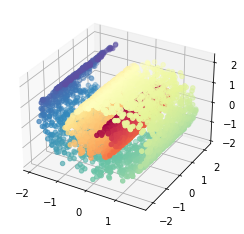

In [8]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter3D(x, y, z, c=t, cmap='Spectral')

In [9]:
# import umap.umap_ as umap
import umap
import numpy as np
from sklearn.neighbors import kneighbors_graph

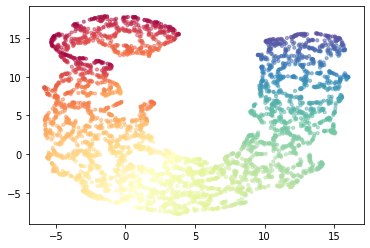

In [10]:
X = np.vstack([np.array(x),np.array(y),np.array(z)]).T
A_dist = kneighbors_graph(X, N_NEIGHBOURS, mode='distance', include_self=False)
embedding = umap.UMAP(n_components=2, n_neighbors= 10, min_dist= 0.3).fit_transform(X)
plt.scatter(*embedding.T, s=10, c=t, alpha=0.5, cmap='Spectral')

In [11]:
from umap.parametric_umap import ParametricUMAP
embedder = ParametricUMAP()
embedding = embedder.fit_transform(X)

/Users/sowonjeong/opt/anaconda3/envs/gnumap/lib/python3.10/site-packages/umap/parametric_umap.py:148: UserWarning: tensorflow_probability not installed or incompatible to current                 tensorflow installation. Setting global_correlation_loss_weight to zero.
  warn(
2022-11-25 22:58:18.761033: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/10
1159/1159 [==============================] - 9s 7ms/step - loss: 0.1229
Epoch 2/10
1159/1159 [==============================] - 8s 7ms/step - loss: 0.0902
Epoch 3/10
1159/1159 [==============================] - 8s 7ms/step - loss: 0.0813
Epoch 4/10
1159/1159 [==============================] - 12s 10ms/step - loss: 0.0748
Epoch 5/10
1159/1159 [==============================] - 13s 12ms/step - loss: 0.0684
Epoch 6/10
1159/1159 [==============================] - 11s 9ms/step - loss: 0.0651
Epoch 7/10
1159/1159 [==============================] - 16s 14ms/step - loss: 0.0647
Epoch 8/10
1159/1159 [==============================] - 11s 10ms/step - loss: 0.0644
Epoch 9/10
1159/1159 [==============================] - 9s 8ms/step - loss: 0.0643
Epoch 10/10
1159/1159 [==============================] - 8s 7ms/step - loss: 0.0641


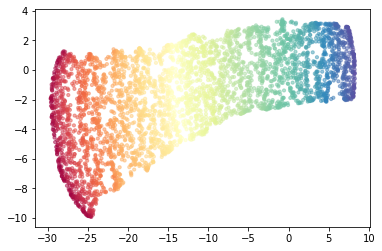

In [12]:
plt.scatter(*embedding.T, s=10, c=t, alpha=0.5, cmap='Spectral')

The number of neighbor regulates how much local information that you want to reflect on the embedding spcaces. The smaller the local n_neighbor, the more local your embedding is. 

In [13]:
from torch_geometric.datasets import Planetoid
dataset = Planetoid(root='Planetoid', name='Cora', transform=NormalizeFeatures())

In [14]:
cora = dataset[0]

In [15]:
from umap.parametric_umap import ParametricUMAP
embedder = ParametricUMAP()
embedding = embedder.fit_transform(cora.x)

/Users/sowonjeong/opt/anaconda3/envs/gnumap/lib/python3.10/site-packages/umap/parametric_umap.py:148: UserWarning: tensorflow_probability not installed or incompatible to current                 tensorflow installation. Setting global_correlation_loss_weight to zero.
  warn(


Epoch 1/10
979/979 [==============================] - 19s 18ms/step - loss: 0.5148
Epoch 2/10
979/979 [==============================] - 25s 26ms/step - loss: 0.3646
Epoch 3/10
979/979 [==============================] - 20s 21ms/step - loss: 0.3478
Epoch 4/10
979/979 [==============================] - 20s 20ms/step - loss: 0.3397
Epoch 5/10
979/979 [==============================] - 21s 21ms/step - loss: 0.3361
Epoch 6/10
979/979 [==============================] - 20s 21ms/step - loss: 0.3343
Epoch 7/10
979/979 [==============================] - 20s 21ms/step - loss: 0.3323
Epoch 8/10
979/979 [==============================] - 21s 21ms/step - loss: 0.3307
Epoch 9/10
979/979 [==============================] - 20s 20ms/step - loss: 0.3302
Epoch 10/10
979/979 [==============================] - 20s 21ms/step - loss: 0.3293


not so well for the "real" graph data

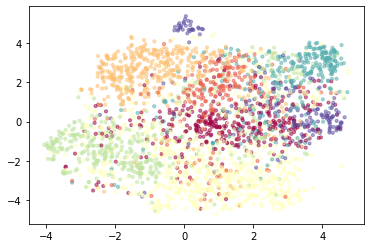

In [16]:
plt.scatter(*embedding.T, s=10, c=cora.y, alpha=0.5, cmap='Spectral')

## Draw reconstructed graph

<Figure size 432x288 with 0 Axes>

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_78180/367358442.py:4: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),


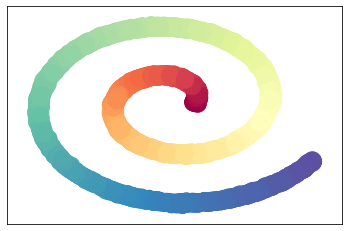

In [17]:
# A_dist = kneighbors_graph(X, 5, mode='distance', include_self=False)
### Very sensitive to wrong edges
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=t, cmap='Spectral', with_labels=False)
plt.show()

n_neighbors = 3 : small k puts more emphasis on the local structure

# Define GNUMAP model

In [18]:
from models.data_augmentation import *

(array([5322., 7218., 6456., 2986.,  988.,  368.,   96.,   28.,   18.,
           8.]),
 array([0.        , 0.55536628, 1.11073255, 1.66609883, 2.22146511,
        2.77683138, 3.33219766, 3.88756393, 4.44293021, 4.99829649,
        5.55366276]),
 <BarContainer object of 10 artists>)

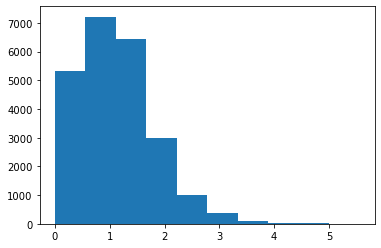

In [19]:
plt.hist(new_data.edge_weight.detach().numpy())

In [20]:
import numpy as np
from carbontracker.tracker import CarbonTracker
import cProfile
import os
import scipy
import torch
import torch.nn as nn
import torch_geometric
from torch_geometric.data import Data
from torch_geometric.utils import remove_self_loops, negative_sampling
from torch_geometric.utils import add_remaining_self_loops
from torch_geometric.utils import to_scipy_sparse_matrix, to_networkx, from_scipy_sparse_matrix
from torch_geometric.transforms import NormalizeFeatures
import time
from umap_functions import *
from graph_utils import *
from models.data_augmentation import *
import matplotlib.pyplot as plt
from models.baseline_models import *

In [21]:
def my_plot(epochs, loss):
    plt.plot(epochs, loss)
    
"""
Understanding Contrastive Representation Learning through
Alignment and Uniformity on the Hypersphere

source: https://arxiv.org/pdf/2005.10242.pdf

alignment and uniformity regularizations
"""

def uniform_loss(x, t=2):
    return torch.pdist(x,p=2).pow(2).mul(-t).exp().mean().log()
    # return torch.log(torch.mean(-t*(torch.pdist(x,p=2)**2)))
    # rewrite with torch command
def align_loss(x,y, theta = 2):
    return torch.norm(x-y, dim = 1).pow(theta).mean()


'\nUnderstanding Contrastive Representation Learning through\nAlignment and Uniformity on the Hypersphere\n\nsource: https://arxiv.org/pdf/2005.10242.pdf\n\nalignment and uniformity regularizations\n'

In [22]:
def train_gnumap(data, hid_dim, dim, n_layers=2, dropout_rate = 0.5, target=None,
                 model_type = 'GCN', must_propagate=None, norm = 'normalize',
                 patience=20, epochs=200, lr=1e-3, wd=1e-2,
                 min_dist=0.1, name_file="1", subsampling=None,
                 spread = 1.0, repulsion_strength=None,
                 device=None, verbose = False, normalized = True):


    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
   # EPS_0 = data.num_edges/ (data.num_nodes ** 2)
    _a, _b = find_ab_params(spread, min_dist) # spread , min_dist given as hyperparameter

    if torch_geometric.utils.is_undirected(data.edge_index):
        new_edge_index, new_edge_attr = data.edge_index, data.edge_weight
    else:
        new_edge_index, new_edge_attr = torch_geometric.utils.to_undirected(data.edge_index, data.edge_weight)

    
    #### Prune
    EPS = 1e-20 #math.exp(-1.0/(2*_b) * math.log(1.0/_a * (1.0/EPS_0 -1)))
    # print("Epsilon is " + str(EPS))
    print("Hyperparameters a = " + str(_a) + " and b = " + str(_b))

    if model_type == 'GNN':
        model = GNN(data.num_features, hid_dim, dim, n_layers=n_layers,
                    must_propagate=must_propagate, norm=norm)
    elif model_type == 'GCN':
        model = GCN(data.num_features, hid_dim, dim, n_layers = n_layers,dropout_rate = dropout_rate)
    elif model_type == 'MLP':
        model = MLP(data.num_features, hid_dim, dim)
    model = model.to(device)
    model.apply(init_weights)
    new_data = Data(x=data.x, edge_index=new_edge_index, # if feature drops the feature matrix should be updated
                    y=data.y, edge_weight=new_edge_attr,
                    transform = NormalizeFeatures)

    optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum = 0.9, weight_decay= wd)
    #optimizer = torch.optim.Adam(model.parameters(),lr = lr)
    new_data = new_data.to(device)
    sparsity =  new_data.num_edges/(new_data.num_nodes**2 -new_data.num_nodes)
    
    if repulsion_strength is None:
        repulsion_strength = 1.0/sparsity
        # we have way more samples that are "not" connected(sparsity), so need to give more weight to negative sampling to get balanced results
    row_pos, col_pos =  new_data.edge_index
    index = (row_pos != col_pos)
        # to exclude self-connectivity
    edge_weights_pos = new_data.edge_weight#[index]
    edge_weights_pos = torch.clip(edge_weights_pos, min=EPS, max = 1)

    if target is not None:
        edge_weights_pos = fast_intersection(row_pos[index], col_pos[index], edge_weights_pos,
                                             target, unknown_dist=1.0, far_dist=5.0)
        # p_{ij}
    if subsampling is None:
        row_neg, col_neg = negative_sampling(new_data.edge_index, num_neg_samples = 5 * new_data.edge_index.shape[1] )
        # negative_sample_rate: int (optional, default 5), the number of negative samples to select per positive sample
        index_neg = (row_neg != col_neg)
        edge_weights_neg = EPS * torch.ones(len(row_neg))
        if target is not None:
            edge_weights_neg = fast_intersection(row_neg[index_neg], col_neg[index_neg], edge_weights_neg,
                                                 target, unknown_dist=1.0, far_dist=5.0)
    best_t=0
    cnt_wait = 0
    best=1e9
    log_sigmoid = torch.nn.LogSigmoid()
    edges = [(e[0],e[1]) for _, e in enumerate(data.edge_index.numpy().T)]
    loss_vals = []
    CE = nn.BCELoss()
    for epoch in range(epochs):
        tic_epoch = time.time()
        model.train()
        optimizer.zero_grad()
        tic = time.time()
        out = model(new_data.x.float(), new_data.edge_index) # data.edge_index?
        if normalized is True:
            out = F.normalize(out) # add normalization**
        diff_norm = torch.sum(torch.square(out[row_pos[index]] - out[col_pos[index]]), 1)
        diff_norm = torch.clip(diff_norm, min=1e-3)
        log_q = - torch.log1p(_a *  diff_norm ** _b) # 1/(1+a*d^2b)
        loss_pos = -torch.mean(
             edge_weights_pos[index]*log_sigmoid(log_q)
            # + (1- edge_weights_pos[index])*(log_sigmoid(log_q)-log_q)*repulsion_strength
         )  

        if subsampling is None:
            diff_norm_neg = torch.sum(torch.square(out[row_neg[index_neg]] - out[col_neg[index_neg]]), 1) #+ 1e-3
            diff_norm_neg = torch.clip(diff_norm_neg, min=1e-3)
            log_q_neg = - torch.log1p(_a *  diff_norm_neg ** _b)
        else:
            row_neg, col_neg = negative_sampling(new_data.edge_index,
                                                 num_neg_samples=subsampling, force_undirected = True)
            index_neg = (row_neg != col_neg)
            edge_weights_neg = EPS * torch.ones(len(row_neg))
            if target is not None:
                edge_weights_neg = fast_intersection(row_neg[index_neg],
                                                     col_neg[index_neg], edge_weights_neg,
                                                     target, unknown_dist=1.0, far_dist=5.0)
            diff_norm_neg = torch.sum(torch.square(out[row_neg[index_neg]] - out[col_neg[index_neg]]), 1) #+ 1e-3
            diff_norm_neg = torch.clip(diff_norm_neg, min=1e-3)
            log_q_neg = - torch.log1p(_a *  diff_norm_neg ** _b)
        print("loss poss", loss_pos)
        loss_neg = - torch.mean((log_sigmoid(log_q_neg) - log_q_neg ) * repulsion_strength)
        print("loss neg", loss_neg)
        ### Add a term to make sure that the features are learned independently
        loss = loss_pos + loss_neg
        print("loss final", loss)
        tic =  time.time()
        loss.backward()
        optimizer.step()
        loss_vals.append(loss.detach().numpy())
        #torch.nn.utils.clip_grad_value_(model.parameters(), clip_value=4)



        if verbose is True:
            if epoch%10== 0:
                u = out.detach().numpy()
                plt.figure()
                plt.scatter(u[:,0], u[:,1], c = t,
                            cmap="Spectral")
                plt.show()
                print(torch.mm(out.T, out)/ new_data.num_nodes)

        for g in optimizer.param_groups:
            g['lr'] = lr * (1.0 - (float(epoch) / float(epochs)))

        print('Epoch={:03d}, loss={:.4f}, time={:.4f}'.format(epoch, loss.item(),time.time()-tic_epoch))
        if loss < best:
            best = loss
            best_t = epoch
            cnt_wait = 0
            torch.save(model.state_dict(), os.getcwd()  + '/results/best_gnumap_'
                                          + '_dim' + str(dim) + '_' + name_file +  '.pkl')
        else:
            cnt_wait += 1
        if cnt_wait == patience and epoch>50:
            print('Early stopping at epoch {}!'.format(epoch))
            break
        #print("Time epoch after saving", time.time()-tic_epoch)
    #tracker.stop()
    print('Loading {}th epoch'.format(best_t))
    model.load_state_dict(torch.load(os.getcwd()  + '/results/best_gnumap_' +
                                     '_dim' + str(dim) + '_' + name_file + '.pkl'))
    return(model,new_edge_index, loss_vals)

## Run simplest model

### GCN-layer 2

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7218, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7218, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.7218, time=0.0974
loss poss tensor(0.7167, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7167, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.7167, time=0.0365
loss poss tensor(0.7101, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7101, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.7101, time=0.0347
loss poss tensor(0.6849, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6849, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.6849, time=0.0414
loss poss tensor(0.6767, dtype=torch.float64, 

loss poss tensor(0.6300, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6300, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=0.6300, time=0.0443
loss poss tensor(0.6299, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6299, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=0.6299, time=0.0322
loss poss tensor(0.6299, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6299, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=0.6299, time=0.0310
loss poss tensor(0.6298, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6298, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=0.6298, time=0.0308
loss poss tensor(0.6297, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6287, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=083, loss=0.6287, time=0.0332
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6287, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=084, loss=0.6287, time=0.0328
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=085, loss=0.6286, time=0.0336
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=086, loss=0.6286, time=0.0311
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Epoch=123, loss=0.6284, time=0.0339
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=124, loss=0.6284, time=0.0383
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=125, loss=0.6284, time=0.0329
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=126, loss=0.6284, time=0.0317
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=127, loss=0.6284, time=0.0294
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=165, loss=0.6284, time=0.0357
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=166, loss=0.6284, time=0.0307
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=167, loss=0.6284, time=0.0306
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=168, loss=0.6284, time=0.0304
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=206, loss=0.6284, time=0.0347
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=207, loss=0.6284, time=0.0311
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=208, loss=0.6284, time=0.0295
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=209, loss=0.6284, time=0.0310
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7481, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(7.7118, grad_fn=<NegBackward0>)
loss final tensor(8.4599, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=8.4599, time=0.0318
loss poss tensor(0.6365, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.9220, grad_fn=<NegBackward0>)
loss final tensor(12.5584, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=12.5584, time=0.0343
loss poss tensor(0.6329, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.5494, grad_fn=<NegBackward0>)
loss final tensor(12.1823, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=12.1823, time=0.0337
loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.8074, grad_fn=<NegBackward0>)
loss final tensor(11.4411, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=11.4411, time=0.0305
loss poss tensor(0.6355, 

loss poss tensor(0.6514, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.1400, grad_fn=<NegBackward0>)
loss final tensor(6.7914, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=6.7914, time=0.0327
loss poss tensor(0.6515, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0394, grad_fn=<NegBackward0>)
loss final tensor(6.6909, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=6.6909, time=0.0322
loss poss tensor(0.6521, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.1129, grad_fn=<NegBackward0>)
loss final tensor(6.7650, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=6.7650, time=0.0294
loss poss tensor(0.6514, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0954, grad_fn=<NegBackward0>)
loss final tensor(6.7469, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=6.7469, time=0.0301
loss poss tensor(0.6522, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.1205, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.8076, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(14.1840, grad_fn=<NegBackward0>)
loss final tensor(14.9915, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=14.9915, time=0.0368
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(26.7627, grad_fn=<NegBackward0>)
loss final tensor(27.3920, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=27.3920, time=0.0290
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(26.2503, grad_fn=<NegBackward0>)
loss final tensor(26.8793, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=26.8793, time=0.0310
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.4739, grad_fn=<NegBackward0>)
loss final tensor(26.1031, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=26.1031, time=0.0348
loss poss tensor(0.629

loss poss tensor(0.6596, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.3041, grad_fn=<NegBackward0>)
loss final tensor(15.9637, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=15.9637, time=0.0338
loss poss tensor(0.6599, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.2778, grad_fn=<NegBackward0>)
loss final tensor(15.9378, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=15.9378, time=0.0306
loss poss tensor(0.6616, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.2368, grad_fn=<NegBackward0>)
loss final tensor(15.8984, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=15.8984, time=0.0327
loss poss tensor(0.6618, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.2906, grad_fn=<NegBackward0>)
loss final tensor(15.9524, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=15.9524, time=0.0314
loss poss tensor(0.6620, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15

loss poss tensor(0.6710, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(12.2229, grad_fn=<NegBackward0>)
loss final tensor(12.8939, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=073, loss=12.8939, time=0.0340
loss poss tensor(0.6687, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(12.0639, grad_fn=<NegBackward0>)
loss final tensor(12.7326, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=074, loss=12.7326, time=0.0316
loss poss tensor(0.6694, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(12.1626, grad_fn=<NegBackward0>)
loss final tensor(12.8320, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=12.8320, time=0.0288
loss poss tensor(0.6688, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(12.1108, grad_fn=<NegBackward0>)
loss final tensor(12.7796, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=12.7796, time=0.0305
loss poss tensor(0.6724, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(12

Epoch=110, loss=12.8021, time=0.0341
loss poss tensor(0.6678, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(12.0482, grad_fn=<NegBackward0>)
loss final tensor(12.7160, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=111, loss=12.7160, time=0.0301
loss poss tensor(0.6679, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(12.1912, grad_fn=<NegBackward0>)
loss final tensor(12.8592, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=112, loss=12.8592, time=0.0335
loss poss tensor(0.6690, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(12.1128, grad_fn=<NegBackward0>)
loss final tensor(12.7818, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=12.7818, time=0.0304
loss poss tensor(0.6715, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.9962, grad_fn=<NegBackward0>)
loss final tensor(12.6677, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=12.6677, time=0.0322
loss poss tensor(0.6704, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7101, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(24.2167, grad_fn=<NegBackward0>)
loss final tensor(24.9268, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=24.9268, time=0.0333
loss poss tensor(0.6306, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(36.5775, grad_fn=<NegBackward0>)
loss final tensor(37.2080, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=37.2080, time=0.0324
loss poss tensor(0.6309, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(35.4019, grad_fn=<NegBackward0>)
loss final tensor(36.0328, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=36.0328, time=0.0375
loss poss tensor(0.6319, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(33.6355, grad_fn=<NegBackward0>)
loss final tensor(34.2675, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=34.2675, time=0.0432
loss poss tensor(0.633

Epoch=037, loss=20.9503, time=0.0377
loss poss tensor(0.6713, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(20.0731, grad_fn=<NegBackward0>)
loss final tensor(20.7444, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=20.7444, time=0.0349
loss poss tensor(0.6701, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(19.8349, grad_fn=<NegBackward0>)
loss final tensor(20.5051, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=20.5051, time=0.0311
loss poss tensor(0.6721, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(19.4751, grad_fn=<NegBackward0>)
loss final tensor(20.1472, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=20.1472, time=0.0337
loss poss tensor(0.6720, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(19.2492, grad_fn=<NegBackward0>)
loss final tensor(19.9212, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=19.9212, time=0.0391
loss poss tensor(0.6724, dtype=torch.float64, grad_

Epoch=075, loss=18.7279, time=0.0359
loss poss tensor(0.6685, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(18.0689, grad_fn=<NegBackward0>)
loss final tensor(18.7375, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=18.7375, time=0.0330
loss poss tensor(0.6728, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(18.2985, grad_fn=<NegBackward0>)
loss final tensor(18.9713, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=18.9713, time=0.0310
loss poss tensor(0.6732, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(18.1324, grad_fn=<NegBackward0>)
loss final tensor(18.8056, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=18.8056, time=0.0347
loss poss tensor(0.6708, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(18.1092, grad_fn=<NegBackward0>)
loss final tensor(18.7800, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=18.7800, time=0.0302
loss poss tensor(0.6727, dtype=torch.float64, grad_

loss poss tensor(0.6710, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(18.2465, grad_fn=<NegBackward0>)
loss final tensor(18.9174, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=112, loss=18.9174, time=0.0311
loss poss tensor(0.6708, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(18.0461, grad_fn=<NegBackward0>)
loss final tensor(18.7170, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=18.7170, time=0.0313
loss poss tensor(0.6741, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(18.1209, grad_fn=<NegBackward0>)
loss final tensor(18.7950, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=18.7950, time=0.0523
loss poss tensor(0.6712, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(18.1800, grad_fn=<NegBackward0>)
loss final tensor(18.8511, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=18.8511, time=0.0406
loss poss tensor(0.6723, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(18

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7490, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(26.4809, grad_fn=<NegBackward0>)
loss final tensor(27.2299, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=27.2299, time=0.0337
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(53.9241, grad_fn=<NegBackward0>)
loss final tensor(54.5527, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=54.5527, time=0.0281
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(53.2657, grad_fn=<NegBackward0>)
loss final tensor(53.8945, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=53.8945, time=0.0281
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(52.3529, grad_fn=<NegBackward0>)
loss final tensor(52.9820, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=52.9820, time=0.0291
loss poss tensor(0.629

Epoch=035, loss=29.3588, time=0.0300
loss poss tensor(0.6854, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(28.3322, grad_fn=<NegBackward0>)
loss final tensor(29.0175, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=036, loss=29.0175, time=0.0285
loss poss tensor(0.6815, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(28.0751, grad_fn=<NegBackward0>)
loss final tensor(28.7566, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=28.7566, time=0.0299
loss poss tensor(0.6840, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(27.6686, grad_fn=<NegBackward0>)
loss final tensor(28.3527, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=28.3527, time=0.0274
loss poss tensor(0.6871, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(27.8919, grad_fn=<NegBackward0>)
loss final tensor(28.5791, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=28.5791, time=0.0266
loss poss tensor(0.6853, dtype=torch.float64, grad_

loss poss tensor(0.6715, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(24.2051, grad_fn=<NegBackward0>)
loss final tensor(24.8765, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=072, loss=24.8765, time=0.0304
loss poss tensor(0.6718, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(24.0986, grad_fn=<NegBackward0>)
loss final tensor(24.7704, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=073, loss=24.7704, time=0.0284
loss poss tensor(0.6750, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(24.1576, grad_fn=<NegBackward0>)
loss final tensor(24.8326, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=074, loss=24.8326, time=0.0312
loss poss tensor(0.6736, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(24.1354, grad_fn=<NegBackward0>)
loss final tensor(24.8090, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=24.8090, time=0.0275
loss poss tensor(0.6737, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(23

loss poss tensor(0.6738, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(24.1679, grad_fn=<NegBackward0>)
loss final tensor(24.8417, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=108, loss=24.8417, time=0.0377
loss poss tensor(0.6723, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(24.2775, grad_fn=<NegBackward0>)
loss final tensor(24.9498, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=109, loss=24.9498, time=0.0418
loss poss tensor(0.6751, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(24.1014, grad_fn=<NegBackward0>)
loss final tensor(24.7765, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=110, loss=24.7765, time=0.0403
Early stopping at epoch 110!
Loading 90th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7504, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.9448, grad_fn=<NegBackward0>)
loss final tensor(31.6952, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=31.6952, time=0.0284
loss poss tensor(0.6302, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(67.2430, grad_fn=<NegBackward0>)
loss final tensor(67.8732, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=67.8732, time=0.0260
loss poss tensor(0.6304, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(62.4318, grad_fn=<NegBackward0>)
loss final tensor(63.0622, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=63.0622, time=0.0273
loss poss tensor(0.6336, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.8088, grad_fn=<NegBackward0>)
loss final tensor(52.4424, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=52.4424, time=0.0295
loss poss tensor(0.638

Epoch=035, loss=31.4481, time=0.0316
loss poss tensor(0.6528, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(31.0584, grad_fn=<NegBackward0>)
loss final tensor(31.7112, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=036, loss=31.7112, time=0.0332
loss poss tensor(0.6571, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.7614, grad_fn=<NegBackward0>)
loss final tensor(31.4185, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=31.4185, time=0.0294
loss poss tensor(0.6549, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.8972, grad_fn=<NegBackward0>)
loss final tensor(31.5521, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=31.5521, time=0.0275
loss poss tensor(0.6550, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.8055, grad_fn=<NegBackward0>)
loss final tensor(31.4605, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=31.4605, time=0.0326
loss poss tensor(0.6545, dtype=torch.float64, grad_

Epoch=073, loss=30.8769, time=0.0378
loss poss tensor(0.6592, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.4032, grad_fn=<NegBackward0>)
loss final tensor(31.0623, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=074, loss=31.0623, time=0.0361
loss poss tensor(0.6589, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.0057, grad_fn=<NegBackward0>)
loss final tensor(30.6647, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=30.6647, time=0.0365
loss poss tensor(0.6588, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.0061, grad_fn=<NegBackward0>)
loss final tensor(30.6649, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=30.6649, time=0.0375
loss poss tensor(0.6590, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.3045, grad_fn=<NegBackward0>)
loss final tensor(30.9634, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=30.9634, time=0.0335
loss poss tensor(0.6611, dtype=torch.float64, grad_

Epoch=113, loss=30.8407, time=0.0304
loss poss tensor(0.6613, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1736, grad_fn=<NegBackward0>)
loss final tensor(30.8349, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=30.8349, time=0.0305
loss poss tensor(0.6598, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.3370, grad_fn=<NegBackward0>)
loss final tensor(30.9969, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=30.9969, time=0.0270
loss poss tensor(0.6616, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1572, grad_fn=<NegBackward0>)
loss final tensor(30.8188, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=116, loss=30.8188, time=0.0297
loss poss tensor(0.6630, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1971, grad_fn=<NegBackward0>)
loss final tensor(30.8601, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=117, loss=30.8601, time=0.0324
loss poss tensor(0.6583, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7088, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(92.3416, grad_fn=<NegBackward0>)
loss final tensor(93.0504, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=93.0504, time=0.0345
loss poss tensor(0.6298, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(124.6315, grad_fn=<NegBackward0>)
loss final tensor(125.2614, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=125.2614, time=0.0292
loss poss tensor(0.6307, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(120.5707, grad_fn=<NegBackward0>)
loss final tensor(121.2014, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=121.2014, time=0.0303
loss poss tensor(0.6314, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(116.6202, grad_fn=<NegBackward0>)
loss final tensor(117.2516, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=117.2516, time=0.0276
loss poss ten

loss poss tensor(0.6521, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(78.2919, grad_fn=<NegBackward0>)
loss final tensor(78.9440, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=78.9440, time=0.0447
loss poss tensor(0.6530, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(77.4860, grad_fn=<NegBackward0>)
loss final tensor(78.1390, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=78.1390, time=0.0420
loss poss tensor(0.6522, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(78.0149, grad_fn=<NegBackward0>)
loss final tensor(78.6671, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=78.6671, time=0.0441
loss poss tensor(0.6537, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(78.3988, grad_fn=<NegBackward0>)
loss final tensor(79.0525, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=79.0525, time=0.0431
loss poss tensor(0.6540, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(77

loss poss tensor(0.6762, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(72.1637, grad_fn=<NegBackward0>)
loss final tensor(72.8399, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=074, loss=72.8399, time=0.0329
loss poss tensor(0.6713, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(72.5272, grad_fn=<NegBackward0>)
loss final tensor(73.1985, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=73.1985, time=0.0280
loss poss tensor(0.6747, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(72.6601, grad_fn=<NegBackward0>)
loss final tensor(73.3348, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=73.3348, time=0.0297
loss poss tensor(0.6788, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(71.4056, grad_fn=<NegBackward0>)
loss final tensor(72.0844, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=72.0844, time=0.0284
loss poss tensor(0.6780, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(71

Epoch=111, loss=61.0426, time=0.0308
loss poss tensor(0.6852, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(60.1871, grad_fn=<NegBackward0>)
loss final tensor(60.8722, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=112, loss=60.8722, time=0.0324
loss poss tensor(0.6799, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(59.7226, grad_fn=<NegBackward0>)
loss final tensor(60.4025, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=60.4025, time=0.0281
loss poss tensor(0.6810, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(60.1029, grad_fn=<NegBackward0>)
loss final tensor(60.7839, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=60.7839, time=0.0279
loss poss tensor(0.6779, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(60.1074, grad_fn=<NegBackward0>)
loss final tensor(60.7852, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=60.7852, time=0.0312
loss poss tensor(0.6821, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7088, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(134.8267, grad_fn=<NegBackward0>)
loss final tensor(135.5355, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=135.5355, time=0.0518
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(276.5078, grad_fn=<NegBackward0>)
loss final tensor(277.1362, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=277.1362, time=0.0379
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(276.5501, grad_fn=<NegBackward0>)
loss final tensor(277.1785, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=277.1785, time=0.0369
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(276.5291, grad_fn=<NegBackward0>)
loss final tensor(277.1575, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=277.1575, time=0.0294
loss poss 

Epoch=035, loss=258.3836, time=0.0444
loss poss tensor(0.6303, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(255.6059, grad_fn=<NegBackward0>)
loss final tensor(256.2361, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=036, loss=256.2361, time=0.0501
loss poss tensor(0.6306, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(251.9731, grad_fn=<NegBackward0>)
loss final tensor(252.6038, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=252.6038, time=0.0405
loss poss tensor(0.6311, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(249.2256, grad_fn=<NegBackward0>)
loss final tensor(249.8566, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=249.8566, time=0.0409
loss poss tensor(0.6316, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(244.9258, grad_fn=<NegBackward0>)
loss final tensor(245.5574, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=245.5574, time=0.0389
loss poss tensor(0.6323, dtype=torch.f

loss poss tensor(0.6730, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(155.5392, grad_fn=<NegBackward0>)
loss final tensor(156.2123, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=072, loss=156.2123, time=0.0311
loss poss tensor(0.6725, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(156.9331, grad_fn=<NegBackward0>)
loss final tensor(157.6056, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=073, loss=157.6056, time=0.0273
loss poss tensor(0.6710, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(156.8348, grad_fn=<NegBackward0>)
loss final tensor(157.5058, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=074, loss=157.5058, time=0.0300
loss poss tensor(0.6739, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(156.6177, grad_fn=<NegBackward0>)
loss final tensor(157.2916, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=157.2916, time=0.0276
loss poss tensor(0.6725, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.6911, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(148.2406, grad_fn=<NegBackward0>)
loss final tensor(148.9317, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=109, loss=148.9317, time=0.0312
loss poss tensor(0.6930, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(148.2146, grad_fn=<NegBackward0>)
loss final tensor(148.9076, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=110, loss=148.9076, time=0.0284
loss poss tensor(0.6899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(149.2963, grad_fn=<NegBackward0>)
loss final tensor(149.9862, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=111, loss=149.9862, time=0.0324
loss poss tensor(0.6953, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(148.0199, grad_fn=<NegBackward0>)
loss final tensor(148.7152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=112, loss=148.7152, time=0.0290
loss poss tensor(0.6932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.7015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(121.4967, grad_fn=<NegBackward0>)
loss final tensor(122.1982, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=146, loss=122.1982, time=0.0314
loss poss tensor(0.6979, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(121.5918, grad_fn=<NegBackward0>)
loss final tensor(122.2897, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=147, loss=122.2897, time=0.0266
loss poss tensor(0.7067, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(122.7015, grad_fn=<NegBackward0>)
loss final tensor(123.4082, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=148, loss=123.4082, time=0.0280
loss poss tensor(0.6980, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(121.1723, grad_fn=<NegBackward0>)
loss final tensor(121.8703, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=149, loss=121.8703, time=0.0303
loss poss tensor(0.7040, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6693, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(439.9249, grad_fn=<NegBackward0>)
loss final tensor(440.5942, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=440.5942, time=0.0358
loss poss tensor(0.6299, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(611.4987, grad_fn=<NegBackward0>)
loss final tensor(612.1286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=612.1286, time=0.0274
loss poss tensor(0.6303, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(597.0990, grad_fn=<NegBackward0>)
loss final tensor(597.7293, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=597.7293, time=0.0295
loss poss tensor(0.6306, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(587.8834, grad_fn=<NegBackward0>)
loss final tensor(588.5140, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=588.5140, time=0.0275
loss poss 

Epoch=035, loss=462.3407, time=0.0345
loss poss tensor(0.6398, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(456.7230, grad_fn=<NegBackward0>)
loss final tensor(457.3629, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=036, loss=457.3629, time=0.0344
loss poss tensor(0.6400, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(453.8221, grad_fn=<NegBackward0>)
loss final tensor(454.4622, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=454.4622, time=0.0311
loss poss tensor(0.6401, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(449.5378, grad_fn=<NegBackward0>)
loss final tensor(450.1779, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=450.1779, time=0.0335
loss poss tensor(0.6402, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(449.7035, grad_fn=<NegBackward0>)
loss final tensor(450.3437, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=450.3437, time=0.0294
loss poss tensor(0.6410, dtype=torch.f

loss poss tensor(0.6649, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(387.5985, grad_fn=<NegBackward0>)
loss final tensor(388.2634, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=073, loss=388.2634, time=0.0363
loss poss tensor(0.6640, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(389.5474, grad_fn=<NegBackward0>)
loss final tensor(390.2114, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=074, loss=390.2114, time=0.0420
loss poss tensor(0.6688, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(387.7560, grad_fn=<NegBackward0>)
loss final tensor(388.4248, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=388.4248, time=0.0375
loss poss tensor(0.6698, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(384.8722, grad_fn=<NegBackward0>)
loss final tensor(385.5420, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=385.5420, time=0.0448
loss poss tensor(0.6720, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Epoch=110, loss=314.9968, time=0.0402
loss poss tensor(0.6918, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(315.1167, grad_fn=<NegBackward0>)
loss final tensor(315.8085, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=111, loss=315.8085, time=0.0378
loss poss tensor(0.6884, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(312.4832, grad_fn=<NegBackward0>)
loss final tensor(313.1716, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=112, loss=313.1716, time=0.0347
loss poss tensor(0.6932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(311.1897, grad_fn=<NegBackward0>)
loss final tensor(311.8828, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=311.8828, time=0.0382
loss poss tensor(0.6905, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(308.3986, grad_fn=<NegBackward0>)
loss final tensor(309.0891, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=309.0891, time=0.0398
loss poss tensor(0.6867, dtype=torch.f

loss poss tensor(0.6880, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(303.9738, grad_fn=<NegBackward0>)
loss final tensor(304.6617, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=149, loss=304.6617, time=0.0289
loss poss tensor(0.6819, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(301.3597, grad_fn=<NegBackward0>)
loss final tensor(302.0416, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=150, loss=302.0416, time=0.0292
loss poss tensor(0.6849, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(301.9121, grad_fn=<NegBackward0>)
loss final tensor(302.5970, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=151, loss=302.5970, time=0.0350
Early stopping at epoch 151!
Loading 131th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(658.2817, grad_fn=<NegBackward0>)
loss final tensor(659.0155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=659.0155, time=0.0349
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1336.1147, grad_fn=<NegBackward0>)
loss final tensor(1336.7434, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1336.7434, time=0.0342
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1332.1307, grad_fn=<NegBackward0>)
loss final tensor(1332.7595, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1332.7595, time=0.0415
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1326.8685, grad_fn=<NegBackward0>)
loss final tensor(1327.4974, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1327.4974, time=0.0389
l

Epoch=036, loss=1185.4134, time=0.0290
loss poss tensor(0.6306, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1178.9475, grad_fn=<NegBackward0>)
loss final tensor(1179.5781, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=1179.5781, time=0.0293
loss poss tensor(0.6306, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1171.1567, grad_fn=<NegBackward0>)
loss final tensor(1171.7873, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=1171.7873, time=0.0343
loss poss tensor(0.6308, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1168.5521, grad_fn=<NegBackward0>)
loss final tensor(1169.1829, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=1169.1829, time=0.0366
loss poss tensor(0.6307, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1161.5286, grad_fn=<NegBackward0>)
loss final tensor(1162.1593, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1162.1593, time=0.0310
loss poss tensor(0.6310, 

Epoch=072, loss=959.7809, time=0.0366
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(950.7426, grad_fn=<NegBackward0>)
loss final tensor(951.3781, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=073, loss=951.3781, time=0.0315
loss poss tensor(0.6360, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(947.0549, grad_fn=<NegBackward0>)
loss final tensor(947.6910, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=074, loss=947.6910, time=0.0427
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(941.6642, grad_fn=<NegBackward0>)
loss final tensor(942.3001, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=942.3001, time=0.0412
loss poss tensor(0.6365, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(934.1466, grad_fn=<NegBackward0>)
loss final tensor(934.7832, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=934.7832, time=0.0312
loss poss tensor(0.6362, dtype=torch.f

loss poss tensor(0.6486, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(795.6041, grad_fn=<NegBackward0>)
loss final tensor(796.2527, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=112, loss=796.2527, time=0.0302
loss poss tensor(0.6476, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(797.6528, grad_fn=<NegBackward0>)
loss final tensor(798.3004, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=798.3004, time=0.0340
loss poss tensor(0.6500, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(786.7188, grad_fn=<NegBackward0>)
loss final tensor(787.3687, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=787.3687, time=0.0359
loss poss tensor(0.6494, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(795.3835, grad_fn=<NegBackward0>)
loss final tensor(796.0329, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=796.0329, time=0.0282
loss poss tensor(0.6499, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.6677, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(741.8416, grad_fn=<NegBackward0>)
loss final tensor(742.5093, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=148, loss=742.5093, time=0.0296
loss poss tensor(0.6677, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(726.6703, grad_fn=<NegBackward0>)
loss final tensor(727.3380, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=149, loss=727.3380, time=0.0323
loss poss tensor(0.6650, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(734.6365, grad_fn=<NegBackward0>)
loss final tensor(735.3015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=150, loss=735.3015, time=0.0274
loss poss tensor(0.6655, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(722.3425, grad_fn=<NegBackward0>)
loss final tensor(723.0080, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=151, loss=723.0080, time=0.0287
loss poss tensor(0.6635, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.6796, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(604.9042, grad_fn=<NegBackward0>)
loss final tensor(605.5838, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=184, loss=605.5838, time=0.0348
loss poss tensor(0.6786, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(606.0841, grad_fn=<NegBackward0>)
loss final tensor(606.7627, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=185, loss=606.7627, time=0.0292
loss poss tensor(0.6776, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(602.9684, grad_fn=<NegBackward0>)
loss final tensor(603.6461, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=186, loss=603.6461, time=0.0282
loss poss tensor(0.6779, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(603.8296, grad_fn=<NegBackward0>)
loss final tensor(604.5075, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=187, loss=604.5075, time=0.0267
loss poss tensor(0.6773, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

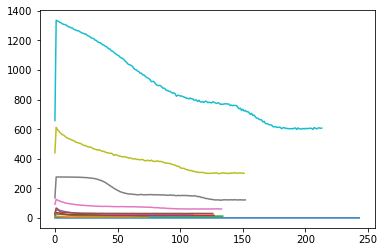

In [23]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=2, target=None,
                                     model_type = 'GCN', patience=20, epochs=500, lr=1e-1, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=new_data.edge_index.shape[1],
                                     spread = 1.0, repulsion_strength=repulsion_strength[i]*20,
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

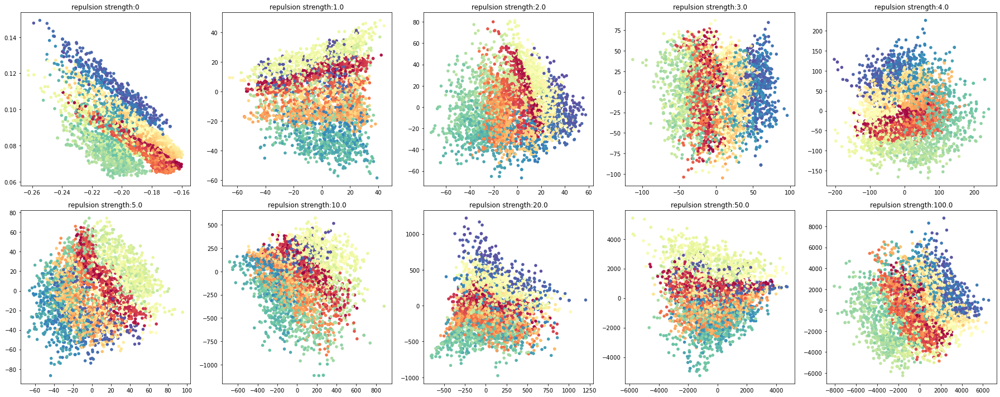

In [24]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

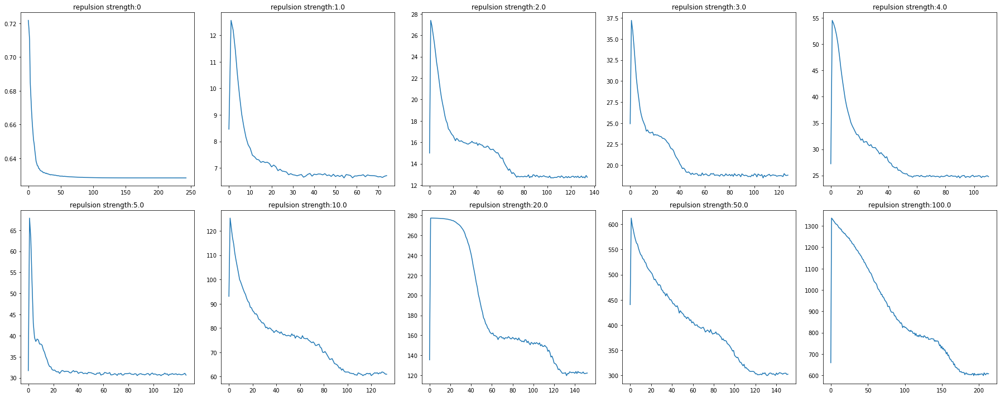

In [25]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7796, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7796, grad_fn=<AddBackward0>)
Epoch=000, loss=0.7796, time=0.0419
loss poss tensor(0.7611, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7611, grad_fn=<AddBackward0>)
Epoch=001, loss=0.7611, time=0.0375
loss poss tensor(0.7462, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7462, grad_fn=<AddBackward0>)
Epoch=002, loss=0.7462, time=0.0600
loss poss tensor(0.7333, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7333, grad_fn=<AddBackward0>)
Epoch=003, loss=0.7333, time=0.0472
loss poss tensor(0.7209, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7209, grad_fn=<AddBackward0>)
Epoch=004, loss=0.7209, time=0.0439
loss poss tensor(0.7151, grad_fn=<

Epoch=047, loss=0.6958, time=0.0563
loss poss tensor(0.6957, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6957, grad_fn=<AddBackward0>)
Epoch=048, loss=0.6957, time=0.0611
loss poss tensor(0.6957, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6957, grad_fn=<AddBackward0>)
Epoch=049, loss=0.6957, time=0.0567
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6956, grad_fn=<AddBackward0>)
Epoch=050, loss=0.6956, time=0.0499
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6956, grad_fn=<AddBackward0>)
Epoch=051, loss=0.6956, time=0.0434
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6955, grad_fn=<AddBackward0>)
Epoch=052, loss=0.6955, time=0.0410
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor

Epoch=096, loss=0.6949, time=0.0698
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6949, grad_fn=<AddBackward0>)
Epoch=097, loss=0.6949, time=0.0408
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6949, grad_fn=<AddBackward0>)
Epoch=098, loss=0.6949, time=0.0380
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6949, grad_fn=<AddBackward0>)
Epoch=099, loss=0.6949, time=0.0372
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6949, grad_fn=<AddBackward0>)
Epoch=100, loss=0.6949, time=0.0561
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6949, grad_fn=<AddBackward0>)
Epoch=101, loss=0.6949, time=0.0516
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor

loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=147, loss=0.6948, time=0.0416
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=148, loss=0.6948, time=0.0361
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=149, loss=0.6948, time=0.0364
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=150, loss=0.6948, time=0.0378
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=151, loss=0.6948, time=0.0396
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=194, loss=0.6948, time=0.0398
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=195, loss=0.6948, time=0.0344
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=196, loss=0.6948, time=0.0407
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=197, loss=0.6948, time=0.0360
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=198, loss=0.6948, time=0.0364
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

Epoch=240, loss=0.6948, time=0.0456
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=241, loss=0.6948, time=0.0462
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=242, loss=0.6948, time=0.0383
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=243, loss=0.6948, time=0.0351
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=244, loss=0.6948, time=0.0377
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=245, loss=0.6948, time=0.0425
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.8219, grad_fn=<NegBackward0>)
loss neg tensor(0.4224, grad_fn=<NegBackward0>)
loss final tensor(1.2443, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2443, time=0.0695
loss poss tensor(0.8208, grad_fn=<NegBackward0>)
loss neg tensor(0.3691, grad_fn=<NegBackward0>)
loss final tensor(1.1899, grad_fn=<AddBackward0>)
Epoch=001, loss=1.1899, time=0.0854
loss poss tensor(0.8220, grad_fn=<NegBackward0>)
loss neg tensor(0.3205, grad_fn=<NegBackward0>)
loss final tensor(1.1425, grad_fn=<AddBackward0>)
Epoch=002, loss=1.1425, time=0.0376
loss poss tensor(0.7903, grad_fn=<NegBackward0>)
loss neg tensor(0.3119, grad_fn=<NegBackward0>)
loss final tensor(1.1022, grad_fn=<AddBackward0>)
Epoch=003, loss=1.1022, time=0.0510
loss poss tensor(0.7713, grad_fn=<NegBackward0>)
loss neg tensor(0.3186, grad_fn=<NegBackward0>)
loss final tensor(1.0899, grad_fn=<AddBackward0>)
Epoch=004, loss=1.0899, time=0.0424
loss poss tensor(0.

loss poss tensor(0.7099, grad_fn=<NegBackward0>)
loss neg tensor(0.3030, grad_fn=<NegBackward0>)
loss final tensor(1.0129, grad_fn=<AddBackward0>)
Epoch=046, loss=1.0129, time=0.0514
loss poss tensor(0.7096, grad_fn=<NegBackward0>)
loss neg tensor(0.3030, grad_fn=<NegBackward0>)
loss final tensor(1.0127, grad_fn=<AddBackward0>)
Epoch=047, loss=1.0127, time=0.0390
loss poss tensor(0.7103, grad_fn=<NegBackward0>)
loss neg tensor(0.3029, grad_fn=<NegBackward0>)
loss final tensor(1.0132, grad_fn=<AddBackward0>)
Epoch=048, loss=1.0132, time=0.0551
loss poss tensor(0.7101, grad_fn=<NegBackward0>)
loss neg tensor(0.3032, grad_fn=<NegBackward0>)
loss final tensor(1.0132, grad_fn=<AddBackward0>)
Epoch=049, loss=1.0132, time=0.0586
loss poss tensor(0.7102, grad_fn=<NegBackward0>)
loss neg tensor(0.3032, grad_fn=<NegBackward0>)
loss final tensor(1.0134, grad_fn=<AddBackward0>)
Epoch=050, loss=1.0134, time=0.0419
loss poss tensor(0.7089, grad_fn=<NegBackward0>)
loss neg tensor(0.3032, grad_fn=<Neg

loss poss tensor(0.7064, grad_fn=<NegBackward0>)
loss neg tensor(0.3023, grad_fn=<NegBackward0>)
loss final tensor(1.0087, grad_fn=<AddBackward0>)
Epoch=094, loss=1.0087, time=0.0425
loss poss tensor(0.7066, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0090, grad_fn=<AddBackward0>)
Epoch=095, loss=1.0090, time=0.0372
loss poss tensor(0.7060, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0084, grad_fn=<AddBackward0>)
Epoch=096, loss=1.0084, time=0.0368
loss poss tensor(0.7065, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0089, grad_fn=<AddBackward0>)
Epoch=097, loss=1.0089, time=0.0396
loss poss tensor(0.7065, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0090, grad_fn=<AddBackward0>)
Epoch=098, loss=1.0090, time=0.0393
loss poss tensor(0.7065, grad_fn=<NegBackward0>)
loss neg tensor(0.3022, grad_fn=<Neg

loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(0.3021, grad_fn=<NegBackward0>)
loss final tensor(1.0076, grad_fn=<AddBackward0>)
Epoch=142, loss=1.0076, time=0.0467
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(0.3022, grad_fn=<NegBackward0>)
loss final tensor(1.0071, grad_fn=<AddBackward0>)
Epoch=143, loss=1.0071, time=0.0441
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0079, grad_fn=<AddBackward0>)
Epoch=144, loss=1.0079, time=0.0467
loss poss tensor(0.7057, grad_fn=<NegBackward0>)
loss neg tensor(0.3022, grad_fn=<NegBackward0>)
loss final tensor(1.0078, grad_fn=<AddBackward0>)
Epoch=145, loss=1.0078, time=0.0467
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(0.3023, grad_fn=<NegBackward0>)
loss final tensor(1.0074, grad_fn=<AddBackward0>)
Epoch=146, loss=1.0074, time=0.1221
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(0.3022, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7643, grad_fn=<NegBackward0>)
loss neg tensor(0.7188, grad_fn=<NegBackward0>)
loss final tensor(1.4832, grad_fn=<AddBackward0>)
Epoch=000, loss=1.4832, time=0.0395
loss poss tensor(0.7699, grad_fn=<NegBackward0>)
loss neg tensor(0.6561, grad_fn=<NegBackward0>)
loss final tensor(1.4260, grad_fn=<AddBackward0>)
Epoch=001, loss=1.4260, time=0.0369
loss poss tensor(0.7732, grad_fn=<NegBackward0>)
loss neg tensor(0.6105, grad_fn=<NegBackward0>)
loss final tensor(1.3837, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3837, time=0.0397
loss poss tensor(0.7681, grad_fn=<NegBackward0>)
loss neg tensor(0.6097, grad_fn=<NegBackward0>)
loss final tensor(1.3778, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3778, time=0.0373
loss poss tensor(0.7526, grad_fn=<NegBackward0>)
loss neg tensor(0.6322, grad_fn=<NegBackward0>)
loss final tensor(1.3848, grad_fn=<AddBackward0>)
Epoch=004, loss=1.3848, time=0.0426
loss poss tensor(0.

Epoch=044, loss=1.3154, time=0.0393
loss poss tensor(0.7094, grad_fn=<NegBackward0>)
loss neg tensor(0.6048, grad_fn=<NegBackward0>)
loss final tensor(1.3142, grad_fn=<AddBackward0>)
Epoch=045, loss=1.3142, time=0.0378
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(0.6049, grad_fn=<NegBackward0>)
loss final tensor(1.3143, grad_fn=<AddBackward0>)
Epoch=046, loss=1.3143, time=0.0371
loss poss tensor(0.7103, grad_fn=<NegBackward0>)
loss neg tensor(0.6054, grad_fn=<NegBackward0>)
loss final tensor(1.3156, grad_fn=<AddBackward0>)
Epoch=047, loss=1.3156, time=0.0417
loss poss tensor(0.7097, grad_fn=<NegBackward0>)
loss neg tensor(0.6050, grad_fn=<NegBackward0>)
loss final tensor(1.3146, grad_fn=<AddBackward0>)
Epoch=048, loss=1.3146, time=0.0368
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(0.6049, grad_fn=<NegBackward0>)
loss final tensor(1.3144, grad_fn=<AddBackward0>)
Epoch=049, loss=1.3144, time=0.0366
loss poss tensor(0.7090, grad_fn=<NegBackward0>)


Epoch=089, loss=1.3117, time=0.0394
loss poss tensor(0.7067, grad_fn=<NegBackward0>)
loss neg tensor(0.6042, grad_fn=<NegBackward0>)
loss final tensor(1.3109, grad_fn=<AddBackward0>)
Epoch=090, loss=1.3109, time=0.0402
loss poss tensor(0.7069, grad_fn=<NegBackward0>)
loss neg tensor(0.6041, grad_fn=<NegBackward0>)
loss final tensor(1.3110, grad_fn=<AddBackward0>)
Epoch=091, loss=1.3110, time=0.0364
loss poss tensor(0.7069, grad_fn=<NegBackward0>)
loss neg tensor(0.6042, grad_fn=<NegBackward0>)
loss final tensor(1.3111, grad_fn=<AddBackward0>)
Epoch=092, loss=1.3111, time=0.0398
loss poss tensor(0.7067, grad_fn=<NegBackward0>)
loss neg tensor(0.6043, grad_fn=<NegBackward0>)
loss final tensor(1.3110, grad_fn=<AddBackward0>)
Epoch=093, loss=1.3110, time=0.0376
loss poss tensor(0.7068, grad_fn=<NegBackward0>)
loss neg tensor(0.6044, grad_fn=<NegBackward0>)
loss final tensor(1.3112, grad_fn=<AddBackward0>)
Epoch=094, loss=1.3112, time=0.0335
loss poss tensor(0.7065, grad_fn=<NegBackward0>)


Epoch=136, loss=1.3125, time=0.0497
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(0.6048, grad_fn=<NegBackward0>)
loss final tensor(1.3104, grad_fn=<AddBackward0>)
Epoch=137, loss=1.3104, time=0.0354
loss poss tensor(0.7061, grad_fn=<NegBackward0>)
loss neg tensor(0.6084, grad_fn=<NegBackward0>)
loss final tensor(1.3145, grad_fn=<AddBackward0>)
Epoch=138, loss=1.3145, time=0.0352
loss poss tensor(0.7058, grad_fn=<NegBackward0>)
loss neg tensor(0.6045, grad_fn=<NegBackward0>)
loss final tensor(1.3103, grad_fn=<AddBackward0>)
Epoch=139, loss=1.3103, time=0.0374
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(0.6055, grad_fn=<NegBackward0>)
loss final tensor(1.3110, grad_fn=<AddBackward0>)
Epoch=140, loss=1.3110, time=0.0354
loss poss tensor(0.7066, grad_fn=<NegBackward0>)
loss neg tensor(0.6062, grad_fn=<NegBackward0>)
loss final tensor(1.3129, grad_fn=<AddBackward0>)
Epoch=141, loss=1.3129, time=0.0375
Early stopping at epoch 141!
Loading 121th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.8677, grad_fn=<NegBackward0>)
loss neg tensor(0.9475, grad_fn=<NegBackward0>)
loss final tensor(1.8151, grad_fn=<AddBackward0>)
Epoch=000, loss=1.8151, time=0.0399
loss poss tensor(0.8419, grad_fn=<NegBackward0>)
loss neg tensor(0.9349, grad_fn=<NegBackward0>)
loss final tensor(1.7768, grad_fn=<AddBackward0>)
Epoch=001, loss=1.7768, time=0.0355
loss poss tensor(0.7935, grad_fn=<NegBackward0>)
loss neg tensor(0.9447, grad_fn=<NegBackward0>)
loss final tensor(1.7382, grad_fn=<AddBackward0>)
Epoch=002, loss=1.7382, time=0.0410
loss poss tensor(0.7614, grad_fn=<NegBackward0>)
loss neg tensor(0.9253, grad_fn=<NegBackward0>)
loss final tensor(1.6867, grad_fn=<AddBackward0>)
Epoch=003, loss=1.6867, time=0.0371
loss poss tensor(0.7474, grad_fn=<NegBackward0>)
loss neg tensor(0.9197, grad_fn=<NegBackward0>)
loss final tensor(1.6671, grad_fn=<AddBackward0>)
Epoch=004, loss=1.6671, time=0.0367
loss poss tensor(0.

loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(0.9059, grad_fn=<NegBackward0>)
loss final tensor(1.6155, grad_fn=<AddBackward0>)
Epoch=045, loss=1.6155, time=0.0658
loss poss tensor(0.7096, grad_fn=<NegBackward0>)
loss neg tensor(0.9062, grad_fn=<NegBackward0>)
loss final tensor(1.6158, grad_fn=<AddBackward0>)
Epoch=046, loss=1.6158, time=0.0407
loss poss tensor(0.7091, grad_fn=<NegBackward0>)
loss neg tensor(0.9057, grad_fn=<NegBackward0>)
loss final tensor(1.6148, grad_fn=<AddBackward0>)
Epoch=047, loss=1.6148, time=0.0362
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(0.9065, grad_fn=<NegBackward0>)
loss final tensor(1.6160, grad_fn=<AddBackward0>)
Epoch=048, loss=1.6160, time=0.0431
loss poss tensor(0.7097, grad_fn=<NegBackward0>)
loss neg tensor(0.9056, grad_fn=<NegBackward0>)
loss final tensor(1.6153, grad_fn=<AddBackward0>)
Epoch=049, loss=1.6153, time=0.0370
loss poss tensor(0.7093, grad_fn=<NegBackward0>)
loss neg tensor(0.9059, grad_fn=<Neg

loss poss tensor(0.7067, grad_fn=<NegBackward0>)
loss neg tensor(0.9052, grad_fn=<NegBackward0>)
loss final tensor(1.6119, grad_fn=<AddBackward0>)
Epoch=091, loss=1.6119, time=0.0390
loss poss tensor(0.7063, grad_fn=<NegBackward0>)
loss neg tensor(0.9056, grad_fn=<NegBackward0>)
loss final tensor(1.6119, grad_fn=<AddBackward0>)
Epoch=092, loss=1.6119, time=0.0366
loss poss tensor(0.7066, grad_fn=<NegBackward0>)
loss neg tensor(0.9054, grad_fn=<NegBackward0>)
loss final tensor(1.6120, grad_fn=<AddBackward0>)
Epoch=093, loss=1.6120, time=0.0392
loss poss tensor(0.7068, grad_fn=<NegBackward0>)
loss neg tensor(0.9051, grad_fn=<NegBackward0>)
loss final tensor(1.6119, grad_fn=<AddBackward0>)
Epoch=094, loss=1.6119, time=0.0345
loss poss tensor(0.7070, grad_fn=<NegBackward0>)
loss neg tensor(0.9052, grad_fn=<NegBackward0>)
loss final tensor(1.6122, grad_fn=<AddBackward0>)
Epoch=095, loss=1.6122, time=0.0361
loss poss tensor(0.7065, grad_fn=<NegBackward0>)
loss neg tensor(0.9051, grad_fn=<Neg

loss poss tensor(0.7058, grad_fn=<NegBackward0>)
loss neg tensor(0.9056, grad_fn=<NegBackward0>)
loss final tensor(1.6114, grad_fn=<AddBackward0>)
Epoch=136, loss=1.6114, time=0.0404
loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(0.9053, grad_fn=<NegBackward0>)
loss final tensor(1.6111, grad_fn=<AddBackward0>)
Epoch=137, loss=1.6111, time=0.0388
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(0.9055, grad_fn=<NegBackward0>)
loss final tensor(1.6110, grad_fn=<AddBackward0>)
Epoch=138, loss=1.6110, time=0.0380
loss poss tensor(0.7053, grad_fn=<NegBackward0>)
loss neg tensor(0.9058, grad_fn=<NegBackward0>)
loss final tensor(1.6111, grad_fn=<AddBackward0>)
Epoch=139, loss=1.6111, time=0.0413
loss poss tensor(0.7052, grad_fn=<NegBackward0>)
loss neg tensor(0.9050, grad_fn=<NegBackward0>)
loss final tensor(1.6102, grad_fn=<AddBackward0>)
Epoch=140, loss=1.6102, time=0.0385
loss poss tensor(0.7051, grad_fn=<NegBackward0>)
loss neg tensor(0.9051, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7597, grad_fn=<NegBackward0>)
loss neg tensor(1.4574, grad_fn=<NegBackward0>)
loss final tensor(2.2172, grad_fn=<AddBackward0>)
Epoch=000, loss=2.2172, time=0.1148
loss poss tensor(0.7752, grad_fn=<NegBackward0>)
loss neg tensor(1.3121, grad_fn=<NegBackward0>)
loss final tensor(2.0873, grad_fn=<AddBackward0>)
Epoch=001, loss=2.0873, time=0.0839
loss poss tensor(0.7683, grad_fn=<NegBackward0>)
loss neg tensor(1.2652, grad_fn=<NegBackward0>)
loss final tensor(2.0335, grad_fn=<AddBackward0>)
Epoch=002, loss=2.0335, time=0.0495
loss poss tensor(0.7570, grad_fn=<NegBackward0>)
loss neg tensor(1.2945, grad_fn=<NegBackward0>)
loss final tensor(2.0515, grad_fn=<AddBackward0>)
Epoch=003, loss=2.0515, time=0.0404
loss poss tensor(0.7437, grad_fn=<NegBackward0>)
loss neg tensor(1.2567, grad_fn=<NegBackward0>)
loss final tensor(2.0004, grad_fn=<AddBackward0>)
Epoch=004, loss=2.0004, time=0.0429
loss poss tensor(0.

loss poss tensor(0.7088, grad_fn=<NegBackward0>)
loss neg tensor(1.2065, grad_fn=<NegBackward0>)
loss final tensor(1.9153, grad_fn=<AddBackward0>)
Epoch=045, loss=1.9153, time=0.0490
loss poss tensor(0.7102, grad_fn=<NegBackward0>)
loss neg tensor(1.2064, grad_fn=<NegBackward0>)
loss final tensor(1.9166, grad_fn=<AddBackward0>)
Epoch=046, loss=1.9166, time=0.0451
loss poss tensor(0.7084, grad_fn=<NegBackward0>)
loss neg tensor(1.2060, grad_fn=<NegBackward0>)
loss final tensor(1.9144, grad_fn=<AddBackward0>)
Epoch=047, loss=1.9144, time=0.0448
loss poss tensor(0.7101, grad_fn=<NegBackward0>)
loss neg tensor(1.2057, grad_fn=<NegBackward0>)
loss final tensor(1.9158, grad_fn=<AddBackward0>)
Epoch=048, loss=1.9158, time=0.0504
loss poss tensor(0.7087, grad_fn=<NegBackward0>)
loss neg tensor(1.2065, grad_fn=<NegBackward0>)
loss final tensor(1.9152, grad_fn=<AddBackward0>)
Epoch=049, loss=1.9152, time=0.0635
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.2058, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.8659, grad_fn=<NegBackward0>)
loss neg tensor(1.5802, grad_fn=<NegBackward0>)
loss final tensor(2.4461, grad_fn=<AddBackward0>)
Epoch=000, loss=2.4461, time=0.0468
loss poss tensor(0.8753, grad_fn=<NegBackward0>)
loss neg tensor(1.5568, grad_fn=<NegBackward0>)
loss final tensor(2.4321, grad_fn=<AddBackward0>)
Epoch=001, loss=2.4321, time=0.0513
loss poss tensor(0.8516, grad_fn=<NegBackward0>)
loss neg tensor(1.5615, grad_fn=<NegBackward0>)
loss final tensor(2.4132, grad_fn=<AddBackward0>)
Epoch=002, loss=2.4132, time=0.0435
loss poss tensor(0.8190, grad_fn=<NegBackward0>)
loss neg tensor(1.5448, grad_fn=<NegBackward0>)
loss final tensor(2.3638, grad_fn=<AddBackward0>)
Epoch=003, loss=2.3638, time=0.0442
loss poss tensor(0.8007, grad_fn=<NegBackward0>)
loss neg tensor(1.5491, grad_fn=<NegBackward0>)
loss final tensor(2.3498, grad_fn=<AddBackward0>)
Epoch=004, loss=2.3498, time=0.0504
loss poss tensor(0.

Epoch=047, loss=2.2281, time=0.0460
loss poss tensor(0.7143, grad_fn=<NegBackward0>)
loss neg tensor(1.5123, grad_fn=<NegBackward0>)
loss final tensor(2.2266, grad_fn=<AddBackward0>)
Epoch=048, loss=2.2266, time=0.0416
loss poss tensor(0.7135, grad_fn=<NegBackward0>)
loss neg tensor(1.5122, grad_fn=<NegBackward0>)
loss final tensor(2.2257, grad_fn=<AddBackward0>)
Epoch=049, loss=2.2257, time=0.0432
loss poss tensor(0.7147, grad_fn=<NegBackward0>)
loss neg tensor(1.5151, grad_fn=<NegBackward0>)
loss final tensor(2.2298, grad_fn=<AddBackward0>)
Epoch=050, loss=2.2298, time=0.0405
loss poss tensor(0.7136, grad_fn=<NegBackward0>)
loss neg tensor(1.5111, grad_fn=<NegBackward0>)
loss final tensor(2.2248, grad_fn=<AddBackward0>)
Epoch=051, loss=2.2248, time=0.0425
loss poss tensor(0.7153, grad_fn=<NegBackward0>)
loss neg tensor(1.5122, grad_fn=<NegBackward0>)
loss final tensor(2.2276, grad_fn=<AddBackward0>)
Epoch=052, loss=2.2276, time=0.0442
loss poss tensor(0.7145, grad_fn=<NegBackward0>)


Epoch=093, loss=2.2136, time=0.0572
loss poss tensor(0.7051, grad_fn=<NegBackward0>)
loss neg tensor(1.5099, grad_fn=<NegBackward0>)
loss final tensor(2.2150, grad_fn=<AddBackward0>)
Epoch=094, loss=2.2150, time=0.0603
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(1.5096, grad_fn=<NegBackward0>)
loss final tensor(2.2144, grad_fn=<AddBackward0>)
Epoch=095, loss=2.2144, time=0.0642
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(1.5109, grad_fn=<NegBackward0>)
loss final tensor(2.2155, grad_fn=<AddBackward0>)
Epoch=096, loss=2.2155, time=0.0648
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(1.5092, grad_fn=<NegBackward0>)
loss final tensor(2.2137, grad_fn=<AddBackward0>)
Epoch=097, loss=2.2137, time=0.0514
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(1.5100, grad_fn=<NegBackward0>)
loss final tensor(2.2145, grad_fn=<AddBackward0>)
Epoch=098, loss=2.2145, time=0.0441
loss poss tensor(0.7043, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.8461, grad_fn=<NegBackward0>)
loss neg tensor(3.2504, grad_fn=<NegBackward0>)
loss final tensor(4.0965, grad_fn=<AddBackward0>)
Epoch=000, loss=4.0965, time=0.0687
loss poss tensor(0.7655, grad_fn=<NegBackward0>)
loss neg tensor(4.0894, grad_fn=<NegBackward0>)
loss final tensor(4.8550, grad_fn=<AddBackward0>)
Epoch=001, loss=4.8550, time=0.0471
loss poss tensor(0.7419, grad_fn=<NegBackward0>)
loss neg tensor(3.1222, grad_fn=<NegBackward0>)
loss final tensor(3.8641, grad_fn=<AddBackward0>)
Epoch=002, loss=3.8641, time=0.0478
loss poss tensor(0.7307, grad_fn=<NegBackward0>)
loss neg tensor(3.0784, grad_fn=<NegBackward0>)
loss final tensor(3.8091, grad_fn=<AddBackward0>)
Epoch=003, loss=3.8091, time=0.0423
loss poss tensor(0.7259, grad_fn=<NegBackward0>)
loss neg tensor(3.1874, grad_fn=<NegBackward0>)
loss final tensor(3.9133, grad_fn=<AddBackward0>)
Epoch=004, loss=3.9133, time=0.0455
loss poss tensor(0.

loss poss tensor(0.7147, grad_fn=<NegBackward0>)
loss neg tensor(3.0154, grad_fn=<NegBackward0>)
loss final tensor(3.7302, grad_fn=<AddBackward0>)
Epoch=045, loss=3.7302, time=0.0447
loss poss tensor(0.7142, grad_fn=<NegBackward0>)
loss neg tensor(3.0183, grad_fn=<NegBackward0>)
loss final tensor(3.7325, grad_fn=<AddBackward0>)
Epoch=046, loss=3.7325, time=0.0358
loss poss tensor(0.7141, grad_fn=<NegBackward0>)
loss neg tensor(3.0156, grad_fn=<NegBackward0>)
loss final tensor(3.7297, grad_fn=<AddBackward0>)
Epoch=047, loss=3.7297, time=0.0387
loss poss tensor(0.7138, grad_fn=<NegBackward0>)
loss neg tensor(3.0192, grad_fn=<NegBackward0>)
loss final tensor(3.7330, grad_fn=<AddBackward0>)
Epoch=048, loss=3.7330, time=0.0385
loss poss tensor(0.7135, grad_fn=<NegBackward0>)
loss neg tensor(3.0178, grad_fn=<NegBackward0>)
loss final tensor(3.7313, grad_fn=<AddBackward0>)
Epoch=049, loss=3.7313, time=0.0386
loss poss tensor(0.7147, grad_fn=<NegBackward0>)
loss neg tensor(3.0167, grad_fn=<Neg

Epoch=089, loss=3.7234, time=0.0398
loss poss tensor(0.7112, grad_fn=<NegBackward0>)
loss neg tensor(3.0099, grad_fn=<NegBackward0>)
loss final tensor(3.7211, grad_fn=<AddBackward0>)
Epoch=090, loss=3.7211, time=0.0408
loss poss tensor(0.7104, grad_fn=<NegBackward0>)
loss neg tensor(3.0110, grad_fn=<NegBackward0>)
loss final tensor(3.7213, grad_fn=<AddBackward0>)
Epoch=091, loss=3.7213, time=0.0512
loss poss tensor(0.7101, grad_fn=<NegBackward0>)
loss neg tensor(3.0115, grad_fn=<NegBackward0>)
loss final tensor(3.7216, grad_fn=<AddBackward0>)
Epoch=092, loss=3.7216, time=0.1143
loss poss tensor(0.7106, grad_fn=<NegBackward0>)
loss neg tensor(3.0132, grad_fn=<NegBackward0>)
loss final tensor(3.7238, grad_fn=<AddBackward0>)
Epoch=093, loss=3.7238, time=0.0677
loss poss tensor(0.7108, grad_fn=<NegBackward0>)
loss neg tensor(3.0106, grad_fn=<NegBackward0>)
loss final tensor(3.7214, grad_fn=<AddBackward0>)
Epoch=094, loss=3.7214, time=0.0402
loss poss tensor(0.7104, grad_fn=<NegBackward0>)


Epoch=137, loss=3.7120, time=0.0422
loss poss tensor(0.7088, grad_fn=<NegBackward0>)
loss neg tensor(3.0026, grad_fn=<NegBackward0>)
loss final tensor(3.7114, grad_fn=<AddBackward0>)
Epoch=138, loss=3.7114, time=0.0375
loss poss tensor(0.7082, grad_fn=<NegBackward0>)
loss neg tensor(3.0011, grad_fn=<NegBackward0>)
loss final tensor(3.7093, grad_fn=<AddBackward0>)
Epoch=139, loss=3.7093, time=0.0420
loss poss tensor(0.7084, grad_fn=<NegBackward0>)
loss neg tensor(3.0020, grad_fn=<NegBackward0>)
loss final tensor(3.7104, grad_fn=<AddBackward0>)
Epoch=140, loss=3.7104, time=0.0365
loss poss tensor(0.7082, grad_fn=<NegBackward0>)
loss neg tensor(3.0030, grad_fn=<NegBackward0>)
loss final tensor(3.7112, grad_fn=<AddBackward0>)
Epoch=141, loss=3.7112, time=0.0384
loss poss tensor(0.7081, grad_fn=<NegBackward0>)
loss neg tensor(3.0036, grad_fn=<NegBackward0>)
loss final tensor(3.7117, grad_fn=<AddBackward0>)
Epoch=142, loss=3.7117, time=0.0407
loss poss tensor(0.7091, grad_fn=<NegBackward0>)


Epoch=182, loss=3.7073, time=0.0424
loss poss tensor(0.7075, grad_fn=<NegBackward0>)
loss neg tensor(3.0040, grad_fn=<NegBackward0>)
loss final tensor(3.7115, grad_fn=<AddBackward0>)
Epoch=183, loss=3.7115, time=0.0414
loss poss tensor(0.7067, grad_fn=<NegBackward0>)
loss neg tensor(3.0005, grad_fn=<NegBackward0>)
loss final tensor(3.7072, grad_fn=<AddBackward0>)
Epoch=184, loss=3.7072, time=0.0409
loss poss tensor(0.7075, grad_fn=<NegBackward0>)
loss neg tensor(3.0022, grad_fn=<NegBackward0>)
loss final tensor(3.7097, grad_fn=<AddBackward0>)
Epoch=185, loss=3.7097, time=0.0375
loss poss tensor(0.7078, grad_fn=<NegBackward0>)
loss neg tensor(3.0033, grad_fn=<NegBackward0>)
loss final tensor(3.7110, grad_fn=<AddBackward0>)
Epoch=186, loss=3.7110, time=0.0372
loss poss tensor(0.7076, grad_fn=<NegBackward0>)
loss neg tensor(3.0017, grad_fn=<NegBackward0>)
loss final tensor(3.7093, grad_fn=<AddBackward0>)
Epoch=187, loss=3.7093, time=0.0408
loss poss tensor(0.7071, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7769, grad_fn=<NegBackward0>)
loss neg tensor(6.8248, grad_fn=<NegBackward0>)
loss final tensor(7.6017, grad_fn=<AddBackward0>)
Epoch=000, loss=7.6017, time=0.0496
loss poss tensor(0.7361, grad_fn=<NegBackward0>)
loss neg tensor(9.2463, grad_fn=<NegBackward0>)
loss final tensor(9.9825, grad_fn=<AddBackward0>)
Epoch=001, loss=9.9825, time=0.0626
loss poss tensor(0.7245, grad_fn=<NegBackward0>)
loss neg tensor(7.0486, grad_fn=<NegBackward0>)
loss final tensor(7.7732, grad_fn=<AddBackward0>)
Epoch=002, loss=7.7732, time=0.0486
loss poss tensor(0.7155, grad_fn=<NegBackward0>)
loss neg tensor(6.1330, grad_fn=<NegBackward0>)
loss final tensor(6.8485, grad_fn=<AddBackward0>)
Epoch=003, loss=6.8485, time=0.0453
loss poss tensor(0.7157, grad_fn=<NegBackward0>)
loss neg tensor(6.0924, grad_fn=<NegBackward0>)
loss final tensor(6.8081, grad_fn=<AddBackward0>)
Epoch=004, loss=6.8081, time=0.0400
loss poss tensor(0.

Epoch=044, loss=6.7469, time=0.0434
loss poss tensor(0.7143, grad_fn=<NegBackward0>)
loss neg tensor(6.0349, grad_fn=<NegBackward0>)
loss final tensor(6.7492, grad_fn=<AddBackward0>)
Epoch=045, loss=6.7492, time=0.0419
loss poss tensor(0.7153, grad_fn=<NegBackward0>)
loss neg tensor(6.0316, grad_fn=<NegBackward0>)
loss final tensor(6.7469, grad_fn=<AddBackward0>)
Epoch=046, loss=6.7469, time=0.0410
loss poss tensor(0.7134, grad_fn=<NegBackward0>)
loss neg tensor(6.0398, grad_fn=<NegBackward0>)
loss final tensor(6.7532, grad_fn=<AddBackward0>)
Epoch=047, loss=6.7532, time=0.0375
loss poss tensor(0.7132, grad_fn=<NegBackward0>)
loss neg tensor(6.0378, grad_fn=<NegBackward0>)
loss final tensor(6.7511, grad_fn=<AddBackward0>)
Epoch=048, loss=6.7511, time=0.0556
loss poss tensor(0.7149, grad_fn=<NegBackward0>)
loss neg tensor(6.0342, grad_fn=<NegBackward0>)
loss final tensor(6.7490, grad_fn=<AddBackward0>)
Epoch=049, loss=6.7490, time=0.0447
loss poss tensor(0.7126, grad_fn=<NegBackward0>)


loss final tensor(6.7406, grad_fn=<AddBackward0>)
Epoch=090, loss=6.7406, time=0.0402
loss poss tensor(0.7126, grad_fn=<NegBackward0>)
loss neg tensor(6.0361, grad_fn=<NegBackward0>)
loss final tensor(6.7487, grad_fn=<AddBackward0>)
Epoch=091, loss=6.7487, time=0.0408
loss poss tensor(0.7122, grad_fn=<NegBackward0>)
loss neg tensor(6.0316, grad_fn=<NegBackward0>)
loss final tensor(6.7438, grad_fn=<AddBackward0>)
Epoch=092, loss=6.7438, time=0.0387
loss poss tensor(0.7134, grad_fn=<NegBackward0>)
loss neg tensor(6.0314, grad_fn=<NegBackward0>)
loss final tensor(6.7448, grad_fn=<AddBackward0>)
Epoch=093, loss=6.7448, time=0.0375
loss poss tensor(0.7118, grad_fn=<NegBackward0>)
loss neg tensor(6.0316, grad_fn=<NegBackward0>)
loss final tensor(6.7434, grad_fn=<AddBackward0>)
Epoch=094, loss=6.7434, time=0.0445
loss poss tensor(0.7124, grad_fn=<NegBackward0>)
loss neg tensor(6.0345, grad_fn=<NegBackward0>)
loss final tensor(6.7469, grad_fn=<AddBackward0>)
Epoch=095, loss=6.7469, time=0.0412

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7841, grad_fn=<NegBackward0>)
loss neg tensor(16.5573, grad_fn=<NegBackward0>)
loss final tensor(17.3414, grad_fn=<AddBackward0>)
Epoch=000, loss=17.3414, time=0.0312
loss poss tensor(0.7013, grad_fn=<NegBackward0>)
loss neg tensor(28.2950, grad_fn=<NegBackward0>)
loss final tensor(28.9963, grad_fn=<AddBackward0>)
Epoch=001, loss=28.9963, time=0.0285
loss poss tensor(0.7027, grad_fn=<NegBackward0>)
loss neg tensor(22.8305, grad_fn=<NegBackward0>)
loss final tensor(23.5333, grad_fn=<AddBackward0>)
Epoch=002, loss=23.5333, time=0.0284
loss poss tensor(0.7084, grad_fn=<NegBackward0>)
loss neg tensor(19.6608, grad_fn=<NegBackward0>)
loss final tensor(20.3692, grad_fn=<AddBackward0>)
Epoch=003, loss=20.3692, time=0.0340
loss poss tensor(0.7186, grad_fn=<NegBackward0>)
loss neg tensor(18.6507, grad_fn=<NegBackward0>)
loss final tensor(19.3693, grad_fn=<AddBackward0>)
Epoch=004, loss=19.3693, time=0.0278
loss

Epoch=048, loss=15.8341, time=0.0390
loss poss tensor(0.7212, grad_fn=<NegBackward0>)
loss neg tensor(15.1129, grad_fn=<NegBackward0>)
loss final tensor(15.8341, grad_fn=<AddBackward0>)
Epoch=049, loss=15.8341, time=0.0419
loss poss tensor(0.7161, grad_fn=<NegBackward0>)
loss neg tensor(15.1373, grad_fn=<NegBackward0>)
loss final tensor(15.8535, grad_fn=<AddBackward0>)
Epoch=050, loss=15.8535, time=0.0407
loss poss tensor(0.7171, grad_fn=<NegBackward0>)
loss neg tensor(15.1206, grad_fn=<NegBackward0>)
loss final tensor(15.8377, grad_fn=<AddBackward0>)
Epoch=051, loss=15.8377, time=0.0372
loss poss tensor(0.7204, grad_fn=<NegBackward0>)
loss neg tensor(15.1052, grad_fn=<NegBackward0>)
loss final tensor(15.8256, grad_fn=<AddBackward0>)
Epoch=052, loss=15.8256, time=0.0367
loss poss tensor(0.7187, grad_fn=<NegBackward0>)
loss neg tensor(15.1224, grad_fn=<NegBackward0>)
loss final tensor(15.8412, grad_fn=<AddBackward0>)
Epoch=053, loss=15.8412, time=0.0293
loss poss tensor(0.7165, grad_fn=

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.8240, grad_fn=<NegBackward0>)
loss neg tensor(36.7044, grad_fn=<NegBackward0>)
loss final tensor(37.5284, grad_fn=<AddBackward0>)
Epoch=000, loss=37.5284, time=0.0336
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(65.3822, grad_fn=<NegBackward0>)
loss final tensor(66.0775, grad_fn=<AddBackward0>)
Epoch=001, loss=66.0775, time=0.0288
loss poss tensor(0.6959, grad_fn=<NegBackward0>)
loss neg tensor(63.8514, grad_fn=<NegBackward0>)
loss final tensor(64.5473, grad_fn=<AddBackward0>)
Epoch=002, loss=64.5473, time=0.0308
loss poss tensor(0.6969, grad_fn=<NegBackward0>)
loss neg tensor(61.7420, grad_fn=<NegBackward0>)
loss final tensor(62.4389, grad_fn=<AddBackward0>)
Epoch=003, loss=62.4389, time=0.0310
loss poss tensor(0.6983, grad_fn=<NegBackward0>)
loss neg tensor(59.2268, grad_fn=<NegBackward0>)
loss final tensor(59.9250, grad_fn=<AddBackward0>)
Epoch=004, loss=59.9250, time=0.0268
loss

Epoch=047, loss=34.0498, time=0.0323
loss poss tensor(0.7499, grad_fn=<NegBackward0>)
loss neg tensor(32.7711, grad_fn=<NegBackward0>)
loss final tensor(33.5210, grad_fn=<AddBackward0>)
Epoch=048, loss=33.5210, time=0.0266
loss poss tensor(0.7519, grad_fn=<NegBackward0>)
loss neg tensor(32.6105, grad_fn=<NegBackward0>)
loss final tensor(33.3625, grad_fn=<AddBackward0>)
Epoch=049, loss=33.3625, time=0.0323
loss poss tensor(0.7546, grad_fn=<NegBackward0>)
loss neg tensor(32.1830, grad_fn=<NegBackward0>)
loss final tensor(32.9375, grad_fn=<AddBackward0>)
Epoch=050, loss=32.9375, time=0.0312
loss poss tensor(0.7524, grad_fn=<NegBackward0>)
loss neg tensor(31.9266, grad_fn=<NegBackward0>)
loss final tensor(32.6790, grad_fn=<AddBackward0>)
Epoch=051, loss=32.6790, time=0.0286
loss poss tensor(0.7498, grad_fn=<NegBackward0>)
loss neg tensor(31.7579, grad_fn=<NegBackward0>)
loss final tensor(32.5077, grad_fn=<AddBackward0>)
Epoch=052, loss=32.5077, time=0.0286
loss poss tensor(0.7574, grad_fn=

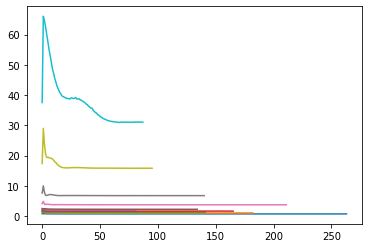

In [27]:
import copy
new_data_unweighted = copy.deepcopy(new_data)
new_data_unweighted.edge_weight = torch.ones(new_data_unweighted.edge_index.shape[1])
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=2, target=None,
                                 model_type = 'GCN', patience=20, epochs=500, lr=1e-1, wd=1e-2,
                                 min_dist=0.1, name_file="1", subsampling=None,
                                 spread = 1.0, repulsion_strength=repulsion_strength[i],
                                 device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

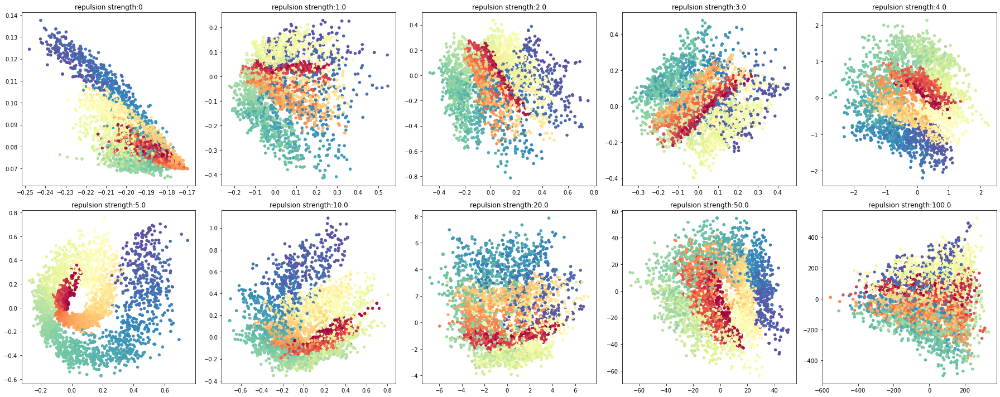

In [28]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

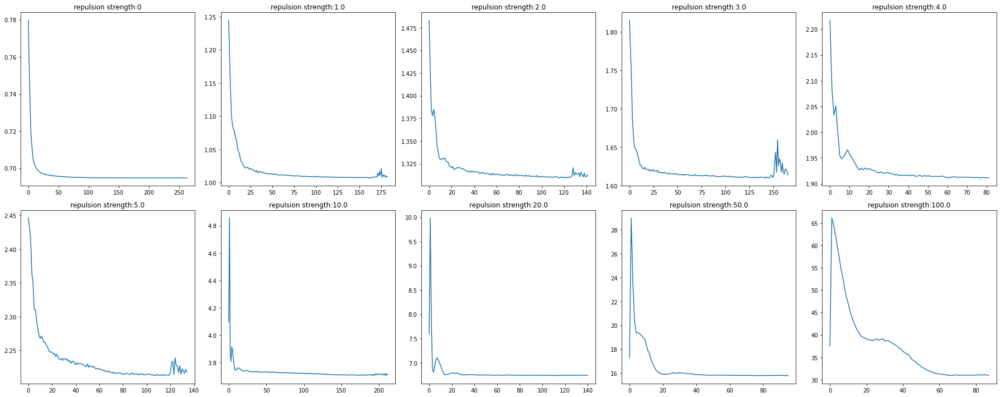

In [29]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

### GCN-layer1

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6347, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.6347, time=0.0185
loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6347, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.6347, time=0.0186
loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6345, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.6345, time=0.0232
loss poss tensor(0.6344, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6344, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.6344, time=0.0227
loss poss tensor(0.6342, dtype=torch.float64, 

loss poss tensor(0.6336, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6336, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=0.6336, time=0.0261
loss poss tensor(0.6336, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6336, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=0.6336, time=0.0193
loss poss tensor(0.6336, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6336, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=0.6336, time=0.0180
loss poss tensor(0.6336, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6336, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=0.6336, time=0.0184
loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

loss poss tensor(0.6312, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6312, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=088, loss=0.6312, time=0.0220
loss poss tensor(0.6312, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6312, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=089, loss=0.6312, time=0.0190
loss poss tensor(0.6312, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6312, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=090, loss=0.6312, time=0.0182
loss poss tensor(0.6312, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6312, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=0.6312, time=0.0173
loss poss tensor(0.6312, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6426, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3680, grad_fn=<NegBackward0>)
loss final tensor(1.0107, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.0107, time=0.0232
loss poss tensor(0.6398, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3502, grad_fn=<NegBackward0>)
loss final tensor(0.9900, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.9900, time=0.0216
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3309, grad_fn=<NegBackward0>)
loss final tensor(0.9682, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.9682, time=0.0180
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3170, grad_fn=<NegBackward0>)
loss final tensor(0.9529, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.9529, time=0.0184
loss poss tensor(0.6352, dtype=tor

loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3012, grad_fn=<NegBackward0>)
loss final tensor(0.9359, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=0.9359, time=0.0266
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3013, grad_fn=<NegBackward0>)
loss final tensor(0.9361, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=0.9361, time=0.0229
loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3017, grad_fn=<NegBackward0>)
loss final tensor(0.9364, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=0.9364, time=0.0214
loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3021, grad_fn=<NegBackward0>)
loss final tensor(0.9368, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=0.9368, time=0.0173
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6234, grad_fn=<NegBackward0>)
loss final tensor(1.2592, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2592, time=0.0194
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6168, grad_fn=<NegBackward0>)
loss final tensor(1.2523, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2523, time=0.0173
loss poss tensor(0.6352, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6090, grad_fn=<NegBackward0>)
loss final tensor(1.2441, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2441, time=0.0197
loss poss tensor(0.6351, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6043, grad_fn=<NegBackward0>)
loss final tensor(1.2393, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2393, time=0.0174
loss poss tensor(0.6351, dtype=tor

loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6039, grad_fn=<NegBackward0>)
loss final tensor(1.2376, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=1.2376, time=0.0240
loss poss tensor(0.6336, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6040, grad_fn=<NegBackward0>)
loss final tensor(1.2376, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=1.2376, time=0.0172
loss poss tensor(0.6338, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6042, grad_fn=<NegBackward0>)
loss final tensor(1.2380, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=1.2380, time=0.0166
loss poss tensor(0.6338, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6044, grad_fn=<NegBackward0>)
loss final tensor(1.2382, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.2382, time=0.0169
loss poss tensor(0.6338, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6041, grad_f

Epoch=073, loss=1.2386, time=0.0179
Early stopping at epoch 73!
Loading 53th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6323, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9234, grad_fn=<NegBackward0>)
loss final tensor(1.5557, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.5557, time=0.0184
loss poss tensor(0.6323, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9195, grad_fn=<NegBackward0>)
loss final tensor(1.5518, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.5518, time=0.0182
loss poss tensor(0.6323, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9139, grad_fn=<NegBackward0>)
loss final tensor(1.5462, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.5462, time=0.0172
loss poss tensor(0.6329, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9093, grad_fn=<NegBackward0>)
loss final tensor(1.5422, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.5422, time=0.0204
loss poss tensor(0.6341, dtype=tor

loss poss tensor(0.6328, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9039, grad_fn=<NegBackward0>)
loss final tensor(1.5367, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=1.5367, time=0.0211
loss poss tensor(0.6329, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9037, grad_fn=<NegBackward0>)
loss final tensor(1.5366, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.5366, time=0.0247
loss poss tensor(0.6330, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9039, grad_fn=<NegBackward0>)
loss final tensor(1.5370, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.5370, time=0.0225
loss poss tensor(0.6329, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9034, grad_fn=<NegBackward0>)
loss final tensor(1.5363, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=1.5363, time=0.0204
loss poss tensor(0.6333, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9038, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6353, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2734, grad_fn=<NegBackward0>)
loss final tensor(1.9087, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.9087, time=0.0227
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2085, grad_fn=<NegBackward0>)
loss final tensor(1.8434, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.8434, time=0.0185
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2179, grad_fn=<NegBackward0>)
loss final tensor(1.8537, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.8537, time=0.0177
loss poss tensor(0.6361, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2336, grad_fn=<NegBackward0>)
loss final tensor(1.8698, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.8698, time=0.0172
loss poss tensor(0.6360, dtype=tor

loss poss tensor(0.6344, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2014, grad_fn=<NegBackward0>)
loss final tensor(1.8358, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.8358, time=0.0302
loss poss tensor(0.6342, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2018, grad_fn=<NegBackward0>)
loss final tensor(1.8360, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.8360, time=0.0223
loss poss tensor(0.6342, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2016, grad_fn=<NegBackward0>)
loss final tensor(1.8359, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=1.8359, time=0.0281
loss poss tensor(0.6344, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2011, grad_fn=<NegBackward0>)
loss final tensor(1.8356, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=1.8356, time=0.0221
loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2017, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5744, grad_fn=<NegBackward0>)
loss final tensor(2.2100, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.2100, time=0.0181
loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5339, grad_fn=<NegBackward0>)
loss final tensor(2.1686, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.1686, time=0.0177
loss poss tensor(0.6339, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5136, grad_fn=<NegBackward0>)
loss final tensor(2.1475, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.1475, time=0.0179
loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5199, grad_fn=<NegBackward0>)
loss final tensor(2.1536, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.1536, time=0.0223
loss poss tensor(0.6339, dtype=tor

loss neg tensor(1.5103, grad_fn=<NegBackward0>)
loss final tensor(2.1445, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=2.1445, time=0.0183
loss poss tensor(0.6341, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5102, grad_fn=<NegBackward0>)
loss final tensor(2.1444, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=2.1444, time=0.0204
loss poss tensor(0.6341, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5105, grad_fn=<NegBackward0>)
loss final tensor(2.1446, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=2.1446, time=0.0175
loss poss tensor(0.6340, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5108, grad_fn=<NegBackward0>)
loss final tensor(2.1449, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=2.1449, time=0.0159
loss poss tensor(0.6341, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5104, grad_fn=<NegBackward0>)
loss final tensor(2.1445, dtype=torch.float64, grad_

loss poss tensor(0.6338, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5038, grad_fn=<NegBackward0>)
loss final tensor(2.1377, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=2.1377, time=0.0300
loss poss tensor(0.6339, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5043, grad_fn=<NegBackward0>)
loss final tensor(2.1383, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=2.1383, time=0.0182
loss poss tensor(0.6338, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5047, grad_fn=<NegBackward0>)
loss final tensor(2.1385, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=2.1385, time=0.0180
loss poss tensor(0.6341, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5041, grad_fn=<NegBackward0>)
loss final tensor(2.1383, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=2.1383, time=0.0239
loss poss tensor(0.6340, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5041, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.5002, grad_fn=<NegBackward0>)
loss final tensor(4.1380, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=4.1380, time=0.0182
loss poss tensor(0.6344, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0318, grad_fn=<NegBackward0>)
loss final tensor(3.6662, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=3.6662, time=0.0169
loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0481, grad_fn=<NegBackward0>)
loss final tensor(3.6826, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=3.6826, time=0.0186
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.1221, grad_fn=<NegBackward0>)
loss final tensor(3.7569, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7569, time=0.0146
loss poss tensor(0.6343, dtype=tor

Epoch=041, loss=3.6463, time=0.0177
loss poss tensor(0.6319, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0143, grad_fn=<NegBackward0>)
loss final tensor(3.6463, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=3.6463, time=0.0198
loss poss tensor(0.6320, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0148, grad_fn=<NegBackward0>)
loss final tensor(3.6467, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=3.6467, time=0.0189
loss poss tensor(0.6320, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0155, grad_fn=<NegBackward0>)
loss final tensor(3.6475, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=3.6475, time=0.0181
loss poss tensor(0.6321, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0153, grad_fn=<NegBackward0>)
loss final tensor(3.6474, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=3.6474, time=0.0172
loss poss tensor(0.6321, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6353, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.1334, grad_fn=<NegBackward0>)
loss final tensor(6.7687, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=6.7687, time=0.0202
loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0383, grad_fn=<NegBackward0>)
loss final tensor(6.6731, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=6.6731, time=0.0245
loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0171, grad_fn=<NegBackward0>)
loss final tensor(6.6517, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=6.6517, time=0.0293
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0692, grad_fn=<NegBackward0>)
loss final tensor(6.7041, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=6.7041, time=0.0245
loss poss tensor(0.6350, dtype=tor

loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0116, grad_fn=<NegBackward0>)
loss final tensor(6.6461, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=6.6461, time=0.0221
loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0132, grad_fn=<NegBackward0>)
loss final tensor(6.6478, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=6.6478, time=0.0185
loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0138, grad_fn=<NegBackward0>)
loss final tensor(6.6483, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=6.6483, time=0.0187
loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0117, grad_fn=<NegBackward0>)
loss final tensor(6.6461, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=6.6461, time=0.0183
loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0132, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.6673, grad_fn=<NegBackward0>)
loss final tensor(16.3017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=16.3017, time=0.0182
loss poss tensor(0.6335, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.7437, grad_fn=<NegBackward0>)
loss final tensor(16.3771, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=16.3771, time=0.0185
loss poss tensor(0.6338, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.4808, grad_fn=<NegBackward0>)
loss final tensor(16.1146, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=16.1146, time=0.0158
loss poss tensor(0.6357, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.1787, grad_fn=<NegBackward0>)
loss final tensor(15.8144, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=15.8144, time=0.0172
loss poss tensor(0.636

loss poss tensor(0.6336, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0333, grad_fn=<NegBackward0>)
loss final tensor(15.6668, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=15.6668, time=0.0215
loss poss tensor(0.6334, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0346, grad_fn=<NegBackward0>)
loss final tensor(15.6680, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=15.6680, time=0.0172
loss poss tensor(0.6334, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0326, grad_fn=<NegBackward0>)
loss final tensor(15.6661, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=15.6661, time=0.0170
loss poss tensor(0.6335, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0295, grad_fn=<NegBackward0>)
loss final tensor(15.6630, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=15.6630, time=0.0165
loss poss tensor(0.6335, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(32.8917, grad_fn=<NegBackward0>)
loss final tensor(33.5286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=33.5286, time=0.0184
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(35.9513, grad_fn=<NegBackward0>)
loss final tensor(36.5862, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=36.5862, time=0.0181
loss poss tensor(0.6319, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(33.0869, grad_fn=<NegBackward0>)
loss final tensor(33.7188, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=33.7188, time=0.0187
loss poss tensor(0.6314, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(31.5129, grad_fn=<NegBackward0>)
loss final tensor(32.1443, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=32.1443, time=0.0182
loss poss tensor(0.631

loss poss tensor(0.6319, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1501, grad_fn=<NegBackward0>)
loss final tensor(30.7820, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=30.7820, time=0.0224
loss poss tensor(0.6320, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1493, grad_fn=<NegBackward0>)
loss final tensor(30.7813, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=30.7813, time=0.0203
loss poss tensor(0.6321, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1520, grad_fn=<NegBackward0>)
loss final tensor(30.7842, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=30.7842, time=0.0180
loss poss tensor(0.6322, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1569, grad_fn=<NegBackward0>)
loss final tensor(30.7892, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=30.7892, time=0.0180
loss poss tensor(0.6323, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30

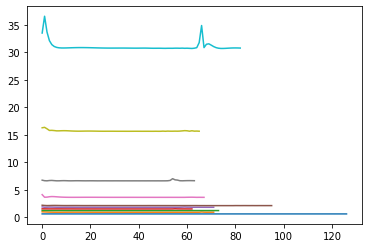

In [30]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 64, 2, n_layers=1, target=None,
                                     model_type = 'GCN', patience=20, epochs=500, lr=5e-1, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

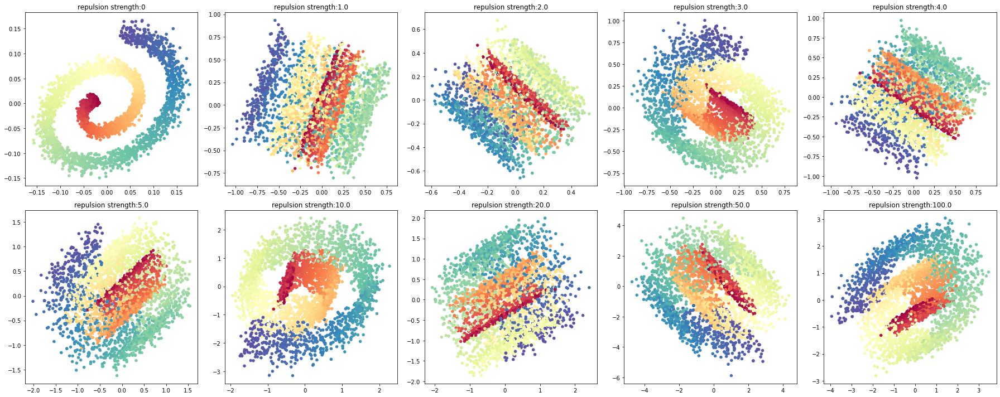

In [31]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

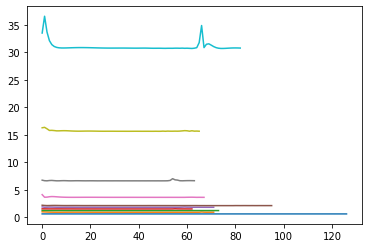

In [32]:
for i in range(num):
    _ = plt.plot(loss[i])

### GNN-standardize

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6335, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6335, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.6335, time=0.0258
loss poss tensor(0.6335, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6335, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.6335, time=0.0176
loss poss tensor(0.6335, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6335, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.6335, time=0.0151
loss poss tensor(0.6334, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6334, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.6334, time=0.0134
loss poss tensor(0.6334, dtype=torch.float64, 

Epoch=043, loss=0.6329, time=0.0183
loss poss tensor(0.6329, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6329, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=0.6329, time=0.0159
loss poss tensor(0.6329, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6329, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=0.6329, time=0.0155
loss poss tensor(0.6330, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6330, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=0.6330, time=0.0149
loss poss tensor(0.6329, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6329, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=0.6329, time=0.0145
loss poss tensor(0.6330, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6372, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3021, grad_fn=<NegBackward0>)
loss final tensor(0.9393, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.9393, time=0.0153
loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3021, grad_fn=<NegBackward0>)
loss final tensor(0.9392, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.9392, time=0.0150
loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3020, grad_fn=<NegBackward0>)
loss final tensor(0.9390, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.9390, time=0.0154
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3019, grad_fn=<NegBackward0>)
loss final tensor(0.9388, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.9388, time=0.0143
loss poss tensor(0.6367, dtype=tor

loss neg tensor(0.3017, grad_fn=<NegBackward0>)
loss final tensor(0.9384, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=0.9384, time=0.0184
loss poss tensor(0.6375, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3015, grad_fn=<NegBackward0>)
loss final tensor(0.9390, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=0.9390, time=0.0151
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3025, grad_fn=<NegBackward0>)
loss final tensor(0.9398, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=0.9398, time=0.0145
loss poss tensor(0.6365, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3014, grad_fn=<NegBackward0>)
loss final tensor(0.9379, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=0.9379, time=0.0150
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3019, grad_fn=<NegBackward0>)
loss final tensor(0.9396, dtype=torch.float64, grad_

loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3008, grad_fn=<NegBackward0>)
loss final tensor(0.9364, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=0.9364, time=0.0188
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3009, grad_fn=<NegBackward0>)
loss final tensor(0.9364, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=0.9364, time=0.0157
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3009, grad_fn=<NegBackward0>)
loss final tensor(0.9364, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=0.9364, time=0.0141
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3009, grad_fn=<NegBackward0>)
loss final tensor(0.9363, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=082, loss=0.9363, time=0.0132
loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3009, grad_f

Epoch=118, loss=0.9356, time=0.0195
loss poss tensor(0.6332, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(0.9356, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=119, loss=0.9356, time=0.0143
loss poss tensor(0.6333, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(0.9356, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=120, loss=0.9356, time=0.0155
loss poss tensor(0.6333, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3023, grad_fn=<NegBackward0>)
loss final tensor(0.9356, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=121, loss=0.9356, time=0.0143
loss poss tensor(0.6333, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3023, grad_fn=<NegBackward0>)
loss final tensor(0.9356, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=122, loss=0.9356, time=0.0152
loss poss tensor(0.6333, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=157, loss=0.9355, time=0.0148
loss poss tensor(0.6332, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3023, grad_fn=<NegBackward0>)
loss final tensor(0.9355, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=158, loss=0.9355, time=0.0155
loss poss tensor(0.6332, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3023, grad_fn=<NegBackward0>)
loss final tensor(0.9355, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=159, loss=0.9355, time=0.0145
loss poss tensor(0.6333, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3025, grad_fn=<NegBackward0>)
loss final tensor(0.9358, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=160, loss=0.9358, time=0.0150
loss poss tensor(0.6335, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3051, grad_fn=<NegBackward0>)
loss final tensor(0.9386, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=161, loss=0.9386, time=0.0149
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6446, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.7228, grad_fn=<NegBackward0>)
loss final tensor(1.3674, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.3674, time=0.0140
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6290, grad_fn=<NegBackward0>)
loss final tensor(1.2664, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2664, time=0.0161
loss poss tensor(0.6360, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6047, grad_fn=<NegBackward0>)
loss final tensor(1.2407, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2407, time=0.0149
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6041, grad_fn=<NegBackward0>)
loss final tensor(1.2404, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2404, time=0.0159
loss poss tensor(0.6369, dtype=tor

Epoch=039, loss=1.2396, time=0.0176
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6032, grad_fn=<NegBackward0>)
loss final tensor(1.2391, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.2391, time=0.0160
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6028, grad_fn=<NegBackward0>)
loss final tensor(1.2386, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.2386, time=0.0153
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6026, grad_fn=<NegBackward0>)
loss final tensor(1.2383, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=1.2383, time=0.0148
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6027, grad_fn=<NegBackward0>)
loss final tensor(1.2385, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=1.2385, time=0.0140
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9085, grad_fn=<NegBackward0>)
loss final tensor(1.5448, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.5448, time=0.0155
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9084, grad_fn=<NegBackward0>)
loss final tensor(1.5445, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.5445, time=0.0147
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9083, grad_fn=<NegBackward0>)
loss final tensor(1.5443, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.5443, time=0.0163
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9082, grad_fn=<NegBackward0>)
loss final tensor(1.5440, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.5440, time=0.0143
loss poss tensor(0.6358, dtype=tor

loss poss tensor(0.6332, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9075, grad_fn=<NegBackward0>)
loss final tensor(1.5406, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=1.5406, time=0.0206
loss poss tensor(0.6336, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9070, grad_fn=<NegBackward0>)
loss final tensor(1.5406, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=1.5406, time=0.0143
loss poss tensor(0.6341, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9068, grad_fn=<NegBackward0>)
loss final tensor(1.5409, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.5409, time=0.0200
loss poss tensor(0.6339, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9071, grad_fn=<NegBackward0>)
loss final tensor(1.5410, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.5410, time=0.0157
loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9075, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2099, grad_fn=<NegBackward0>)
loss final tensor(1.8483, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.8483, time=0.0237
loss poss tensor(0.6385, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2087, grad_fn=<NegBackward0>)
loss final tensor(1.8472, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.8472, time=0.0204
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2075, grad_fn=<NegBackward0>)
loss final tensor(1.8459, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.8459, time=0.0264
loss poss tensor(0.6382, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2066, grad_fn=<NegBackward0>)
loss final tensor(1.8447, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.8447, time=0.0249
loss poss tensor(0.6380, dtype=tor

loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2078, grad_fn=<NegBackward0>)
loss final tensor(1.8437, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=1.8437, time=0.0170
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2090, grad_fn=<NegBackward0>)
loss final tensor(1.8439, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=1.8439, time=0.0159
loss poss tensor(0.6352, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2087, grad_fn=<NegBackward0>)
loss final tensor(1.8439, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.8439, time=0.0158
loss poss tensor(0.6350, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2089, grad_fn=<NegBackward0>)
loss final tensor(1.8439, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.8439, time=0.0157
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2090, grad_f

loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2083, grad_fn=<NegBackward0>)
loss final tensor(1.8440, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=1.8440, time=0.0195
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2078, grad_fn=<NegBackward0>)
loss final tensor(1.8436, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=1.8436, time=0.0140
loss poss tensor(0.6365, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2071, grad_fn=<NegBackward0>)
loss final tensor(1.8436, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=1.8436, time=0.0150
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2071, grad_fn=<NegBackward0>)
loss final tensor(1.8446, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=1.8446, time=0.0140
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2070, grad_f

Epoch=116, loss=1.8447, time=0.0154
loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2088, grad_fn=<NegBackward0>)
loss final tensor(1.8445, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=117, loss=1.8445, time=0.0193
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2084, grad_fn=<NegBackward0>)
loss final tensor(1.8443, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=118, loss=1.8443, time=0.0149
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2080, grad_fn=<NegBackward0>)
loss final tensor(1.8441, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=119, loss=1.8441, time=0.0147
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2077, grad_fn=<NegBackward0>)
loss final tensor(1.8443, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=120, loss=1.8443, time=0.0154
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2075, grad_fn=<NegBackward0>)
loss final tensor(1.8430, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=156, loss=1.8430, time=0.0197
loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2072, grad_fn=<NegBackward0>)
loss final tensor(1.8427, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=157, loss=1.8427, time=0.0158
loss poss tensor(0.6360, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2068, grad_fn=<NegBackward0>)
loss final tensor(1.8427, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=158, loss=1.8427, time=0.0146
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2069, grad_fn=<NegBackward0>)
loss final tensor(1.8443, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=159, loss=1.8443, time=0.0141
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2071, grad_f

loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2068, grad_fn=<NegBackward0>)
loss final tensor(1.8442, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=194, loss=1.8442, time=0.1193
loss poss tensor(0.6376, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2067, grad_fn=<NegBackward0>)
loss final tensor(1.8442, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=195, loss=1.8442, time=0.0202
Early stopping at epoch 195!
Loading 175th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6394, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6332, grad_fn=<NegBackward0>)
loss final tensor(2.2727, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.2727, time=0.0192
loss poss tensor(0.6383, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5643, grad_fn=<NegBackward0>)
loss final tensor(2.2026, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.2026, time=0.0143
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5148, grad_fn=<NegBackward0>)
loss final tensor(2.1525, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.1525, time=0.0156
loss poss tensor(0.6380, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5069, grad_fn=<NegBackward0>)
loss final tensor(2.1449, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.1449, time=0.0151
loss poss tensor(0.6386, dtype=tor

Epoch=037, loss=2.1415, time=0.0152
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5057, grad_fn=<NegBackward0>)
loss final tensor(2.1424, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=2.1424, time=0.0173
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5068, grad_fn=<NegBackward0>)
loss final tensor(2.1435, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=2.1435, time=0.0182
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5068, grad_fn=<NegBackward0>)
loss final tensor(2.1434, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=2.1434, time=0.0154
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5056, grad_fn=<NegBackward0>)
loss final tensor(2.1422, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=2.1422, time=0.0162
loss poss tensor(0.6365, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6375, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5058, grad_fn=<NegBackward0>)
loss final tensor(2.1433, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=2.1433, time=0.0216
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5066, grad_fn=<NegBackward0>)
loss final tensor(2.1440, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=2.1440, time=0.0189
Early stopping at epoch 77!
Loading 57th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6385, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.1889, grad_fn=<NegBackward0>)
loss final tensor(3.8274, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8274, time=0.0387
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0456, grad_fn=<NegBackward0>)
loss final tensor(3.6830, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=3.6830, time=0.0222
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0906, grad_fn=<NegBackward0>)
loss final tensor(3.7284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7284, time=0.0173
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0844, grad_fn=<NegBackward0>)
loss final tensor(3.7221, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7221, time=0.0163
loss poss tensor(0.6375, dtype=tor

Epoch=036, loss=3.6479, time=0.0184
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0107, grad_fn=<NegBackward0>)
loss final tensor(3.6480, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=3.6480, time=0.0186
loss poss tensor(0.6375, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0110, grad_fn=<NegBackward0>)
loss final tensor(3.6485, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=3.6485, time=0.0197
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0106, grad_fn=<NegBackward0>)
loss final tensor(3.6484, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=3.6484, time=0.0151
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0101, grad_fn=<NegBackward0>)
loss final tensor(3.6479, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=3.6479, time=0.0147
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6421, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.7578, grad_fn=<NegBackward0>)
loss final tensor(7.3998, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=7.3998, time=0.0219
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0345, grad_fn=<NegBackward0>)
loss final tensor(6.6722, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=6.6722, time=0.0276
loss poss tensor(0.6389, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.2130, grad_fn=<NegBackward0>)
loss final tensor(6.8519, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=6.8519, time=0.0217
loss poss tensor(0.6399, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.3608, grad_fn=<NegBackward0>)
loss final tensor(7.0007, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=7.0007, time=0.0237
loss poss tensor(0.6396, dtype=tor

Epoch=040, loss=6.6760, time=0.0167
loss poss tensor(0.6381, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0384, grad_fn=<NegBackward0>)
loss final tensor(6.6765, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=6.6765, time=0.0181
loss poss tensor(0.6381, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0368, grad_fn=<NegBackward0>)
loss final tensor(6.6749, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=6.6749, time=0.0179
loss poss tensor(0.6380, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0342, grad_fn=<NegBackward0>)
loss final tensor(6.6722, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=6.6722, time=0.0151
loss poss tensor(0.6375, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0334, grad_fn=<NegBackward0>)
loss final tensor(6.6710, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=6.6710, time=0.0195
loss poss tensor(0.6376, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=077, loss=6.6744, time=0.0190
loss poss tensor(0.6346, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0368, grad_fn=<NegBackward0>)
loss final tensor(6.6714, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=6.6714, time=0.0388
loss poss tensor(0.6357, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0275, grad_fn=<NegBackward0>)
loss final tensor(6.6632, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=6.6632, time=0.0210
loss poss tensor(0.6369, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0270, grad_fn=<NegBackward0>)
loss final tensor(6.6639, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=6.6639, time=0.0165
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0303, grad_fn=<NegBackward0>)
loss final tensor(6.6681, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=6.6681, time=0.0119
loss poss tensor(0.6380, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6426, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(17.5408, grad_fn=<NegBackward0>)
loss final tensor(18.1835, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=18.1835, time=0.0153
loss poss tensor(0.6510, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(19.1982, grad_fn=<NegBackward0>)
loss final tensor(19.8491, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=19.8491, time=0.0141
loss poss tensor(0.6446, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(17.7822, grad_fn=<NegBackward0>)
loss final tensor(18.4269, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=18.4269, time=0.0194
loss poss tensor(0.6415, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(16.8130, grad_fn=<NegBackward0>)
loss final tensor(17.4545, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=17.4545, time=0.0155
loss poss tensor(0.640

Epoch=037, loss=15.7271, time=0.0193
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0919, grad_fn=<NegBackward0>)
loss final tensor(15.7292, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=15.7292, time=0.0156
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0940, grad_fn=<NegBackward0>)
loss final tensor(15.7314, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=15.7314, time=0.0157
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0960, grad_fn=<NegBackward0>)
loss final tensor(15.7334, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=15.7334, time=0.0186
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0977, grad_fn=<NegBackward0>)
loss final tensor(15.7351, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=15.7351, time=0.0156
loss poss tensor(0.6374, dtype=torch.float64, grad_

Epoch=075, loss=16.1004, time=0.0148
loss poss tensor(0.6381, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.4302, grad_fn=<NegBackward0>)
loss final tensor(16.0683, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=16.0683, time=0.0185
loss poss tensor(0.6380, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.3931, grad_fn=<NegBackward0>)
loss final tensor(16.0311, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=16.0311, time=0.0170
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.3554, grad_fn=<NegBackward0>)
loss final tensor(15.9932, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=15.9932, time=0.0164
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.3191, grad_fn=<NegBackward0>)
loss final tensor(15.9568, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=15.9568, time=0.0142
loss poss tensor(0.6376, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.4100, grad_fn=<NegBackward0>)
loss final tensor(31.0477, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=31.0477, time=0.0140
loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(31.1922, grad_fn=<NegBackward0>)
loss final tensor(31.8293, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=31.8293, time=0.0137
loss poss tensor(0.6376, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.3714, grad_fn=<NegBackward0>)
loss final tensor(31.0091, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=31.0091, time=0.0146
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.5359, grad_fn=<NegBackward0>)
loss final tensor(31.1734, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=31.1734, time=0.0188
loss poss tensor(0.637

Epoch=038, loss=30.7378, time=0.0158
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.0916, grad_fn=<NegBackward0>)
loss final tensor(30.7293, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=30.7293, time=0.0164
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.0882, grad_fn=<NegBackward0>)
loss final tensor(30.7259, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=30.7259, time=0.0166
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.0871, grad_fn=<NegBackward0>)
loss final tensor(30.7248, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=30.7248, time=0.0178
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.0774, grad_fn=<NegBackward0>)
loss final tensor(30.7148, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=30.7148, time=0.0179
loss poss tensor(0.6371, dtype=torch.float64, grad_

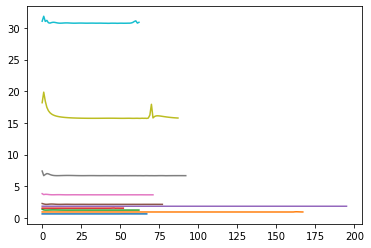

In [33]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=1, target=None,
                                     model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                     norm = 'standardize', patience=20, epochs=500, lr=5e-1, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

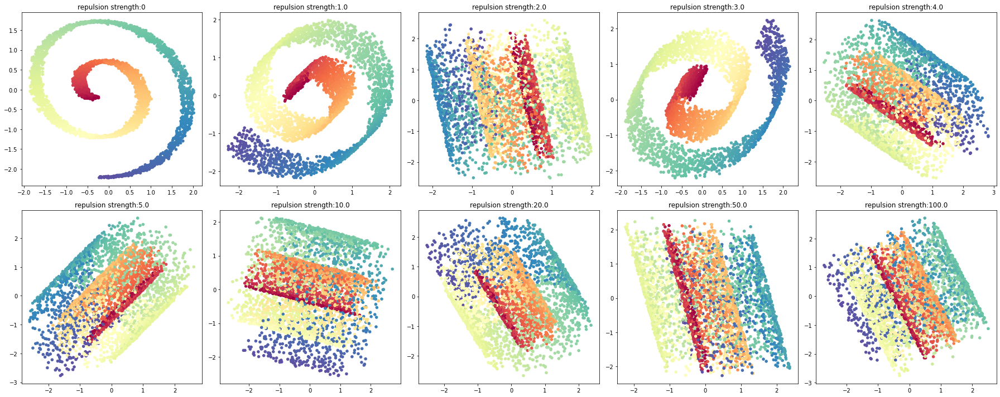

In [34]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7048, grad_fn=<AddBackward0>)
Epoch=000, loss=0.7048, time=0.0199
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7047, grad_fn=<AddBackward0>)
Epoch=001, loss=0.7047, time=0.0156
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7046, grad_fn=<AddBackward0>)
Epoch=002, loss=0.7046, time=0.0260
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7045, grad_fn=<AddBackward0>)
Epoch=003, loss=0.7045, time=0.0133
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7045, grad_fn=<AddBackward0>)
Epoch=004, loss=0.7045, time=0.0248
loss poss tensor(0.7046, grad_fn=<

Epoch=052, loss=0.6996, time=0.0167
loss poss tensor(0.6997, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6997, grad_fn=<AddBackward0>)
Epoch=053, loss=0.6997, time=0.0198
loss poss tensor(0.6996, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6996, grad_fn=<AddBackward0>)
Epoch=054, loss=0.6996, time=0.0162
loss poss tensor(0.6996, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6996, grad_fn=<AddBackward0>)
Epoch=055, loss=0.6996, time=0.0174
loss poss tensor(0.6996, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6996, grad_fn=<AddBackward0>)
Epoch=056, loss=0.6996, time=0.0149
loss poss tensor(0.6995, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6995, grad_fn=<AddBackward0>)
Epoch=057, loss=0.6995, time=0.0143
loss poss tensor(0.6996, grad_fn=<NegBackward0>)
loss neg tensor

Epoch=099, loss=0.7047, time=0.0188
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7047, grad_fn=<AddBackward0>)
Epoch=100, loss=0.7047, time=0.0158
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7050, grad_fn=<AddBackward0>)
Epoch=101, loss=0.7050, time=0.0156
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7046, grad_fn=<AddBackward0>)
Epoch=102, loss=0.7046, time=0.0152
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7043, grad_fn=<AddBackward0>)
Epoch=103, loss=0.7043, time=0.0151
loss poss tensor(0.7039, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7039, grad_fn=<AddBackward0>)
Epoch=104, loss=0.7039, time=0.0156
loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7036, grad_fn=<NegBackward0>)
loss neg tensor(0.3026, grad_fn=<NegBackward0>)
loss final tensor(1.0063, grad_fn=<AddBackward0>)
Epoch=000, loss=1.0063, time=0.0154
loss poss tensor(0.7034, grad_fn=<NegBackward0>)
loss neg tensor(0.3026, grad_fn=<NegBackward0>)
loss final tensor(1.0060, grad_fn=<AddBackward0>)
Epoch=001, loss=1.0060, time=0.0145
loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0059, grad_fn=<AddBackward0>)
Epoch=002, loss=1.0059, time=0.0139
loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0059, grad_fn=<AddBackward0>)
Epoch=003, loss=1.0059, time=0.0133
loss poss tensor(0.7036, grad_fn=<NegBackward0>)
loss neg tensor(0.3023, grad_fn=<NegBackward0>)
loss final tensor(1.0060, grad_fn=<AddBackward0>)
Epoch=004, loss=1.0060, time=0.0130
loss poss tensor(0.

Epoch=051, loss=1.0023, time=0.0162
loss poss tensor(0.7000, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0024, grad_fn=<AddBackward0>)
Epoch=052, loss=1.0024, time=0.0141
loss poss tensor(0.7000, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0023, grad_fn=<AddBackward0>)
Epoch=053, loss=1.0023, time=0.0126
loss poss tensor(0.6999, grad_fn=<NegBackward0>)
loss neg tensor(0.3023, grad_fn=<NegBackward0>)
loss final tensor(1.0023, grad_fn=<AddBackward0>)
Epoch=054, loss=1.0023, time=0.0134
loss poss tensor(0.6999, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0023, grad_fn=<AddBackward0>)
Epoch=055, loss=1.0023, time=0.0142
loss poss tensor(0.6999, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0023, grad_fn=<AddBackward0>)
Epoch=056, loss=1.0023, time=0.0152
loss poss tensor(0.6999, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor(0.6046, grad_fn=<NegBackward0>)
loss final tensor(1.3080, grad_fn=<AddBackward0>)
Epoch=000, loss=1.3080, time=0.0183
loss poss tensor(0.7034, grad_fn=<NegBackward0>)
loss neg tensor(0.6045, grad_fn=<NegBackward0>)
loss final tensor(1.3079, grad_fn=<AddBackward0>)
Epoch=001, loss=1.3079, time=0.0182
loss poss tensor(0.7034, grad_fn=<NegBackward0>)
loss neg tensor(0.6045, grad_fn=<NegBackward0>)
loss final tensor(1.3079, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3079, time=0.0156
loss poss tensor(0.7034, grad_fn=<NegBackward0>)
loss neg tensor(0.6045, grad_fn=<NegBackward0>)
loss final tensor(1.3079, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3079, time=0.0137
loss poss tensor(0.7034, grad_fn=<NegBackward0>)
loss neg tensor(0.6045, grad_fn=<NegBackward0>)
loss final tensor(1.3079, grad_fn=<AddBackward0>)
Epoch=004, loss=1.3079, time=0.0147
loss poss tensor(0.

Epoch=044, loss=1.3061, time=0.0179
loss poss tensor(0.7053, grad_fn=<NegBackward0>)
loss neg tensor(0.6017, grad_fn=<NegBackward0>)
loss final tensor(1.3070, grad_fn=<AddBackward0>)
Epoch=045, loss=1.3070, time=0.0163
loss poss tensor(0.7051, grad_fn=<NegBackward0>)
loss neg tensor(0.6015, grad_fn=<NegBackward0>)
loss final tensor(1.3066, grad_fn=<AddBackward0>)
Epoch=046, loss=1.3066, time=0.0157
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(0.6013, grad_fn=<NegBackward0>)
loss final tensor(1.3057, grad_fn=<AddBackward0>)
Epoch=047, loss=1.3057, time=0.0154
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(0.6012, grad_fn=<NegBackward0>)
loss final tensor(1.3058, grad_fn=<AddBackward0>)
Epoch=048, loss=1.3058, time=0.0155
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(0.6009, grad_fn=<NegBackward0>)
loss final tensor(1.3064, grad_fn=<AddBackward0>)
Epoch=049, loss=1.3064, time=0.0154
loss poss tensor(0.7056, grad_fn=<NegBackward0>)


Epoch=091, loss=1.3048, time=0.0165
loss poss tensor(0.7011, grad_fn=<NegBackward0>)
loss neg tensor(0.6049, grad_fn=<NegBackward0>)
loss final tensor(1.3061, grad_fn=<AddBackward0>)
Epoch=092, loss=1.3061, time=0.0159
loss poss tensor(0.7012, grad_fn=<NegBackward0>)
loss neg tensor(0.6057, grad_fn=<NegBackward0>)
loss final tensor(1.3069, grad_fn=<AddBackward0>)
Epoch=093, loss=1.3069, time=0.0144
loss poss tensor(0.7019, grad_fn=<NegBackward0>)
loss neg tensor(0.6057, grad_fn=<NegBackward0>)
loss final tensor(1.3076, grad_fn=<AddBackward0>)
Epoch=094, loss=1.3076, time=0.0157
loss poss tensor(0.7014, grad_fn=<NegBackward0>)
loss neg tensor(0.6052, grad_fn=<NegBackward0>)
loss final tensor(1.3067, grad_fn=<AddBackward0>)
Epoch=095, loss=1.3067, time=0.0126
loss poss tensor(0.7001, grad_fn=<NegBackward0>)
loss neg tensor(0.6047, grad_fn=<NegBackward0>)
loss final tensor(1.3047, grad_fn=<AddBackward0>)
Epoch=096, loss=1.3047, time=0.0152
loss poss tensor(0.7001, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(0.9160, grad_fn=<NegBackward0>)
loss final tensor(1.6204, grad_fn=<AddBackward0>)
Epoch=000, loss=1.6204, time=0.0155
loss poss tensor(0.7039, grad_fn=<NegBackward0>)
loss neg tensor(0.9131, grad_fn=<NegBackward0>)
loss final tensor(1.6171, grad_fn=<AddBackward0>)
Epoch=001, loss=1.6171, time=0.0217
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(0.9090, grad_fn=<NegBackward0>)
loss final tensor(1.6128, grad_fn=<AddBackward0>)
Epoch=002, loss=1.6128, time=0.0214
loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor(0.9059, grad_fn=<NegBackward0>)
loss final tensor(1.6094, grad_fn=<AddBackward0>)
Epoch=003, loss=1.6094, time=0.0267
loss poss tensor(0.7034, grad_fn=<NegBackward0>)
loss neg tensor(0.9047, grad_fn=<NegBackward0>)
loss final tensor(1.6082, grad_fn=<AddBackward0>)
Epoch=004, loss=1.6082, time=0.0229
loss poss tensor(0.

loss poss tensor(0.7033, grad_fn=<NegBackward0>)
loss neg tensor(0.9043, grad_fn=<NegBackward0>)
loss final tensor(1.6076, grad_fn=<AddBackward0>)
Epoch=047, loss=1.6076, time=0.0206
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(0.9047, grad_fn=<NegBackward0>)
loss final tensor(1.6084, grad_fn=<AddBackward0>)
Epoch=048, loss=1.6084, time=0.0129
loss poss tensor(0.7039, grad_fn=<NegBackward0>)
loss neg tensor(0.9050, grad_fn=<NegBackward0>)
loss final tensor(1.6089, grad_fn=<AddBackward0>)
Epoch=049, loss=1.6089, time=0.0147
loss poss tensor(0.7039, grad_fn=<NegBackward0>)
loss neg tensor(0.9050, grad_fn=<NegBackward0>)
loss final tensor(1.6089, grad_fn=<AddBackward0>)
Epoch=050, loss=1.6089, time=0.0190
loss poss tensor(0.7038, grad_fn=<NegBackward0>)
loss neg tensor(0.9052, grad_fn=<NegBackward0>)
loss final tensor(1.6090, grad_fn=<AddBackward0>)
Epoch=051, loss=1.6090, time=0.0152
loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor(0.9049, grad_fn=<Neg

Epoch=098, loss=1.6077, time=0.0158
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(0.9029, grad_fn=<NegBackward0>)
loss final tensor(1.6074, grad_fn=<AddBackward0>)
Epoch=099, loss=1.6074, time=0.0178
loss poss tensor(0.7042, grad_fn=<NegBackward0>)
loss neg tensor(0.9030, grad_fn=<NegBackward0>)
loss final tensor(1.6072, grad_fn=<AddBackward0>)
Epoch=100, loss=1.6072, time=0.0174
Early stopping at epoch 100!
Loading 80th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.3296, grad_fn=<NegBackward0>)
loss final tensor(2.0391, grad_fn=<AddBackward0>)
Epoch=000, loss=2.0391, time=0.0150
loss poss tensor(0.7069, grad_fn=<NegBackward0>)
loss neg tensor(1.2694, grad_fn=<NegBackward0>)
loss final tensor(1.9763, grad_fn=<AddBackward0>)
Epoch=001, loss=1.9763, time=0.0139
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(1.2213, grad_fn=<NegBackward0>)
loss final tensor(1.9261, grad_fn=<AddBackward0>)
Epoch=002, loss=1.9261, time=0.0190
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(1.2070, grad_fn=<NegBackward0>)
loss final tensor(1.9109, grad_fn=<AddBackward0>)
Epoch=003, loss=1.9109, time=0.0182
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(1.2163, grad_fn=<NegBackward0>)
loss final tensor(1.9203, grad_fn=<AddBackward0>)
Epoch=004, loss=1.9203, time=0.0189
loss poss tensor(0.

loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(1.2079, grad_fn=<NegBackward0>)
loss final tensor(1.9121, grad_fn=<AddBackward0>)
Epoch=047, loss=1.9121, time=0.0592
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(1.2068, grad_fn=<NegBackward0>)
loss final tensor(1.9108, grad_fn=<AddBackward0>)
Epoch=048, loss=1.9108, time=0.0259
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(1.2072, grad_fn=<NegBackward0>)
loss final tensor(1.9113, grad_fn=<AddBackward0>)
Epoch=049, loss=1.9113, time=0.0338
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(1.2082, grad_fn=<NegBackward0>)
loss final tensor(1.9122, grad_fn=<AddBackward0>)
Epoch=050, loss=1.9122, time=0.0335
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(1.2071, grad_fn=<NegBackward0>)
loss final tensor(1.9111, grad_fn=<AddBackward0>)
Epoch=051, loss=1.9111, time=0.0354
loss poss tensor(0.7042, grad_fn=<NegBackward0>)
loss neg tensor(1.2070, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(1.5184, grad_fn=<NegBackward0>)
loss final tensor(2.2231, grad_fn=<AddBackward0>)
Epoch=000, loss=2.2231, time=0.0277
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(1.5146, grad_fn=<NegBackward0>)
loss final tensor(2.2191, grad_fn=<AddBackward0>)
Epoch=001, loss=2.2191, time=0.0804
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(1.5117, grad_fn=<NegBackward0>)
loss final tensor(2.2163, grad_fn=<AddBackward0>)
Epoch=002, loss=2.2163, time=0.0396
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(1.5127, grad_fn=<NegBackward0>)
loss final tensor(2.2173, grad_fn=<AddBackward0>)
Epoch=003, loss=2.2173, time=0.0403
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(1.5151, grad_fn=<NegBackward0>)
loss final tensor(2.2199, grad_fn=<AddBackward0>)
Epoch=004, loss=2.2199, time=0.0271
loss poss tensor(0.

loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor(1.5115, grad_fn=<NegBackward0>)
loss final tensor(2.2151, grad_fn=<AddBackward0>)
Epoch=051, loss=2.2151, time=0.0257
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(1.5114, grad_fn=<NegBackward0>)
loss final tensor(2.2143, grad_fn=<AddBackward0>)
Epoch=052, loss=2.2143, time=0.0207
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(1.5115, grad_fn=<NegBackward0>)
loss final tensor(2.2153, grad_fn=<AddBackward0>)
Epoch=053, loss=2.2153, time=0.0218
loss poss tensor(0.7034, grad_fn=<NegBackward0>)
loss neg tensor(1.5101, grad_fn=<NegBackward0>)
loss final tensor(2.2136, grad_fn=<AddBackward0>)
Epoch=054, loss=2.2136, time=0.0207
loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor(1.5103, grad_fn=<NegBackward0>)
loss final tensor(2.2138, grad_fn=<AddBackward0>)
Epoch=055, loss=2.2138, time=0.0214
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(1.5097, grad_fn=<Neg

Epoch=098, loss=2.2117, time=0.0219
loss poss tensor(0.7017, grad_fn=<NegBackward0>)
loss neg tensor(1.5100, grad_fn=<NegBackward0>)
loss final tensor(2.2117, grad_fn=<AddBackward0>)
Epoch=099, loss=2.2117, time=0.0208
loss poss tensor(0.7019, grad_fn=<NegBackward0>)
loss neg tensor(1.5099, grad_fn=<NegBackward0>)
loss final tensor(2.2117, grad_fn=<AddBackward0>)
Epoch=100, loss=2.2117, time=0.0195
loss poss tensor(0.7018, grad_fn=<NegBackward0>)
loss neg tensor(1.5101, grad_fn=<NegBackward0>)
loss final tensor(2.2119, grad_fn=<AddBackward0>)
Epoch=101, loss=2.2119, time=0.0206
loss poss tensor(0.7019, grad_fn=<NegBackward0>)
loss neg tensor(1.5114, grad_fn=<NegBackward0>)
loss final tensor(2.2132, grad_fn=<AddBackward0>)
Epoch=102, loss=2.2132, time=0.0208
loss poss tensor(0.7012, grad_fn=<NegBackward0>)
loss neg tensor(1.5107, grad_fn=<NegBackward0>)
loss final tensor(2.2120, grad_fn=<AddBackward0>)
Epoch=103, loss=2.2120, time=0.0212
loss poss tensor(0.7021, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(3.0278, grad_fn=<NegBackward0>)
loss final tensor(3.7309, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7309, time=0.0208
loss poss tensor(0.7031, grad_fn=<NegBackward0>)
loss neg tensor(3.0223, grad_fn=<NegBackward0>)
loss final tensor(3.7254, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7254, time=0.0203
loss poss tensor(0.7033, grad_fn=<NegBackward0>)
loss neg tensor(3.0201, grad_fn=<NegBackward0>)
loss final tensor(3.7234, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7234, time=0.0235
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(3.0227, grad_fn=<NegBackward0>)
loss final tensor(3.7258, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7258, time=0.0232
loss poss tensor(0.7031, grad_fn=<NegBackward0>)
loss neg tensor(3.0235, grad_fn=<NegBackward0>)
loss final tensor(3.7266, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7266, time=0.0250
loss poss tensor(0.

loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(3.0142, grad_fn=<NegBackward0>)
loss final tensor(3.7187, grad_fn=<AddBackward0>)
Epoch=046, loss=3.7187, time=0.0249
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(3.0130, grad_fn=<NegBackward0>)
loss final tensor(3.7174, grad_fn=<AddBackward0>)
Epoch=047, loss=3.7174, time=0.0211
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(3.0123, grad_fn=<NegBackward0>)
loss final tensor(3.7164, grad_fn=<AddBackward0>)
Epoch=048, loss=3.7164, time=0.0201
loss poss tensor(0.7039, grad_fn=<NegBackward0>)
loss neg tensor(3.0126, grad_fn=<NegBackward0>)
loss final tensor(3.7165, grad_fn=<AddBackward0>)
Epoch=049, loss=3.7165, time=0.0200
loss poss tensor(0.7038, grad_fn=<NegBackward0>)
loss neg tensor(3.0135, grad_fn=<NegBackward0>)
loss final tensor(3.7172, grad_fn=<AddBackward0>)
Epoch=050, loss=3.7172, time=0.0202
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(3.0143, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7061, grad_fn=<NegBackward0>)
loss neg tensor(6.4281, grad_fn=<NegBackward0>)
loss final tensor(7.1342, grad_fn=<AddBackward0>)
Epoch=000, loss=7.1342, time=0.0243
loss poss tensor(0.7030, grad_fn=<NegBackward0>)
loss neg tensor(6.0437, grad_fn=<NegBackward0>)
loss final tensor(6.7468, grad_fn=<AddBackward0>)
Epoch=001, loss=6.7468, time=0.0226
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(6.2400, grad_fn=<NegBackward0>)
loss final tensor(6.9438, grad_fn=<AddBackward0>)
Epoch=002, loss=6.9438, time=0.0201
loss poss tensor(0.7038, grad_fn=<NegBackward0>)
loss neg tensor(6.2412, grad_fn=<NegBackward0>)
loss final tensor(6.9450, grad_fn=<AddBackward0>)
Epoch=003, loss=6.9450, time=0.0224
loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor(6.1339, grad_fn=<NegBackward0>)
loss final tensor(6.8374, grad_fn=<AddBackward0>)
Epoch=004, loss=6.8374, time=0.0226
loss poss tensor(0.

Epoch=047, loss=6.7243, time=0.0217
loss poss tensor(0.7038, grad_fn=<NegBackward0>)
loss neg tensor(6.0190, grad_fn=<NegBackward0>)
loss final tensor(6.7229, grad_fn=<AddBackward0>)
Epoch=048, loss=6.7229, time=0.0214
loss poss tensor(0.7042, grad_fn=<NegBackward0>)
loss neg tensor(6.0206, grad_fn=<NegBackward0>)
loss final tensor(6.7248, grad_fn=<AddBackward0>)
Epoch=049, loss=6.7248, time=0.0378
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(6.0221, grad_fn=<NegBackward0>)
loss final tensor(6.7266, grad_fn=<AddBackward0>)
Epoch=050, loss=6.7266, time=0.0631
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(6.0184, grad_fn=<NegBackward0>)
loss final tensor(6.7227, grad_fn=<AddBackward0>)
Epoch=051, loss=6.7227, time=0.0359
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(6.0212, grad_fn=<NegBackward0>)
loss final tensor(6.7255, grad_fn=<AddBackward0>)
Epoch=052, loss=6.7255, time=0.0497
loss poss tensor(0.7046, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(15.1929, grad_fn=<NegBackward0>)
loss final tensor(15.8970, grad_fn=<AddBackward0>)
Epoch=000, loss=15.8970, time=0.0420
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(15.4198, grad_fn=<NegBackward0>)
loss final tensor(16.1253, grad_fn=<AddBackward0>)
Epoch=001, loss=16.1253, time=0.0377
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(15.0841, grad_fn=<NegBackward0>)
loss final tensor(15.7887, grad_fn=<AddBackward0>)
Epoch=002, loss=15.7887, time=0.0329
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(15.2166, grad_fn=<NegBackward0>)
loss final tensor(15.9211, grad_fn=<AddBackward0>)
Epoch=003, loss=15.9211, time=0.0230
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(15.1063, grad_fn=<NegBackward0>)
loss final tensor(15.8109, grad_fn=<AddBackward0>)
Epoch=004, loss=15.8109, time=0.0239
loss

loss poss tensor(0.7052, grad_fn=<NegBackward0>)
loss neg tensor(15.0734, grad_fn=<NegBackward0>)
loss final tensor(15.7786, grad_fn=<AddBackward0>)
Epoch=045, loss=15.7786, time=0.0259
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(15.0744, grad_fn=<NegBackward0>)
loss final tensor(15.7799, grad_fn=<AddBackward0>)
Epoch=046, loss=15.7799, time=0.0219
loss poss tensor(0.7054, grad_fn=<NegBackward0>)
loss neg tensor(15.0705, grad_fn=<NegBackward0>)
loss final tensor(15.7759, grad_fn=<AddBackward0>)
Epoch=047, loss=15.7759, time=0.0195
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(15.0770, grad_fn=<NegBackward0>)
loss final tensor(15.7825, grad_fn=<AddBackward0>)
Epoch=048, loss=15.7825, time=0.0204
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(15.0880, grad_fn=<NegBackward0>)
loss final tensor(15.7930, grad_fn=<AddBackward0>)
Epoch=049, loss=15.7930, time=0.0210
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(15.09

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(30.3156, grad_fn=<NegBackward0>)
loss final tensor(31.0202, grad_fn=<AddBackward0>)
Epoch=000, loss=31.0202, time=0.0207
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(30.4906, grad_fn=<NegBackward0>)
loss final tensor(31.1953, grad_fn=<AddBackward0>)
Epoch=001, loss=31.1953, time=0.0221
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(30.2532, grad_fn=<NegBackward0>)
loss final tensor(30.9572, grad_fn=<AddBackward0>)
Epoch=002, loss=30.9572, time=0.0202
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(30.3312, grad_fn=<NegBackward0>)
loss final tensor(31.0362, grad_fn=<AddBackward0>)
Epoch=003, loss=31.0362, time=0.0234
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(30.2132, grad_fn=<NegBackward0>)
loss final tensor(30.9172, grad_fn=<AddBackward0>)
Epoch=004, loss=30.9172, time=0.0237
loss

Epoch=045, loss=30.8927, time=0.0232
loss poss tensor(0.7042, grad_fn=<NegBackward0>)
loss neg tensor(30.1843, grad_fn=<NegBackward0>)
loss final tensor(30.8885, grad_fn=<AddBackward0>)
Epoch=046, loss=30.8885, time=0.0315
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(30.1832, grad_fn=<NegBackward0>)
loss final tensor(30.8876, grad_fn=<AddBackward0>)
Epoch=047, loss=30.8876, time=0.0262
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(30.1906, grad_fn=<NegBackward0>)
loss final tensor(30.8952, grad_fn=<AddBackward0>)
Epoch=048, loss=30.8952, time=0.0249
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(30.1965, grad_fn=<NegBackward0>)
loss final tensor(30.9009, grad_fn=<AddBackward0>)
Epoch=049, loss=30.9009, time=0.0266
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(30.1967, grad_fn=<NegBackward0>)
loss final tensor(30.9011, grad_fn=<AddBackward0>)
Epoch=050, loss=30.9011, time=0.0318
loss poss tensor(0.7044, grad_fn=

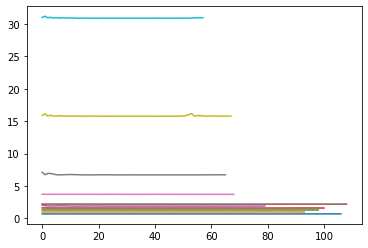

In [35]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=1, target=None,
                                  model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                  norm = 'standardize', patience=20, epochs=500, lr=5e-1, wd=1e-2,
                                  min_dist=0.1, name_file="1", subsampling=None,
                                  spread = 1.0, repulsion_strength=repulsion_strength[i],
                                  device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

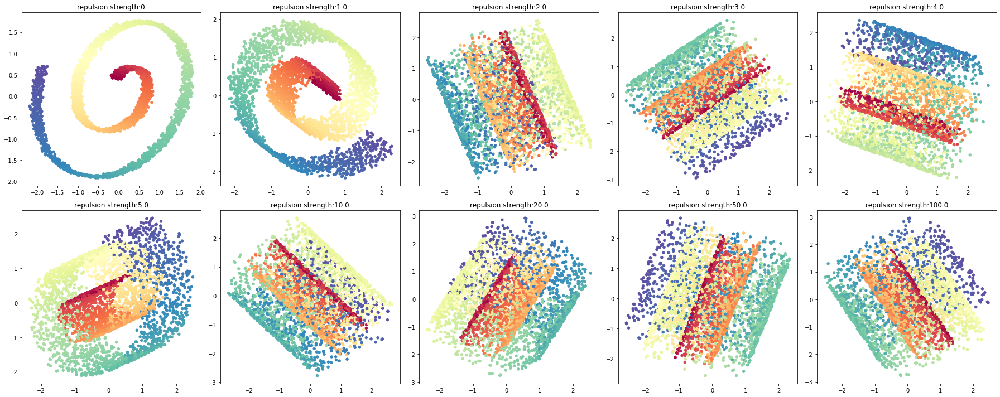

In [36]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

### GNN-normalize

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6465, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6465, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.6465, time=0.0242
loss poss tensor(0.6455, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6455, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.6455, time=0.0267
loss poss tensor(0.6436, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6436, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.6436, time=0.0210
loss poss tensor(0.6410, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6410, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.6410, time=0.0283
loss poss tensor(0.6390, dtype=torch.float64, 

loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=0.6284, time=0.0245
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=0.6284, time=0.0174
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=0.6284, time=0.0222
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=0.6284, time=0.0229
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3101, grad_fn=<NegBackward0>)
loss final tensor(0.9475, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.9475, time=0.0244
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3094, grad_fn=<NegBackward0>)
loss final tensor(0.9467, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.9467, time=0.0210
loss poss tensor(0.6372, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3080, grad_fn=<NegBackward0>)
loss final tensor(0.9452, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.9452, time=0.0255
loss poss tensor(0.6369, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3063, grad_fn=<NegBackward0>)
loss final tensor(0.9433, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.9433, time=0.0223
loss poss tensor(0.6366, dtype=tor

loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3029, grad_fn=<NegBackward0>)
loss final tensor(0.9374, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=0.9374, time=0.0347
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3030, grad_fn=<NegBackward0>)
loss final tensor(0.9377, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=0.9377, time=0.0299
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(0.9373, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=0.9373, time=0.0230
loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3025, grad_fn=<NegBackward0>)
loss final tensor(0.9373, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=0.9373, time=0.0225
loss poss tensor(0.6346, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3028, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6078, grad_fn=<NegBackward0>)
loss final tensor(1.2440, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2440, time=0.0227
loss poss tensor(0.6364, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6072, grad_fn=<NegBackward0>)
loss final tensor(1.2436, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2436, time=0.0232
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6063, grad_fn=<NegBackward0>)
loss final tensor(1.2425, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2425, time=0.0239
loss poss tensor(0.6361, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6052, grad_fn=<NegBackward0>)
loss final tensor(1.2412, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2412, time=0.0272
loss poss tensor(0.6358, dtype=tor

loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6028, grad_fn=<NegBackward0>)
loss final tensor(1.2373, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=1.2373, time=0.0257
loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6023, grad_fn=<NegBackward0>)
loss final tensor(1.2368, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=1.2368, time=0.0205
loss poss tensor(0.6346, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6026, grad_fn=<NegBackward0>)
loss final tensor(1.2373, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=1.2373, time=0.0200
loss poss tensor(0.6350, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6023, grad_fn=<NegBackward0>)
loss final tensor(1.2373, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=1.2373, time=0.0253
loss poss tensor(0.6350, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6028, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9077, grad_fn=<NegBackward0>)
loss final tensor(1.5455, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.5455, time=0.0281
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9063, grad_fn=<NegBackward0>)
loss final tensor(1.5437, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.5437, time=0.0281
loss poss tensor(0.6372, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9043, grad_fn=<NegBackward0>)
loss final tensor(1.5415, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.5415, time=0.0253
loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9027, grad_fn=<NegBackward0>)
loss final tensor(1.5398, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.5398, time=0.0235
loss poss tensor(0.6370, dtype=tor

Epoch=044, loss=1.5354, time=0.0305
loss poss tensor(0.6346, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9029, grad_fn=<NegBackward0>)
loss final tensor(1.5375, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=1.5375, time=0.0328
loss poss tensor(0.6343, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9007, grad_fn=<NegBackward0>)
loss final tensor(1.5350, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.5350, time=0.0355
loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9015, grad_fn=<NegBackward0>)
loss final tensor(1.5351, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.5351, time=0.0353
loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9012, grad_fn=<NegBackward0>)
loss final tensor(1.5357, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.5357, time=0.0350
loss poss tensor(0.6344, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6436, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.3591, grad_fn=<NegBackward0>)
loss final tensor(2.0027, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.0027, time=0.0261
loss poss tensor(0.6410, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2837, grad_fn=<NegBackward0>)
loss final tensor(1.9247, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.9247, time=0.0224
loss poss tensor(0.6393, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2317, grad_fn=<NegBackward0>)
loss final tensor(1.8710, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.8710, time=0.0226
loss poss tensor(0.6382, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2118, grad_fn=<NegBackward0>)
loss final tensor(1.8501, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.8501, time=0.0251
loss poss tensor(0.6378, dtype=tor

loss poss tensor(0.6361, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2078, grad_fn=<NegBackward0>)
loss final tensor(1.8439, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=1.8439, time=0.0249
loss poss tensor(0.6360, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2070, grad_fn=<NegBackward0>)
loss final tensor(1.8431, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=1.8431, time=0.0244
loss poss tensor(0.6360, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2071, grad_fn=<NegBackward0>)
loss final tensor(1.8431, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.8431, time=0.0215
loss poss tensor(0.6360, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2078, grad_fn=<NegBackward0>)
loss final tensor(1.8438, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.8438, time=0.0252
loss poss tensor(0.6361, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2085, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5927, grad_fn=<NegBackward0>)
loss final tensor(2.2297, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.2297, time=0.0350
loss poss tensor(0.6365, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5461, grad_fn=<NegBackward0>)
loss final tensor(2.1826, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.1826, time=0.0307
loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5134, grad_fn=<NegBackward0>)
loss final tensor(2.1489, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.1489, time=0.0273
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5096, grad_fn=<NegBackward0>)
loss final tensor(2.1454, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.1454, time=0.0269
loss poss tensor(0.6361, dtype=tor

loss neg tensor(1.5080, grad_fn=<NegBackward0>)
loss final tensor(2.1430, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=2.1430, time=0.0260
loss poss tensor(0.6350, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5071, grad_fn=<NegBackward0>)
loss final tensor(2.1421, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=2.1421, time=0.0234
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5068, grad_fn=<NegBackward0>)
loss final tensor(2.1418, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=2.1418, time=0.0218
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5078, grad_fn=<NegBackward0>)
loss final tensor(2.1427, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=2.1427, time=0.0200
loss poss tensor(0.6350, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5074, grad_fn=<NegBackward0>)
loss final tensor(2.1424, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.1699, grad_fn=<NegBackward0>)
loss final tensor(3.8055, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8055, time=0.0264
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0697, grad_fn=<NegBackward0>)
loss final tensor(3.7045, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7045, time=0.0215
loss poss tensor(0.6361, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0175, grad_fn=<NegBackward0>)
loss final tensor(3.6536, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=3.6536, time=0.0223
loss poss tensor(0.6365, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0405, grad_fn=<NegBackward0>)
loss final tensor(3.6770, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=3.6770, time=0.0296
loss poss tensor(0.6369, dtype=tor

Epoch=036, loss=3.6515, time=0.0225
loss poss tensor(0.6352, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0152, grad_fn=<NegBackward0>)
loss final tensor(3.6504, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=3.6504, time=0.0196
loss poss tensor(0.6353, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0152, grad_fn=<NegBackward0>)
loss final tensor(3.6505, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=3.6505, time=0.0211
loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0162, grad_fn=<NegBackward0>)
loss final tensor(3.6517, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=3.6517, time=0.0234
loss poss tensor(0.6356, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0162, grad_fn=<NegBackward0>)
loss final tensor(3.6518, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=3.6518, time=0.0202
loss poss tensor(0.6354, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6452, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(7.2230, grad_fn=<NegBackward0>)
loss final tensor(7.8682, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=7.8682, time=0.0229
loss poss tensor(0.6382, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.2216, grad_fn=<NegBackward0>)
loss final tensor(6.8598, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=6.8598, time=0.0198
loss poss tensor(0.6410, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.5882, grad_fn=<NegBackward0>)
loss final tensor(7.2292, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=7.2292, time=0.0202
loss poss tensor(0.6413, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.5950, grad_fn=<NegBackward0>)
loss final tensor(7.2363, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=7.2363, time=0.0200
loss poss tensor(0.6412, dtype=tor

Epoch=036, loss=6.6531, time=0.1285
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0124, grad_fn=<NegBackward0>)
loss final tensor(6.6501, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=6.6501, time=0.0235
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0101, grad_fn=<NegBackward0>)
loss final tensor(6.6478, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=6.6478, time=0.0195
loss poss tensor(0.6375, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0095, grad_fn=<NegBackward0>)
loss final tensor(6.6471, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=6.6471, time=0.0195
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0110, grad_fn=<NegBackward0>)
loss final tensor(6.6484, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=6.6484, time=0.0204
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6388, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(16.0892, grad_fn=<NegBackward0>)
loss final tensor(16.7279, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=16.7279, time=0.0246
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.6152, grad_fn=<NegBackward0>)
loss final tensor(16.2530, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=16.2530, time=0.0219
loss poss tensor(0.6394, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.9462, grad_fn=<NegBackward0>)
loss final tensor(16.5857, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=16.5857, time=0.0202
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.4430, grad_fn=<NegBackward0>)
loss final tensor(16.0808, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=16.0808, time=0.0233
loss poss tensor(0.636

Epoch=038, loss=15.7280, time=0.0205
loss poss tensor(0.6361, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0892, grad_fn=<NegBackward0>)
loss final tensor(15.7254, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=15.7254, time=0.0250
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0848, grad_fn=<NegBackward0>)
loss final tensor(15.7210, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=15.7210, time=0.0200
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0813, grad_fn=<NegBackward0>)
loss final tensor(15.7176, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=15.7176, time=0.0192
loss poss tensor(0.6364, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0816, grad_fn=<NegBackward0>)
loss final tensor(15.7180, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=15.7180, time=0.0239
loss poss tensor(0.6365, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.5924, grad_fn=<NegBackward0>)
loss final tensor(31.2297, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=31.2297, time=0.0232
loss poss tensor(0.6417, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(37.4452, grad_fn=<NegBackward0>)
loss final tensor(38.0869, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=38.0869, time=0.0254
loss poss tensor(0.6380, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(31.4369, grad_fn=<NegBackward0>)
loss final tensor(32.0749, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=32.0749, time=0.0242
loss poss tensor(0.6390, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(32.3596, grad_fn=<NegBackward0>)
loss final tensor(32.9986, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=32.9986, time=0.0277
loss poss tensor(0.639

Epoch=040, loss=30.8001, time=0.0206
loss poss tensor(0.6383, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1643, grad_fn=<NegBackward0>)
loss final tensor(30.8026, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=30.8026, time=0.0250
loss poss tensor(0.6383, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1635, grad_fn=<NegBackward0>)
loss final tensor(30.8018, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=30.8018, time=0.0263
loss poss tensor(0.6383, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1586, grad_fn=<NegBackward0>)
loss final tensor(30.7968, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=30.7968, time=0.0198
loss poss tensor(0.6382, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1480, grad_fn=<NegBackward0>)
loss final tensor(30.7863, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=30.7863, time=0.0216
loss poss tensor(0.6381, dtype=torch.float64, grad_

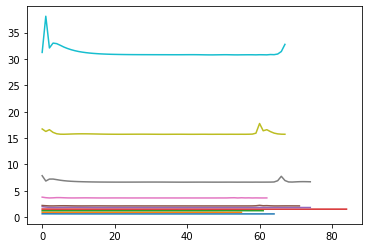

In [37]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=1, target=None,
                                     model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                     norm = 'normalize', patience=20, epochs=500, lr=5e-1, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

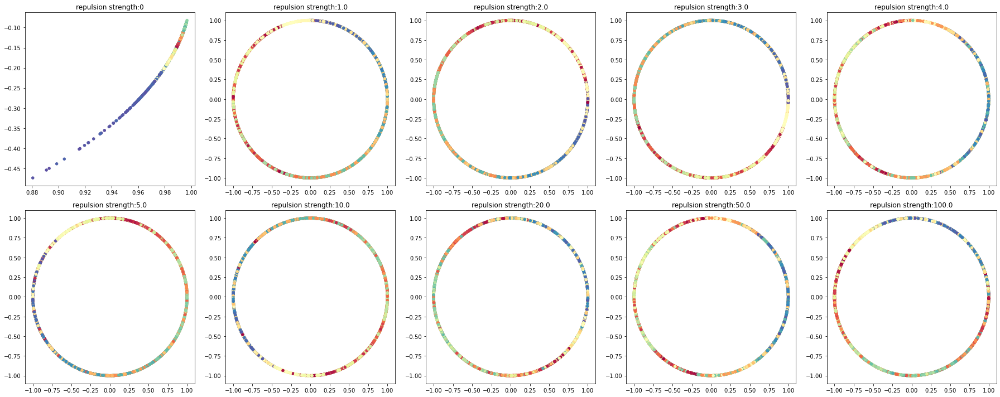

In [38]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

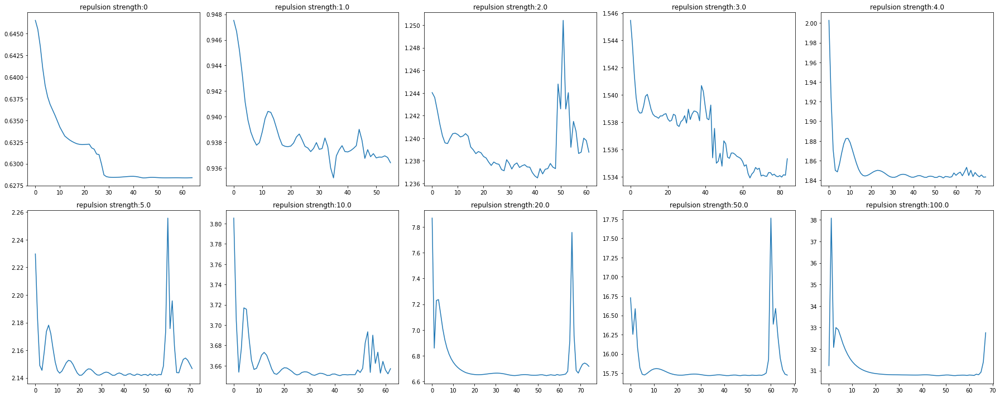

In [39]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7147, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7147, grad_fn=<AddBackward0>)
Epoch=000, loss=0.7147, time=0.0247
loss poss tensor(0.7131, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7131, grad_fn=<AddBackward0>)
Epoch=001, loss=0.7131, time=0.0235
loss poss tensor(0.7089, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7089, grad_fn=<AddBackward0>)
Epoch=002, loss=0.7089, time=0.0247
loss poss tensor(0.7068, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7068, grad_fn=<AddBackward0>)
Epoch=003, loss=0.7068, time=0.0240
loss poss tensor(0.7024, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7024, grad_fn=<AddBackward0>)
Epoch=004, loss=0.7024, time=0.0252
loss poss tensor(0.7000, grad_fn=<

Epoch=049, loss=0.6948, time=0.0238
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=050, loss=0.6948, time=0.0251
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=051, loss=0.6948, time=0.0208
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=052, loss=0.6948, time=0.0281
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=053, loss=0.6948, time=0.1401
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=054, loss=0.6948, time=0.0339
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(0.3203, grad_fn=<NegBackward0>)
loss final tensor(1.0262, grad_fn=<AddBackward0>)
Epoch=000, loss=1.0262, time=0.0244
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(0.3181, grad_fn=<NegBackward0>)
loss final tensor(1.0237, grad_fn=<AddBackward0>)
Epoch=001, loss=1.0237, time=0.0231
loss poss tensor(0.7052, grad_fn=<NegBackward0>)
loss neg tensor(0.3144, grad_fn=<NegBackward0>)
loss final tensor(1.0196, grad_fn=<AddBackward0>)
Epoch=002, loss=1.0196, time=0.0244
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(0.3103, grad_fn=<NegBackward0>)
loss final tensor(1.0151, grad_fn=<AddBackward0>)
Epoch=003, loss=1.0151, time=0.0280
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(0.3067, grad_fn=<NegBackward0>)
loss final tensor(1.0111, grad_fn=<AddBackward0>)
Epoch=004, loss=1.0111, time=0.0222
loss poss tensor(0.

Epoch=047, loss=1.0072, time=0.0245
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(0.3025, grad_fn=<NegBackward0>)
loss final tensor(1.0068, grad_fn=<AddBackward0>)
Epoch=048, loss=1.0068, time=0.0212
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(0.3031, grad_fn=<NegBackward0>)
loss final tensor(1.0073, grad_fn=<AddBackward0>)
Epoch=049, loss=1.0073, time=0.0194
loss poss tensor(0.7053, grad_fn=<NegBackward0>)
loss neg tensor(0.3020, grad_fn=<NegBackward0>)
loss final tensor(1.0073, grad_fn=<AddBackward0>)
Epoch=050, loss=1.0073, time=0.0201
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(0.3041, grad_fn=<NegBackward0>)
loss final tensor(1.0081, grad_fn=<AddBackward0>)
Epoch=051, loss=1.0081, time=0.0192
loss poss tensor(0.7038, grad_fn=<NegBackward0>)
loss neg tensor(0.3040, grad_fn=<NegBackward0>)
loss final tensor(1.0078, grad_fn=<AddBackward0>)
Epoch=052, loss=1.0078, time=0.0197
loss poss tensor(0.7049, grad_fn=<NegBackward0>)


loss neg tensor(0.3014, grad_fn=<NegBackward0>)
loss final tensor(1.0025, grad_fn=<AddBackward0>)
Epoch=094, loss=1.0025, time=0.0317
loss poss tensor(0.7014, grad_fn=<NegBackward0>)
loss neg tensor(0.3027, grad_fn=<NegBackward0>)
loss final tensor(1.0041, grad_fn=<AddBackward0>)
Epoch=095, loss=1.0041, time=0.0220
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.3034, grad_fn=<NegBackward0>)
loss final tensor(1.0035, grad_fn=<AddBackward0>)
Epoch=096, loss=1.0035, time=0.0205
loss poss tensor(0.6998, grad_fn=<NegBackward0>)
loss neg tensor(0.3029, grad_fn=<NegBackward0>)
loss final tensor(1.0028, grad_fn=<AddBackward0>)
Epoch=097, loss=1.0028, time=0.0196
loss poss tensor(0.7000, grad_fn=<NegBackward0>)
loss neg tensor(0.3021, grad_fn=<NegBackward0>)
loss final tensor(1.0021, grad_fn=<AddBackward0>)
Epoch=098, loss=1.0021, time=0.0198
loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(0.3017, grad_fn=<NegBackward0>)
loss final tensor(1.0022, grad_fn=<Ad

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7036, grad_fn=<NegBackward0>)
loss neg tensor(0.6118, grad_fn=<NegBackward0>)
loss final tensor(1.3154, grad_fn=<AddBackward0>)
Epoch=000, loss=1.3154, time=0.0216
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(0.6085, grad_fn=<NegBackward0>)
loss final tensor(1.3121, grad_fn=<AddBackward0>)
Epoch=001, loss=1.3121, time=0.0235
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(0.6046, grad_fn=<NegBackward0>)
loss final tensor(1.3087, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3087, time=0.0205
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(0.6023, grad_fn=<NegBackward0>)
loss final tensor(1.3063, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3063, time=0.0201
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(0.6022, grad_fn=<NegBackward0>)
loss final tensor(1.3068, grad_fn=<AddBackward0>)
Epoch=004, loss=1.3068, time=0.0214
loss poss tensor(0.

Epoch=046, loss=1.3008, time=0.1274
loss poss tensor(0.7003, grad_fn=<NegBackward0>)
loss neg tensor(0.6008, grad_fn=<NegBackward0>)
loss final tensor(1.3011, grad_fn=<AddBackward0>)
Epoch=047, loss=1.3011, time=0.0517
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6004, grad_fn=<NegBackward0>)
loss final tensor(1.3006, grad_fn=<AddBackward0>)
Epoch=048, loss=1.3006, time=0.0209
loss poss tensor(0.7003, grad_fn=<NegBackward0>)
loss neg tensor(0.6007, grad_fn=<NegBackward0>)
loss final tensor(1.3010, grad_fn=<AddBackward0>)
Epoch=049, loss=1.3010, time=0.0191
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6004, grad_fn=<NegBackward0>)
loss final tensor(1.3006, grad_fn=<AddBackward0>)
Epoch=050, loss=1.3006, time=0.0185
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6008, grad_fn=<NegBackward0>)
loss final tensor(1.3010, grad_fn=<AddBackward0>)
Epoch=051, loss=1.3010, time=0.0188
loss poss tensor(0.7004, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7021, grad_fn=<NegBackward0>)
loss neg tensor(0.9327, grad_fn=<NegBackward0>)
loss final tensor(1.6348, grad_fn=<AddBackward0>)
Epoch=000, loss=1.6348, time=0.0210
loss poss tensor(0.7019, grad_fn=<NegBackward0>)
loss neg tensor(0.9275, grad_fn=<NegBackward0>)
loss final tensor(1.6294, grad_fn=<AddBackward0>)
Epoch=001, loss=1.6294, time=0.0198
loss poss tensor(0.7017, grad_fn=<NegBackward0>)
loss neg tensor(0.9198, grad_fn=<NegBackward0>)
loss final tensor(1.6215, grad_fn=<AddBackward0>)
Epoch=002, loss=1.6215, time=0.0198
loss poss tensor(0.7019, grad_fn=<NegBackward0>)
loss neg tensor(0.9132, grad_fn=<NegBackward0>)
loss final tensor(1.6151, grad_fn=<AddBackward0>)
Epoch=003, loss=1.6151, time=0.0187
loss poss tensor(0.7024, grad_fn=<NegBackward0>)
loss neg tensor(0.9096, grad_fn=<NegBackward0>)
loss final tensor(1.6119, grad_fn=<AddBackward0>)
Epoch=004, loss=1.6119, time=0.0230
loss poss tensor(0.

Epoch=047, loss=1.6101, time=0.0230
loss poss tensor(0.7013, grad_fn=<NegBackward0>)
loss neg tensor(0.9088, grad_fn=<NegBackward0>)
loss final tensor(1.6101, grad_fn=<AddBackward0>)
Epoch=048, loss=1.6101, time=0.0244
loss poss tensor(0.7010, grad_fn=<NegBackward0>)
loss neg tensor(0.9088, grad_fn=<NegBackward0>)
loss final tensor(1.6098, grad_fn=<AddBackward0>)
Epoch=049, loss=1.6098, time=0.0226
loss poss tensor(0.7007, grad_fn=<NegBackward0>)
loss neg tensor(0.9090, grad_fn=<NegBackward0>)
loss final tensor(1.6098, grad_fn=<AddBackward0>)
Epoch=050, loss=1.6098, time=0.0227
loss poss tensor(0.7003, grad_fn=<NegBackward0>)
loss neg tensor(0.9093, grad_fn=<NegBackward0>)
loss final tensor(1.6097, grad_fn=<AddBackward0>)
Epoch=051, loss=1.6097, time=0.0236
loss poss tensor(0.7008, grad_fn=<NegBackward0>)
loss neg tensor(0.9095, grad_fn=<NegBackward0>)
loss final tensor(1.6103, grad_fn=<AddBackward0>)
Epoch=052, loss=1.6103, time=0.0252
loss poss tensor(0.7010, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7084, grad_fn=<NegBackward0>)
loss neg tensor(1.3412, grad_fn=<NegBackward0>)
loss final tensor(2.0496, grad_fn=<AddBackward0>)
Epoch=000, loss=2.0496, time=0.0217
loss poss tensor(0.7051, grad_fn=<NegBackward0>)
loss neg tensor(1.2414, grad_fn=<NegBackward0>)
loss final tensor(1.9465, grad_fn=<AddBackward0>)
Epoch=001, loss=1.9465, time=0.0201
loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor(1.2148, grad_fn=<NegBackward0>)
loss final tensor(1.9182, grad_fn=<AddBackward0>)
Epoch=002, loss=1.9182, time=0.0250
loss poss tensor(0.7033, grad_fn=<NegBackward0>)
loss neg tensor(1.2284, grad_fn=<NegBackward0>)
loss final tensor(1.9316, grad_fn=<AddBackward0>)
Epoch=003, loss=1.9316, time=0.0250
loss poss tensor(0.7030, grad_fn=<NegBackward0>)
loss neg tensor(1.2468, grad_fn=<NegBackward0>)
loss final tensor(1.9497, grad_fn=<AddBackward0>)
Epoch=004, loss=1.9497, time=0.0217
loss poss tensor(0.

loss poss tensor(0.7012, grad_fn=<NegBackward0>)
loss neg tensor(1.2091, grad_fn=<NegBackward0>)
loss final tensor(1.9103, grad_fn=<AddBackward0>)
Epoch=046, loss=1.9103, time=0.0349
loss poss tensor(0.7012, grad_fn=<NegBackward0>)
loss neg tensor(1.2098, grad_fn=<NegBackward0>)
loss final tensor(1.9110, grad_fn=<AddBackward0>)
Epoch=047, loss=1.9110, time=0.0496
loss poss tensor(0.7014, grad_fn=<NegBackward0>)
loss neg tensor(1.2108, grad_fn=<NegBackward0>)
loss final tensor(1.9122, grad_fn=<AddBackward0>)
Epoch=048, loss=1.9122, time=0.0301
loss poss tensor(0.7014, grad_fn=<NegBackward0>)
loss neg tensor(1.2095, grad_fn=<NegBackward0>)
loss final tensor(1.9109, grad_fn=<AddBackward0>)
Epoch=049, loss=1.9109, time=0.0272
loss poss tensor(0.7015, grad_fn=<NegBackward0>)
loss neg tensor(1.2096, grad_fn=<NegBackward0>)
loss final tensor(1.9111, grad_fn=<AddBackward0>)
Epoch=050, loss=1.9111, time=0.0244
loss poss tensor(0.7015, grad_fn=<NegBackward0>)
loss neg tensor(1.2104, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7087, grad_fn=<NegBackward0>)
loss neg tensor(1.6666, grad_fn=<NegBackward0>)
loss final tensor(2.3753, grad_fn=<AddBackward0>)
Epoch=000, loss=2.3753, time=0.0216
loss poss tensor(0.7071, grad_fn=<NegBackward0>)
loss neg tensor(1.6083, grad_fn=<NegBackward0>)
loss final tensor(2.3155, grad_fn=<AddBackward0>)
Epoch=001, loss=2.3155, time=0.0212
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(1.5502, grad_fn=<NegBackward0>)
loss final tensor(2.2558, grad_fn=<AddBackward0>)
Epoch=002, loss=2.2558, time=0.0226
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(1.5177, grad_fn=<NegBackward0>)
loss final tensor(2.2227, grad_fn=<AddBackward0>)
Epoch=003, loss=2.2227, time=0.0231
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(1.5091, grad_fn=<NegBackward0>)
loss final tensor(2.2140, grad_fn=<AddBackward0>)
Epoch=004, loss=2.2140, time=0.0198
loss poss tensor(0.

loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(1.5082, grad_fn=<NegBackward0>)
loss final tensor(2.2127, grad_fn=<AddBackward0>)
Epoch=047, loss=2.2127, time=0.0293
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(1.5099, grad_fn=<NegBackward0>)
loss final tensor(2.2146, grad_fn=<AddBackward0>)
Epoch=048, loss=2.2146, time=0.0212
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(1.5107, grad_fn=<NegBackward0>)
loss final tensor(2.2154, grad_fn=<AddBackward0>)
Epoch=049, loss=2.2154, time=0.0220
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(1.5091, grad_fn=<NegBackward0>)
loss final tensor(2.2140, grad_fn=<AddBackward0>)
Epoch=050, loss=2.2140, time=0.0233
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(1.5087, grad_fn=<NegBackward0>)
loss final tensor(2.2136, grad_fn=<AddBackward0>)
Epoch=051, loss=2.2136, time=0.0238
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(1.5102, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7058, grad_fn=<NegBackward0>)
loss neg tensor(3.2750, grad_fn=<NegBackward0>)
loss final tensor(3.9807, grad_fn=<AddBackward0>)
Epoch=000, loss=3.9807, time=0.0210
loss poss tensor(0.7033, grad_fn=<NegBackward0>)
loss neg tensor(3.0264, grad_fn=<NegBackward0>)
loss final tensor(3.7297, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7297, time=0.0206
loss poss tensor(0.7033, grad_fn=<NegBackward0>)
loss neg tensor(3.0793, grad_fn=<NegBackward0>)
loss final tensor(3.7827, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7827, time=0.0209
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(3.1397, grad_fn=<NegBackward0>)
loss final tensor(3.8437, grad_fn=<AddBackward0>)
Epoch=003, loss=3.8437, time=0.0236
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(3.1233, grad_fn=<NegBackward0>)
loss final tensor(3.8276, grad_fn=<AddBackward0>)
Epoch=004, loss=3.8276, time=0.0224
loss poss tensor(0.

loss neg tensor(3.0135, grad_fn=<NegBackward0>)
loss final tensor(3.7157, grad_fn=<AddBackward0>)
Epoch=046, loss=3.7157, time=0.0250
loss poss tensor(0.7023, grad_fn=<NegBackward0>)
loss neg tensor(3.0135, grad_fn=<NegBackward0>)
loss final tensor(3.7158, grad_fn=<AddBackward0>)
Epoch=047, loss=3.7158, time=0.0202
loss poss tensor(0.7020, grad_fn=<NegBackward0>)
loss neg tensor(3.0100, grad_fn=<NegBackward0>)
loss final tensor(3.7120, grad_fn=<AddBackward0>)
Epoch=048, loss=3.7120, time=0.0208
loss poss tensor(0.7026, grad_fn=<NegBackward0>)
loss neg tensor(3.0169, grad_fn=<NegBackward0>)
loss final tensor(3.7195, grad_fn=<AddBackward0>)
Epoch=049, loss=3.7195, time=0.0227
loss poss tensor(0.7027, grad_fn=<NegBackward0>)
loss neg tensor(3.0191, grad_fn=<NegBackward0>)
loss final tensor(3.7218, grad_fn=<AddBackward0>)
Epoch=050, loss=3.7218, time=0.0247
loss poss tensor(0.7033, grad_fn=<NegBackward0>)
loss neg tensor(3.0146, grad_fn=<NegBackward0>)
loss final tensor(3.7179, grad_fn=<Ad

Epoch=091, loss=3.7100, time=0.0247
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(3.0090, grad_fn=<NegBackward0>)
loss final tensor(3.7096, grad_fn=<AddBackward0>)
Epoch=092, loss=3.7096, time=0.0242
loss poss tensor(0.7005, grad_fn=<NegBackward0>)
loss neg tensor(3.0100, grad_fn=<NegBackward0>)
loss final tensor(3.7105, grad_fn=<AddBackward0>)
Epoch=093, loss=3.7105, time=0.0265
loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(3.0086, grad_fn=<NegBackward0>)
loss final tensor(3.7090, grad_fn=<AddBackward0>)
Epoch=094, loss=3.7090, time=0.0223
loss poss tensor(0.7003, grad_fn=<NegBackward0>)
loss neg tensor(3.0087, grad_fn=<NegBackward0>)
loss final tensor(3.7090, grad_fn=<AddBackward0>)
Epoch=095, loss=3.7090, time=0.0294
loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(3.0084, grad_fn=<NegBackward0>)
loss final tensor(3.7088, grad_fn=<AddBackward0>)
Epoch=096, loss=3.7088, time=0.0235
loss poss tensor(0.7009, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7065, grad_fn=<NegBackward0>)
loss neg tensor(6.4017, grad_fn=<NegBackward0>)
loss final tensor(7.1081, grad_fn=<AddBackward0>)
Epoch=000, loss=7.1081, time=0.0256
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(6.4232, grad_fn=<NegBackward0>)
loss final tensor(7.1287, grad_fn=<AddBackward0>)
Epoch=001, loss=7.1287, time=0.0252
loss poss tensor(0.7069, grad_fn=<NegBackward0>)
loss neg tensor(6.4011, grad_fn=<NegBackward0>)
loss final tensor(7.1080, grad_fn=<AddBackward0>)
Epoch=002, loss=7.1080, time=0.0214
loss poss tensor(0.7064, grad_fn=<NegBackward0>)
loss neg tensor(6.1831, grad_fn=<NegBackward0>)
loss final tensor(6.8895, grad_fn=<AddBackward0>)
Epoch=003, loss=6.8895, time=0.0252
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(6.0867, grad_fn=<NegBackward0>)
loss final tensor(6.7917, grad_fn=<AddBackward0>)
Epoch=004, loss=6.7917, time=0.0196
loss poss tensor(0.

loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(6.0341, grad_fn=<NegBackward0>)
loss final tensor(6.7390, grad_fn=<AddBackward0>)
Epoch=051, loss=6.7390, time=0.0241
loss poss tensor(0.7053, grad_fn=<NegBackward0>)
loss neg tensor(6.0316, grad_fn=<NegBackward0>)
loss final tensor(6.7368, grad_fn=<AddBackward0>)
Epoch=052, loss=6.7368, time=0.0235
loss poss tensor(0.7057, grad_fn=<NegBackward0>)
loss neg tensor(6.0360, grad_fn=<NegBackward0>)
loss final tensor(6.7416, grad_fn=<AddBackward0>)
Epoch=053, loss=6.7416, time=0.0221
loss poss tensor(0.7052, grad_fn=<NegBackward0>)
loss neg tensor(6.0315, grad_fn=<NegBackward0>)
loss final tensor(6.7367, grad_fn=<AddBackward0>)
Epoch=054, loss=6.7367, time=0.0198
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(6.0349, grad_fn=<NegBackward0>)
loss final tensor(6.7398, grad_fn=<AddBackward0>)
Epoch=055, loss=6.7398, time=0.0204
loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(6.0350, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7029, grad_fn=<NegBackward0>)
loss neg tensor(15.3882, grad_fn=<NegBackward0>)
loss final tensor(16.0912, grad_fn=<AddBackward0>)
Epoch=000, loss=16.0912, time=0.0213
loss poss tensor(0.7024, grad_fn=<NegBackward0>)
loss neg tensor(15.1395, grad_fn=<NegBackward0>)
loss final tensor(15.8419, grad_fn=<AddBackward0>)
Epoch=001, loss=15.8419, time=0.0212
loss poss tensor(0.7027, grad_fn=<NegBackward0>)
loss neg tensor(15.3307, grad_fn=<NegBackward0>)
loss final tensor(16.0334, grad_fn=<AddBackward0>)
Epoch=002, loss=16.0334, time=0.0230
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(15.1304, grad_fn=<NegBackward0>)
loss final tensor(15.8337, grad_fn=<AddBackward0>)
Epoch=003, loss=15.8337, time=0.0203
loss poss tensor(0.7039, grad_fn=<NegBackward0>)
loss neg tensor(15.0693, grad_fn=<NegBackward0>)
loss final tensor(15.7732, grad_fn=<AddBackward0>)
Epoch=004, loss=15.7732, time=0.0216
loss

loss neg tensor(15.0231, grad_fn=<NegBackward0>)
loss final tensor(15.7286, grad_fn=<AddBackward0>)
Epoch=044, loss=15.7286, time=0.0243
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(15.0132, grad_fn=<NegBackward0>)
loss final tensor(15.7180, grad_fn=<AddBackward0>)
Epoch=045, loss=15.7180, time=0.0214
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(15.0099, grad_fn=<NegBackward0>)
loss final tensor(15.7142, grad_fn=<AddBackward0>)
Epoch=046, loss=15.7142, time=0.0192
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(15.0195, grad_fn=<NegBackward0>)
loss final tensor(15.7244, grad_fn=<AddBackward0>)
Epoch=047, loss=15.7244, time=0.0194
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(15.0166, grad_fn=<NegBackward0>)
loss final tensor(15.7213, grad_fn=<AddBackward0>)
Epoch=048, loss=15.7213, time=0.0223
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(15.0206, grad_fn=<NegBackward0>)
loss final tensor(15.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(30.3441, grad_fn=<NegBackward0>)
loss final tensor(31.0487, grad_fn=<AddBackward0>)
Epoch=000, loss=31.0487, time=0.0196
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(30.5533, grad_fn=<NegBackward0>)
loss final tensor(31.2570, grad_fn=<AddBackward0>)
Epoch=001, loss=31.2570, time=0.0196
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(30.3498, grad_fn=<NegBackward0>)
loss final tensor(31.0542, grad_fn=<AddBackward0>)
Epoch=002, loss=31.0542, time=0.0197
loss poss tensor(0.7051, grad_fn=<NegBackward0>)
loss neg tensor(30.2718, grad_fn=<NegBackward0>)
loss final tensor(30.9768, grad_fn=<AddBackward0>)
Epoch=003, loss=30.9768, time=0.0194
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(30.2705, grad_fn=<NegBackward0>)
loss final tensor(30.9760, grad_fn=<AddBackward0>)
Epoch=004, loss=30.9760, time=0.0232
loss

Epoch=047, loss=30.7540, time=0.0232
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(30.0739, grad_fn=<NegBackward0>)
loss final tensor(30.7786, grad_fn=<AddBackward0>)
Epoch=048, loss=30.7786, time=0.0207
loss poss tensor(0.7054, grad_fn=<NegBackward0>)
loss neg tensor(30.1292, grad_fn=<NegBackward0>)
loss final tensor(30.8346, grad_fn=<AddBackward0>)
Epoch=049, loss=30.8346, time=0.0199
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(30.0819, grad_fn=<NegBackward0>)
loss final tensor(30.7868, grad_fn=<AddBackward0>)
Epoch=050, loss=30.7868, time=0.0195
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(30.0666, grad_fn=<NegBackward0>)
loss final tensor(30.7712, grad_fn=<AddBackward0>)
Epoch=051, loss=30.7712, time=0.0243
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(30.0416, grad_fn=<NegBackward0>)
loss final tensor(30.7465, grad_fn=<AddBackward0>)
Epoch=052, loss=30.7465, time=0.0221
loss poss tensor(0.7046, grad_fn=

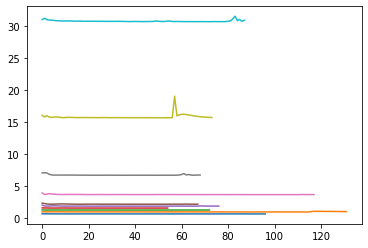

In [40]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=1, target=None,
                                  model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                  norm = 'normalize', patience=20, epochs=500, lr=5e-1, wd=1e-2,
                                  min_dist=0.1, name_file="1", subsampling=None,
                                  spread = 1.0, repulsion_strength=repulsion_strength[i],
                                  device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

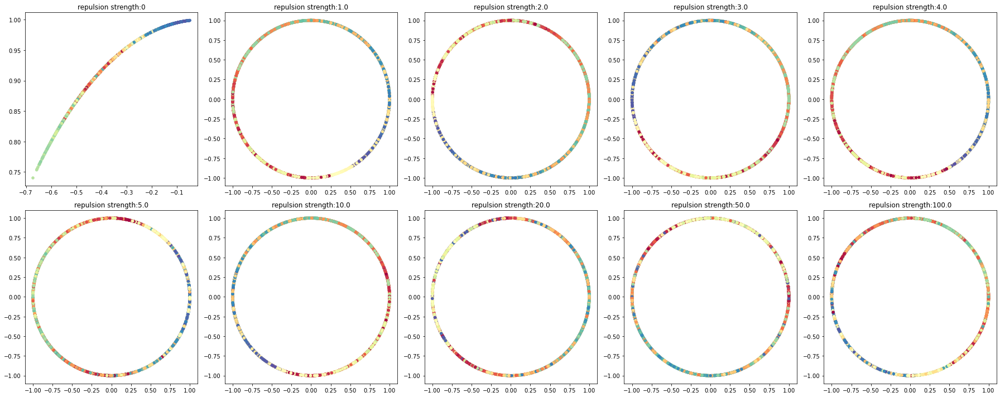

In [41]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

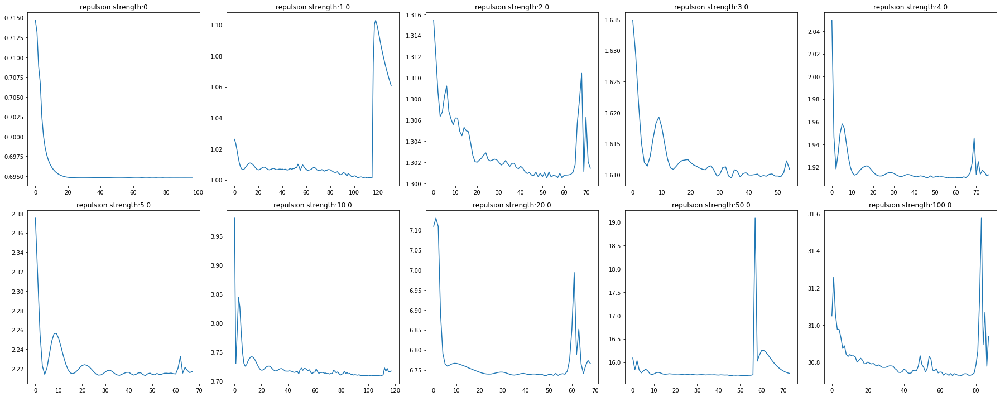

In [42]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

### GNN-col_uniform

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.6286, time=0.0248
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.6286, time=0.0212
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.6286, time=0.0207
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.6286, time=0.0219
loss poss tensor(0.6286, dtype=torch.float64, 

loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=0.6286, time=0.0214
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=0.6286, time=0.0235
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=0.6286, time=0.0207
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=0.6286, time=0.0191
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=085, loss=0.6286, time=0.0250
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=086, loss=0.6286, time=0.0180
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=087, loss=0.6286, time=0.0208
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=088, loss=0.6286, time=0.0199
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Epoch=122, loss=0.6286, time=0.0253
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=123, loss=0.6286, time=0.0203
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=124, loss=0.6286, time=0.0211
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=125, loss=0.6286, time=0.0204
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=126, loss=0.6286, time=0.0196
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Epoch=169, loss=0.6286, time=0.0167
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=170, loss=0.6286, time=0.0193
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=171, loss=0.6286, time=0.0168
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=172, loss=0.6286, time=0.0188
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=173, loss=0.6286, time=0.0175
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Epoch=212, loss=0.6286, time=0.0161
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=213, loss=0.6286, time=0.0211
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=214, loss=0.6286, time=0.0142
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=215, loss=0.6286, time=0.0147
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=216, loss=0.6286, time=0.0154
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=260, loss=0.6286, time=0.0246
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=261, loss=0.6286, time=0.0189
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=262, loss=0.6286, time=0.0184
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=263, loss=0.6286, time=0.0177
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Epoch=299, loss=0.6286, time=0.0338
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=300, loss=0.6286, time=0.0334
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=301, loss=0.6286, time=0.0356
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=302, loss=0.6286, time=0.1321
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=303, loss=0.6286, time=0.0244
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Epoch=336, loss=0.6286, time=0.0173
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=337, loss=0.6286, time=0.0240
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=338, loss=0.6286, time=0.0232
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=339, loss=0.6286, time=0.0152
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=340, loss=0.6286, time=0.0165
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Epoch=383, loss=0.6286, time=0.0165
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=384, loss=0.6286, time=0.0197
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=385, loss=0.6286, time=0.0146
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=386, loss=0.6286, time=0.0145
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=387, loss=0.6286, time=0.0166
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=429, loss=0.6286, time=0.0233
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=430, loss=0.6286, time=0.0179
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=431, loss=0.6286, time=0.0147
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=432, loss=0.6286, time=0.0140
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Epoch=474, loss=0.6286, time=0.0198
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=475, loss=0.6286, time=0.0174
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=476, loss=0.6286, time=0.0145
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=477, loss=0.6286, time=0.0150
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=478, loss=0.6286, time=0.0145
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5796, grad_fn=<NegBackward0>)
loss final tensor(1.2082, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2082, time=0.0159
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5794, grad_fn=<NegBackward0>)
loss final tensor(1.2080, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2080, time=0.0161
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5792, grad_fn=<NegBackward0>)
loss final tensor(1.2078, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2078, time=0.0162
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5788, grad_fn=<NegBackward0>)
loss final tensor(1.2074, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2074, time=0.0197
loss poss tensor(0.6286, dtype=tor

Epoch=039, loss=1.1855, time=0.0218
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5566, grad_fn=<NegBackward0>)
loss final tensor(1.1853, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.1853, time=0.0145
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5570, grad_fn=<NegBackward0>)
loss final tensor(1.1857, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.1857, time=0.0147
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5572, grad_fn=<NegBackward0>)
loss final tensor(1.1859, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=1.1859, time=0.0232
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5573, grad_fn=<NegBackward0>)
loss final tensor(1.1860, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=1.1860, time=0.0162
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5542, grad_fn=<NegBackward0>)
loss final tensor(1.1829, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=1.1829, time=0.0227
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5541, grad_fn=<NegBackward0>)
loss final tensor(1.1828, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=1.1828, time=0.0186
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5540, grad_fn=<NegBackward0>)
loss final tensor(1.1827, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=1.1827, time=0.0162
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5539, grad_fn=<NegBackward0>)
loss final tensor(1.1826, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=1.1826, time=0.0190
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5539, grad_f

loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5513, grad_fn=<NegBackward0>)
loss final tensor(1.1800, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=119, loss=1.1800, time=0.0216
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5512, grad_fn=<NegBackward0>)
loss final tensor(1.1799, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=120, loss=1.1799, time=0.0145
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5511, grad_fn=<NegBackward0>)
loss final tensor(1.1798, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=121, loss=1.1798, time=0.0157
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5510, grad_fn=<NegBackward0>)
loss final tensor(1.1797, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=122, loss=1.1797, time=0.0195
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5510, grad_f

Epoch=156, loss=1.1769, time=0.0185
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5481, grad_fn=<NegBackward0>)
loss final tensor(1.1768, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=157, loss=1.1768, time=0.0166
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5480, grad_fn=<NegBackward0>)
loss final tensor(1.1767, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=158, loss=1.1767, time=0.0206
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5479, grad_fn=<NegBackward0>)
loss final tensor(1.1767, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=159, loss=1.1767, time=0.0198
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5478, grad_fn=<NegBackward0>)
loss final tensor(1.1766, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=160, loss=1.1766, time=0.0200
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

loss neg tensor(0.5435, grad_fn=<NegBackward0>)
loss final tensor(1.1722, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=201, loss=1.1722, time=0.0258
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5434, grad_fn=<NegBackward0>)
loss final tensor(1.1721, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=202, loss=1.1721, time=0.0210
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5433, grad_fn=<NegBackward0>)
loss final tensor(1.1721, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=203, loss=1.1721, time=0.0322
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5432, grad_fn=<NegBackward0>)
loss final tensor(1.1719, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=204, loss=1.1719, time=0.0233
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5430, grad_fn=<NegBackward0>)
loss final tensor(1.1718, dtype=torch.float64, grad_

Epoch=240, loss=1.1669, time=0.0193
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5379, grad_fn=<NegBackward0>)
loss final tensor(1.1667, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=241, loss=1.1667, time=0.0175
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5378, grad_fn=<NegBackward0>)
loss final tensor(1.1666, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=242, loss=1.1666, time=0.0181
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5376, grad_fn=<NegBackward0>)
loss final tensor(1.1664, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=243, loss=1.1664, time=0.0158
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5375, grad_fn=<NegBackward0>)
loss final tensor(1.1662, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=244, loss=1.1662, time=0.0170
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=284, loss=1.1582, time=0.0179
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5292, grad_fn=<NegBackward0>)
loss final tensor(1.1580, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=285, loss=1.1580, time=0.0229
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5290, grad_fn=<NegBackward0>)
loss final tensor(1.1578, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=286, loss=1.1578, time=0.0169
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5288, grad_fn=<NegBackward0>)
loss final tensor(1.1576, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=287, loss=1.1576, time=0.0174
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5285, grad_fn=<NegBackward0>)
loss final tensor(1.1574, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=288, loss=1.1574, time=0.0220
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=328, loss=1.1533, time=0.0219
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5244, grad_fn=<NegBackward0>)
loss final tensor(1.1533, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=329, loss=1.1533, time=0.0164
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5244, grad_fn=<NegBackward0>)
loss final tensor(1.1533, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=330, loss=1.1533, time=0.0157
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5244, grad_fn=<NegBackward0>)
loss final tensor(1.1533, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=331, loss=1.1533, time=0.0178
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5244, grad_fn=<NegBackward0>)
loss final tensor(1.1533, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=332, loss=1.1533, time=0.0180
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=371, loss=1.1530, time=0.0231
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5241, grad_fn=<NegBackward0>)
loss final tensor(1.1530, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=372, loss=1.1530, time=0.0429
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5241, grad_fn=<NegBackward0>)
loss final tensor(1.1530, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=373, loss=1.1530, time=0.0205
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5241, grad_fn=<NegBackward0>)
loss final tensor(1.1529, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=374, loss=1.1529, time=0.0205
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5241, grad_fn=<NegBackward0>)
loss final tensor(1.1529, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=375, loss=1.1529, time=0.0209
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5239, grad_fn=<NegBackward0>)
loss final tensor(1.1527, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=418, loss=1.1527, time=0.0222
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5239, grad_fn=<NegBackward0>)
loss final tensor(1.1527, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=419, loss=1.1527, time=0.0166
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5239, grad_fn=<NegBackward0>)
loss final tensor(1.1527, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=420, loss=1.1527, time=0.0153
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5238, grad_fn=<NegBackward0>)
loss final tensor(1.1527, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=421, loss=1.1527, time=0.0136
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5238, grad_f

loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5237, grad_fn=<NegBackward0>)
loss final tensor(1.1526, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=460, loss=1.1526, time=0.0257
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5237, grad_fn=<NegBackward0>)
loss final tensor(1.1526, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=461, loss=1.1526, time=0.0184
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5237, grad_fn=<NegBackward0>)
loss final tensor(1.1526, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=462, loss=1.1526, time=0.0149
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5237, grad_fn=<NegBackward0>)
loss final tensor(1.1526, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=463, loss=1.1526, time=0.0155
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5237, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1875, grad_fn=<NegBackward0>)
loss final tensor(1.8163, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.8163, time=0.0174
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1868, grad_fn=<NegBackward0>)
loss final tensor(1.8155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.8155, time=0.0128
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1854, grad_fn=<NegBackward0>)
loss final tensor(1.8142, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.8142, time=0.0142
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1835, grad_fn=<NegBackward0>)
loss final tensor(1.8122, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.8122, time=0.0154
loss poss tensor(0.6287, dtype=tor

Epoch=038, loss=1.7730, time=0.0190
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1439, grad_fn=<NegBackward0>)
loss final tensor(1.7727, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=1.7727, time=0.0140
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1435, grad_fn=<NegBackward0>)
loss final tensor(1.7722, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.7722, time=0.0156
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1430, grad_fn=<NegBackward0>)
loss final tensor(1.7718, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.7718, time=0.0153
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1424, grad_fn=<NegBackward0>)
loss final tensor(1.7712, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=1.7712, time=0.0157
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=075, loss=1.7508, time=0.0249
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1219, grad_fn=<NegBackward0>)
loss final tensor(1.7507, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=1.7507, time=0.0244
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1216, grad_fn=<NegBackward0>)
loss final tensor(1.7503, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=1.7503, time=0.0221
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1208, grad_fn=<NegBackward0>)
loss final tensor(1.7496, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=1.7496, time=0.0241
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1199, grad_fn=<NegBackward0>)
loss final tensor(1.7487, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=1.7487, time=0.0275
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=114, loss=1.7344, time=0.0238
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1056, grad_fn=<NegBackward0>)
loss final tensor(1.7344, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=1.7344, time=0.0271
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1056, grad_fn=<NegBackward0>)
loss final tensor(1.7343, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=116, loss=1.7343, time=0.0232
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1055, grad_fn=<NegBackward0>)
loss final tensor(1.7343, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=117, loss=1.7343, time=0.0292
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1054, grad_fn=<NegBackward0>)
loss final tensor(1.7341, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=118, loss=1.7341, time=0.0254
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

loss neg tensor(1.1023, grad_fn=<NegBackward0>)
loss final tensor(1.7310, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=152, loss=1.7310, time=0.0284
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1022, grad_fn=<NegBackward0>)
loss final tensor(1.7309, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=153, loss=1.7309, time=0.0259
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1021, grad_fn=<NegBackward0>)
loss final tensor(1.7308, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=154, loss=1.7308, time=0.0255
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1020, grad_fn=<NegBackward0>)
loss final tensor(1.7308, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=155, loss=1.7308, time=0.0236
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1019, grad_fn=<NegBackward0>)
loss final tensor(1.7307, dtype=torch.float64, grad_

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0985, grad_fn=<NegBackward0>)
loss final tensor(1.7273, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=193, loss=1.7273, time=0.0283
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0984, grad_fn=<NegBackward0>)
loss final tensor(1.7272, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=194, loss=1.7272, time=0.0231
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0983, grad_fn=<NegBackward0>)
loss final tensor(1.7271, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=195, loss=1.7271, time=0.0227
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0982, grad_fn=<NegBackward0>)
loss final tensor(1.7270, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=196, loss=1.7270, time=0.0238
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0981, grad_f

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0937, grad_fn=<NegBackward0>)
loss final tensor(1.7225, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=231, loss=1.7225, time=0.0271
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0936, grad_fn=<NegBackward0>)
loss final tensor(1.7224, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=232, loss=1.7224, time=0.0241
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0934, grad_fn=<NegBackward0>)
loss final tensor(1.7222, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=233, loss=1.7222, time=0.0237
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0933, grad_fn=<NegBackward0>)
loss final tensor(1.7221, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=234, loss=1.7221, time=0.0239
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0931, grad_f

Epoch=279, loss=1.7157, time=0.0148
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0867, grad_fn=<NegBackward0>)
loss final tensor(1.7155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=280, loss=1.7155, time=0.0180
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0865, grad_fn=<NegBackward0>)
loss final tensor(1.7154, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=281, loss=1.7154, time=0.0131
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0864, grad_fn=<NegBackward0>)
loss final tensor(1.7152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=282, loss=1.7152, time=0.0120
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0862, grad_fn=<NegBackward0>)
loss final tensor(1.7150, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=283, loss=1.7150, time=0.0146
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=317, loss=1.7096, time=0.0280
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0807, grad_fn=<NegBackward0>)
loss final tensor(1.7095, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=318, loss=1.7095, time=0.0275
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0806, grad_fn=<NegBackward0>)
loss final tensor(1.7094, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=319, loss=1.7094, time=0.0214
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0804, grad_fn=<NegBackward0>)
loss final tensor(1.7092, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=320, loss=1.7092, time=0.0210
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0803, grad_fn=<NegBackward0>)
loss final tensor(1.7091, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=321, loss=1.7091, time=0.0211
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=364, loss=1.7027, time=0.0178
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0737, grad_fn=<NegBackward0>)
loss final tensor(1.7026, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=365, loss=1.7026, time=0.0147
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0736, grad_fn=<NegBackward0>)
loss final tensor(1.7024, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=366, loss=1.7024, time=0.0141
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0734, grad_fn=<NegBackward0>)
loss final tensor(1.7023, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=367, loss=1.7023, time=0.0155
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0732, grad_fn=<NegBackward0>)
loss final tensor(1.7021, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=368, loss=1.7021, time=0.0150
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=403, loss=1.6967, time=0.0163
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0677, grad_fn=<NegBackward0>)
loss final tensor(1.6966, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=404, loss=1.6966, time=0.0185
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0676, grad_fn=<NegBackward0>)
loss final tensor(1.6964, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=405, loss=1.6964, time=0.0133
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0674, grad_fn=<NegBackward0>)
loss final tensor(1.6963, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=406, loss=1.6963, time=0.0154
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0673, grad_fn=<NegBackward0>)
loss final tensor(1.6961, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=407, loss=1.6961, time=0.0147
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0625, grad_fn=<NegBackward0>)
loss final tensor(1.6914, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=443, loss=1.6914, time=0.0196
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0624, grad_fn=<NegBackward0>)
loss final tensor(1.6913, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=444, loss=1.6913, time=0.0157
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0623, grad_fn=<NegBackward0>)
loss final tensor(1.6912, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=445, loss=1.6912, time=0.0161
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0622, grad_fn=<NegBackward0>)
loss final tensor(1.6911, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=446, loss=1.6911, time=0.0158
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0621, grad_f

loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0601, grad_fn=<NegBackward0>)
loss final tensor(1.6890, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=482, loss=1.6890, time=0.0225
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0601, grad_fn=<NegBackward0>)
loss final tensor(1.6890, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=483, loss=1.6890, time=0.0149
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0601, grad_fn=<NegBackward0>)
loss final tensor(1.6890, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=484, loss=1.6890, time=0.0137
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0600, grad_fn=<NegBackward0>)
loss final tensor(1.6890, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=485, loss=1.6890, time=0.0145
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0600, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7398, grad_fn=<NegBackward0>)
loss final tensor(2.3683, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.3683, time=0.0153
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7394, grad_fn=<NegBackward0>)
loss final tensor(2.3679, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.3679, time=0.0152
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7387, grad_fn=<NegBackward0>)
loss final tensor(2.3672, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.3672, time=0.0172
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7376, grad_fn=<NegBackward0>)
loss final tensor(2.3662, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.3662, time=0.0185
loss poss tensor(0.6285, dtype=tor

Epoch=040, loss=2.2605, time=0.0157
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6315, grad_fn=<NegBackward0>)
loss final tensor(2.2601, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=2.2601, time=0.0187
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6310, grad_fn=<NegBackward0>)
loss final tensor(2.2596, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=2.2596, time=0.0159
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6302, grad_fn=<NegBackward0>)
loss final tensor(2.2589, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=2.2589, time=0.0166
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6293, grad_fn=<NegBackward0>)
loss final tensor(2.2580, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=2.2580, time=0.0167
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=080, loss=2.2329, time=0.0156
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6039, grad_fn=<NegBackward0>)
loss final tensor(2.2326, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=2.2326, time=0.0174
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6033, grad_fn=<NegBackward0>)
loss final tensor(2.2320, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=082, loss=2.2320, time=0.0150
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6025, grad_fn=<NegBackward0>)
loss final tensor(2.2312, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=083, loss=2.2312, time=0.0158
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6016, grad_fn=<NegBackward0>)
loss final tensor(2.2304, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=084, loss=2.2304, time=0.0153
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5765, grad_fn=<NegBackward0>)
loss final tensor(2.2053, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=119, loss=2.2053, time=0.0197
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5752, grad_fn=<NegBackward0>)
loss final tensor(2.2040, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=120, loss=2.2040, time=0.0160
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5743, grad_fn=<NegBackward0>)
loss final tensor(2.2031, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=121, loss=2.2031, time=0.0153
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5733, grad_fn=<NegBackward0>)
loss final tensor(2.2021, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=122, loss=2.2021, time=0.0179
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5722, grad_f

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5556, grad_fn=<NegBackward0>)
loss final tensor(2.1845, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=162, loss=2.1845, time=0.0178
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5555, grad_fn=<NegBackward0>)
loss final tensor(2.1843, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=163, loss=2.1843, time=0.0153
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5554, grad_fn=<NegBackward0>)
loss final tensor(2.1842, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=164, loss=2.1842, time=0.0135
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5550, grad_fn=<NegBackward0>)
loss final tensor(2.1838, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=165, loss=2.1838, time=0.0150
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5549, grad_f

Epoch=199, loss=2.1837, time=0.0264
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5549, grad_fn=<NegBackward0>)
loss final tensor(2.1837, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=200, loss=2.1837, time=0.0155
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5549, grad_fn=<NegBackward0>)
loss final tensor(2.1837, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=201, loss=2.1837, time=0.0154
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5550, grad_fn=<NegBackward0>)
loss final tensor(2.1838, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=202, loss=2.1838, time=0.0159
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5549, grad_fn=<NegBackward0>)
loss final tensor(2.1838, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=203, loss=2.1838, time=0.0142
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.2839, grad_fn=<NegBackward0>)
loss final tensor(2.9129, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.9129, time=0.0161
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.2569, grad_fn=<NegBackward0>)
loss final tensor(2.8859, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.8859, time=0.0148
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1977, grad_fn=<NegBackward0>)
loss final tensor(2.8269, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.8269, time=0.0148
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.2274, grad_fn=<NegBackward0>)
loss final tensor(2.8564, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.8564, time=0.0164
loss poss tensor(0.6289, dtype=tor

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1697, grad_fn=<NegBackward0>)
loss final tensor(2.7985, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=2.7985, time=0.0217
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1692, grad_fn=<NegBackward0>)
loss final tensor(2.7979, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=2.7979, time=0.0147
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1661, grad_fn=<NegBackward0>)
loss final tensor(2.7949, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=2.7949, time=0.0133
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1661, grad_fn=<NegBackward0>)
loss final tensor(2.7949, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=2.7949, time=0.0163
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1658, grad_f

Epoch=077, loss=2.7801, time=0.0158
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1509, grad_fn=<NegBackward0>)
loss final tensor(2.7797, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=2.7797, time=0.0182
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1504, grad_fn=<NegBackward0>)
loss final tensor(2.7792, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=2.7792, time=0.0156
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1510, grad_fn=<NegBackward0>)
loss final tensor(2.7798, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=2.7798, time=0.0159
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1497, grad_fn=<NegBackward0>)
loss final tensor(2.7785, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=2.7785, time=0.0155
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1301, grad_fn=<NegBackward0>)
loss final tensor(2.7589, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=118, loss=2.7589, time=0.0198
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1297, grad_fn=<NegBackward0>)
loss final tensor(2.7585, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=119, loss=2.7585, time=0.0151
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1291, grad_fn=<NegBackward0>)
loss final tensor(2.7579, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=120, loss=2.7579, time=0.0147
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1284, grad_fn=<NegBackward0>)
loss final tensor(2.7572, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=121, loss=2.7572, time=0.0159
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1275, grad_f

Epoch=155, loss=2.7250, time=0.0160
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0951, grad_fn=<NegBackward0>)
loss final tensor(2.7239, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=156, loss=2.7239, time=0.0200
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0934, grad_fn=<NegBackward0>)
loss final tensor(2.7222, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=157, loss=2.7222, time=0.0161
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0912, grad_fn=<NegBackward0>)
loss final tensor(2.7201, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=158, loss=2.7201, time=0.0147
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0895, grad_fn=<NegBackward0>)
loss final tensor(2.7184, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=159, loss=2.7184, time=0.0157
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0667, grad_fn=<NegBackward0>)
loss final tensor(2.6955, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=193, loss=2.6955, time=0.0187
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0665, grad_fn=<NegBackward0>)
loss final tensor(2.6953, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=194, loss=2.6953, time=0.0168
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0658, grad_fn=<NegBackward0>)
loss final tensor(2.6947, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=195, loss=2.6947, time=0.0206
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0656, grad_fn=<NegBackward0>)
loss final tensor(2.6944, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=196, loss=2.6944, time=0.0132
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0659, grad_f

loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0647, grad_fn=<NegBackward0>)
loss final tensor(2.6935, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=233, loss=2.6935, time=0.1167
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0646, grad_fn=<NegBackward0>)
loss final tensor(2.6934, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=234, loss=2.6934, time=0.0270
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0645, grad_fn=<NegBackward0>)
loss final tensor(2.6934, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=235, loss=2.6934, time=0.0241
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0645, grad_fn=<NegBackward0>)
loss final tensor(2.6934, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=236, loss=2.6934, time=0.0211
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0645, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.8876, grad_fn=<NegBackward0>)
loss final tensor(3.5162, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=3.5162, time=0.0155
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.8868, grad_fn=<NegBackward0>)
loss final tensor(3.5155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=3.5155, time=0.0152
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.8853, grad_fn=<NegBackward0>)
loss final tensor(3.5140, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=3.5140, time=0.0136
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.8832, grad_fn=<NegBackward0>)
loss final tensor(3.5119, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=3.5119, time=0.0191
loss poss tensor(0.6287, dtype=tor

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.7556, grad_fn=<NegBackward0>)
loss final tensor(3.3843, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=3.3843, time=0.0208
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.7500, grad_fn=<NegBackward0>)
loss final tensor(3.3788, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=3.3788, time=0.0151
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.7430, grad_fn=<NegBackward0>)
loss final tensor(3.3718, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=3.3718, time=0.0142
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.7374, grad_fn=<NegBackward0>)
loss final tensor(3.3662, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=3.3662, time=0.0178
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.7375, grad_f

Epoch=075, loss=3.2847, time=0.0163
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.6546, grad_fn=<NegBackward0>)
loss final tensor(3.2835, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=3.2835, time=0.0185
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.6527, grad_fn=<NegBackward0>)
loss final tensor(3.2816, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=3.2816, time=0.0163
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.6489, grad_fn=<NegBackward0>)
loss final tensor(3.2778, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=3.2778, time=0.0161
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.6435, grad_fn=<NegBackward0>)
loss final tensor(3.2724, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=3.2724, time=0.0144
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.5681, grad_fn=<NegBackward0>)
loss final tensor(3.1972, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=3.1972, time=0.0206
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.5684, grad_fn=<NegBackward0>)
loss final tensor(3.1975, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=3.1975, time=0.0171
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.5681, grad_fn=<NegBackward0>)
loss final tensor(3.1972, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=3.1972, time=0.0193
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.5680, grad_fn=<NegBackward0>)
loss final tensor(3.1971, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=116, loss=3.1971, time=0.0159
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.5694, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.9024, grad_fn=<NegBackward0>)
loss final tensor(6.5311, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=6.5311, time=0.0158
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.9010, grad_fn=<NegBackward0>)
loss final tensor(6.5297, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=6.5297, time=0.0153
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.8983, grad_fn=<NegBackward0>)
loss final tensor(6.5270, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=6.5270, time=0.0156
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.8945, grad_fn=<NegBackward0>)
loss final tensor(6.5232, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=6.5232, time=0.0149
loss poss tensor(0.6287, dtype=tor

Epoch=037, loss=6.1918, time=0.0171
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.5592, grad_fn=<NegBackward0>)
loss final tensor(6.1879, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=6.1879, time=0.0174
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.5496, grad_fn=<NegBackward0>)
loss final tensor(6.1783, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=6.1783, time=0.0149
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.5347, grad_fn=<NegBackward0>)
loss final tensor(6.1634, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=6.1634, time=0.0148
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.5139, grad_fn=<NegBackward0>)
loss final tensor(6.1426, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=6.1426, time=0.0145
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.3791, grad_fn=<NegBackward0>)
loss final tensor(6.0078, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=6.0078, time=0.0239
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.3716, grad_fn=<NegBackward0>)
loss final tensor(6.0003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=6.0003, time=0.0171
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.3623, grad_fn=<NegBackward0>)
loss final tensor(5.9910, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=5.9910, time=0.0151
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.3617, grad_fn=<NegBackward0>)
loss final tensor(5.9904, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=5.9904, time=0.0195
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.3605, grad_f

loss neg tensor(5.2007, grad_fn=<NegBackward0>)
loss final tensor(5.8295, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=5.8295, time=0.0206
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2053, grad_fn=<NegBackward0>)
loss final tensor(5.8341, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=5.8341, time=0.0149
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2082, grad_fn=<NegBackward0>)
loss final tensor(5.8370, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=5.8370, time=0.0145
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2088, grad_fn=<NegBackward0>)
loss final tensor(5.8376, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=116, loss=5.8376, time=0.0158
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2083, grad_fn=<NegBackward0>)
loss final tensor(5.8371, dtype=torch.float64, grad_

Epoch=152, loss=5.8165, time=0.0161
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1869, grad_fn=<NegBackward0>)
loss final tensor(5.8157, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=153, loss=5.8157, time=0.0186
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1881, grad_fn=<NegBackward0>)
loss final tensor(5.8169, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=154, loss=5.8169, time=0.0145
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1882, grad_fn=<NegBackward0>)
loss final tensor(5.8171, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=155, loss=5.8171, time=0.0136
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1874, grad_fn=<NegBackward0>)
loss final tensor(5.8162, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=156, loss=5.8162, time=0.0141
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=191, loss=5.8153, time=0.0181
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1875, grad_fn=<NegBackward0>)
loss final tensor(5.8164, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=192, loss=5.8164, time=0.0176
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1872, grad_fn=<NegBackward0>)
loss final tensor(5.8160, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=193, loss=5.8160, time=0.0144
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1867, grad_fn=<NegBackward0>)
loss final tensor(5.8155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=194, loss=5.8155, time=0.0152
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1864, grad_fn=<NegBackward0>)
loss final tensor(5.8152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=195, loss=5.8152, time=0.0168
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(13.3168, grad_fn=<NegBackward0>)
loss final tensor(13.9456, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=13.9456, time=0.0164
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(13.2746, grad_fn=<NegBackward0>)
loss final tensor(13.9033, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=13.9033, time=0.0153
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(13.1891, grad_fn=<NegBackward0>)
loss final tensor(13.8180, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=13.8180, time=0.0153
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(13.0556, grad_fn=<NegBackward0>)
loss final tensor(13.6845, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=13.6845, time=0.0187
loss poss tensor(0.628

loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.3432, grad_fn=<NegBackward0>)
loss final tensor(11.9721, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=036, loss=11.9721, time=0.0211
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.3275, grad_fn=<NegBackward0>)
loss final tensor(11.9564, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=11.9564, time=0.0157
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.3103, grad_fn=<NegBackward0>)
loss final tensor(11.9391, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=11.9391, time=0.0148
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.2913, grad_fn=<NegBackward0>)
loss final tensor(11.9202, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=11.9202, time=0.0256
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11

Epoch=072, loss=11.5905, time=0.0295
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.9565, grad_fn=<NegBackward0>)
loss final tensor(11.5856, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=073, loss=11.5856, time=0.0166
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.9474, grad_fn=<NegBackward0>)
loss final tensor(11.5765, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=074, loss=11.5765, time=0.0165
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.9331, grad_fn=<NegBackward0>)
loss final tensor(11.5622, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=11.5622, time=0.0196
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.9170, grad_fn=<NegBackward0>)
loss final tensor(11.5461, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=11.5461, time=0.0207
loss poss tensor(0.6291, dtype=torch.float64, grad_

Epoch=109, loss=11.4362, time=0.0133
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.8035, grad_fn=<NegBackward0>)
loss final tensor(11.4327, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=110, loss=11.4327, time=0.0137
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.8026, grad_fn=<NegBackward0>)
loss final tensor(11.4318, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=111, loss=11.4318, time=0.0203
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.8043, grad_fn=<NegBackward0>)
loss final tensor(11.4335, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=112, loss=11.4335, time=0.0141
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.8055, grad_fn=<NegBackward0>)
loss final tensor(11.4347, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=11.4347, time=0.0139
loss poss tensor(0.6292, dtype=torch.float64, grad_

Epoch=151, loss=11.4290, time=0.0154
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.7995, grad_fn=<NegBackward0>)
loss final tensor(11.4287, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=152, loss=11.4287, time=0.0192
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.7997, grad_fn=<NegBackward0>)
loss final tensor(11.4289, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=153, loss=11.4289, time=0.0151
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.8008, grad_fn=<NegBackward0>)
loss final tensor(11.4300, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=154, loss=11.4300, time=0.0206
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.7998, grad_fn=<NegBackward0>)
loss final tensor(11.4290, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=155, loss=11.4290, time=0.0145
loss poss tensor(0.6292, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(29.3084, grad_fn=<NegBackward0>)
loss final tensor(29.9371, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=29.9371, time=0.0195
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(29.2413, grad_fn=<NegBackward0>)
loss final tensor(29.8700, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=29.8700, time=0.0178
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(29.1058, grad_fn=<NegBackward0>)
loss final tensor(29.7345, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=29.7345, time=0.0178
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(28.9861, grad_fn=<NegBackward0>)
loss final tensor(29.6148, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=29.6148, time=0.0251
loss poss tensor(0.628

Epoch=039, loss=26.4419, time=0.0185
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.8657, grad_fn=<NegBackward0>)
loss final tensor(26.4948, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=26.4948, time=0.1187
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.9281, grad_fn=<NegBackward0>)
loss final tensor(26.5572, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=26.5572, time=0.0187
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.9654, grad_fn=<NegBackward0>)
loss final tensor(26.5944, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=26.5944, time=0.0169
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.9960, grad_fn=<NegBackward0>)
loss final tensor(26.6250, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=26.6250, time=0.0157
loss poss tensor(0.6290, dtype=torch.float64, grad_

Epoch=075, loss=26.3163, time=0.0153
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.6886, grad_fn=<NegBackward0>)
loss final tensor(26.3177, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=26.3177, time=0.0184
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.6661, grad_fn=<NegBackward0>)
loss final tensor(26.2952, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=26.2952, time=0.0171
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.6717, grad_fn=<NegBackward0>)
loss final tensor(26.3008, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=26.3008, time=0.0158
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.6782, grad_fn=<NegBackward0>)
loss final tensor(26.3073, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=26.3073, time=0.0198
loss poss tensor(0.6291, dtype=torch.float64, grad_

Epoch=112, loss=26.3431, time=0.0144
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.7006, grad_fn=<NegBackward0>)
loss final tensor(26.3297, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=26.3297, time=0.0192
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.6799, grad_fn=<NegBackward0>)
loss final tensor(26.3090, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=26.3090, time=0.0152
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.6895, grad_fn=<NegBackward0>)
loss final tensor(26.3186, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=26.3186, time=0.0188
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.6934, grad_fn=<NegBackward0>)
loss final tensor(26.3225, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=116, loss=26.3225, time=0.0146
loss poss tensor(0.6291, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(66.0100, grad_fn=<NegBackward0>)
loss final tensor(66.6387, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=66.6387, time=0.0161
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(65.1918, grad_fn=<NegBackward0>)
loss final tensor(65.8205, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=65.8205, time=0.0154
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(63.7857, grad_fn=<NegBackward0>)
loss final tensor(64.4145, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=64.4145, time=0.0141
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(62.1186, grad_fn=<NegBackward0>)
loss final tensor(62.7475, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=62.7475, time=0.0161
loss poss tensor(0.629

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(54.5862, grad_fn=<NegBackward0>)
loss final tensor(55.2150, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=55.2150, time=0.0232
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(54.5427, grad_fn=<NegBackward0>)
loss final tensor(55.1715, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=55.1715, time=0.0196
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(54.4938, grad_fn=<NegBackward0>)
loss final tensor(55.1226, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=55.1226, time=0.0192
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(54.4536, grad_fn=<NegBackward0>)
loss final tensor(55.0825, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=55.0825, time=0.0200
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(54

Epoch=076, loss=52.5747, time=0.0151
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.9072, grad_fn=<NegBackward0>)
loss final tensor(52.5363, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=52.5363, time=0.0203
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.8382, grad_fn=<NegBackward0>)
loss final tensor(52.4673, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=52.4673, time=0.0153
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.7395, grad_fn=<NegBackward0>)
loss final tensor(52.3686, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=52.3686, time=0.0150
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.6145, grad_fn=<NegBackward0>)
loss final tensor(52.2436, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=52.2436, time=0.0137
loss poss tensor(0.6291, dtype=torch.float64, grad_

loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5164, grad_fn=<NegBackward0>)
loss final tensor(52.1456, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=116, loss=52.1456, time=0.0198
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5151, grad_fn=<NegBackward0>)
loss final tensor(52.1442, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=117, loss=52.1442, time=0.0141
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5095, grad_fn=<NegBackward0>)
loss final tensor(52.1387, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=118, loss=52.1387, time=0.0153
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5097, grad_fn=<NegBackward0>)
loss final tensor(52.1388, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=119, loss=52.1388, time=0.0161
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51

loss neg tensor(51.5083, grad_fn=<NegBackward0>)
loss final tensor(52.1374, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=155, loss=52.1374, time=0.0210
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5069, grad_fn=<NegBackward0>)
loss final tensor(52.1361, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=156, loss=52.1361, time=0.0148
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5051, grad_fn=<NegBackward0>)
loss final tensor(52.1343, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=157, loss=52.1343, time=0.0140
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5025, grad_fn=<NegBackward0>)
loss final tensor(52.1316, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=158, loss=52.1316, time=0.0159
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5201, grad_fn=<NegBackward0>)
loss final tensor(52.1492, dtype=torch.

Epoch=195, loss=52.1357, time=0.0153
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5050, grad_fn=<NegBackward0>)
loss final tensor(52.1341, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=196, loss=52.1341, time=0.0171
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5026, grad_fn=<NegBackward0>)
loss final tensor(52.1318, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=197, loss=52.1318, time=0.0141
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5109, grad_fn=<NegBackward0>)
loss final tensor(52.1400, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=198, loss=52.1400, time=0.0133
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.4987, grad_fn=<NegBackward0>)
loss final tensor(52.1278, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=199, loss=52.1278, time=0.0198
loss poss tensor(0.6291, dtype=torch.float64, grad_

Epoch=231, loss=52.1438, time=0.0149
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.5149, grad_fn=<NegBackward0>)
loss final tensor(52.1440, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=232, loss=52.1440, time=0.0164
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.4879, grad_fn=<NegBackward0>)
loss final tensor(52.1170, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=233, loss=52.1170, time=0.0136
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.4855, grad_fn=<NegBackward0>)
loss final tensor(52.1146, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=234, loss=52.1146, time=0.0134
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.4965, grad_fn=<NegBackward0>)
loss final tensor(52.1256, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=235, loss=52.1256, time=0.0176
loss poss tensor(0.6291, dtype=torch.float64, grad_

loss neg tensor(51.4749, grad_fn=<NegBackward0>)
loss final tensor(52.1040, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=271, loss=52.1040, time=0.0167
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.4771, grad_fn=<NegBackward0>)
loss final tensor(52.1062, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=272, loss=52.1062, time=0.0167
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.4791, grad_fn=<NegBackward0>)
loss final tensor(52.1082, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=273, loss=52.1082, time=0.0139
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.4755, grad_fn=<NegBackward0>)
loss final tensor(52.1046, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=274, loss=52.1046, time=0.0129
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.4818, grad_fn=<NegBackward0>)
loss final tensor(52.1110, dtype=torch.

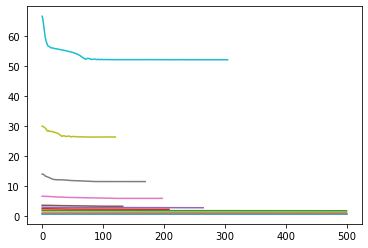

In [43]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=1, target=None,
                                     model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                     norm = 'col_uniform', patience=20, epochs=500, lr=1e-2, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

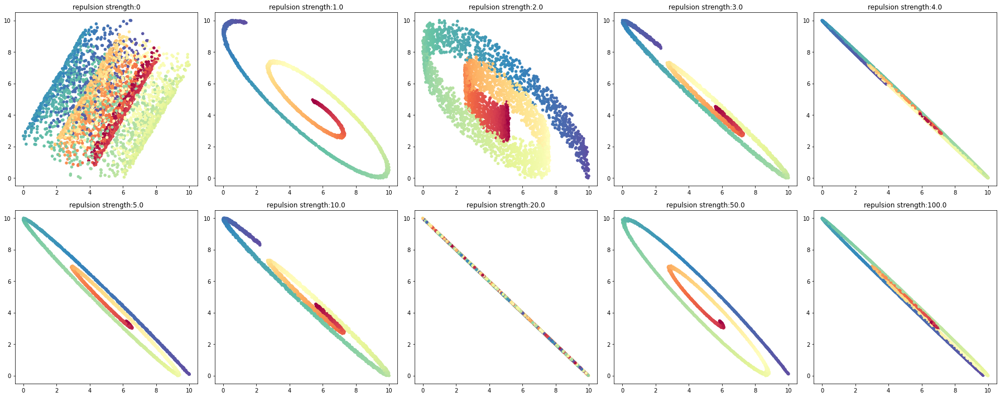

In [44]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

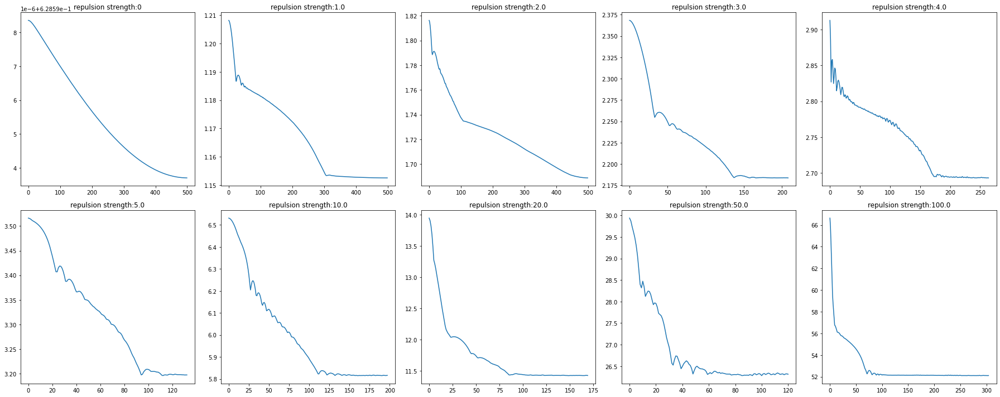

In [45]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=000, loss=0.6952, time=0.0174
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=001, loss=0.6952, time=0.0144
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=002, loss=0.6952, time=0.0130
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=003, loss=0.6952, time=0.0143
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=004, loss=0.6952, time=0.0141
loss poss tensor(0.6952, grad_fn=<

Epoch=055, loss=0.6952, time=0.0162
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=056, loss=0.6952, time=0.0188
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=057, loss=0.6952, time=0.0146
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=058, loss=0.6952, time=0.0148
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=059, loss=0.6952, time=0.0156
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=060, loss=0.6952, time=0.0154
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor

loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=106, loss=0.6952, time=0.0213
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=107, loss=0.6952, time=0.0163
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=108, loss=0.6952, time=0.0155
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=109, loss=0.6952, time=0.0144
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=110, loss=0.6952, time=0.0154
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch

Epoch=156, loss=0.6952, time=0.0169
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=157, loss=0.6952, time=0.0196
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=158, loss=0.6952, time=0.0173
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=159, loss=0.6952, time=0.0155
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=160, loss=0.6952, time=0.0145
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=161, loss=0.6952, time=0.0158
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor

Epoch=207, loss=0.6952, time=0.0171
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=208, loss=0.6952, time=0.0179
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=209, loss=0.6952, time=0.0149
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=210, loss=0.6952, time=0.0153
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=211, loss=0.6952, time=0.0157
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=212, loss=0.6952, time=0.0155
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor

Epoch=254, loss=0.6952, time=0.0935
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=255, loss=0.6952, time=0.0648
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=256, loss=0.6952, time=0.0221
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=257, loss=0.6952, time=0.0303
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=258, loss=0.6952, time=0.0351
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=259, loss=0.6952, time=0.0390
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor

loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=304, loss=0.6952, time=0.0316
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=305, loss=0.6952, time=0.0237
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=306, loss=0.6952, time=0.0237
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=307, loss=0.6952, time=0.0202
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=308, loss=0.6952, time=0.0265
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=357, loss=0.6952, time=0.0298
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=358, loss=0.6952, time=0.0208
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=359, loss=0.6952, time=0.0234
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=360, loss=0.6952, time=0.0206
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=361, loss=0.6952, time=0.0236
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=404, loss=0.6952, time=0.0259
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=405, loss=0.6952, time=0.0228
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=406, loss=0.6952, time=0.0221
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=407, loss=0.6952, time=0.0206
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=408, loss=0.6952, time=0.0221
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

Epoch=452, loss=0.6952, time=0.0246
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=453, loss=0.6952, time=0.0217
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=454, loss=0.6952, time=0.0201
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=455, loss=0.6952, time=0.0205
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=456, loss=0.6952, time=0.0219
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6952, grad_fn=<AddBackward0>)
Epoch=457, loss=0.6952, time=0.0263
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5718, grad_fn=<NegBackward0>)
loss final tensor(1.2668, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2668, time=0.0210
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5718, grad_fn=<NegBackward0>)
loss final tensor(1.2668, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2668, time=0.0201
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5718, grad_fn=<NegBackward0>)
loss final tensor(1.2668, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2668, time=0.0198
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5718, grad_fn=<NegBackward0>)
loss final tensor(1.2668, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2668, time=0.0209
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5718, grad_fn=<NegBackward0>)
loss final tensor(1.2668, grad_fn=<AddBackward0>)
Epoch=004, loss=1.2668, time=0.0244
loss poss tensor(0.

loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5711, grad_fn=<NegBackward0>)
loss final tensor(1.2662, grad_fn=<AddBackward0>)
Epoch=045, loss=1.2662, time=0.0240
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5711, grad_fn=<NegBackward0>)
loss final tensor(1.2661, grad_fn=<AddBackward0>)
Epoch=046, loss=1.2661, time=0.0201
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5711, grad_fn=<NegBackward0>)
loss final tensor(1.2661, grad_fn=<AddBackward0>)
Epoch=047, loss=1.2661, time=0.0334
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5710, grad_fn=<NegBackward0>)
loss final tensor(1.2661, grad_fn=<AddBackward0>)
Epoch=048, loss=1.2661, time=0.0231
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5710, grad_fn=<NegBackward0>)
loss final tensor(1.2661, grad_fn=<AddBackward0>)
Epoch=049, loss=1.2661, time=0.0204
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5710, grad_fn=<Neg

Epoch=090, loss=1.2651, time=0.0272
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5701, grad_fn=<NegBackward0>)
loss final tensor(1.2651, grad_fn=<AddBackward0>)
Epoch=091, loss=1.2651, time=0.0240
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5700, grad_fn=<NegBackward0>)
loss final tensor(1.2651, grad_fn=<AddBackward0>)
Epoch=092, loss=1.2651, time=0.0261
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5700, grad_fn=<NegBackward0>)
loss final tensor(1.2650, grad_fn=<AddBackward0>)
Epoch=093, loss=1.2650, time=0.0349
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5700, grad_fn=<NegBackward0>)
loss final tensor(1.2650, grad_fn=<AddBackward0>)
Epoch=094, loss=1.2650, time=0.0275
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5699, grad_fn=<NegBackward0>)
loss final tensor(1.2650, grad_fn=<AddBackward0>)
Epoch=095, loss=1.2650, time=0.1143
loss poss tensor(0.6950, grad_fn=<NegBackward0>)


Epoch=140, loss=1.2637, time=0.0193
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5686, grad_fn=<NegBackward0>)
loss final tensor(1.2636, grad_fn=<AddBackward0>)
Epoch=141, loss=1.2636, time=0.0184
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5686, grad_fn=<NegBackward0>)
loss final tensor(1.2636, grad_fn=<AddBackward0>)
Epoch=142, loss=1.2636, time=0.0198
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5685, grad_fn=<NegBackward0>)
loss final tensor(1.2636, grad_fn=<AddBackward0>)
Epoch=143, loss=1.2636, time=0.0183
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5685, grad_fn=<NegBackward0>)
loss final tensor(1.2635, grad_fn=<AddBackward0>)
Epoch=144, loss=1.2635, time=0.0174
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5685, grad_fn=<NegBackward0>)
loss final tensor(1.2635, grad_fn=<AddBackward0>)
Epoch=145, loss=1.2635, time=0.0187
loss poss tensor(0.6950, grad_fn=<NegBackward0>)


loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5668, grad_fn=<NegBackward0>)
loss final tensor(1.2618, grad_fn=<AddBackward0>)
Epoch=191, loss=1.2618, time=0.0268
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5667, grad_fn=<NegBackward0>)
loss final tensor(1.2618, grad_fn=<AddBackward0>)
Epoch=192, loss=1.2618, time=0.0270
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5667, grad_fn=<NegBackward0>)
loss final tensor(1.2617, grad_fn=<AddBackward0>)
Epoch=193, loss=1.2617, time=0.0248
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5667, grad_fn=<NegBackward0>)
loss final tensor(1.2617, grad_fn=<AddBackward0>)
Epoch=194, loss=1.2617, time=0.0231
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5666, grad_fn=<NegBackward0>)
loss final tensor(1.2617, grad_fn=<AddBackward0>)
Epoch=195, loss=1.2617, time=0.0237
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5666, grad_fn=<Neg

Epoch=239, loss=1.2598, time=0.0257
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5647, grad_fn=<NegBackward0>)
loss final tensor(1.2597, grad_fn=<AddBackward0>)
Epoch=240, loss=1.2597, time=0.0289
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5646, grad_fn=<NegBackward0>)
loss final tensor(1.2597, grad_fn=<AddBackward0>)
Epoch=241, loss=1.2597, time=0.0260
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5646, grad_fn=<NegBackward0>)
loss final tensor(1.2596, grad_fn=<AddBackward0>)
Epoch=242, loss=1.2596, time=0.0235
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5645, grad_fn=<NegBackward0>)
loss final tensor(1.2596, grad_fn=<AddBackward0>)
Epoch=243, loss=1.2596, time=0.0248
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5645, grad_fn=<NegBackward0>)
loss final tensor(1.2595, grad_fn=<AddBackward0>)
Epoch=244, loss=1.2595, time=0.0249
loss poss tensor(0.6950, grad_fn=<NegBackward0>)


Epoch=288, loss=1.2574, time=0.0199
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5623, grad_fn=<NegBackward0>)
loss final tensor(1.2573, grad_fn=<AddBackward0>)
Epoch=289, loss=1.2573, time=0.0195
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5622, grad_fn=<NegBackward0>)
loss final tensor(1.2573, grad_fn=<AddBackward0>)
Epoch=290, loss=1.2573, time=0.0221
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5621, grad_fn=<NegBackward0>)
loss final tensor(1.2572, grad_fn=<AddBackward0>)
Epoch=291, loss=1.2572, time=0.0177
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5621, grad_fn=<NegBackward0>)
loss final tensor(1.2572, grad_fn=<AddBackward0>)
Epoch=292, loss=1.2572, time=0.0180
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5620, grad_fn=<NegBackward0>)
loss final tensor(1.2571, grad_fn=<AddBackward0>)
Epoch=293, loss=1.2571, time=0.0169
loss poss tensor(0.6951, grad_fn=<NegBackward0>)


Epoch=336, loss=1.2549, time=0.0197
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5598, grad_fn=<NegBackward0>)
loss final tensor(1.2548, grad_fn=<AddBackward0>)
Epoch=337, loss=1.2548, time=0.0186
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5597, grad_fn=<NegBackward0>)
loss final tensor(1.2548, grad_fn=<AddBackward0>)
Epoch=338, loss=1.2548, time=0.0180
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5597, grad_fn=<NegBackward0>)
loss final tensor(1.2547, grad_fn=<AddBackward0>)
Epoch=339, loss=1.2547, time=0.0178
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5596, grad_fn=<NegBackward0>)
loss final tensor(1.2547, grad_fn=<AddBackward0>)
Epoch=340, loss=1.2547, time=0.0196
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5596, grad_fn=<NegBackward0>)
loss final tensor(1.2546, grad_fn=<AddBackward0>)
Epoch=341, loss=1.2546, time=0.0199
loss poss tensor(0.6951, grad_fn=<NegBackward0>)


Epoch=382, loss=1.2527, time=0.0207
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5575, grad_fn=<NegBackward0>)
loss final tensor(1.2526, grad_fn=<AddBackward0>)
Epoch=383, loss=1.2526, time=0.0180
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5575, grad_fn=<NegBackward0>)
loss final tensor(1.2526, grad_fn=<AddBackward0>)
Epoch=384, loss=1.2526, time=0.0177
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5575, grad_fn=<NegBackward0>)
loss final tensor(1.2525, grad_fn=<AddBackward0>)
Epoch=385, loss=1.2525, time=0.0193
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5574, grad_fn=<NegBackward0>)
loss final tensor(1.2525, grad_fn=<AddBackward0>)
Epoch=386, loss=1.2525, time=0.0193
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5574, grad_fn=<NegBackward0>)
loss final tensor(1.2524, grad_fn=<AddBackward0>)
Epoch=387, loss=1.2524, time=0.0195
loss poss tensor(0.6951, grad_fn=<NegBackward0>)


Epoch=434, loss=1.2509, time=0.0187
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5558, grad_fn=<NegBackward0>)
loss final tensor(1.2509, grad_fn=<AddBackward0>)
Epoch=435, loss=1.2509, time=0.0203
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5558, grad_fn=<NegBackward0>)
loss final tensor(1.2508, grad_fn=<AddBackward0>)
Epoch=436, loss=1.2508, time=0.0196
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5558, grad_fn=<NegBackward0>)
loss final tensor(1.2508, grad_fn=<AddBackward0>)
Epoch=437, loss=1.2508, time=0.0204
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5557, grad_fn=<NegBackward0>)
loss final tensor(1.2508, grad_fn=<AddBackward0>)
Epoch=438, loss=1.2508, time=0.0177
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5557, grad_fn=<NegBackward0>)
loss final tensor(1.2508, grad_fn=<AddBackward0>)
Epoch=439, loss=1.2508, time=0.0175
loss poss tensor(0.6951, grad_fn=<NegBackward0>)


loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5551, grad_fn=<NegBackward0>)
loss final tensor(1.2502, grad_fn=<AddBackward0>)
Epoch=489, loss=1.2502, time=0.0247
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5551, grad_fn=<NegBackward0>)
loss final tensor(1.2502, grad_fn=<AddBackward0>)
Epoch=490, loss=1.2502, time=0.0235
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5551, grad_fn=<NegBackward0>)
loss final tensor(1.2502, grad_fn=<AddBackward0>)
Epoch=491, loss=1.2502, time=0.0220
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5551, grad_fn=<NegBackward0>)
loss final tensor(1.2502, grad_fn=<AddBackward0>)
Epoch=492, loss=1.2502, time=0.0225
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5551, grad_fn=<NegBackward0>)
loss final tensor(1.2502, grad_fn=<AddBackward0>)
Epoch=493, loss=1.2502, time=0.0241
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5551, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(1.1691, grad_fn=<NegBackward0>)
loss final tensor(1.8642, grad_fn=<AddBackward0>)
Epoch=000, loss=1.8642, time=0.0216
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(1.1689, grad_fn=<NegBackward0>)
loss final tensor(1.8640, grad_fn=<AddBackward0>)
Epoch=001, loss=1.8640, time=0.0270
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(1.1685, grad_fn=<NegBackward0>)
loss final tensor(1.8636, grad_fn=<AddBackward0>)
Epoch=002, loss=1.8636, time=0.0242
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(1.1679, grad_fn=<NegBackward0>)
loss final tensor(1.8630, grad_fn=<AddBackward0>)
Epoch=003, loss=1.8630, time=0.0265
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(1.1671, grad_fn=<NegBackward0>)
loss final tensor(1.8622, grad_fn=<AddBackward0>)
Epoch=004, loss=1.8622, time=0.0239
loss poss tensor(0.

Epoch=049, loss=1.7947, time=0.0198
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0991, grad_fn=<NegBackward0>)
loss final tensor(1.7943, grad_fn=<AddBackward0>)
Epoch=050, loss=1.7943, time=0.0209
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0986, grad_fn=<NegBackward0>)
loss final tensor(1.7939, grad_fn=<AddBackward0>)
Epoch=051, loss=1.7939, time=0.0184
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0982, grad_fn=<NegBackward0>)
loss final tensor(1.7934, grad_fn=<AddBackward0>)
Epoch=052, loss=1.7934, time=0.0220
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0978, grad_fn=<NegBackward0>)
loss final tensor(1.7930, grad_fn=<AddBackward0>)
Epoch=053, loss=1.7930, time=0.0247
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0974, grad_fn=<NegBackward0>)
loss final tensor(1.7927, grad_fn=<AddBackward0>)
Epoch=054, loss=1.7927, time=0.0185
loss poss tensor(0.6952, grad_fn=<NegBackward0>)


Epoch=094, loss=1.7880, time=0.0355
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0926, grad_fn=<NegBackward0>)
loss final tensor(1.7878, grad_fn=<AddBackward0>)
Epoch=095, loss=1.7878, time=0.0230
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0925, grad_fn=<NegBackward0>)
loss final tensor(1.7877, grad_fn=<AddBackward0>)
Epoch=096, loss=1.7877, time=0.0257
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0923, grad_fn=<NegBackward0>)
loss final tensor(1.7875, grad_fn=<AddBackward0>)
Epoch=097, loss=1.7875, time=0.0216
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0922, grad_fn=<NegBackward0>)
loss final tensor(1.7874, grad_fn=<AddBackward0>)
Epoch=098, loss=1.7874, time=0.0246
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0920, grad_fn=<NegBackward0>)
loss final tensor(1.7872, grad_fn=<AddBackward0>)
Epoch=099, loss=1.7872, time=0.0187
loss poss tensor(0.6952, grad_fn=<NegBackward0>)


loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0837, grad_fn=<NegBackward0>)
loss final tensor(1.7789, grad_fn=<AddBackward0>)
Epoch=143, loss=1.7789, time=0.0215
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0833, grad_fn=<NegBackward0>)
loss final tensor(1.7785, grad_fn=<AddBackward0>)
Epoch=144, loss=1.7785, time=0.0185
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0832, grad_fn=<NegBackward0>)
loss final tensor(1.7784, grad_fn=<AddBackward0>)
Epoch=145, loss=1.7784, time=0.0177
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0830, grad_fn=<NegBackward0>)
loss final tensor(1.7782, grad_fn=<AddBackward0>)
Epoch=146, loss=1.7782, time=0.0186
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0828, grad_fn=<NegBackward0>)
loss final tensor(1.7780, grad_fn=<AddBackward0>)
Epoch=147, loss=1.7780, time=0.0180
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0825, grad_fn=<Neg

Epoch=189, loss=1.7646, time=0.0190
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0689, grad_fn=<NegBackward0>)
loss final tensor(1.7642, grad_fn=<AddBackward0>)
Epoch=190, loss=1.7642, time=0.0196
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0685, grad_fn=<NegBackward0>)
loss final tensor(1.7638, grad_fn=<AddBackward0>)
Epoch=191, loss=1.7638, time=0.0181
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0681, grad_fn=<NegBackward0>)
loss final tensor(1.7633, grad_fn=<AddBackward0>)
Epoch=192, loss=1.7633, time=0.0181
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0677, grad_fn=<NegBackward0>)
loss final tensor(1.7630, grad_fn=<AddBackward0>)
Epoch=193, loss=1.7630, time=0.0201
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.0674, grad_fn=<NegBackward0>)
loss final tensor(1.7627, grad_fn=<AddBackward0>)
Epoch=194, loss=1.7627, time=0.0180
loss poss tensor(0.6952, grad_fn=<NegBackward0>)


Epoch=237, loss=1.7444, time=0.0230
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.0486, grad_fn=<NegBackward0>)
loss final tensor(1.7439, grad_fn=<AddBackward0>)
Epoch=238, loss=1.7439, time=0.0181
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.0481, grad_fn=<NegBackward0>)
loss final tensor(1.7434, grad_fn=<AddBackward0>)
Epoch=239, loss=1.7434, time=0.0182
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.0475, grad_fn=<NegBackward0>)
loss final tensor(1.7428, grad_fn=<AddBackward0>)
Epoch=240, loss=1.7428, time=0.0191
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.0470, grad_fn=<NegBackward0>)
loss final tensor(1.7423, grad_fn=<AddBackward0>)
Epoch=241, loss=1.7423, time=0.0178
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.0464, grad_fn=<NegBackward0>)
loss final tensor(1.7417, grad_fn=<AddBackward0>)
Epoch=242, loss=1.7417, time=0.0182
loss poss tensor(0.6953, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.0095, grad_fn=<NegBackward0>)
loss final tensor(2.7046, grad_fn=<AddBackward0>)
Epoch=000, loss=2.7046, time=0.0210
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.0081, grad_fn=<NegBackward0>)
loss final tensor(2.7032, grad_fn=<AddBackward0>)
Epoch=001, loss=2.7032, time=0.0235
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.0054, grad_fn=<NegBackward0>)
loss final tensor(2.7005, grad_fn=<AddBackward0>)
Epoch=002, loss=2.7005, time=0.0214
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.0014, grad_fn=<NegBackward0>)
loss final tensor(2.6965, grad_fn=<AddBackward0>)
Epoch=003, loss=2.6965, time=0.0212
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(1.9963, grad_fn=<NegBackward0>)
loss final tensor(2.6914, grad_fn=<AddBackward0>)
Epoch=004, loss=2.6914, time=0.0355
loss poss tensor(0.

loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(1.6735, grad_fn=<NegBackward0>)
loss final tensor(2.3685, grad_fn=<AddBackward0>)
Epoch=045, loss=2.3685, time=0.0221
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(1.6676, grad_fn=<NegBackward0>)
loss final tensor(2.3626, grad_fn=<AddBackward0>)
Epoch=046, loss=2.3626, time=0.0181
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(1.6620, grad_fn=<NegBackward0>)
loss final tensor(2.3571, grad_fn=<AddBackward0>)
Epoch=047, loss=2.3571, time=0.0201
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(1.6584, grad_fn=<NegBackward0>)
loss final tensor(2.3534, grad_fn=<AddBackward0>)
Epoch=048, loss=2.3534, time=0.0196
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(1.6547, grad_fn=<NegBackward0>)
loss final tensor(2.3498, grad_fn=<AddBackward0>)
Epoch=049, loss=2.3498, time=0.0229
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(1.6507, grad_fn=<Neg

loss neg tensor(1.5781, grad_fn=<NegBackward0>)
loss final tensor(2.2733, grad_fn=<AddBackward0>)
Epoch=095, loss=2.2733, time=0.0212
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5773, grad_fn=<NegBackward0>)
loss final tensor(2.2725, grad_fn=<AddBackward0>)
Epoch=096, loss=2.2725, time=0.0210
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5766, grad_fn=<NegBackward0>)
loss final tensor(2.2718, grad_fn=<AddBackward0>)
Epoch=097, loss=2.2718, time=0.0213
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5761, grad_fn=<NegBackward0>)
loss final tensor(2.2712, grad_fn=<AddBackward0>)
Epoch=098, loss=2.2712, time=0.0205
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5755, grad_fn=<NegBackward0>)
loss final tensor(2.2706, grad_fn=<AddBackward0>)
Epoch=099, loss=2.2706, time=0.0243
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5750, grad_fn=<NegBackward0>)
loss final tensor(2.2702, grad_fn=<Ad

loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5593, grad_fn=<NegBackward0>)
loss final tensor(2.2545, grad_fn=<AddBackward0>)
Epoch=141, loss=2.2545, time=0.1029
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5591, grad_fn=<NegBackward0>)
loss final tensor(2.2542, grad_fn=<AddBackward0>)
Epoch=142, loss=2.2542, time=0.1147
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5588, grad_fn=<NegBackward0>)
loss final tensor(2.2540, grad_fn=<AddBackward0>)
Epoch=143, loss=2.2540, time=0.0264
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5586, grad_fn=<NegBackward0>)
loss final tensor(2.2538, grad_fn=<AddBackward0>)
Epoch=144, loss=2.2538, time=0.0224
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5583, grad_fn=<NegBackward0>)
loss final tensor(2.2535, grad_fn=<AddBackward0>)
Epoch=145, loss=2.2535, time=0.0313
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5582, grad_fn=<Neg

loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5527, grad_fn=<NegBackward0>)
loss final tensor(2.2479, grad_fn=<AddBackward0>)
Epoch=186, loss=2.2479, time=0.0558
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5526, grad_fn=<NegBackward0>)
loss final tensor(2.2478, grad_fn=<AddBackward0>)
Epoch=187, loss=2.2478, time=0.0297
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5526, grad_fn=<NegBackward0>)
loss final tensor(2.2478, grad_fn=<AddBackward0>)
Epoch=188, loss=2.2478, time=0.0308
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5524, grad_fn=<NegBackward0>)
loss final tensor(2.2476, grad_fn=<AddBackward0>)
Epoch=189, loss=2.2476, time=0.0266
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5523, grad_fn=<NegBackward0>)
loss final tensor(2.2475, grad_fn=<AddBackward0>)
Epoch=190, loss=2.2475, time=0.0242
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5524, grad_fn=<Neg

loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5509, grad_fn=<NegBackward0>)
loss final tensor(2.2461, grad_fn=<AddBackward0>)
Epoch=233, loss=2.2461, time=0.0278
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5508, grad_fn=<NegBackward0>)
loss final tensor(2.2460, grad_fn=<AddBackward0>)
Epoch=234, loss=2.2460, time=0.0199
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5507, grad_fn=<NegBackward0>)
loss final tensor(2.2459, grad_fn=<AddBackward0>)
Epoch=235, loss=2.2459, time=0.0203
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5507, grad_fn=<NegBackward0>)
loss final tensor(2.2459, grad_fn=<AddBackward0>)
Epoch=236, loss=2.2459, time=0.0225
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5507, grad_fn=<NegBackward0>)
loss final tensor(2.2459, grad_fn=<AddBackward0>)
Epoch=237, loss=2.2459, time=0.0230
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.5506, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.3284, grad_fn=<NegBackward0>)
loss final tensor(3.0234, grad_fn=<AddBackward0>)
Epoch=000, loss=3.0234, time=0.0213
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.3282, grad_fn=<NegBackward0>)
loss final tensor(3.0233, grad_fn=<AddBackward0>)
Epoch=001, loss=3.0233, time=0.0220
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.3279, grad_fn=<NegBackward0>)
loss final tensor(3.0230, grad_fn=<AddBackward0>)
Epoch=002, loss=3.0230, time=0.0195
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.3275, grad_fn=<NegBackward0>)
loss final tensor(3.0226, grad_fn=<AddBackward0>)
Epoch=003, loss=3.0226, time=0.0307
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.3270, grad_fn=<NegBackward0>)
loss final tensor(3.0220, grad_fn=<AddBackward0>)
Epoch=004, loss=3.0220, time=0.0215
loss poss tensor(0.

Epoch=046, loss=2.9774, time=0.0362
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.2806, grad_fn=<NegBackward0>)
loss final tensor(2.9757, grad_fn=<AddBackward0>)
Epoch=047, loss=2.9757, time=0.0249
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.2788, grad_fn=<NegBackward0>)
loss final tensor(2.9739, grad_fn=<AddBackward0>)
Epoch=048, loss=2.9739, time=0.0277
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.2769, grad_fn=<NegBackward0>)
loss final tensor(2.9720, grad_fn=<AddBackward0>)
Epoch=049, loss=2.9720, time=0.0270
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.2749, grad_fn=<NegBackward0>)
loss final tensor(2.9700, grad_fn=<AddBackward0>)
Epoch=050, loss=2.9700, time=0.0259
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.2727, grad_fn=<NegBackward0>)
loss final tensor(2.9678, grad_fn=<AddBackward0>)
Epoch=051, loss=2.9678, time=0.0239
loss poss tensor(0.6951, grad_fn=<NegBackward0>)


loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.1877, grad_fn=<NegBackward0>)
loss final tensor(2.8829, grad_fn=<AddBackward0>)
Epoch=094, loss=2.8829, time=0.0220
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.1857, grad_fn=<NegBackward0>)
loss final tensor(2.8809, grad_fn=<AddBackward0>)
Epoch=095, loss=2.8809, time=0.0238
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.1853, grad_fn=<NegBackward0>)
loss final tensor(2.8805, grad_fn=<AddBackward0>)
Epoch=096, loss=2.8805, time=0.0229
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.1858, grad_fn=<NegBackward0>)
loss final tensor(2.8810, grad_fn=<AddBackward0>)
Epoch=097, loss=2.8810, time=0.0234
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.1857, grad_fn=<NegBackward0>)
loss final tensor(2.8809, grad_fn=<AddBackward0>)
Epoch=098, loss=2.8809, time=0.0198
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.1844, grad_fn=<Neg

Epoch=139, loss=2.8471, time=0.0241
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.1504, grad_fn=<NegBackward0>)
loss final tensor(2.8457, grad_fn=<AddBackward0>)
Epoch=140, loss=2.8457, time=0.0309
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.1497, grad_fn=<NegBackward0>)
loss final tensor(2.8449, grad_fn=<AddBackward0>)
Epoch=141, loss=2.8449, time=0.0276
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.1486, grad_fn=<NegBackward0>)
loss final tensor(2.8439, grad_fn=<AddBackward0>)
Epoch=142, loss=2.8439, time=0.0292
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.1473, grad_fn=<NegBackward0>)
loss final tensor(2.8425, grad_fn=<AddBackward0>)
Epoch=143, loss=2.8425, time=0.0192
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.1463, grad_fn=<NegBackward0>)
loss final tensor(2.8416, grad_fn=<AddBackward0>)
Epoch=144, loss=2.8416, time=0.0208
loss poss tensor(0.6953, grad_fn=<NegBackward0>)


Epoch=184, loss=2.7703, time=0.0251
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.0720, grad_fn=<NegBackward0>)
loss final tensor(2.7675, grad_fn=<AddBackward0>)
Epoch=185, loss=2.7675, time=0.0203
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.0694, grad_fn=<NegBackward0>)
loss final tensor(2.7649, grad_fn=<AddBackward0>)
Epoch=186, loss=2.7649, time=0.0218
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.0659, grad_fn=<NegBackward0>)
loss final tensor(2.7614, grad_fn=<AddBackward0>)
Epoch=187, loss=2.7614, time=0.0211
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.0624, grad_fn=<NegBackward0>)
loss final tensor(2.7579, grad_fn=<AddBackward0>)
Epoch=188, loss=2.7579, time=0.0238
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.0596, grad_fn=<NegBackward0>)
loss final tensor(2.7551, grad_fn=<AddBackward0>)
Epoch=189, loss=2.7551, time=0.0252
loss poss tensor(0.6955, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(3.0940, grad_fn=<NegBackward0>)
loss final tensor(3.7890, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7890, time=0.0235
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(3.0816, grad_fn=<NegBackward0>)
loss final tensor(3.7766, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7766, time=0.0211
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(3.0582, grad_fn=<NegBackward0>)
loss final tensor(3.7532, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7532, time=0.0280
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(3.0304, grad_fn=<NegBackward0>)
loss final tensor(3.7254, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7254, time=0.0208
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(2.9987, grad_fn=<NegBackward0>)
loss final tensor(3.6937, grad_fn=<AddBackward0>)
Epoch=004, loss=3.6937, time=0.0232
loss poss tensor(0.

Epoch=045, loss=3.2901, time=0.0239
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5923, grad_fn=<NegBackward0>)
loss final tensor(3.2878, grad_fn=<AddBackward0>)
Epoch=046, loss=3.2878, time=0.0206
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5919, grad_fn=<NegBackward0>)
loss final tensor(3.2874, grad_fn=<AddBackward0>)
Epoch=047, loss=3.2874, time=0.0211
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5917, grad_fn=<NegBackward0>)
loss final tensor(3.2872, grad_fn=<AddBackward0>)
Epoch=048, loss=3.2872, time=0.0238
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5891, grad_fn=<NegBackward0>)
loss final tensor(3.2846, grad_fn=<AddBackward0>)
Epoch=049, loss=3.2846, time=0.0216
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5864, grad_fn=<NegBackward0>)
loss final tensor(3.2819, grad_fn=<AddBackward0>)
Epoch=050, loss=3.2819, time=0.0234
loss poss tensor(0.6955, grad_fn=<NegBackward0>)


loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5721, grad_fn=<NegBackward0>)
loss final tensor(3.2676, grad_fn=<AddBackward0>)
Epoch=091, loss=3.2676, time=0.0236
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5710, grad_fn=<NegBackward0>)
loss final tensor(3.2665, grad_fn=<AddBackward0>)
Epoch=092, loss=3.2665, time=0.0219
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5701, grad_fn=<NegBackward0>)
loss final tensor(3.2656, grad_fn=<AddBackward0>)
Epoch=093, loss=3.2656, time=0.0243
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5700, grad_fn=<NegBackward0>)
loss final tensor(3.2655, grad_fn=<AddBackward0>)
Epoch=094, loss=3.2655, time=0.0194
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5707, grad_fn=<NegBackward0>)
loss final tensor(3.2662, grad_fn=<AddBackward0>)
Epoch=095, loss=3.2662, time=0.0237
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5703, grad_fn=<Neg

loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5698, grad_fn=<NegBackward0>)
loss final tensor(3.2653, grad_fn=<AddBackward0>)
Epoch=139, loss=3.2653, time=0.0247
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5679, grad_fn=<NegBackward0>)
loss final tensor(3.2634, grad_fn=<AddBackward0>)
Epoch=140, loss=3.2634, time=0.0203
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(2.5684, grad_fn=<NegBackward0>)
loss final tensor(3.2639, grad_fn=<AddBackward0>)
Epoch=141, loss=3.2639, time=0.0201
Early stopping at epoch 141!
Loading 121th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(5.8549, grad_fn=<NegBackward0>)
loss final tensor(6.5504, grad_fn=<AddBackward0>)
Epoch=000, loss=6.5504, time=0.0264
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(5.8339, grad_fn=<NegBackward0>)
loss final tensor(6.5295, grad_fn=<AddBackward0>)
Epoch=001, loss=6.5295, time=0.0284
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(5.7936, grad_fn=<NegBackward0>)
loss final tensor(6.4892, grad_fn=<AddBackward0>)
Epoch=002, loss=6.4892, time=0.0292
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(5.7473, grad_fn=<NegBackward0>)
loss final tensor(6.4429, grad_fn=<AddBackward0>)
Epoch=003, loss=6.4429, time=0.0229
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(5.6994, grad_fn=<NegBackward0>)
loss final tensor(6.3949, grad_fn=<AddBackward0>)
Epoch=004, loss=6.3949, time=0.0200
loss poss tensor(0.

Epoch=047, loss=5.8751, time=0.0283
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1792, grad_fn=<NegBackward0>)
loss final tensor(5.8747, grad_fn=<AddBackward0>)
Epoch=048, loss=5.8747, time=0.0606
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1791, grad_fn=<NegBackward0>)
loss final tensor(5.8745, grad_fn=<AddBackward0>)
Epoch=049, loss=5.8745, time=0.0287
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1775, grad_fn=<NegBackward0>)
loss final tensor(5.8730, grad_fn=<AddBackward0>)
Epoch=050, loss=5.8730, time=0.0242
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1772, grad_fn=<NegBackward0>)
loss final tensor(5.8727, grad_fn=<AddBackward0>)
Epoch=051, loss=5.8727, time=0.0196
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1777, grad_fn=<NegBackward0>)
loss final tensor(5.8732, grad_fn=<AddBackward0>)
Epoch=052, loss=5.8732, time=0.0199
loss poss tensor(0.6954, grad_fn=<NegBackward0>)


Epoch=092, loss=5.8713, time=0.0230
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1772, grad_fn=<NegBackward0>)
loss final tensor(5.8727, grad_fn=<AddBackward0>)
Epoch=093, loss=5.8727, time=0.0207
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1800, grad_fn=<NegBackward0>)
loss final tensor(5.8755, grad_fn=<AddBackward0>)
Epoch=094, loss=5.8755, time=0.0200
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1794, grad_fn=<NegBackward0>)
loss final tensor(5.8748, grad_fn=<AddBackward0>)
Epoch=095, loss=5.8748, time=0.0220
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1763, grad_fn=<NegBackward0>)
loss final tensor(5.8717, grad_fn=<AddBackward0>)
Epoch=096, loss=5.8717, time=0.0217
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1752, grad_fn=<NegBackward0>)
loss final tensor(5.8706, grad_fn=<AddBackward0>)
Epoch=097, loss=5.8706, time=0.0201
Early stopping at epoch 97!
Loading 77th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(13.7323, grad_fn=<NegBackward0>)
loss final tensor(14.4274, grad_fn=<AddBackward0>)
Epoch=000, loss=14.4274, time=0.0214
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(13.7104, grad_fn=<NegBackward0>)
loss final tensor(14.4055, grad_fn=<AddBackward0>)
Epoch=001, loss=14.4055, time=0.0267
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(13.6632, grad_fn=<NegBackward0>)
loss final tensor(14.3584, grad_fn=<AddBackward0>)
Epoch=002, loss=14.3584, time=0.0198
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(13.5849, grad_fn=<NegBackward0>)
loss final tensor(14.2801, grad_fn=<AddBackward0>)
Epoch=003, loss=14.2801, time=0.0232
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(13.4655, grad_fn=<NegBackward0>)
loss final tensor(14.1608, grad_fn=<AddBackward0>)
Epoch=004, loss=14.1608, time=0.0231
loss

loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(11.0293, grad_fn=<NegBackward0>)
loss final tensor(11.7244, grad_fn=<AddBackward0>)
Epoch=048, loss=11.7244, time=0.0238
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(11.0176, grad_fn=<NegBackward0>)
loss final tensor(11.7127, grad_fn=<AddBackward0>)
Epoch=049, loss=11.7127, time=0.0214
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(11.0024, grad_fn=<NegBackward0>)
loss final tensor(11.6975, grad_fn=<AddBackward0>)
Epoch=050, loss=11.6975, time=0.0193
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(10.9837, grad_fn=<NegBackward0>)
loss final tensor(11.6789, grad_fn=<AddBackward0>)
Epoch=051, loss=11.6789, time=0.0226
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(10.9691, grad_fn=<NegBackward0>)
loss final tensor(11.6642, grad_fn=<AddBackward0>)
Epoch=052, loss=11.6642, time=0.0213
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(10.96

loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.3326, grad_fn=<NegBackward0>)
loss final tensor(11.0280, grad_fn=<AddBackward0>)
Epoch=096, loss=11.0280, time=0.0233
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.3460, grad_fn=<NegBackward0>)
loss final tensor(11.0415, grad_fn=<AddBackward0>)
Epoch=097, loss=11.0415, time=0.0208
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.3506, grad_fn=<NegBackward0>)
loss final tensor(11.0461, grad_fn=<AddBackward0>)
Epoch=098, loss=11.0461, time=0.0253
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.3473, grad_fn=<NegBackward0>)
loss final tensor(11.0428, grad_fn=<AddBackward0>)
Epoch=099, loss=11.0428, time=0.0207
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.3369, grad_fn=<NegBackward0>)
loss final tensor(11.0324, grad_fn=<AddBackward0>)
Epoch=100, loss=11.0324, time=0.0191
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.31

Epoch=143, loss=10.9557, time=0.0213
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2596, grad_fn=<NegBackward0>)
loss final tensor(10.9552, grad_fn=<AddBackward0>)
Epoch=144, loss=10.9552, time=0.0232
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2626, grad_fn=<NegBackward0>)
loss final tensor(10.9581, grad_fn=<AddBackward0>)
Epoch=145, loss=10.9581, time=0.0217
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2612, grad_fn=<NegBackward0>)
loss final tensor(10.9568, grad_fn=<AddBackward0>)
Epoch=146, loss=10.9568, time=0.0215
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2640, grad_fn=<NegBackward0>)
loss final tensor(10.9595, grad_fn=<AddBackward0>)
Epoch=147, loss=10.9595, time=0.0210
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2611, grad_fn=<NegBackward0>)
loss final tensor(10.9566, grad_fn=<AddBackward0>)
Epoch=148, loss=10.9566, time=0.0233
loss poss tensor(0.6955, grad_fn=

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(28.9235, grad_fn=<NegBackward0>)
loss final tensor(29.6189, grad_fn=<AddBackward0>)
Epoch=000, loss=29.6189, time=0.0217
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(28.4795, grad_fn=<NegBackward0>)
loss final tensor(29.1752, grad_fn=<AddBackward0>)
Epoch=001, loss=29.1752, time=0.0204
loss poss tensor(0.6957, grad_fn=<NegBackward0>)
loss neg tensor(27.5709, grad_fn=<NegBackward0>)
loss final tensor(28.2666, grad_fn=<AddBackward0>)
Epoch=002, loss=28.2666, time=0.0205
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(27.4300, grad_fn=<NegBackward0>)
loss final tensor(28.1254, grad_fn=<AddBackward0>)
Epoch=003, loss=28.1254, time=0.0222
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(27.1658, grad_fn=<NegBackward0>)
loss final tensor(27.8610, grad_fn=<AddBackward0>)
Epoch=004, loss=27.8610, time=0.0240
loss

loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8460, grad_fn=<NegBackward0>)
loss final tensor(26.5413, grad_fn=<AddBackward0>)
Epoch=047, loss=26.5413, time=0.0257
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8469, grad_fn=<NegBackward0>)
loss final tensor(26.5422, grad_fn=<AddBackward0>)
Epoch=048, loss=26.5422, time=0.0196
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8439, grad_fn=<NegBackward0>)
loss final tensor(26.5392, grad_fn=<AddBackward0>)
Epoch=049, loss=26.5392, time=0.0281
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8407, grad_fn=<NegBackward0>)
loss final tensor(26.5360, grad_fn=<AddBackward0>)
Epoch=050, loss=26.5360, time=0.0218
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8362, grad_fn=<NegBackward0>)
loss final tensor(26.5315, grad_fn=<AddBackward0>)
Epoch=051, loss=26.5315, time=0.0205
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.84

loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8157, grad_fn=<NegBackward0>)
loss final tensor(26.5110, grad_fn=<AddBackward0>)
Epoch=096, loss=26.5110, time=0.0240
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8094, grad_fn=<NegBackward0>)
loss final tensor(26.5047, grad_fn=<AddBackward0>)
Epoch=097, loss=26.5047, time=0.0212
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8076, grad_fn=<NegBackward0>)
loss final tensor(26.5028, grad_fn=<AddBackward0>)
Epoch=098, loss=26.5028, time=0.0210
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8048, grad_fn=<NegBackward0>)
loss final tensor(26.5001, grad_fn=<AddBackward0>)
Epoch=099, loss=26.5001, time=0.0232
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8127, grad_fn=<NegBackward0>)
loss final tensor(26.5079, grad_fn=<AddBackward0>)
Epoch=100, loss=26.5079, time=0.0195
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.81

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(59.6248, grad_fn=<NegBackward0>)
loss final tensor(60.3199, grad_fn=<AddBackward0>)
Epoch=000, loss=60.3199, time=0.0254
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(58.7813, grad_fn=<NegBackward0>)
loss final tensor(59.4763, grad_fn=<AddBackward0>)
Epoch=001, loss=59.4763, time=0.0206
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(58.5704, grad_fn=<NegBackward0>)
loss final tensor(59.2655, grad_fn=<AddBackward0>)
Epoch=002, loss=59.2655, time=0.0190
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(58.2044, grad_fn=<NegBackward0>)
loss final tensor(58.8995, grad_fn=<AddBackward0>)
Epoch=003, loss=58.8995, time=0.0225
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(57.8579, grad_fn=<NegBackward0>)
loss final tensor(58.5530, grad_fn=<AddBackward0>)
Epoch=004, loss=58.5530, time=0.0209
loss

Epoch=046, loss=55.0424, time=0.0205
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.3917, grad_fn=<NegBackward0>)
loss final tensor(55.0873, grad_fn=<AddBackward0>)
Epoch=047, loss=55.0873, time=0.0199
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.3973, grad_fn=<NegBackward0>)
loss final tensor(55.0929, grad_fn=<AddBackward0>)
Epoch=048, loss=55.0929, time=0.0205
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.3753, grad_fn=<NegBackward0>)
loss final tensor(55.0709, grad_fn=<AddBackward0>)
Epoch=049, loss=55.0709, time=0.0219
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.3151, grad_fn=<NegBackward0>)
loss final tensor(55.0107, grad_fn=<AddBackward0>)
Epoch=050, loss=55.0107, time=0.0233
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.2166, grad_fn=<NegBackward0>)
loss final tensor(54.9122, grad_fn=<AddBackward0>)
Epoch=051, loss=54.9122, time=0.0201
loss poss tensor(0.6956, grad_fn=

Epoch=096, loss=54.8349, time=0.0219
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.1420, grad_fn=<NegBackward0>)
loss final tensor(54.8376, grad_fn=<AddBackward0>)
Epoch=097, loss=54.8376, time=0.0219
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.1346, grad_fn=<NegBackward0>)
loss final tensor(54.8302, grad_fn=<AddBackward0>)
Epoch=098, loss=54.8302, time=0.0222
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.1381, grad_fn=<NegBackward0>)
loss final tensor(54.8337, grad_fn=<AddBackward0>)
Epoch=099, loss=54.8337, time=0.0232
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.1397, grad_fn=<NegBackward0>)
loss final tensor(54.8353, grad_fn=<AddBackward0>)
Epoch=100, loss=54.8353, time=0.0198
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.1346, grad_fn=<NegBackward0>)
loss final tensor(54.8302, grad_fn=<AddBackward0>)
Epoch=101, loss=54.8302, time=0.0214
loss poss tensor(0.6956, grad_fn=

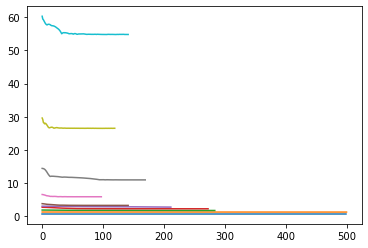

In [46]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=1, target=None,
                                  model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                  norm = 'col_uniform', patience=20, epochs=500, lr=1e-2, wd=1e-2,
                                  min_dist=0.1, name_file="1", subsampling=None,
                                  spread = 1.0, repulsion_strength=repulsion_strength[i],
                                  device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

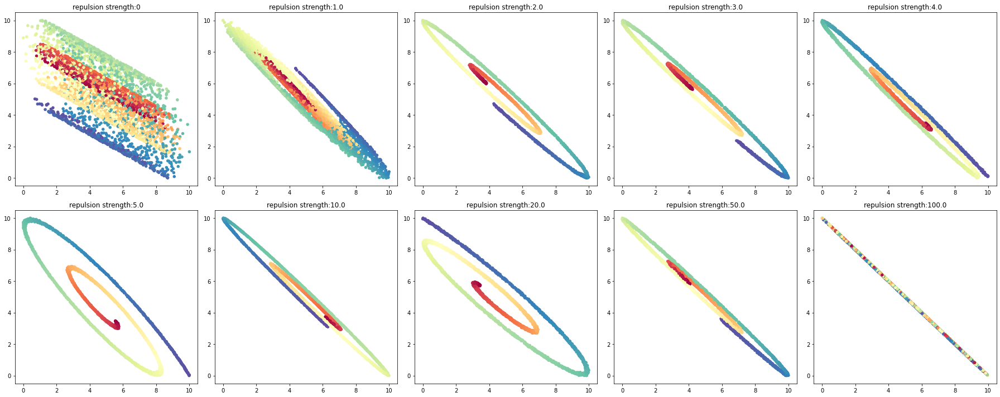

In [47]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

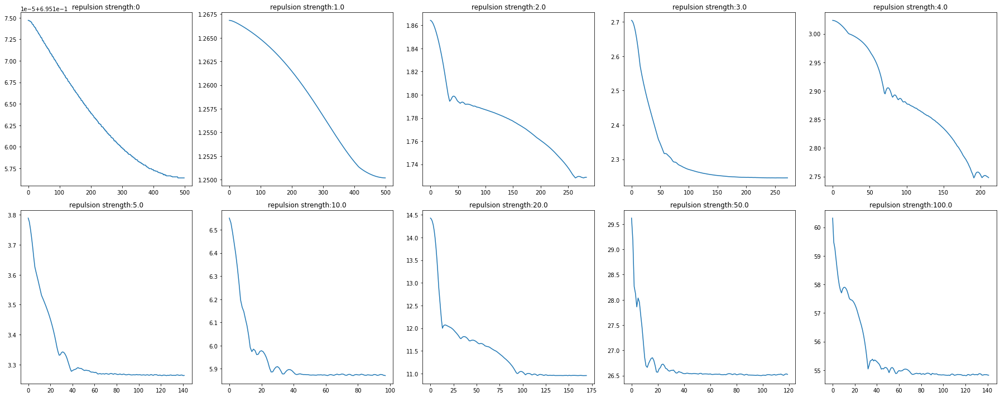

In [48]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

### GNN-uniform

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.6285, time=0.0234
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.6285, time=0.0204
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.6285, time=0.0210
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.6285, time=0.0216
loss poss tensor(0.6285, dtype=torch.float64, 

loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=0.6285, time=0.0238
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=0.6285, time=0.0205
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=0.6285, time=0.0204
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=0.6285, time=0.0180
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=086, loss=0.6285, time=0.0458
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=087, loss=0.6285, time=0.0199
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=088, loss=0.6285, time=0.0187
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=089, loss=0.6285, time=0.0188
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=131, loss=0.6285, time=0.0236
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=132, loss=0.6285, time=0.0205
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=133, loss=0.6285, time=0.0175
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=134, loss=0.6285, time=0.0188
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Epoch=170, loss=0.6285, time=0.0241
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=171, loss=0.6285, time=0.0229
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=172, loss=0.6285, time=0.0197
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=173, loss=0.6285, time=0.1155
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=174, loss=0.6285, time=0.0265
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Epoch=207, loss=0.6285, time=0.0233
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=208, loss=0.6285, time=0.0201
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=209, loss=0.6285, time=0.0201
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=210, loss=0.6285, time=0.0116
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=211, loss=0.6285, time=0.0136
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=248, loss=0.6285, time=0.0180
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=249, loss=0.6285, time=0.0176
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=250, loss=0.6285, time=0.0197
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=251, loss=0.6285, time=0.0115
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=294, loss=0.6285, time=0.0185
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=295, loss=0.6285, time=0.0170
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=296, loss=0.6285, time=0.0145
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=297, loss=0.6285, time=0.0152
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Epoch=333, loss=0.6285, time=0.0154
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=334, loss=0.6285, time=0.0178
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=335, loss=0.6285, time=0.0155
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=336, loss=0.6285, time=0.0151
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=337, loss=0.6285, time=0.0154
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Epoch=370, loss=0.6285, time=0.0160
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=371, loss=0.6285, time=0.0169
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=372, loss=0.6285, time=0.0144
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=373, loss=0.6285, time=0.0139
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=374, loss=0.6285, time=0.0146
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Epoch=408, loss=0.6285, time=0.1104
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=409, loss=0.6285, time=0.0190
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=410, loss=0.6285, time=0.0186
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=411, loss=0.6285, time=0.0241
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=412, loss=0.6285, time=0.0197
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Epoch=447, loss=0.6285, time=0.0150
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=448, loss=0.6285, time=0.0173
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=449, loss=0.6285, time=0.0142
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=450, loss=0.6285, time=0.0145
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=451, loss=0.6285, time=0.0133
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=488, loss=0.6285, time=0.0188
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=489, loss=0.6285, time=0.0139
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=490, loss=0.6285, time=0.0124
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=491, loss=0.6285, time=0.0151
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6285, dtype=torch.float64, grad_fn=<AddBackward

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6099, grad_fn=<NegBackward0>)
loss final tensor(1.2384, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2384, time=0.0169
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6098, grad_fn=<NegBackward0>)
loss final tensor(1.2384, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2384, time=0.0193
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6097, grad_fn=<NegBackward0>)
loss final tensor(1.2383, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2383, time=0.0254
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6096, grad_fn=<NegBackward0>)
loss final tensor(1.2382, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2382, time=0.0218
loss poss tensor(0.6286, dtype=tor

loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5960, grad_fn=<NegBackward0>)
loss final tensor(1.2247, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=1.2247, time=0.0185
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5954, grad_fn=<NegBackward0>)
loss final tensor(1.2241, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=1.2241, time=0.0156
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5948, grad_fn=<NegBackward0>)
loss final tensor(1.2235, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=1.2235, time=0.0159
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5944, grad_fn=<NegBackward0>)
loss final tensor(1.2231, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.2231, time=0.0149
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5947, grad_f

Epoch=086, loss=1.2190, time=0.0136
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5902, grad_fn=<NegBackward0>)
loss final tensor(1.2189, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=087, loss=1.2189, time=0.0176
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5902, grad_fn=<NegBackward0>)
loss final tensor(1.2188, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=088, loss=1.2188, time=0.0134
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5901, grad_fn=<NegBackward0>)
loss final tensor(1.2187, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=089, loss=1.2187, time=0.0136
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5899, grad_fn=<NegBackward0>)
loss final tensor(1.2186, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=090, loss=1.2186, time=0.0138
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=123, loss=1.2154, time=0.0156
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5867, grad_fn=<NegBackward0>)
loss final tensor(1.2154, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=124, loss=1.2154, time=0.0154
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5867, grad_fn=<NegBackward0>)
loss final tensor(1.2153, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=125, loss=1.2153, time=0.0135
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5865, grad_fn=<NegBackward0>)
loss final tensor(1.2152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=126, loss=1.2152, time=0.0123
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5864, grad_fn=<NegBackward0>)
loss final tensor(1.2150, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=127, loss=1.2150, time=0.0136
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5825, grad_fn=<NegBackward0>)
loss final tensor(1.2112, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=164, loss=1.2112, time=0.0169
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5824, grad_fn=<NegBackward0>)
loss final tensor(1.2110, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=165, loss=1.2110, time=0.0144
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5823, grad_fn=<NegBackward0>)
loss final tensor(1.2110, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=166, loss=1.2110, time=0.0129
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5823, grad_fn=<NegBackward0>)
loss final tensor(1.2109, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=167, loss=1.2109, time=0.0126
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5821, grad_f

loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5773, grad_fn=<NegBackward0>)
loss final tensor(1.2060, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=213, loss=1.2060, time=0.0179
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5772, grad_fn=<NegBackward0>)
loss final tensor(1.2059, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=214, loss=1.2059, time=0.0151
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5771, grad_fn=<NegBackward0>)
loss final tensor(1.2058, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=215, loss=1.2058, time=0.0144
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5771, grad_fn=<NegBackward0>)
loss final tensor(1.2057, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=216, loss=1.2057, time=0.0134
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5770, grad_f

loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5739, grad_fn=<NegBackward0>)
loss final tensor(1.2026, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=252, loss=1.2026, time=0.0182
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5738, grad_fn=<NegBackward0>)
loss final tensor(1.2025, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=253, loss=1.2025, time=0.0134
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5737, grad_fn=<NegBackward0>)
loss final tensor(1.2024, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=254, loss=1.2024, time=0.0144
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5736, grad_fn=<NegBackward0>)
loss final tensor(1.2023, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=255, loss=1.2023, time=0.0145
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5735, grad_f

loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5704, grad_fn=<NegBackward0>)
loss final tensor(1.1990, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=293, loss=1.1990, time=0.0175
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5703, grad_fn=<NegBackward0>)
loss final tensor(1.1990, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=294, loss=1.1990, time=0.0153
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5703, grad_fn=<NegBackward0>)
loss final tensor(1.1989, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=295, loss=1.1989, time=0.0156
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5703, grad_fn=<NegBackward0>)
loss final tensor(1.1989, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=296, loss=1.1989, time=0.0140
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5703, grad_f

Epoch=333, loss=1.1975, time=0.0133
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5688, grad_fn=<NegBackward0>)
loss final tensor(1.1974, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=334, loss=1.1974, time=0.0164
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5688, grad_fn=<NegBackward0>)
loss final tensor(1.1974, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=335, loss=1.1974, time=0.0149
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5687, grad_fn=<NegBackward0>)
loss final tensor(1.1974, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=336, loss=1.1974, time=0.0148
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5687, grad_fn=<NegBackward0>)
loss final tensor(1.1973, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=337, loss=1.1973, time=0.0136
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

loss neg tensor(0.5673, grad_fn=<NegBackward0>)
loss final tensor(1.1960, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=374, loss=1.1960, time=0.1022
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5673, grad_fn=<NegBackward0>)
loss final tensor(1.1959, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=375, loss=1.1959, time=0.0282
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5672, grad_fn=<NegBackward0>)
loss final tensor(1.1959, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=376, loss=1.1959, time=0.0136
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5672, grad_fn=<NegBackward0>)
loss final tensor(1.1958, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=377, loss=1.1958, time=0.0175
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5672, grad_fn=<NegBackward0>)
loss final tensor(1.1958, dtype=torch.float64, grad_

Epoch=423, loss=1.1944, time=0.0162
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5657, grad_fn=<NegBackward0>)
loss final tensor(1.1944, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=424, loss=1.1944, time=0.0183
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5657, grad_fn=<NegBackward0>)
loss final tensor(1.1943, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=425, loss=1.1943, time=0.0136
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5657, grad_fn=<NegBackward0>)
loss final tensor(1.1943, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=426, loss=1.1943, time=0.0132
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5656, grad_fn=<NegBackward0>)
loss final tensor(1.1943, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=427, loss=1.1943, time=0.0144
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=460, loss=1.1936, time=0.0229
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5649, grad_fn=<NegBackward0>)
loss final tensor(1.1936, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=461, loss=1.1936, time=0.0226
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5649, grad_fn=<NegBackward0>)
loss final tensor(1.1936, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=462, loss=1.1936, time=0.0220
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5649, grad_fn=<NegBackward0>)
loss final tensor(1.1936, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=463, loss=1.1936, time=0.0162
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.5649, grad_fn=<NegBackward0>)
loss final tensor(1.1936, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=464, loss=1.1936, time=0.0135
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2459, grad_fn=<NegBackward0>)
loss final tensor(1.8744, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.8744, time=0.0157
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2458, grad_fn=<NegBackward0>)
loss final tensor(1.8743, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.8743, time=0.0137
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2455, grad_fn=<NegBackward0>)
loss final tensor(1.8740, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.8740, time=0.0135
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2451, grad_fn=<NegBackward0>)
loss final tensor(1.8736, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.8736, time=0.0140
loss poss tensor(0.6285, dtype=tor

Epoch=039, loss=1.8130, time=0.0164
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1814, grad_fn=<NegBackward0>)
loss final tensor(1.8100, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.8100, time=0.0163
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1783, grad_fn=<NegBackward0>)
loss final tensor(1.8070, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.8070, time=0.0154
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1751, grad_fn=<NegBackward0>)
loss final tensor(1.8038, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=1.8038, time=0.0149
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1718, grad_fn=<NegBackward0>)
loss final tensor(1.8005, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=1.8005, time=0.0137
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=078, loss=1.7655, time=0.0208
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1362, grad_fn=<NegBackward0>)
loss final tensor(1.7651, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=1.7651, time=0.0153
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1359, grad_fn=<NegBackward0>)
loss final tensor(1.7648, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=1.7648, time=0.0134
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1354, grad_fn=<NegBackward0>)
loss final tensor(1.7643, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=1.7643, time=0.0146
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1349, grad_fn=<NegBackward0>)
loss final tensor(1.7637, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=082, loss=1.7637, time=0.0154
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1179, grad_fn=<NegBackward0>)
loss final tensor(1.7469, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=120, loss=1.7469, time=0.0192
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1178, grad_fn=<NegBackward0>)
loss final tensor(1.7468, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=121, loss=1.7468, time=0.0145
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1176, grad_fn=<NegBackward0>)
loss final tensor(1.7466, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=122, loss=1.7466, time=0.0134
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1169, grad_fn=<NegBackward0>)
loss final tensor(1.7459, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=123, loss=1.7459, time=0.0149
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1166, grad_f

Epoch=161, loss=1.7402, time=0.0155
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1112, grad_fn=<NegBackward0>)
loss final tensor(1.7402, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=162, loss=1.7402, time=0.0180
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1112, grad_fn=<NegBackward0>)
loss final tensor(1.7402, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=163, loss=1.7402, time=0.0157
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1109, grad_fn=<NegBackward0>)
loss final tensor(1.7399, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=164, loss=1.7399, time=0.0144
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1112, grad_fn=<NegBackward0>)
loss final tensor(1.7403, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=165, loss=1.7403, time=0.0141
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1073, grad_fn=<NegBackward0>)
loss final tensor(1.7363, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=201, loss=1.7363, time=0.0203
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1067, grad_fn=<NegBackward0>)
loss final tensor(1.7358, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=202, loss=1.7358, time=0.0174
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1062, grad_fn=<NegBackward0>)
loss final tensor(1.7352, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=203, loss=1.7352, time=0.0158
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1062, grad_fn=<NegBackward0>)
loss final tensor(1.7353, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=204, loss=1.7353, time=0.0142
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1058, grad_f

loss final tensor(1.7300, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=237, loss=1.7300, time=0.0199
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1004, grad_fn=<NegBackward0>)
loss final tensor(1.7295, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=238, loss=1.7295, time=0.0158
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0995, grad_fn=<NegBackward0>)
loss final tensor(1.7285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=239, loss=1.7285, time=0.0140
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0995, grad_fn=<NegBackward0>)
loss final tensor(1.7285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=240, loss=1.7285, time=0.0165
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0992, grad_fn=<NegBackward0>)
loss final tensor(1.7283, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=241, loss=1.7283, time=

Epoch=274, loss=1.7203, time=0.0165
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0906, grad_fn=<NegBackward0>)
loss final tensor(1.7198, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=275, loss=1.7198, time=0.0159
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0908, grad_fn=<NegBackward0>)
loss final tensor(1.7200, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=276, loss=1.7200, time=0.0152
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0908, grad_fn=<NegBackward0>)
loss final tensor(1.7199, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=277, loss=1.7199, time=0.0139
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0904, grad_fn=<NegBackward0>)
loss final tensor(1.7196, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=278, loss=1.7196, time=0.0154
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0820, grad_fn=<NegBackward0>)
loss final tensor(1.7112, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=320, loss=1.7112, time=0.0189
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0821, grad_fn=<NegBackward0>)
loss final tensor(1.7113, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=321, loss=1.7113, time=0.0169
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0824, grad_fn=<NegBackward0>)
loss final tensor(1.7115, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=322, loss=1.7115, time=0.0903
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0824, grad_fn=<NegBackward0>)
loss final tensor(1.7116, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=323, loss=1.7116, time=0.0138
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0824, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.8702, grad_fn=<NegBackward0>)
loss final tensor(2.4986, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.4986, time=0.0177
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.8700, grad_fn=<NegBackward0>)
loss final tensor(2.4985, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.4985, time=0.0132
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.8697, grad_fn=<NegBackward0>)
loss final tensor(2.4982, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.4982, time=0.0140
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.8693, grad_fn=<NegBackward0>)
loss final tensor(2.4977, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.4977, time=0.0146
loss poss tensor(0.6285, dtype=tor

loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.8106, grad_fn=<NegBackward0>)
loss final tensor(2.4391, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=2.4391, time=0.0189
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.8079, grad_fn=<NegBackward0>)
loss final tensor(2.4365, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=2.4365, time=0.0175
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.8052, grad_fn=<NegBackward0>)
loss final tensor(2.4338, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=2.4338, time=0.0142
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.8024, grad_fn=<NegBackward0>)
loss final tensor(2.4310, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=2.4310, time=0.0129
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7995, grad_f

loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7327, grad_fn=<NegBackward0>)
loss final tensor(2.3614, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=2.3614, time=0.0273
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7330, grad_fn=<NegBackward0>)
loss final tensor(2.3617, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=2.3617, time=0.0227
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7327, grad_fn=<NegBackward0>)
loss final tensor(2.3614, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=2.3614, time=0.0227
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7317, grad_fn=<NegBackward0>)
loss final tensor(2.3604, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=2.3604, time=0.0187
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7302, grad_f

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7169, grad_fn=<NegBackward0>)
loss final tensor(2.3457, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=2.3457, time=0.0210
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7169, grad_fn=<NegBackward0>)
loss final tensor(2.3457, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=2.3457, time=0.0137
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7162, grad_fn=<NegBackward0>)
loss final tensor(2.3451, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=2.3451, time=0.0153
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7151, grad_fn=<NegBackward0>)
loss final tensor(2.3439, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=116, loss=2.3439, time=0.0161
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.7135, grad_f

Epoch=150, loss=2.3161, time=0.0176
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6863, grad_fn=<NegBackward0>)
loss final tensor(2.3153, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=151, loss=2.3153, time=0.0149
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6855, grad_fn=<NegBackward0>)
loss final tensor(2.3145, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=152, loss=2.3145, time=0.0162
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6847, grad_fn=<NegBackward0>)
loss final tensor(2.3137, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=153, loss=2.3137, time=0.0158
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6838, grad_fn=<NegBackward0>)
loss final tensor(2.3128, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=154, loss=2.3128, time=0.0148
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=187, loss=2.2988, time=0.0159
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6707, grad_fn=<NegBackward0>)
loss final tensor(2.2997, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=188, loss=2.2997, time=0.0179
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6707, grad_fn=<NegBackward0>)
loss final tensor(2.2997, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=189, loss=2.2997, time=0.0186
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6699, grad_fn=<NegBackward0>)
loss final tensor(2.2989, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=190, loss=2.2989, time=0.1324
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6685, grad_fn=<NegBackward0>)
loss final tensor(2.2975, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=2.2975, time=0.0214
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6612, grad_fn=<NegBackward0>)
loss final tensor(2.2902, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=229, loss=2.2902, time=0.0223
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6602, grad_fn=<NegBackward0>)
loss final tensor(2.2892, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=230, loss=2.2892, time=0.0129
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6607, grad_fn=<NegBackward0>)
loss final tensor(2.2897, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=231, loss=2.2897, time=0.0147
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6608, grad_fn=<NegBackward0>)
loss final tensor(2.2898, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=232, loss=2.2898, time=0.0149
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6602, grad_f

Epoch=267, loss=2.2815, time=0.0161
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6530, grad_fn=<NegBackward0>)
loss final tensor(2.2821, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=268, loss=2.2821, time=0.0159
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6527, grad_fn=<NegBackward0>)
loss final tensor(2.2817, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=269, loss=2.2817, time=0.0156
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6515, grad_fn=<NegBackward0>)
loss final tensor(2.2806, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=270, loss=2.2806, time=0.0170
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6514, grad_fn=<NegBackward0>)
loss final tensor(2.2805, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=271, loss=2.2805, time=0.0149
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=304, loss=2.2709, time=0.0166
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6410, grad_fn=<NegBackward0>)
loss final tensor(2.2701, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=305, loss=2.2701, time=0.0170
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6407, grad_fn=<NegBackward0>)
loss final tensor(2.2698, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=306, loss=2.2698, time=0.0154
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6404, grad_fn=<NegBackward0>)
loss final tensor(2.2695, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=307, loss=2.2695, time=0.0145
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6403, grad_fn=<NegBackward0>)
loss final tensor(2.2694, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=308, loss=2.2694, time=0.0150
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackwa

loss final tensor(2.2572, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=345, loss=2.2572, time=0.0177
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6275, grad_fn=<NegBackward0>)
loss final tensor(2.2566, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=346, loss=2.2566, time=0.0161
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6271, grad_fn=<NegBackward0>)
loss final tensor(2.2563, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=347, loss=2.2563, time=0.0165
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6271, grad_fn=<NegBackward0>)
loss final tensor(2.2562, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=348, loss=2.2562, time=0.0143
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6264, grad_fn=<NegBackward0>)
loss final tensor(2.2555, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=349, loss=2.2555, time=

loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6215, grad_fn=<NegBackward0>)
loss final tensor(2.2507, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=382, loss=2.2507, time=0.0144
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6216, grad_fn=<NegBackward0>)
loss final tensor(2.2508, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=383, loss=2.2508, time=0.0190
loss poss tensor(0.6292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6217, grad_fn=<NegBackward0>)
loss final tensor(2.2508, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=384, loss=2.2508, time=0.0131
Early stopping at epoch 384!
Loading 364th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.3416, grad_fn=<NegBackward0>)
loss final tensor(2.9701, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.9701, time=0.0155
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.3400, grad_fn=<NegBackward0>)
loss final tensor(2.9685, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.9685, time=0.0160
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.3369, grad_fn=<NegBackward0>)
loss final tensor(2.9655, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.9655, time=0.0191
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.3325, grad_fn=<NegBackward0>)
loss final tensor(2.9611, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.9611, time=0.0134
loss poss tensor(0.6286, dtype=tor

Epoch=037, loss=2.7096, time=0.0190
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0773, grad_fn=<NegBackward0>)
loss final tensor(2.7064, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=2.7064, time=0.0128
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0707, grad_fn=<NegBackward0>)
loss final tensor(2.6997, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=2.6997, time=0.0162
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0718, grad_fn=<NegBackward0>)
loss final tensor(2.7009, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=2.7009, time=0.0221
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0778, grad_fn=<NegBackward0>)
loss final tensor(2.7068, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=2.7068, time=0.0117
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackwa

loss neg tensor(2.0600, grad_fn=<NegBackward0>)
loss final tensor(2.6890, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=2.6890, time=0.0192
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0603, grad_fn=<NegBackward0>)
loss final tensor(2.6894, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=2.6894, time=0.0156
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0608, grad_fn=<NegBackward0>)
loss final tensor(2.6899, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=2.6899, time=0.0163
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0590, grad_fn=<NegBackward0>)
loss final tensor(2.6881, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=2.6881, time=0.0171
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.0589, grad_fn=<NegBackward0>)
loss final tensor(2.6880, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.1705, grad_fn=<NegBackward0>)
loss final tensor(3.7990, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7990, time=0.0159
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.1694, grad_fn=<NegBackward0>)
loss final tensor(3.7979, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7979, time=0.0144
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.1673, grad_fn=<NegBackward0>)
loss final tensor(3.7957, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7957, time=0.0147
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.1643, grad_fn=<NegBackward0>)
loss final tensor(3.7927, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7927, time=0.0147
loss poss tensor(0.6285, dtype=tor

Epoch=039, loss=3.3296, time=0.0173
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.6971, grad_fn=<NegBackward0>)
loss final tensor(3.3259, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=3.3259, time=0.0227
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.6885, grad_fn=<NegBackward0>)
loss final tensor(3.3173, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=3.3173, time=0.0125
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.6752, grad_fn=<NegBackward0>)
loss final tensor(3.3041, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=3.3041, time=0.0144
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.6576, grad_fn=<NegBackward0>)
loss final tensor(3.2865, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=3.2865, time=0.0153
loss poss tensor(0.6290, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.5723, grad_fn=<NegBackward0>)
loss final tensor(3.2014, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=084, loss=3.2014, time=0.0188
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.5703, grad_fn=<NegBackward0>)
loss final tensor(3.1994, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=085, loss=3.1994, time=0.0151
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.5717, grad_fn=<NegBackward0>)
loss final tensor(3.2008, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=086, loss=3.2008, time=0.0133
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.5714, grad_fn=<NegBackward0>)
loss final tensor(3.2005, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=087, loss=3.2005, time=0.0129
loss poss tensor(0.6291, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.5712, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.8719, grad_fn=<NegBackward0>)
loss final tensor(6.5006, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=6.5006, time=0.0133
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.8546, grad_fn=<NegBackward0>)
loss final tensor(6.4833, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=6.4833, time=0.0196
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.8425, grad_fn=<NegBackward0>)
loss final tensor(6.4712, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=6.4712, time=0.0133
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.8431, grad_fn=<NegBackward0>)
loss final tensor(6.4719, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=6.4719, time=0.0133
loss poss tensor(0.6288, dtype=tor

Epoch=042, loss=6.1299, time=0.0166
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.4972, grad_fn=<NegBackward0>)
loss final tensor(6.1259, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=6.1259, time=0.0149
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.4904, grad_fn=<NegBackward0>)
loss final tensor(6.1191, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=6.1191, time=0.0130
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.4808, grad_fn=<NegBackward0>)
loss final tensor(6.1095, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=6.1095, time=0.0141
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.4742, grad_fn=<NegBackward0>)
loss final tensor(6.1030, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=6.1030, time=0.0161
loss poss tensor(0.6287, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2873, grad_fn=<NegBackward0>)
loss final tensor(5.9161, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=083, loss=5.9161, time=0.0211
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2763, grad_fn=<NegBackward0>)
loss final tensor(5.9051, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=084, loss=5.9051, time=0.0124
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2613, grad_fn=<NegBackward0>)
loss final tensor(5.8901, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=085, loss=5.8901, time=0.0140
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2560, grad_fn=<NegBackward0>)
loss final tensor(5.8849, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=086, loss=5.8849, time=0.0156
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2413, grad_f

Epoch=123, loss=5.8482, time=0.0149
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2193, grad_fn=<NegBackward0>)
loss final tensor(5.8482, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=124, loss=5.8482, time=0.0157
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2286, grad_fn=<NegBackward0>)
loss final tensor(5.8575, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=125, loss=5.8575, time=0.0163
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2311, grad_fn=<NegBackward0>)
loss final tensor(5.8599, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=126, loss=5.8599, time=0.0137
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2228, grad_fn=<NegBackward0>)
loss final tensor(5.8516, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=127, loss=5.8516, time=0.0207
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=164, loss=5.8284, time=0.0178
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2023, grad_fn=<NegBackward0>)
loss final tensor(5.8312, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=165, loss=5.8312, time=0.0276
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2009, grad_fn=<NegBackward0>)
loss final tensor(5.8297, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=166, loss=5.8297, time=0.0211
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2082, grad_fn=<NegBackward0>)
loss final tensor(5.8371, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=167, loss=5.8371, time=0.0282
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.2061, grad_fn=<NegBackward0>)
loss final tensor(5.8350, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=168, loss=5.8350, time=0.0207
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1967, grad_fn=<NegBackward0>)
loss final tensor(5.8255, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=202, loss=5.8255, time=0.0187
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1891, grad_fn=<NegBackward0>)
loss final tensor(5.8179, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=203, loss=5.8179, time=0.0155
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1898, grad_fn=<NegBackward0>)
loss final tensor(5.8186, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=204, loss=5.8186, time=0.0383
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1870, grad_fn=<NegBackward0>)
loss final tensor(5.8158, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=205, loss=5.8158, time=0.0148
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1871, grad_f

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1847, grad_fn=<NegBackward0>)
loss final tensor(5.8136, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=242, loss=5.8136, time=0.0204
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1922, grad_fn=<NegBackward0>)
loss final tensor(5.8210, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=243, loss=5.8210, time=0.0124
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1917, grad_fn=<NegBackward0>)
loss final tensor(5.8205, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=244, loss=5.8205, time=0.0128
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1898, grad_fn=<NegBackward0>)
loss final tensor(5.8186, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=245, loss=5.8186, time=0.0147
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.1866, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.6603, grad_fn=<NegBackward0>)
loss final tensor(12.2888, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=12.2888, time=0.0136
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.6243, grad_fn=<NegBackward0>)
loss final tensor(12.2529, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=12.2529, time=0.0127
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.5518, grad_fn=<NegBackward0>)
loss final tensor(12.1804, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=12.1804, time=0.0137
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(11.4379, grad_fn=<NegBackward0>)
loss final tensor(12.0665, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=12.0665, time=0.0148
loss poss tensor(0.628

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.4335, grad_fn=<NegBackward0>)
loss final tensor(11.0623, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=11.0623, time=0.0199
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.4184, grad_fn=<NegBackward0>)
loss final tensor(11.0472, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=11.0472, time=0.0142
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.4156, grad_fn=<NegBackward0>)
loss final tensor(11.0445, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=11.0445, time=0.0179
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10.4240, grad_fn=<NegBackward0>)
loss final tensor(11.0528, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=11.0528, time=0.0134
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(10

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(29.5526, grad_fn=<NegBackward0>)
loss final tensor(30.1811, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=30.1811, time=0.0143
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(29.2616, grad_fn=<NegBackward0>)
loss final tensor(29.8901, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=29.8901, time=0.0119
loss poss tensor(0.6286, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(28.6324, grad_fn=<NegBackward0>)
loss final tensor(29.2610, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=29.2610, time=0.0142
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(27.6508, grad_fn=<NegBackward0>)
loss final tensor(28.2795, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=28.2795, time=0.0150
loss poss tensor(0.628

Epoch=036, loss=26.6208, time=0.0195
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.9404, grad_fn=<NegBackward0>)
loss final tensor(26.5692, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=26.5692, time=0.0132
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.8610, grad_fn=<NegBackward0>)
loss final tensor(26.4899, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=26.4899, time=0.0186
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.8700, grad_fn=<NegBackward0>)
loss final tensor(26.4989, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=26.4989, time=0.0182
loss poss tensor(0.6289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(25.8570, grad_fn=<NegBackward0>)
loss final tensor(26.4859, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=26.4859, time=0.0129
loss poss tensor(0.6289, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(65.3581, grad_fn=<NegBackward0>)
loss final tensor(65.9866, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=65.9866, time=0.0152
loss poss tensor(0.6285, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(65.1233, grad_fn=<NegBackward0>)
loss final tensor(65.7517, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=65.7517, time=0.0173
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(64.6844, grad_fn=<NegBackward0>)
loss final tensor(65.3129, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=65.3129, time=0.0145
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(64.0716, grad_fn=<NegBackward0>)
loss final tensor(64.7000, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=64.7000, time=0.0142
loss poss tensor(0.628

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(52.2628, grad_fn=<NegBackward0>)
loss final tensor(52.8916, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=52.8916, time=0.0196
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(52.1663, grad_fn=<NegBackward0>)
loss final tensor(52.7951, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=52.7951, time=0.0151
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.9350, grad_fn=<NegBackward0>)
loss final tensor(52.5638, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=52.5638, time=0.0151
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.9308, grad_fn=<NegBackward0>)
loss final tensor(52.5596, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=52.5596, time=0.0147
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(52

loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.6777, grad_fn=<NegBackward0>)
loss final tensor(52.3065, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=084, loss=52.3065, time=0.0182
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.7510, grad_fn=<NegBackward0>)
loss final tensor(52.3798, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=085, loss=52.3798, time=0.0155
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.7662, grad_fn=<NegBackward0>)
loss final tensor(52.3950, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=086, loss=52.3950, time=0.0145
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51.6806, grad_fn=<NegBackward0>)
loss final tensor(52.3094, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=087, loss=52.3094, time=0.0180
loss poss tensor(0.6288, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(51

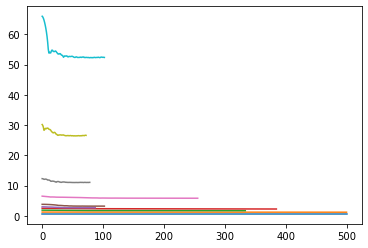

In [49]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=1, target=None,
                                     model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                     norm = 'uniform', patience=20, epochs=500, lr=1e-2, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

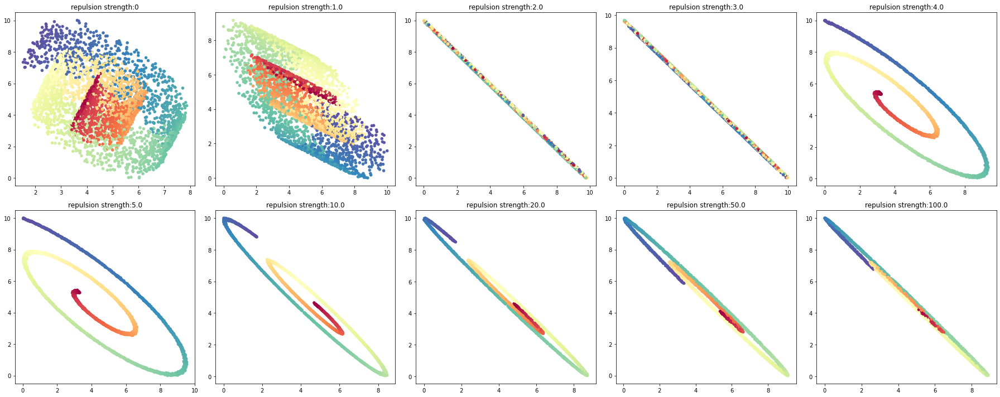

In [50]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

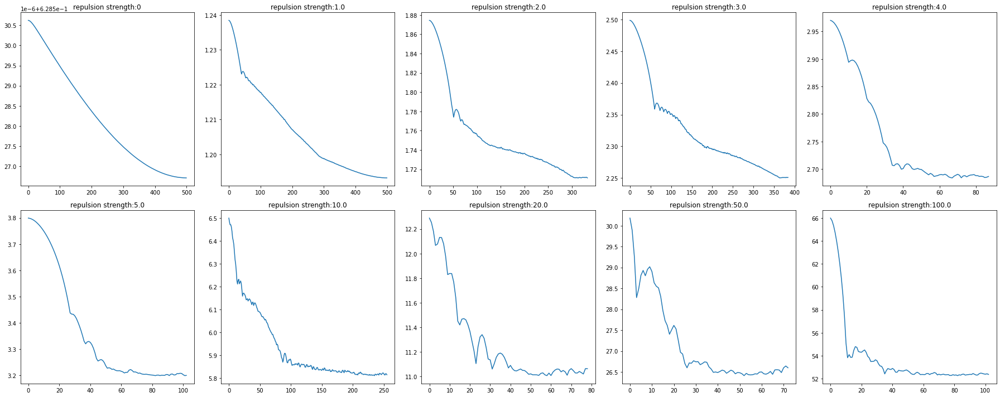

In [51]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=000, loss=0.6950, time=0.0136
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=001, loss=0.6950, time=0.0127
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=002, loss=0.6950, time=0.0186
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=003, loss=0.6950, time=0.0151
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=004, loss=0.6950, time=0.0160
loss poss tensor(0.6950, grad_fn=<

loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=045, loss=0.6950, time=0.0255
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=046, loss=0.6950, time=0.0213
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=047, loss=0.6950, time=0.0191
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=048, loss=0.6950, time=0.0182
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=049, loss=0.6950, time=0.0180
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch

loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=091, loss=0.6950, time=0.0196
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=092, loss=0.6950, time=0.0160
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=093, loss=0.6950, time=0.0150
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=094, loss=0.6950, time=0.0153
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=095, loss=0.6950, time=0.0157
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch

Epoch=140, loss=0.6950, time=0.0146
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=141, loss=0.6950, time=0.0182
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=142, loss=0.6950, time=0.0151
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=143, loss=0.6950, time=0.0141
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=144, loss=0.6950, time=0.0132
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=145, loss=0.6950, time=0.0131
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor

loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=194, loss=0.6950, time=0.0205
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=195, loss=0.6950, time=0.0150
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=196, loss=0.6950, time=0.0213
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=197, loss=0.6950, time=0.0132
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=198, loss=0.6950, time=0.0140
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=251, loss=0.6950, time=0.0184
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=252, loss=0.6950, time=0.0402
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=253, loss=0.6950, time=0.0138
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=254, loss=0.6950, time=0.0145
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=255, loss=0.6950, time=0.0176
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch

loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=297, loss=0.6950, time=0.0156
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=298, loss=0.6950, time=0.0152
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=299, loss=0.6950, time=0.0158
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=300, loss=0.6950, time=0.0147
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=301, loss=0.6950, time=0.0161
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch

loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=343, loss=0.6950, time=0.0285
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=344, loss=0.6950, time=0.0230
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=345, loss=0.6950, time=0.0241
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=346, loss=0.6950, time=0.0215
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=347, loss=0.6950, time=0.0226
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch

loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=390, loss=0.6950, time=0.0223
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=391, loss=0.6950, time=0.0160
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=392, loss=0.6950, time=0.0169
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=393, loss=0.6950, time=0.0224
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=394, loss=0.6950, time=0.0174
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=445, loss=0.6950, time=0.0181
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=446, loss=0.6950, time=0.0148
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=447, loss=0.6950, time=0.0141
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=448, loss=0.6950, time=0.0155
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=449, loss=0.6950, time=0.0189
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

Epoch=495, loss=0.6950, time=0.0150
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=496, loss=0.6950, time=0.0191
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=497, loss=0.6950, time=0.0151
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=498, loss=0.6950, time=0.0144
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6950, grad_fn=<AddBackward0>)
Epoch=499, loss=0.6950, time=0.0144
Loading 480th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5838, grad_fn=<NegBackward0>)
loss final tensor(1.2787, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2787, time=0.0130
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5837, grad_fn=<NegBackward0>)
loss final tensor(1.2787, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2787, time=0.0158
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5836, grad_fn=<NegBackward0>)
loss final tensor(1.2786, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2786, time=0.0155
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5834, grad_fn=<NegBackward0>)
loss final tensor(1.2784, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2784, time=0.0217
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5832, grad_fn=<NegBackward0>)
loss final tensor(1.2782, grad_fn=<AddBackward0>)
Epoch=004, loss=1.2782, time=0.0211
loss poss tensor(0.

loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5729, grad_fn=<NegBackward0>)
loss final tensor(1.2679, grad_fn=<AddBackward0>)
Epoch=050, loss=1.2679, time=0.0196
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5727, grad_fn=<NegBackward0>)
loss final tensor(1.2677, grad_fn=<AddBackward0>)
Epoch=051, loss=1.2677, time=0.0140
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5726, grad_fn=<NegBackward0>)
loss final tensor(1.2677, grad_fn=<AddBackward0>)
Epoch=052, loss=1.2677, time=0.0148
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5726, grad_fn=<NegBackward0>)
loss final tensor(1.2676, grad_fn=<AddBackward0>)
Epoch=053, loss=1.2676, time=0.0134
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5725, grad_fn=<NegBackward0>)
loss final tensor(1.2675, grad_fn=<AddBackward0>)
Epoch=054, loss=1.2675, time=0.0134
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5724, grad_fn=<Neg

loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5683, grad_fn=<NegBackward0>)
loss final tensor(1.2633, grad_fn=<AddBackward0>)
Epoch=095, loss=1.2633, time=0.0209
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5683, grad_fn=<NegBackward0>)
loss final tensor(1.2633, grad_fn=<AddBackward0>)
Epoch=096, loss=1.2633, time=0.0149
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5682, grad_fn=<NegBackward0>)
loss final tensor(1.2632, grad_fn=<AddBackward0>)
Epoch=097, loss=1.2632, time=0.0142
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5681, grad_fn=<NegBackward0>)
loss final tensor(1.2631, grad_fn=<AddBackward0>)
Epoch=098, loss=1.2631, time=0.0142
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5680, grad_fn=<NegBackward0>)
loss final tensor(1.2630, grad_fn=<AddBackward0>)
Epoch=099, loss=1.2630, time=0.0155
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5680, grad_fn=<Neg

loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5657, grad_fn=<NegBackward0>)
loss final tensor(1.2607, grad_fn=<AddBackward0>)
Epoch=142, loss=1.2607, time=0.0297
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5657, grad_fn=<NegBackward0>)
loss final tensor(1.2607, grad_fn=<AddBackward0>)
Epoch=143, loss=1.2607, time=0.0223
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5656, grad_fn=<NegBackward0>)
loss final tensor(1.2606, grad_fn=<AddBackward0>)
Epoch=144, loss=1.2606, time=0.0201
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5655, grad_fn=<NegBackward0>)
loss final tensor(1.2606, grad_fn=<AddBackward0>)
Epoch=145, loss=1.2606, time=0.0268
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5655, grad_fn=<NegBackward0>)
loss final tensor(1.2605, grad_fn=<AddBackward0>)
Epoch=146, loss=1.2605, time=0.0215
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5654, grad_fn=<Neg

loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5624, grad_fn=<NegBackward0>)
loss final tensor(1.2575, grad_fn=<AddBackward0>)
Epoch=188, loss=1.2575, time=0.0213
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5623, grad_fn=<NegBackward0>)
loss final tensor(1.2574, grad_fn=<AddBackward0>)
Epoch=189, loss=1.2574, time=0.0156
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5622, grad_fn=<NegBackward0>)
loss final tensor(1.2572, grad_fn=<AddBackward0>)
Epoch=190, loss=1.2572, time=0.0140
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5621, grad_fn=<NegBackward0>)
loss final tensor(1.2572, grad_fn=<AddBackward0>)
Epoch=191, loss=1.2572, time=0.0139
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5620, grad_fn=<NegBackward0>)
loss final tensor(1.2570, grad_fn=<AddBackward0>)
Epoch=192, loss=1.2570, time=0.0157
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5619, grad_fn=<Neg

loss neg tensor(0.5575, grad_fn=<NegBackward0>)
loss final tensor(1.2526, grad_fn=<AddBackward0>)
Epoch=236, loss=1.2526, time=0.0171
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5574, grad_fn=<NegBackward0>)
loss final tensor(1.2525, grad_fn=<AddBackward0>)
Epoch=237, loss=1.2525, time=0.0143
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5574, grad_fn=<NegBackward0>)
loss final tensor(1.2524, grad_fn=<AddBackward0>)
Epoch=238, loss=1.2524, time=0.0146
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5572, grad_fn=<NegBackward0>)
loss final tensor(1.2522, grad_fn=<AddBackward0>)
Epoch=239, loss=1.2522, time=0.0131
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5571, grad_fn=<NegBackward0>)
loss final tensor(1.2521, grad_fn=<AddBackward0>)
Epoch=240, loss=1.2521, time=0.0148
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(0.5570, grad_fn=<NegBackward0>)
loss final tensor(1.2520, grad_fn=<Ad

Epoch=282, loss=1.2464, time=0.0153
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5512, grad_fn=<NegBackward0>)
loss final tensor(1.2463, grad_fn=<AddBackward0>)
Epoch=283, loss=1.2463, time=0.0157
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5511, grad_fn=<NegBackward0>)
loss final tensor(1.2461, grad_fn=<AddBackward0>)
Epoch=284, loss=1.2461, time=0.0138
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5509, grad_fn=<NegBackward0>)
loss final tensor(1.2460, grad_fn=<AddBackward0>)
Epoch=285, loss=1.2460, time=0.0148
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5508, grad_fn=<NegBackward0>)
loss final tensor(1.2458, grad_fn=<AddBackward0>)
Epoch=286, loss=1.2458, time=0.0145
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5507, grad_fn=<NegBackward0>)
loss final tensor(1.2457, grad_fn=<AddBackward0>)
Epoch=287, loss=1.2457, time=0.0148
loss poss tensor(0.6951, grad_fn=<NegBackward0>)


loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5437, grad_fn=<NegBackward0>)
loss final tensor(1.2388, grad_fn=<AddBackward0>)
Epoch=329, loss=1.2388, time=0.0271
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5435, grad_fn=<NegBackward0>)
loss final tensor(1.2387, grad_fn=<AddBackward0>)
Epoch=330, loss=1.2387, time=0.0204
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5433, grad_fn=<NegBackward0>)
loss final tensor(1.2384, grad_fn=<AddBackward0>)
Epoch=331, loss=1.2384, time=0.0177
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5432, grad_fn=<NegBackward0>)
loss final tensor(1.2383, grad_fn=<AddBackward0>)
Epoch=332, loss=1.2383, time=0.0201
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5431, grad_fn=<NegBackward0>)
loss final tensor(1.2382, grad_fn=<AddBackward0>)
Epoch=333, loss=1.2382, time=0.0216
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(0.5429, grad_fn=<Neg

loss neg tensor(0.5353, grad_fn=<NegBackward0>)
loss final tensor(1.2305, grad_fn=<AddBackward0>)
Epoch=375, loss=1.2305, time=0.0197
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5352, grad_fn=<NegBackward0>)
loss final tensor(1.2303, grad_fn=<AddBackward0>)
Epoch=376, loss=1.2303, time=0.0146
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5350, grad_fn=<NegBackward0>)
loss final tensor(1.2302, grad_fn=<AddBackward0>)
Epoch=377, loss=1.2302, time=0.0148
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5348, grad_fn=<NegBackward0>)
loss final tensor(1.2300, grad_fn=<AddBackward0>)
Epoch=378, loss=1.2300, time=0.0149
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5346, grad_fn=<NegBackward0>)
loss final tensor(1.2298, grad_fn=<AddBackward0>)
Epoch=379, loss=1.2298, time=0.0145
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5344, grad_fn=<NegBackward0>)
loss final tensor(1.2296, grad_fn=<Ad

Epoch=420, loss=1.2245, time=0.0549
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5292, grad_fn=<NegBackward0>)
loss final tensor(1.2244, grad_fn=<AddBackward0>)
Epoch=421, loss=1.2244, time=0.0452
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5292, grad_fn=<NegBackward0>)
loss final tensor(1.2244, grad_fn=<AddBackward0>)
Epoch=422, loss=1.2244, time=0.0421
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5290, grad_fn=<NegBackward0>)
loss final tensor(1.2242, grad_fn=<AddBackward0>)
Epoch=423, loss=1.2242, time=0.0463
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5290, grad_fn=<NegBackward0>)
loss final tensor(1.2242, grad_fn=<AddBackward0>)
Epoch=424, loss=1.2242, time=0.0493
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5289, grad_fn=<NegBackward0>)
loss final tensor(1.2241, grad_fn=<AddBackward0>)
Epoch=425, loss=1.2241, time=0.0781
loss poss tensor(0.6952, grad_fn=<NegBackward0>)


loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5273, grad_fn=<NegBackward0>)
loss final tensor(1.2226, grad_fn=<AddBackward0>)
Epoch=468, loss=1.2226, time=0.0261
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5273, grad_fn=<NegBackward0>)
loss final tensor(1.2225, grad_fn=<AddBackward0>)
Epoch=469, loss=1.2225, time=0.0254
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5273, grad_fn=<NegBackward0>)
loss final tensor(1.2225, grad_fn=<AddBackward0>)
Epoch=470, loss=1.2225, time=0.0206
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5273, grad_fn=<NegBackward0>)
loss final tensor(1.2225, grad_fn=<AddBackward0>)
Epoch=471, loss=1.2225, time=0.0203
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5273, grad_fn=<NegBackward0>)
loss final tensor(1.2225, grad_fn=<AddBackward0>)
Epoch=472, loss=1.2225, time=0.0225
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(0.5273, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.1375, grad_fn=<NegBackward0>)
loss final tensor(1.8327, grad_fn=<AddBackward0>)
Epoch=000, loss=1.8327, time=0.0212
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.1377, grad_fn=<NegBackward0>)
loss final tensor(1.8329, grad_fn=<AddBackward0>)
Epoch=001, loss=1.8329, time=0.0200
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.1376, grad_fn=<NegBackward0>)
loss final tensor(1.8328, grad_fn=<AddBackward0>)
Epoch=002, loss=1.8328, time=0.0197
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.1371, grad_fn=<NegBackward0>)
loss final tensor(1.8324, grad_fn=<AddBackward0>)
Epoch=003, loss=1.8324, time=0.0230
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(1.1376, grad_fn=<NegBackward0>)
loss final tensor(1.8328, grad_fn=<AddBackward0>)
Epoch=004, loss=1.8328, time=0.0213
loss poss tensor(0.

loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.1174, grad_fn=<NegBackward0>)
loss final tensor(1.8128, grad_fn=<AddBackward0>)
Epoch=048, loss=1.8128, time=0.0232
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.1173, grad_fn=<NegBackward0>)
loss final tensor(1.8127, grad_fn=<AddBackward0>)
Epoch=049, loss=1.8127, time=0.0202
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.1168, grad_fn=<NegBackward0>)
loss final tensor(1.8122, grad_fn=<AddBackward0>)
Epoch=050, loss=1.8122, time=0.0203
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.1160, grad_fn=<NegBackward0>)
loss final tensor(1.8114, grad_fn=<AddBackward0>)
Epoch=051, loss=1.8114, time=0.0223
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.1156, grad_fn=<NegBackward0>)
loss final tensor(1.8110, grad_fn=<AddBackward0>)
Epoch=052, loss=1.8110, time=0.0205
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.1155, grad_fn=<Neg

Epoch=093, loss=1.7921, time=0.0236
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.0965, grad_fn=<NegBackward0>)
loss final tensor(1.7920, grad_fn=<AddBackward0>)
Epoch=094, loss=1.7920, time=0.0212
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.0959, grad_fn=<NegBackward0>)
loss final tensor(1.7914, grad_fn=<AddBackward0>)
Epoch=095, loss=1.7914, time=0.0203
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.0957, grad_fn=<NegBackward0>)
loss final tensor(1.7912, grad_fn=<AddBackward0>)
Epoch=096, loss=1.7912, time=0.0201
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.0953, grad_fn=<NegBackward0>)
loss final tensor(1.7908, grad_fn=<AddBackward0>)
Epoch=097, loss=1.7908, time=0.0219
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.0948, grad_fn=<NegBackward0>)
loss final tensor(1.7903, grad_fn=<AddBackward0>)
Epoch=098, loss=1.7903, time=0.0199
loss poss tensor(0.6955, grad_fn=<NegBackward0>)


Epoch=138, loss=1.7782, time=0.0244
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(1.0825, grad_fn=<NegBackward0>)
loss final tensor(1.7780, grad_fn=<AddBackward0>)
Epoch=139, loss=1.7780, time=0.0201
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(1.0826, grad_fn=<NegBackward0>)
loss final tensor(1.7782, grad_fn=<AddBackward0>)
Epoch=140, loss=1.7782, time=0.0194
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(1.0824, grad_fn=<NegBackward0>)
loss final tensor(1.7780, grad_fn=<AddBackward0>)
Epoch=141, loss=1.7780, time=0.0189
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(1.0821, grad_fn=<NegBackward0>)
loss final tensor(1.7777, grad_fn=<AddBackward0>)
Epoch=142, loss=1.7777, time=0.0193
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(1.0819, grad_fn=<NegBackward0>)
loss final tensor(1.7775, grad_fn=<AddBackward0>)
Epoch=143, loss=1.7775, time=0.0204
loss poss tensor(0.6956, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(1.9799, grad_fn=<NegBackward0>)
loss final tensor(2.6748, grad_fn=<AddBackward0>)
Epoch=000, loss=2.6748, time=0.0228
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(1.9793, grad_fn=<NegBackward0>)
loss final tensor(2.6742, grad_fn=<AddBackward0>)
Epoch=001, loss=2.6742, time=0.0209
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(1.9782, grad_fn=<NegBackward0>)
loss final tensor(2.6731, grad_fn=<AddBackward0>)
Epoch=002, loss=2.6731, time=0.0239
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(1.9766, grad_fn=<NegBackward0>)
loss final tensor(2.6715, grad_fn=<AddBackward0>)
Epoch=003, loss=2.6715, time=0.0197
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(1.9746, grad_fn=<NegBackward0>)
loss final tensor(2.6695, grad_fn=<AddBackward0>)
Epoch=004, loss=2.6695, time=0.0240
loss poss tensor(0.

loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.7389, grad_fn=<NegBackward0>)
loss final tensor(2.4342, grad_fn=<AddBackward0>)
Epoch=045, loss=2.4342, time=0.1316
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.7330, grad_fn=<NegBackward0>)
loss final tensor(2.4283, grad_fn=<AddBackward0>)
Epoch=046, loss=2.4283, time=0.0239
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.7260, grad_fn=<NegBackward0>)
loss final tensor(2.4214, grad_fn=<AddBackward0>)
Epoch=047, loss=2.4214, time=0.0300
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.7180, grad_fn=<NegBackward0>)
loss final tensor(2.4134, grad_fn=<AddBackward0>)
Epoch=048, loss=2.4134, time=0.0194
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.7160, grad_fn=<NegBackward0>)
loss final tensor(2.4114, grad_fn=<AddBackward0>)
Epoch=049, loss=2.4114, time=0.0198
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.7162, grad_fn=<Neg

Epoch=091, loss=2.3543, time=0.0195
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.6585, grad_fn=<NegBackward0>)
loss final tensor(2.3538, grad_fn=<AddBackward0>)
Epoch=092, loss=2.3538, time=0.0230
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.6577, grad_fn=<NegBackward0>)
loss final tensor(2.3530, grad_fn=<AddBackward0>)
Epoch=093, loss=2.3530, time=0.0206
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.6567, grad_fn=<NegBackward0>)
loss final tensor(2.3520, grad_fn=<AddBackward0>)
Epoch=094, loss=2.3520, time=0.0200
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.6553, grad_fn=<NegBackward0>)
loss final tensor(2.3506, grad_fn=<AddBackward0>)
Epoch=095, loss=2.3506, time=0.0224
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.6537, grad_fn=<NegBackward0>)
loss final tensor(2.3490, grad_fn=<AddBackward0>)
Epoch=096, loss=2.3490, time=0.0188
loss poss tensor(0.6953, grad_fn=<NegBackward0>)


loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(1.6185, grad_fn=<NegBackward0>)
loss final tensor(2.3138, grad_fn=<AddBackward0>)
Epoch=138, loss=2.3138, time=0.0244
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.6173, grad_fn=<NegBackward0>)
loss final tensor(2.3126, grad_fn=<AddBackward0>)
Epoch=139, loss=2.3126, time=0.0205
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.6162, grad_fn=<NegBackward0>)
loss final tensor(2.3115, grad_fn=<AddBackward0>)
Epoch=140, loss=2.3115, time=0.0200
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.6146, grad_fn=<NegBackward0>)
loss final tensor(2.3100, grad_fn=<AddBackward0>)
Epoch=141, loss=2.3100, time=0.0192
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.6150, grad_fn=<NegBackward0>)
loss final tensor(2.3104, grad_fn=<AddBackward0>)
Epoch=142, loss=2.3104, time=0.0204
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(1.6143, grad_fn=<Neg

Epoch=182, loss=2.2673, time=0.0220
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5705, grad_fn=<NegBackward0>)
loss final tensor(2.2659, grad_fn=<AddBackward0>)
Epoch=183, loss=2.2659, time=0.0207
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5681, grad_fn=<NegBackward0>)
loss final tensor(2.2636, grad_fn=<AddBackward0>)
Epoch=184, loss=2.2636, time=0.0199
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5669, grad_fn=<NegBackward0>)
loss final tensor(2.2623, grad_fn=<AddBackward0>)
Epoch=185, loss=2.2623, time=0.0203
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5653, grad_fn=<NegBackward0>)
loss final tensor(2.2607, grad_fn=<AddBackward0>)
Epoch=186, loss=2.2607, time=0.0223
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5651, grad_fn=<NegBackward0>)
loss final tensor(2.2606, grad_fn=<AddBackward0>)
Epoch=187, loss=2.2606, time=0.0193
loss poss tensor(0.6955, grad_fn=<NegBackward0>)


Epoch=228, loss=2.2451, time=0.0205
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5492, grad_fn=<NegBackward0>)
loss final tensor(2.2447, grad_fn=<AddBackward0>)
Epoch=229, loss=2.2447, time=0.0235
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5495, grad_fn=<NegBackward0>)
loss final tensor(2.2450, grad_fn=<AddBackward0>)
Epoch=230, loss=2.2450, time=0.0220
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5498, grad_fn=<NegBackward0>)
loss final tensor(2.2454, grad_fn=<AddBackward0>)
Epoch=231, loss=2.2454, time=0.0200
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5496, grad_fn=<NegBackward0>)
loss final tensor(2.2451, grad_fn=<AddBackward0>)
Epoch=232, loss=2.2451, time=0.0208
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5490, grad_fn=<NegBackward0>)
loss final tensor(2.2445, grad_fn=<AddBackward0>)
Epoch=233, loss=2.2445, time=0.0228
loss poss tensor(0.6955, grad_fn=<NegBackward0>)


Epoch=275, loss=2.2439, time=0.0238
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5483, grad_fn=<NegBackward0>)
loss final tensor(2.2438, grad_fn=<AddBackward0>)
Epoch=276, loss=2.2438, time=0.0215
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5481, grad_fn=<NegBackward0>)
loss final tensor(2.2436, grad_fn=<AddBackward0>)
Epoch=277, loss=2.2436, time=0.0200
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5483, grad_fn=<NegBackward0>)
loss final tensor(2.2438, grad_fn=<AddBackward0>)
Epoch=278, loss=2.2438, time=0.0197
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5481, grad_fn=<NegBackward0>)
loss final tensor(2.2436, grad_fn=<AddBackward0>)
Epoch=279, loss=2.2436, time=0.0235
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(1.5486, grad_fn=<NegBackward0>)
loss final tensor(2.2441, grad_fn=<AddBackward0>)
Epoch=280, loss=2.2441, time=0.0201
loss poss tensor(0.6955, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(2.6604, grad_fn=<NegBackward0>)
loss final tensor(3.3552, grad_fn=<AddBackward0>)
Epoch=000, loss=3.3552, time=0.0230
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(2.6592, grad_fn=<NegBackward0>)
loss final tensor(3.3540, grad_fn=<AddBackward0>)
Epoch=001, loss=3.3540, time=0.0296
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(2.6569, grad_fn=<NegBackward0>)
loss final tensor(3.3517, grad_fn=<AddBackward0>)
Epoch=002, loss=3.3517, time=0.0852
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(2.6537, grad_fn=<NegBackward0>)
loss final tensor(3.3485, grad_fn=<AddBackward0>)
Epoch=003, loss=3.3485, time=0.0443
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(2.6495, grad_fn=<NegBackward0>)
loss final tensor(3.3443, grad_fn=<AddBackward0>)
Epoch=004, loss=3.3443, time=0.0227
loss poss tensor(0.

loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(2.1761, grad_fn=<NegBackward0>)
loss final tensor(2.8712, grad_fn=<AddBackward0>)
Epoch=045, loss=2.8712, time=0.0256
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(2.1720, grad_fn=<NegBackward0>)
loss final tensor(2.8670, grad_fn=<AddBackward0>)
Epoch=046, loss=2.8670, time=0.0201
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.1631, grad_fn=<NegBackward0>)
loss final tensor(2.8582, grad_fn=<AddBackward0>)
Epoch=047, loss=2.8582, time=0.0291
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.1515, grad_fn=<NegBackward0>)
loss final tensor(2.8466, grad_fn=<AddBackward0>)
Epoch=048, loss=2.8466, time=0.0202
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.1447, grad_fn=<NegBackward0>)
loss final tensor(2.8398, grad_fn=<AddBackward0>)
Epoch=049, loss=2.8398, time=0.0240
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.1347, grad_fn=<Neg

Epoch=089, loss=2.7746, time=0.0218
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.0793, grad_fn=<NegBackward0>)
loss final tensor(2.7745, grad_fn=<AddBackward0>)
Epoch=090, loss=2.7745, time=0.0207
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.0797, grad_fn=<NegBackward0>)
loss final tensor(2.7749, grad_fn=<AddBackward0>)
Epoch=091, loss=2.7749, time=0.0192
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.0816, grad_fn=<NegBackward0>)
loss final tensor(2.7768, grad_fn=<AddBackward0>)
Epoch=092, loss=2.7768, time=0.0192
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.0818, grad_fn=<NegBackward0>)
loss final tensor(2.7770, grad_fn=<AddBackward0>)
Epoch=093, loss=2.7770, time=0.0206
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.0799, grad_fn=<NegBackward0>)
loss final tensor(2.7751, grad_fn=<AddBackward0>)
Epoch=094, loss=2.7751, time=0.0205
loss poss tensor(0.6952, grad_fn=<NegBackward0>)


loss neg tensor(2.0730, grad_fn=<NegBackward0>)
loss final tensor(2.7682, grad_fn=<AddBackward0>)
Epoch=135, loss=2.7682, time=0.0228
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.0723, grad_fn=<NegBackward0>)
loss final tensor(2.7676, grad_fn=<AddBackward0>)
Epoch=136, loss=2.7676, time=0.0205
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.0740, grad_fn=<NegBackward0>)
loss final tensor(2.7692, grad_fn=<AddBackward0>)
Epoch=137, loss=2.7692, time=0.0191
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.0733, grad_fn=<NegBackward0>)
loss final tensor(2.7685, grad_fn=<AddBackward0>)
Epoch=138, loss=2.7685, time=0.0198
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.0713, grad_fn=<NegBackward0>)
loss final tensor(2.7666, grad_fn=<AddBackward0>)
Epoch=139, loss=2.7666, time=0.0250
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.0711, grad_fn=<NegBackward0>)
loss final tensor(2.7663, grad_fn=<Ad

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(3.4283, grad_fn=<NegBackward0>)
loss final tensor(4.1232, grad_fn=<AddBackward0>)
Epoch=000, loss=4.1232, time=0.0207
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(3.4277, grad_fn=<NegBackward0>)
loss final tensor(4.1226, grad_fn=<AddBackward0>)
Epoch=001, loss=4.1226, time=0.0190
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(3.4267, grad_fn=<NegBackward0>)
loss final tensor(4.1216, grad_fn=<AddBackward0>)
Epoch=002, loss=4.1216, time=0.0221
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(3.4252, grad_fn=<NegBackward0>)
loss final tensor(4.1200, grad_fn=<AddBackward0>)
Epoch=003, loss=4.1200, time=0.0193
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(3.4232, grad_fn=<NegBackward0>)
loss final tensor(4.1181, grad_fn=<AddBackward0>)
Epoch=004, loss=4.1181, time=0.0217
loss poss tensor(0.

Epoch=047, loss=3.7070, time=0.0208
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(2.9981, grad_fn=<NegBackward0>)
loss final tensor(3.6931, grad_fn=<AddBackward0>)
Epoch=048, loss=3.6931, time=0.0218
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(2.9828, grad_fn=<NegBackward0>)
loss final tensor(3.6778, grad_fn=<AddBackward0>)
Epoch=049, loss=3.6778, time=0.0211
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(2.9662, grad_fn=<NegBackward0>)
loss final tensor(3.6612, grad_fn=<AddBackward0>)
Epoch=050, loss=3.6612, time=0.0213
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(2.9481, grad_fn=<NegBackward0>)
loss final tensor(3.6431, grad_fn=<AddBackward0>)
Epoch=051, loss=3.6431, time=0.0200
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(2.9286, grad_fn=<NegBackward0>)
loss final tensor(3.6237, grad_fn=<AddBackward0>)
Epoch=052, loss=3.6237, time=0.0221
loss poss tensor(0.6950, grad_fn=<NegBackward0>)


loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.7570, grad_fn=<NegBackward0>)
loss final tensor(3.4521, grad_fn=<AddBackward0>)
Epoch=094, loss=3.4521, time=0.0227
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.7540, grad_fn=<NegBackward0>)
loss final tensor(3.4491, grad_fn=<AddBackward0>)
Epoch=095, loss=3.4491, time=0.0191
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.7503, grad_fn=<NegBackward0>)
loss final tensor(3.4454, grad_fn=<AddBackward0>)
Epoch=096, loss=3.4454, time=0.0241
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.7534, grad_fn=<NegBackward0>)
loss final tensor(3.4485, grad_fn=<AddBackward0>)
Epoch=097, loss=3.4485, time=0.0191
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.7550, grad_fn=<NegBackward0>)
loss final tensor(3.4501, grad_fn=<AddBackward0>)
Epoch=098, loss=3.4501, time=0.0218
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.7539, grad_fn=<Neg

loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.7146, grad_fn=<NegBackward0>)
loss final tensor(3.4098, grad_fn=<AddBackward0>)
Epoch=144, loss=3.4098, time=0.0253
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.7123, grad_fn=<NegBackward0>)
loss final tensor(3.4074, grad_fn=<AddBackward0>)
Epoch=145, loss=3.4074, time=0.0267
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.7115, grad_fn=<NegBackward0>)
loss final tensor(3.4067, grad_fn=<AddBackward0>)
Epoch=146, loss=3.4067, time=0.0216
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.7132, grad_fn=<NegBackward0>)
loss final tensor(3.4084, grad_fn=<AddBackward0>)
Epoch=147, loss=3.4084, time=0.0239
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(2.7124, grad_fn=<NegBackward0>)
loss final tensor(3.4076, grad_fn=<AddBackward0>)
Epoch=148, loss=3.4076, time=0.0221
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.7102, grad_fn=<Neg

Epoch=188, loss=3.3597, time=0.0218
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.6627, grad_fn=<NegBackward0>)
loss final tensor(3.3579, grad_fn=<AddBackward0>)
Epoch=189, loss=3.3579, time=0.0205
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.6625, grad_fn=<NegBackward0>)
loss final tensor(3.3577, grad_fn=<AddBackward0>)
Epoch=190, loss=3.3577, time=0.0201
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.6605, grad_fn=<NegBackward0>)
loss final tensor(3.3557, grad_fn=<AddBackward0>)
Epoch=191, loss=3.3557, time=0.0234
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.6595, grad_fn=<NegBackward0>)
loss final tensor(3.3547, grad_fn=<AddBackward0>)
Epoch=192, loss=3.3547, time=0.0205
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.6578, grad_fn=<NegBackward0>)
loss final tensor(3.3531, grad_fn=<AddBackward0>)
Epoch=193, loss=3.3531, time=0.0196
loss poss tensor(0.6952, grad_fn=<NegBackward0>)


loss neg tensor(2.6364, grad_fn=<NegBackward0>)
loss final tensor(3.3316, grad_fn=<AddBackward0>)
Epoch=234, loss=3.3316, time=0.0228
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.6357, grad_fn=<NegBackward0>)
loss final tensor(3.3310, grad_fn=<AddBackward0>)
Epoch=235, loss=3.3310, time=0.0439
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.6357, grad_fn=<NegBackward0>)
loss final tensor(3.3309, grad_fn=<AddBackward0>)
Epoch=236, loss=3.3309, time=0.0208
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.6354, grad_fn=<NegBackward0>)
loss final tensor(3.3306, grad_fn=<AddBackward0>)
Epoch=237, loss=3.3306, time=0.0202
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.6343, grad_fn=<NegBackward0>)
loss final tensor(3.3295, grad_fn=<AddBackward0>)
Epoch=238, loss=3.3295, time=0.0203
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(2.6338, grad_fn=<NegBackward0>)
loss final tensor(3.3290, grad_fn=<Ad

Epoch=280, loss=3.3233, time=0.0213
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6274, grad_fn=<NegBackward0>)
loss final tensor(3.3227, grad_fn=<AddBackward0>)
Epoch=281, loss=3.3227, time=0.0230
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6260, grad_fn=<NegBackward0>)
loss final tensor(3.3213, grad_fn=<AddBackward0>)
Epoch=282, loss=3.3213, time=0.0201
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6276, grad_fn=<NegBackward0>)
loss final tensor(3.3229, grad_fn=<AddBackward0>)
Epoch=283, loss=3.3229, time=0.0208
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6285, grad_fn=<NegBackward0>)
loss final tensor(3.3237, grad_fn=<AddBackward0>)
Epoch=284, loss=3.3237, time=0.0203
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6282, grad_fn=<NegBackward0>)
loss final tensor(3.3235, grad_fn=<AddBackward0>)
Epoch=285, loss=3.3235, time=0.0198
loss poss tensor(0.6953, grad_fn=<NegBackward0>)


loss neg tensor(2.6213, grad_fn=<NegBackward0>)
loss final tensor(3.3166, grad_fn=<AddBackward0>)
Epoch=332, loss=3.3166, time=0.0270
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6208, grad_fn=<NegBackward0>)
loss final tensor(3.3161, grad_fn=<AddBackward0>)
Epoch=333, loss=3.3161, time=0.0223
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6209, grad_fn=<NegBackward0>)
loss final tensor(3.3161, grad_fn=<AddBackward0>)
Epoch=334, loss=3.3161, time=0.0239
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6215, grad_fn=<NegBackward0>)
loss final tensor(3.3168, grad_fn=<AddBackward0>)
Epoch=335, loss=3.3168, time=0.0211
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6215, grad_fn=<NegBackward0>)
loss final tensor(3.3168, grad_fn=<AddBackward0>)
Epoch=336, loss=3.3168, time=0.0214
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6209, grad_fn=<NegBackward0>)
loss final tensor(3.3161, grad_fn=<Ad

loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6185, grad_fn=<NegBackward0>)
loss final tensor(3.3137, grad_fn=<AddBackward0>)
Epoch=379, loss=3.3137, time=0.0238
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6183, grad_fn=<NegBackward0>)
loss final tensor(3.3136, grad_fn=<AddBackward0>)
Epoch=380, loss=3.3136, time=0.0202
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6179, grad_fn=<NegBackward0>)
loss final tensor(3.3132, grad_fn=<AddBackward0>)
Epoch=381, loss=3.3132, time=0.0199
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6185, grad_fn=<NegBackward0>)
loss final tensor(3.3137, grad_fn=<AddBackward0>)
Epoch=382, loss=3.3137, time=0.0201
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6186, grad_fn=<NegBackward0>)
loss final tensor(3.3139, grad_fn=<AddBackward0>)
Epoch=383, loss=3.3139, time=0.0192
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(2.6182, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(5.7783, grad_fn=<NegBackward0>)
loss final tensor(6.4733, grad_fn=<AddBackward0>)
Epoch=000, loss=6.4733, time=0.0209
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(5.7573, grad_fn=<NegBackward0>)
loss final tensor(6.4523, grad_fn=<AddBackward0>)
Epoch=001, loss=6.4523, time=0.0197
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(5.7634, grad_fn=<NegBackward0>)
loss final tensor(6.4584, grad_fn=<AddBackward0>)
Epoch=002, loss=6.4584, time=0.0213
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(5.7658, grad_fn=<NegBackward0>)
loss final tensor(6.4608, grad_fn=<AddBackward0>)
Epoch=003, loss=6.4608, time=0.0222
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(5.7392, grad_fn=<NegBackward0>)
loss final tensor(6.4342, grad_fn=<AddBackward0>)
Epoch=004, loss=6.4342, time=0.0223
loss poss tensor(0.

Epoch=047, loss=5.9308, time=0.0209
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(5.2447, grad_fn=<NegBackward0>)
loss final tensor(5.9400, grad_fn=<AddBackward0>)
Epoch=048, loss=5.9400, time=0.0216
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.2313, grad_fn=<NegBackward0>)
loss final tensor(5.9267, grad_fn=<AddBackward0>)
Epoch=049, loss=5.9267, time=0.0187
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.2110, grad_fn=<NegBackward0>)
loss final tensor(5.9063, grad_fn=<AddBackward0>)
Epoch=050, loss=5.9063, time=0.0193
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1966, grad_fn=<NegBackward0>)
loss final tensor(5.8920, grad_fn=<AddBackward0>)
Epoch=051, loss=5.8920, time=0.0232
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(5.1953, grad_fn=<NegBackward0>)
loss final tensor(5.8907, grad_fn=<AddBackward0>)
Epoch=052, loss=5.8907, time=0.0196
loss poss tensor(0.6954, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(11.7593, grad_fn=<NegBackward0>)
loss final tensor(12.4543, grad_fn=<AddBackward0>)
Epoch=000, loss=12.4543, time=0.0236
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(11.7416, grad_fn=<NegBackward0>)
loss final tensor(12.4366, grad_fn=<AddBackward0>)
Epoch=001, loss=12.4366, time=0.0200
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(11.7070, grad_fn=<NegBackward0>)
loss final tensor(12.4020, grad_fn=<AddBackward0>)
Epoch=002, loss=12.4020, time=0.0192
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(11.6552, grad_fn=<NegBackward0>)
loss final tensor(12.3503, grad_fn=<AddBackward0>)
Epoch=003, loss=12.3503, time=0.0194
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(11.5852, grad_fn=<NegBackward0>)
loss final tensor(12.2803, grad_fn=<AddBackward0>)
Epoch=004, loss=12.2803, time=0.0242
loss

loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(11.0621, grad_fn=<NegBackward0>)
loss final tensor(11.7573, grad_fn=<AddBackward0>)
Epoch=045, loss=11.7573, time=0.0251
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(11.0075, grad_fn=<NegBackward0>)
loss final tensor(11.7027, grad_fn=<AddBackward0>)
Epoch=046, loss=11.7027, time=0.0211
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(10.9401, grad_fn=<NegBackward0>)
loss final tensor(11.6353, grad_fn=<AddBackward0>)
Epoch=047, loss=11.6353, time=0.0198
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(10.9579, grad_fn=<NegBackward0>)
loss final tensor(11.6531, grad_fn=<AddBackward0>)
Epoch=048, loss=11.6531, time=0.0198
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(11.0087, grad_fn=<NegBackward0>)
loss final tensor(11.7039, grad_fn=<AddBackward0>)
Epoch=049, loss=11.7039, time=0.0209
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(11.03

Epoch=091, loss=11.1188, time=0.0201
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(10.4137, grad_fn=<NegBackward0>)
loss final tensor(11.1092, grad_fn=<AddBackward0>)
Epoch=092, loss=11.1092, time=0.0210
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.3690, grad_fn=<NegBackward0>)
loss final tensor(11.0645, grad_fn=<AddBackward0>)
Epoch=093, loss=11.0645, time=0.0195
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.3682, grad_fn=<NegBackward0>)
loss final tensor(11.0636, grad_fn=<AddBackward0>)
Epoch=094, loss=11.0636, time=0.0204
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(10.3968, grad_fn=<NegBackward0>)
loss final tensor(11.0922, grad_fn=<AddBackward0>)
Epoch=095, loss=11.0922, time=0.0199
loss poss tensor(0.6954, grad_fn=<NegBackward0>)
loss neg tensor(10.3917, grad_fn=<NegBackward0>)
loss final tensor(11.0871, grad_fn=<AddBackward0>)
Epoch=096, loss=11.0871, time=0.0230
loss poss tensor(0.6954, grad_fn=

loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2889, grad_fn=<NegBackward0>)
loss final tensor(10.9844, grad_fn=<AddBackward0>)
Epoch=136, loss=10.9844, time=0.0228
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2756, grad_fn=<NegBackward0>)
loss final tensor(10.9711, grad_fn=<AddBackward0>)
Epoch=137, loss=10.9711, time=0.0193
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2977, grad_fn=<NegBackward0>)
loss final tensor(10.9932, grad_fn=<AddBackward0>)
Epoch=138, loss=10.9932, time=0.0193
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.3011, grad_fn=<NegBackward0>)
loss final tensor(10.9966, grad_fn=<AddBackward0>)
Epoch=139, loss=10.9966, time=0.0191
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2927, grad_fn=<NegBackward0>)
loss final tensor(10.9882, grad_fn=<AddBackward0>)
Epoch=140, loss=10.9882, time=0.0202
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.30

loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2925, grad_fn=<NegBackward0>)
loss final tensor(10.9880, grad_fn=<AddBackward0>)
Epoch=181, loss=10.9880, time=0.0253
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2838, grad_fn=<NegBackward0>)
loss final tensor(10.9793, grad_fn=<AddBackward0>)
Epoch=182, loss=10.9793, time=0.0216
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2780, grad_fn=<NegBackward0>)
loss final tensor(10.9735, grad_fn=<AddBackward0>)
Epoch=183, loss=10.9735, time=0.0200
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2938, grad_fn=<NegBackward0>)
loss final tensor(10.9893, grad_fn=<AddBackward0>)
Epoch=184, loss=10.9893, time=0.0205
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.2918, grad_fn=<NegBackward0>)
loss final tensor(10.9873, grad_fn=<AddBackward0>)
Epoch=185, loss=10.9873, time=0.0204
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(10.28

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(32.2783, grad_fn=<NegBackward0>)
loss final tensor(32.9731, grad_fn=<AddBackward0>)
Epoch=000, loss=32.9731, time=0.0248
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(31.8960, grad_fn=<NegBackward0>)
loss final tensor(32.5909, grad_fn=<AddBackward0>)
Epoch=001, loss=32.5909, time=0.0266
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(31.3710, grad_fn=<NegBackward0>)
loss final tensor(32.0659, grad_fn=<AddBackward0>)
Epoch=002, loss=32.0659, time=0.0287
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(30.6837, grad_fn=<NegBackward0>)
loss final tensor(31.3786, grad_fn=<AddBackward0>)
Epoch=003, loss=31.3786, time=0.0242
loss poss tensor(0.6949, grad_fn=<NegBackward0>)
loss neg tensor(29.9382, grad_fn=<NegBackward0>)
loss final tensor(30.6331, grad_fn=<AddBackward0>)
Epoch=004, loss=30.6331, time=0.0238
loss

loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(26.1704, grad_fn=<NegBackward0>)
loss final tensor(26.8656, grad_fn=<AddBackward0>)
Epoch=048, loss=26.8656, time=0.0314
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(26.1654, grad_fn=<NegBackward0>)
loss final tensor(26.8606, grad_fn=<AddBackward0>)
Epoch=049, loss=26.8606, time=0.0248
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(26.1183, grad_fn=<NegBackward0>)
loss final tensor(26.8135, grad_fn=<AddBackward0>)
Epoch=050, loss=26.8135, time=0.0260
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(26.0376, grad_fn=<NegBackward0>)
loss final tensor(26.7329, grad_fn=<AddBackward0>)
Epoch=051, loss=26.7329, time=0.0243
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(25.9944, grad_fn=<NegBackward0>)
loss final tensor(26.6896, grad_fn=<AddBackward0>)
Epoch=052, loss=26.6896, time=0.0183
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(26.05

Epoch=095, loss=26.6052, time=0.0241
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.9109, grad_fn=<NegBackward0>)
loss final tensor(26.6061, grad_fn=<AddBackward0>)
Epoch=096, loss=26.6061, time=0.0325
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8959, grad_fn=<NegBackward0>)
loss final tensor(26.5912, grad_fn=<AddBackward0>)
Epoch=097, loss=26.5912, time=0.0285
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(25.9186, grad_fn=<NegBackward0>)
loss final tensor(26.6138, grad_fn=<AddBackward0>)
Epoch=098, loss=26.6138, time=0.0233
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(25.9326, grad_fn=<NegBackward0>)
loss final tensor(26.6278, grad_fn=<AddBackward0>)
Epoch=099, loss=26.6278, time=0.0239
loss poss tensor(0.6953, grad_fn=<NegBackward0>)
loss neg tensor(25.8626, grad_fn=<NegBackward0>)
loss final tensor(26.5579, grad_fn=<AddBackward0>)
Epoch=100, loss=26.5579, time=0.0191
loss poss tensor(0.6953, grad_fn=

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(58.3076, grad_fn=<NegBackward0>)
loss final tensor(59.0027, grad_fn=<AddBackward0>)
Epoch=000, loss=59.0027, time=0.0216
loss poss tensor(0.6952, grad_fn=<NegBackward0>)
loss neg tensor(57.5065, grad_fn=<NegBackward0>)
loss final tensor(58.2017, grad_fn=<AddBackward0>)
Epoch=001, loss=58.2017, time=0.0199
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(58.4274, grad_fn=<NegBackward0>)
loss final tensor(59.1225, grad_fn=<AddBackward0>)
Epoch=002, loss=59.1225, time=0.0225
loss poss tensor(0.6950, grad_fn=<NegBackward0>)
loss neg tensor(58.8385, grad_fn=<NegBackward0>)
loss final tensor(59.5335, grad_fn=<AddBackward0>)
Epoch=003, loss=59.5335, time=0.0209
loss poss tensor(0.6951, grad_fn=<NegBackward0>)
loss neg tensor(58.5634, grad_fn=<NegBackward0>)
loss final tensor(59.2584, grad_fn=<AddBackward0>)
Epoch=004, loss=59.2584, time=0.0230
loss

Epoch=047, loss=54.9969, time=0.0218
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.2482, grad_fn=<NegBackward0>)
loss final tensor(54.9438, grad_fn=<AddBackward0>)
Epoch=048, loss=54.9438, time=0.0426
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.2692, grad_fn=<NegBackward0>)
loss final tensor(54.9648, grad_fn=<AddBackward0>)
Epoch=049, loss=54.9648, time=0.0242
loss poss tensor(0.6956, grad_fn=<NegBackward0>)
loss neg tensor(54.1143, grad_fn=<NegBackward0>)
loss final tensor(54.8099, grad_fn=<AddBackward0>)
Epoch=050, loss=54.8099, time=0.0219
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(54.4341, grad_fn=<NegBackward0>)
loss final tensor(55.1296, grad_fn=<AddBackward0>)
Epoch=051, loss=55.1296, time=0.0205
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(54.4763, grad_fn=<NegBackward0>)
loss final tensor(55.1718, grad_fn=<AddBackward0>)
Epoch=052, loss=55.1718, time=0.0201
loss poss tensor(0.6956, grad_fn=

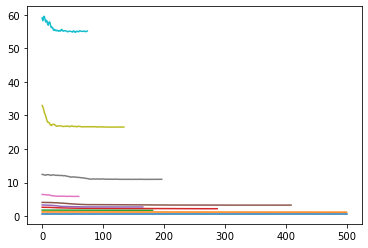

In [52]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=1, target=None,
                                  model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                  norm = 'uniform', patience=20, epochs=500, lr=1e-2, wd=1e-2,
                                  min_dist=0.1, name_file="1", subsampling=None,
                                  spread = 1.0, repulsion_strength=repulsion_strength[i],
                                  device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

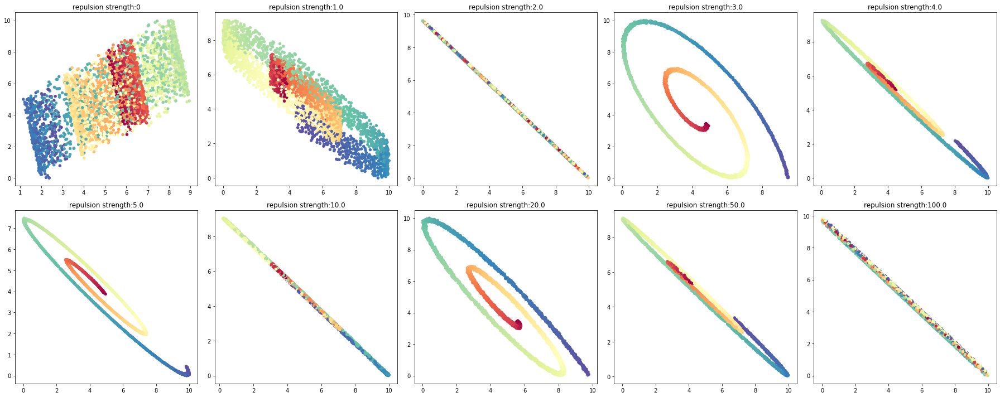

In [53]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

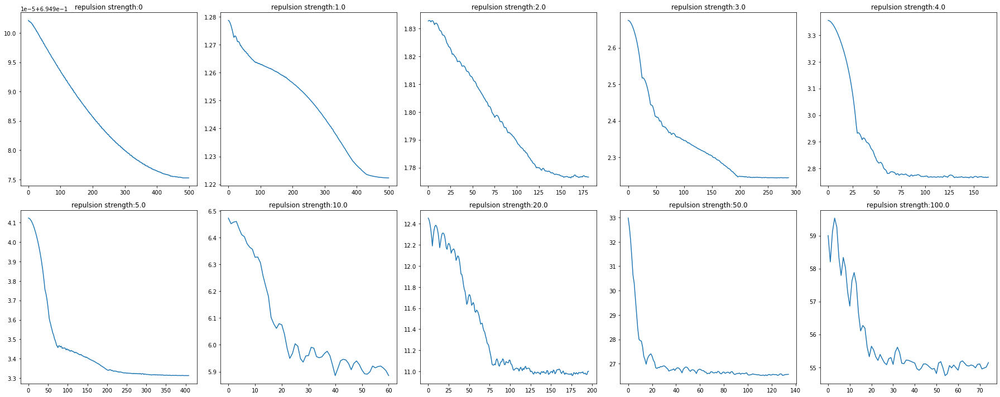

In [54]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

### MLP

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6515, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6515, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.6515, time=0.0292
loss poss tensor(0.6482, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6482, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.6482, time=0.0233
loss poss tensor(0.6453, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6453, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.6453, time=0.0226
loss poss tensor(0.6426, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6426, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.6426, time=0.0279
loss poss tensor(0.6410, dtype=torch.float64, 

loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6363, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=0.6363, time=0.0604
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6363, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=0.6363, time=0.0321
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6363, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=0.6363, time=0.0351
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6362, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=0.6362, time=0.0297
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Epoch=080, loss=0.6359, time=0.0291
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6359, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=0.6359, time=0.0253
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6359, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=082, loss=0.6359, time=0.0218
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6358, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=083, loss=0.6358, time=0.0230
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6358, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=084, loss=0.6358, time=0.0217
loss poss tensor(0.6358, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Epoch=121, loss=0.6362, time=0.0281
loss poss tensor(0.6361, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6361, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=122, loss=0.6361, time=0.0241
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6362, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=123, loss=0.6362, time=0.0231
loss poss tensor(0.6361, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6361, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=124, loss=0.6361, time=0.0225
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6359, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=125, loss=0.6359, time=0.0209
loss poss tensor(0.6360, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6348, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=161, loss=0.6348, time=0.0287
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6349, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=162, loss=0.6349, time=0.0226
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6349, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=163, loss=0.6349, time=0.0235
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6348, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=164, loss=0.6348, time=0.0243
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=202, loss=0.6284, time=0.0289
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=203, loss=0.6284, time=0.0223
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=204, loss=0.6284, time=0.0233
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=205, loss=0.6284, time=0.0253
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=242, loss=0.6284, time=0.0264
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=243, loss=0.6284, time=0.0247
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=244, loss=0.6284, time=0.0234
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=245, loss=0.6284, time=0.0243
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=286, loss=0.6284, time=0.0354
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=287, loss=0.6284, time=0.0280
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=288, loss=0.6284, time=0.0331
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=289, loss=0.6284, time=0.0232
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward

Epoch=324, loss=0.6284, time=0.0282
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=325, loss=0.6284, time=0.0241
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=326, loss=0.6284, time=0.0283
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=327, loss=0.6284, time=0.0238
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=328, loss=0.6284, time=0.0243
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=364, loss=0.6284, time=0.1046
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=365, loss=0.6284, time=0.0269
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=366, loss=0.6284, time=0.0239
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=367, loss=0.6284, time=0.0258
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Epoch=402, loss=0.6284, time=0.0262
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=403, loss=0.6284, time=0.0256
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=404, loss=0.6284, time=0.0232
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=405, loss=0.6284, time=0.0240
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=406, loss=0.6284, time=0.0228
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=441, loss=0.6284, time=0.0285
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=442, loss=0.6284, time=0.0230
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=443, loss=0.6284, time=0.0231
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=444, loss=0.6284, time=0.0241
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0

Epoch=478, loss=0.6284, time=0.0979
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=479, loss=0.6284, time=0.0435
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=480, loss=0.6284, time=0.0233
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=481, loss=0.6284, time=0.0222
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6284, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=482, loss=0.6284, time=0.0220
loss poss tensor(0.6284, dtype=torch.float64, grad_fn=<NegBackward0>)
loss n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6405, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3911, grad_fn=<NegBackward0>)
loss final tensor(1.0316, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.0316, time=0.0333
loss poss tensor(0.6420, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3270, grad_fn=<NegBackward0>)
loss final tensor(0.9691, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.9691, time=0.0440
loss poss tensor(0.6383, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3114, grad_fn=<NegBackward0>)
loss final tensor(0.9497, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.9497, time=0.0415
loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3185, grad_fn=<NegBackward0>)
loss final tensor(0.9557, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.9557, time=0.0317
loss poss tensor(0.6366, dtype=tor

Epoch=037, loss=0.9344, time=0.0414
loss poss tensor(0.6333, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3011, grad_fn=<NegBackward0>)
loss final tensor(0.9344, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=0.9344, time=0.0379
loss poss tensor(0.6333, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3010, grad_fn=<NegBackward0>)
loss final tensor(0.9343, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=0.9343, time=0.0335
loss poss tensor(0.6332, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3010, grad_fn=<NegBackward0>)
loss final tensor(0.9343, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=0.9343, time=0.0354
loss poss tensor(0.6332, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3010, grad_fn=<NegBackward0>)
loss final tensor(0.9342, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=0.9342, time=0.0364
loss poss tensor(0.6332, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=074, loss=0.9337, time=0.0272
loss poss tensor(0.6330, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3007, grad_fn=<NegBackward0>)
loss final tensor(0.9337, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=0.9337, time=0.0289
loss poss tensor(0.6330, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3007, grad_fn=<NegBackward0>)
loss final tensor(0.9337, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=0.9337, time=0.0249
loss poss tensor(0.6330, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3007, grad_fn=<NegBackward0>)
loss final tensor(0.9337, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=0.9337, time=0.0245
loss poss tensor(0.6330, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3007, grad_fn=<NegBackward0>)
loss final tensor(0.9337, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=0.9337, time=0.0281
loss poss tensor(0.6330, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6328, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9334, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=0.9334, time=0.0301
loss poss tensor(0.6328, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9334, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=116, loss=0.9334, time=0.0270
loss poss tensor(0.6328, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9334, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=117, loss=0.9334, time=0.0264
loss poss tensor(0.6328, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9334, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=118, loss=0.9334, time=0.0276
loss poss tensor(0.6328, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_f

Epoch=151, loss=0.9333, time=0.0379
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9333, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=152, loss=0.9333, time=0.0347
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9333, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=153, loss=0.9333, time=0.0228
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9333, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=154, loss=0.9333, time=0.0250
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9333, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=155, loss=0.9333, time=0.0230
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=188, loss=0.9333, time=0.0298
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9333, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=189, loss=0.9333, time=0.0269
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9333, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=190, loss=0.9333, time=0.0235
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9333, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=0.9333, time=0.0232
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3006, grad_fn=<NegBackward0>)
loss final tensor(0.9333, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=192, loss=0.9333, time=0.0270
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6326, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3005, grad_fn=<NegBackward0>)
loss final tensor(0.9332, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=231, loss=0.9332, time=0.0239
loss poss tensor(0.6326, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3005, grad_fn=<NegBackward0>)
loss final tensor(0.9332, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=232, loss=0.9332, time=0.0172
loss poss tensor(0.6326, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3005, grad_fn=<NegBackward0>)
loss final tensor(0.9332, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=233, loss=0.9332, time=0.0191
loss poss tensor(0.6326, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3005, grad_fn=<NegBackward0>)
loss final tensor(0.9332, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=234, loss=0.9332, time=0.0173
loss poss tensor(0.6326, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.3005, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6431, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6412, grad_fn=<NegBackward0>)
loss final tensor(1.2843, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2843, time=0.0256
loss poss tensor(0.6412, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6181, grad_fn=<NegBackward0>)
loss final tensor(1.2593, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2593, time=0.0258
loss poss tensor(0.6393, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6041, grad_fn=<NegBackward0>)
loss final tensor(1.2434, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2434, time=0.0252
loss poss tensor(0.6389, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6061, grad_fn=<NegBackward0>)
loss final tensor(1.2450, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2450, time=0.0312
loss poss tensor(0.6388, dtype=tor

Epoch=041, loss=1.2397, time=0.0159
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6022, grad_fn=<NegBackward0>)
loss final tensor(1.2397, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=1.2397, time=0.0196
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6022, grad_fn=<NegBackward0>)
loss final tensor(1.2396, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=1.2396, time=0.0206
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6022, grad_fn=<NegBackward0>)
loss final tensor(1.2395, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=1.2395, time=0.0212
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6022, grad_fn=<NegBackward0>)
loss final tensor(1.2395, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=1.2395, time=0.0185
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6017, grad_fn=<NegBackward0>)
loss final tensor(1.2384, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=084, loss=1.2384, time=0.0222
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6016, grad_fn=<NegBackward0>)
loss final tensor(1.2384, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=085, loss=1.2384, time=0.0155
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6016, grad_fn=<NegBackward0>)
loss final tensor(1.2384, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=086, loss=1.2384, time=0.0171
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6016, grad_fn=<NegBackward0>)
loss final tensor(1.2384, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=087, loss=1.2384, time=0.0228
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6016, grad_f

loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6013, grad_fn=<NegBackward0>)
loss final tensor(1.2375, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=121, loss=1.2375, time=0.0227
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6012, grad_fn=<NegBackward0>)
loss final tensor(1.2374, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=122, loss=1.2374, time=0.0171
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6012, grad_fn=<NegBackward0>)
loss final tensor(1.2374, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=123, loss=1.2374, time=0.0172
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6012, grad_fn=<NegBackward0>)
loss final tensor(1.2374, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=124, loss=1.2374, time=0.0218
loss poss tensor(0.6361, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.6012, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6345, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.1634, grad_fn=<NegBackward0>)
loss final tensor(1.7979, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.7979, time=0.0251
loss poss tensor(0.6396, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.0151, grad_fn=<NegBackward0>)
loss final tensor(1.6547, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.6547, time=0.0232
loss poss tensor(0.6400, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9278, grad_fn=<NegBackward0>)
loss final tensor(1.5678, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.5678, time=0.0271
loss poss tensor(0.6400, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9510, grad_fn=<NegBackward0>)
loss final tensor(1.5909, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.5909, time=0.0191
loss poss tensor(0.6397, dtype=tor

loss neg tensor(0.9040, grad_fn=<NegBackward0>)
loss final tensor(1.5407, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.5407, time=0.0197
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9039, grad_fn=<NegBackward0>)
loss final tensor(1.5405, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=1.5405, time=0.0370
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9038, grad_fn=<NegBackward0>)
loss final tensor(1.5404, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=1.5404, time=0.0284
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9038, grad_fn=<NegBackward0>)
loss final tensor(1.5404, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=1.5404, time=0.0252
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9037, grad_fn=<NegBackward0>)
loss final tensor(1.5403, dtype=torch.float64, grad_

Epoch=077, loss=1.5398, time=0.0321
loss poss tensor(0.6364, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9035, grad_fn=<NegBackward0>)
loss final tensor(1.5398, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=1.5398, time=0.0325
loss poss tensor(0.6364, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9034, grad_fn=<NegBackward0>)
loss final tensor(1.5398, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=1.5398, time=0.0295
loss poss tensor(0.6364, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9034, grad_fn=<NegBackward0>)
loss final tensor(1.5398, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=1.5398, time=0.0308
loss poss tensor(0.6364, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9034, grad_fn=<NegBackward0>)
loss final tensor(1.5398, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=1.5398, time=0.0338
loss poss tensor(0.6364, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9032, grad_fn=<NegBackward0>)
loss final tensor(1.5395, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=123, loss=1.5395, time=0.0260
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9032, grad_fn=<NegBackward0>)
loss final tensor(1.5395, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=124, loss=1.5395, time=0.0181
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9032, grad_fn=<NegBackward0>)
loss final tensor(1.5395, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=125, loss=1.5395, time=0.0189
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9032, grad_fn=<NegBackward0>)
loss final tensor(1.5395, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=126, loss=1.5395, time=0.0184
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9032, grad_f

Epoch=162, loss=1.5394, time=0.0175
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9031, grad_fn=<NegBackward0>)
loss final tensor(1.5394, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=163, loss=1.5394, time=0.0438
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9031, grad_fn=<NegBackward0>)
loss final tensor(1.5394, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=164, loss=1.5394, time=0.0309
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9031, grad_fn=<NegBackward0>)
loss final tensor(1.5394, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=165, loss=1.5394, time=0.0197
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9031, grad_fn=<NegBackward0>)
loss final tensor(1.5394, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=166, loss=1.5394, time=0.0191
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackwa

loss neg tensor(0.9030, grad_fn=<NegBackward0>)
loss final tensor(1.5393, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=206, loss=1.5393, time=0.0288
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9030, grad_fn=<NegBackward0>)
loss final tensor(1.5393, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=207, loss=1.5393, time=0.0198
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9030, grad_fn=<NegBackward0>)
loss final tensor(1.5393, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=208, loss=1.5393, time=0.0164
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9030, grad_fn=<NegBackward0>)
loss final tensor(1.5393, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=209, loss=1.5393, time=0.0189
loss poss tensor(0.6363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(0.9030, grad_fn=<NegBackward0>)
loss final tensor(1.5393, dtype=torch.float64, grad_

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6442, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.4454, grad_fn=<NegBackward0>)
loss final tensor(2.0896, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.0896, time=0.0171
loss poss tensor(0.6452, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2658, grad_fn=<NegBackward0>)
loss final tensor(1.9110, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.9110, time=0.0168
loss poss tensor(0.6429, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2733, grad_fn=<NegBackward0>)
loss final tensor(1.9162, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.9162, time=0.0196
loss poss tensor(0.6392, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2879, grad_fn=<NegBackward0>)
loss final tensor(1.9271, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.9271, time=0.0289
loss poss tensor(0.6381, dtype=tor

Epoch=038, loss=1.8441, time=0.0208
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2073, grad_fn=<NegBackward0>)
loss final tensor(1.8439, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=1.8439, time=0.0186
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2071, grad_fn=<NegBackward0>)
loss final tensor(1.8437, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=1.8437, time=0.0213
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2069, grad_fn=<NegBackward0>)
loss final tensor(1.8435, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=1.8435, time=0.0190
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2067, grad_fn=<NegBackward0>)
loss final tensor(1.8433, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=1.8433, time=0.0219
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2054, grad_fn=<NegBackward0>)
loss final tensor(1.8413, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=085, loss=1.8413, time=0.0239
loss poss tensor(0.6360, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2053, grad_fn=<NegBackward0>)
loss final tensor(1.8413, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=086, loss=1.8413, time=0.0178
loss poss tensor(0.6360, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2053, grad_fn=<NegBackward0>)
loss final tensor(1.8413, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=087, loss=1.8413, time=0.0156
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2053, grad_fn=<NegBackward0>)
loss final tensor(1.8412, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=088, loss=1.8412, time=0.0227
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2053, grad_f

loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2049, grad_fn=<NegBackward0>)
loss final tensor(1.8404, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=127, loss=1.8404, time=0.0469
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2049, grad_fn=<NegBackward0>)
loss final tensor(1.8404, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=128, loss=1.8404, time=0.0419
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2049, grad_fn=<NegBackward0>)
loss final tensor(1.8404, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=129, loss=1.8404, time=0.0967
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2049, grad_fn=<NegBackward0>)
loss final tensor(1.8404, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=130, loss=1.8404, time=0.0677
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2048, grad_f

loss poss tensor(0.6353, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2046, grad_fn=<NegBackward0>)
loss final tensor(1.8399, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=164, loss=1.8399, time=0.1167
loss poss tensor(0.6353, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2046, grad_fn=<NegBackward0>)
loss final tensor(1.8399, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=165, loss=1.8399, time=0.0466
loss poss tensor(0.6353, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2046, grad_fn=<NegBackward0>)
loss final tensor(1.8399, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=166, loss=1.8399, time=0.1053
loss poss tensor(0.6353, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2046, grad_fn=<NegBackward0>)
loss final tensor(1.8399, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=167, loss=1.8399, time=0.0495
loss poss tensor(0.6353, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2045, grad_f

loss poss tensor(0.6364, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2086, grad_fn=<NegBackward0>)
loss final tensor(1.8450, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=204, loss=1.8450, time=0.0291
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2060, grad_fn=<NegBackward0>)
loss final tensor(1.8423, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=205, loss=1.8423, time=0.0249
loss poss tensor(0.6354, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2154, grad_fn=<NegBackward0>)
loss final tensor(1.8508, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=206, loss=1.8508, time=0.0261
loss poss tensor(0.6357, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2082, grad_fn=<NegBackward0>)
loss final tensor(1.8439, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=207, loss=1.8439, time=0.0245
loss poss tensor(0.6357, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.2112, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.1294, grad_fn=<NegBackward0>)
loss final tensor(2.7662, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.7662, time=0.0276
loss poss tensor(0.6386, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6486, grad_fn=<NegBackward0>)
loss final tensor(2.2872, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.2872, time=0.0276
loss poss tensor(0.6405, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5671, grad_fn=<NegBackward0>)
loss final tensor(2.2077, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.2077, time=0.0279
loss poss tensor(0.6389, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.6292, grad_fn=<NegBackward0>)
loss final tensor(2.2680, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.2680, time=0.0261
loss poss tensor(0.6387, dtype=tor

loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5100, grad_fn=<NegBackward0>)
loss final tensor(2.1469, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=2.1469, time=0.0299
loss poss tensor(0.6369, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5099, grad_fn=<NegBackward0>)
loss final tensor(2.1469, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=2.1469, time=0.0236
loss poss tensor(0.6369, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5100, grad_fn=<NegBackward0>)
loss final tensor(2.1469, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=2.1469, time=0.0311
loss poss tensor(0.6369, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5101, grad_fn=<NegBackward0>)
loss final tensor(2.1470, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=2.1470, time=0.0253
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5103, grad_f

loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5089, grad_fn=<NegBackward0>)
loss final tensor(2.1455, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=2.1455, time=0.0293
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5088, grad_fn=<NegBackward0>)
loss final tensor(2.1455, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=2.1455, time=0.0240
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5088, grad_fn=<NegBackward0>)
loss final tensor(2.1455, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=2.1455, time=0.0283
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5088, grad_fn=<NegBackward0>)
loss final tensor(2.1455, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=2.1455, time=0.0264
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5088, grad_f

Epoch=117, loss=2.1444, time=0.0804
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5076, grad_fn=<NegBackward0>)
loss final tensor(2.1444, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=118, loss=2.1444, time=0.0667
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5076, grad_fn=<NegBackward0>)
loss final tensor(2.1444, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=119, loss=2.1444, time=0.0658
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5075, grad_fn=<NegBackward0>)
loss final tensor(2.1443, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=120, loss=2.1443, time=0.0414
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5074, grad_fn=<NegBackward0>)
loss final tensor(2.1443, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=121, loss=2.1443, time=0.0417
loss poss tensor(0.6368, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=161, loss=2.1429, time=0.0301
loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5059, grad_fn=<NegBackward0>)
loss final tensor(2.1429, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=162, loss=2.1429, time=0.0235
loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5058, grad_fn=<NegBackward0>)
loss final tensor(2.1429, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=163, loss=2.1429, time=0.0303
loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5058, grad_fn=<NegBackward0>)
loss final tensor(2.1428, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=164, loss=2.1428, time=0.0258
loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5057, grad_fn=<NegBackward0>)
loss final tensor(2.1428, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=165, loss=2.1428, time=0.0248
loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=198, loss=2.1455, time=0.0931
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5063, grad_fn=<NegBackward0>)
loss final tensor(2.1441, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=199, loss=2.1441, time=0.0424
loss poss tensor(0.6381, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5081, grad_fn=<NegBackward0>)
loss final tensor(2.1461, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=200, loss=2.1461, time=0.0246
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5072, grad_fn=<NegBackward0>)
loss final tensor(2.1450, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=201, loss=2.1450, time=0.0232
loss poss tensor(0.6380, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(1.5089, grad_fn=<NegBackward0>)
loss final tensor(2.1469, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=202, loss=2.1469, time=0.0212
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6429, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.9528, grad_fn=<NegBackward0>)
loss final tensor(4.5957, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=4.5957, time=0.0247
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.1952, grad_fn=<NegBackward0>)
loss final tensor(3.8315, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=3.8315, time=0.0237
loss poss tensor(0.6353, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.3512, grad_fn=<NegBackward0>)
loss final tensor(3.9865, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=3.9865, time=0.0242
loss poss tensor(0.6353, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.3088, grad_fn=<NegBackward0>)
loss final tensor(3.9441, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=3.9441, time=0.0235
loss poss tensor(0.6345, dtype=tor

Epoch=039, loss=3.6489, time=0.0287
loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0147, grad_fn=<NegBackward0>)
loss final tensor(3.6485, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=3.6485, time=0.0243
loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0144, grad_fn=<NegBackward0>)
loss final tensor(3.6481, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=3.6481, time=0.0261
loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0140, grad_fn=<NegBackward0>)
loss final tensor(3.6478, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=3.6478, time=0.0234
loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0138, grad_fn=<NegBackward0>)
loss final tensor(3.6475, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=043, loss=3.6475, time=0.0245
loss poss tensor(0.6337, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6342, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0098, grad_fn=<NegBackward0>)
loss final tensor(3.6441, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=3.6441, time=0.0278
loss poss tensor(0.6343, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0098, grad_fn=<NegBackward0>)
loss final tensor(3.6440, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=3.6440, time=0.0257
loss poss tensor(0.6343, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0097, grad_fn=<NegBackward0>)
loss final tensor(3.6439, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=3.6439, time=0.0233
loss poss tensor(0.6343, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0096, grad_fn=<NegBackward0>)
loss final tensor(3.6439, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=3.6439, time=0.0255
loss poss tensor(0.6343, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0095, grad_f

Epoch=117, loss=3.6415, time=0.0304
loss poss tensor(0.6347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0067, grad_fn=<NegBackward0>)
loss final tensor(3.6415, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=118, loss=3.6415, time=0.0242
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0067, grad_fn=<NegBackward0>)
loss final tensor(3.6414, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=119, loss=3.6414, time=0.0249
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0066, grad_fn=<NegBackward0>)
loss final tensor(3.6414, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=120, loss=3.6414, time=0.0288
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0065, grad_fn=<NegBackward0>)
loss final tensor(3.6413, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=121, loss=3.6413, time=0.0244
loss poss tensor(0.6348, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=155, loss=3.6390, time=0.0281
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0040, grad_fn=<NegBackward0>)
loss final tensor(3.6389, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=156, loss=3.6389, time=0.0281
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0040, grad_fn=<NegBackward0>)
loss final tensor(3.6389, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=157, loss=3.6389, time=0.0278
loss poss tensor(0.6349, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0038, grad_fn=<NegBackward0>)
loss final tensor(3.6387, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=158, loss=3.6387, time=0.0295
loss poss tensor(0.6351, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(3.0036, grad_fn=<NegBackward0>)
loss final tensor(3.6387, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=159, loss=3.6387, time=0.0654
loss poss tensor(0.6351, dtype=torch.float64, grad_fn=<NegBackwa

loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.9987, grad_fn=<NegBackward0>)
loss final tensor(3.6342, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=196, loss=3.6342, time=0.1499
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.9987, grad_fn=<NegBackward0>)
loss final tensor(3.6341, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=197, loss=3.6341, time=0.0260
loss poss tensor(0.6354, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.9986, grad_fn=<NegBackward0>)
loss final tensor(3.6341, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=198, loss=3.6341, time=0.0268
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.9985, grad_fn=<NegBackward0>)
loss final tensor(3.6340, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=199, loss=3.6340, time=0.0252
loss poss tensor(0.6355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(2.9984, grad_f

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6354, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(8.1300, grad_fn=<NegBackward0>)
loss final tensor(8.7654, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=8.7654, time=0.0270
loss poss tensor(0.6388, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(7.5429, grad_fn=<NegBackward0>)
loss final tensor(8.1817, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=8.1817, time=0.0248
loss poss tensor(0.6393, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.7593, grad_fn=<NegBackward0>)
loss final tensor(7.3986, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=7.3986, time=0.0308
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.2674, grad_fn=<NegBackward0>)
loss final tensor(6.9041, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=6.9041, time=0.0253
loss poss tensor(0.6380, dtype=tor

Epoch=037, loss=6.6618, time=0.0361
loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0251, grad_fn=<NegBackward0>)
loss final tensor(6.6621, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=6.6621, time=0.0506
loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0253, grad_fn=<NegBackward0>)
loss final tensor(6.6623, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=6.6623, time=0.0427
loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0250, grad_fn=<NegBackward0>)
loss final tensor(6.6620, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=6.6620, time=0.0322
loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0244, grad_fn=<NegBackward0>)
loss final tensor(6.6614, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=6.6614, time=0.0317
loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=074, loss=6.6543, time=0.0258
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0176, grad_fn=<NegBackward0>)
loss final tensor(6.6542, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=6.6542, time=0.0292
loss poss tensor(0.6367, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0175, grad_fn=<NegBackward0>)
loss final tensor(6.6542, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=6.6542, time=0.0261
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0174, grad_fn=<NegBackward0>)
loss final tensor(6.6540, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=077, loss=6.6540, time=0.0228
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0173, grad_fn=<NegBackward0>)
loss final tensor(6.6539, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=6.6539, time=0.0280
loss poss tensor(0.6366, dtype=torch.float64, grad_fn=<NegBackwa

Epoch=112, loss=6.6508, time=0.0327
loss poss tensor(0.6369, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0137, grad_fn=<NegBackward0>)
loss final tensor(6.6506, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=113, loss=6.6506, time=0.0238
loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0135, grad_fn=<NegBackward0>)
loss final tensor(6.6505, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=114, loss=6.6505, time=0.0297
loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0133, grad_fn=<NegBackward0>)
loss final tensor(6.6504, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=115, loss=6.6504, time=0.0287
loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0131, grad_fn=<NegBackward0>)
loss final tensor(6.6502, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=116, loss=6.6502, time=0.0289
loss poss tensor(0.6370, dtype=torch.float64, grad_fn=<NegBackwa

loss neg tensor(5.9973, grad_fn=<NegBackward0>)
loss final tensor(6.6350, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=153, loss=6.6350, time=0.0249
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.9974, grad_fn=<NegBackward0>)
loss final tensor(6.6351, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=154, loss=6.6351, time=0.0355
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.9968, grad_fn=<NegBackward0>)
loss final tensor(6.6346, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=155, loss=6.6346, time=0.0246
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.9966, grad_fn=<NegBackward0>)
loss final tensor(6.6344, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=156, loss=6.6344, time=0.0304
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(5.9969, grad_fn=<NegBackward0>)
loss final tensor(6.6346, dtype=torch.float64, grad_

Epoch=189, loss=6.7967, time=0.0301
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.2518, grad_fn=<NegBackward0>)
loss final tensor(6.8903, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=190, loss=6.8903, time=0.0311
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0180, grad_fn=<NegBackward0>)
loss final tensor(6.6554, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=6.6554, time=0.0285
loss poss tensor(0.6369, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.1096, grad_fn=<NegBackward0>)
loss final tensor(6.7464, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=192, loss=6.7464, time=0.0260
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(6.0130, grad_fn=<NegBackward0>)
loss final tensor(6.6504, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=193, loss=6.6504, time=0.0292
loss poss tensor(0.6359, dtype=torch.float64, grad_fn=<NegBackwa

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6438, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.6390, grad_fn=<NegBackward0>)
loss final tensor(16.2827, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=16.2827, time=0.0283
loss poss tensor(0.6293, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(27.2408, grad_fn=<NegBackward0>)
loss final tensor(27.8701, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=27.8701, time=0.0277
loss poss tensor(0.6418, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(18.1529, grad_fn=<NegBackward0>)
loss final tensor(18.7947, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=18.7947, time=0.0258
loss poss tensor(0.6402, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(16.9419, grad_fn=<NegBackward0>)
loss final tensor(17.5821, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=17.5821, time=0.0316
loss poss tensor(0.639

Epoch=038, loss=15.7450, time=0.0368
loss poss tensor(0.6377, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.1017, grad_fn=<NegBackward0>)
loss final tensor(15.7394, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=15.7394, time=0.0373
loss poss tensor(0.6376, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0965, grad_fn=<NegBackward0>)
loss final tensor(15.7341, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=040, loss=15.7341, time=0.0302
loss poss tensor(0.6375, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0923, grad_fn=<NegBackward0>)
loss final tensor(15.7298, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=041, loss=15.7298, time=0.0284
loss poss tensor(0.6372, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0891, grad_fn=<NegBackward0>)
loss final tensor(15.7263, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=042, loss=15.7263, time=0.0287
loss poss tensor(0.6370, dtype=torch.float64, grad_

loss poss tensor(0.6371, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0690, grad_fn=<NegBackward0>)
loss final tensor(15.7062, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=078, loss=15.7062, time=0.0298
loss poss tensor(0.6372, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0695, grad_fn=<NegBackward0>)
loss final tensor(15.7066, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=079, loss=15.7066, time=0.0286
loss poss tensor(0.6372, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0694, grad_fn=<NegBackward0>)
loss final tensor(15.7065, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=080, loss=15.7065, time=0.0227
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0698, grad_fn=<NegBackward0>)
loss final tensor(15.7071, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=081, loss=15.7071, time=0.0241
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15

loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0571, grad_fn=<NegBackward0>)
loss final tensor(15.6945, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=118, loss=15.6945, time=0.0440
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0568, grad_fn=<NegBackward0>)
loss final tensor(15.6942, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=119, loss=15.6942, time=0.0317
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0566, grad_fn=<NegBackward0>)
loss final tensor(15.6940, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=120, loss=15.6940, time=0.0305
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0566, grad_fn=<NegBackward0>)
loss final tensor(15.6939, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=121, loss=15.6939, time=0.0304
loss poss tensor(0.6374, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15

Epoch=154, loss=15.6890, time=0.0256
loss poss tensor(0.6379, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0510, grad_fn=<NegBackward0>)
loss final tensor(15.6889, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=155, loss=15.6889, time=0.0393
loss poss tensor(0.6378, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0509, grad_fn=<NegBackward0>)
loss final tensor(15.6887, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=156, loss=15.6887, time=0.0326
loss poss tensor(0.6379, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0507, grad_fn=<NegBackward0>)
loss final tensor(15.6886, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=157, loss=15.6886, time=0.0291
loss poss tensor(0.6379, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0509, grad_fn=<NegBackward0>)
loss final tensor(15.6887, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=158, loss=15.6887, time=0.0314
loss poss tensor(0.6379, dtype=torch.float64, grad_

Epoch=193, loss=15.6801, time=0.0274
loss poss tensor(0.6395, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0424, grad_fn=<NegBackward0>)
loss final tensor(15.6818, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=194, loss=15.6818, time=0.0282
loss poss tensor(0.6387, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0448, grad_fn=<NegBackward0>)
loss final tensor(15.6835, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=195, loss=15.6835, time=0.0316
loss poss tensor(0.6394, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0393, grad_fn=<NegBackward0>)
loss final tensor(15.6787, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=196, loss=15.6787, time=0.0325
loss poss tensor(0.6402, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0440, grad_fn=<NegBackward0>)
loss final tensor(15.6841, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=197, loss=15.6841, time=0.0309
loss poss tensor(0.6381, dtype=torch.float64, grad_

loss poss tensor(0.6388, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0498, grad_fn=<NegBackward0>)
loss final tensor(15.6886, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=233, loss=15.6886, time=0.0352
loss poss tensor(0.6406, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0529, grad_fn=<NegBackward0>)
loss final tensor(15.6935, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=234, loss=15.6935, time=0.0322
loss poss tensor(0.6391, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0554, grad_fn=<NegBackward0>)
loss final tensor(15.6944, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=235, loss=15.6944, time=0.0362
loss poss tensor(0.6400, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15.0383, grad_fn=<NegBackward0>)
loss final tensor(15.6783, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=236, loss=15.6783, time=0.0412
loss poss tensor(0.6391, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(15

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.6430, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(36.0505, grad_fn=<NegBackward0>)
loss final tensor(36.6935, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=36.6935, time=0.0370
loss poss tensor(0.6306, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(50.2268, grad_fn=<NegBackward0>)
loss final tensor(50.8574, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=50.8574, time=0.0266
loss poss tensor(0.6327, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(45.6218, grad_fn=<NegBackward0>)
loss final tensor(46.2545, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=46.2545, time=0.0303
loss poss tensor(0.6362, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(41.5128, grad_fn=<NegBackward0>)
loss final tensor(42.1490, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=42.1490, time=0.0312
loss poss tensor(0.640

Epoch=035, loss=30.8522, time=0.0416
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.2191, grad_fn=<NegBackward0>)
loss final tensor(30.8575, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=036, loss=30.8575, time=0.0368
loss poss tensor(0.6385, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.2241, grad_fn=<NegBackward0>)
loss final tensor(30.8626, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=037, loss=30.8626, time=0.0415
loss poss tensor(0.6385, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.2260, grad_fn=<NegBackward0>)
loss final tensor(30.8645, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=038, loss=30.8645, time=0.0366
loss poss tensor(0.6386, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.2261, grad_fn=<NegBackward0>)
loss final tensor(30.8647, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=039, loss=30.8647, time=0.0273
loss poss tensor(0.6386, dtype=torch.float64, grad_

Epoch=072, loss=30.7979, time=0.0376
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1588, grad_fn=<NegBackward0>)
loss final tensor(30.7973, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=073, loss=30.7973, time=0.0400
loss poss tensor(0.6385, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1582, grad_fn=<NegBackward0>)
loss final tensor(30.7966, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=074, loss=30.7966, time=0.0241
loss poss tensor(0.6385, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1574, grad_fn=<NegBackward0>)
loss final tensor(30.7959, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=075, loss=30.7959, time=0.0232
loss poss tensor(0.6385, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1565, grad_fn=<NegBackward0>)
loss final tensor(30.7950, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=076, loss=30.7950, time=0.0285
loss poss tensor(0.6386, dtype=torch.float64, grad_

Epoch=108, loss=30.7843, time=0.0315
loss poss tensor(0.6383, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1454, grad_fn=<NegBackward0>)
loss final tensor(30.7837, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=109, loss=30.7837, time=0.0367
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1448, grad_fn=<NegBackward0>)
loss final tensor(30.7831, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=110, loss=30.7831, time=0.0340
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1438, grad_fn=<NegBackward0>)
loss final tensor(30.7822, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=111, loss=30.7822, time=0.0332
loss poss tensor(0.6383, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1444, grad_fn=<NegBackward0>)
loss final tensor(30.7827, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=112, loss=30.7827, time=0.0328
loss poss tensor(0.6384, dtype=torch.float64, grad_

loss poss tensor(0.6381, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1314, grad_fn=<NegBackward0>)
loss final tensor(30.7696, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=149, loss=30.7696, time=0.0276
loss poss tensor(0.6381, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1311, grad_fn=<NegBackward0>)
loss final tensor(30.7692, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=150, loss=30.7692, time=0.0245
loss poss tensor(0.6381, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1308, grad_fn=<NegBackward0>)
loss final tensor(30.7689, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=151, loss=30.7689, time=0.0250
loss poss tensor(0.6381, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1305, grad_fn=<NegBackward0>)
loss final tensor(30.7686, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=152, loss=30.7686, time=0.0237
loss poss tensor(0.6381, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30

loss final tensor(30.7795, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=189, loss=30.7795, time=0.0273
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1210, grad_fn=<NegBackward0>)
loss final tensor(30.7594, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=190, loss=30.7594, time=0.0259
loss poss tensor(0.6382, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1404, grad_fn=<NegBackward0>)
loss final tensor(30.7786, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=30.7786, time=0.0283
loss poss tensor(0.6383, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1304, grad_fn=<NegBackward0>)
loss final tensor(30.7687, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=192, loss=30.7687, time=0.0248
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1228, grad_fn=<NegBackward0>)
loss final tensor(30.7612, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=193, loss=

loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1091, grad_fn=<NegBackward0>)
loss final tensor(30.7476, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=229, loss=30.7476, time=0.0273
loss poss tensor(0.6387, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1209, grad_fn=<NegBackward0>)
loss final tensor(30.7596, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=230, loss=30.7596, time=0.0264
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1107, grad_fn=<NegBackward0>)
loss final tensor(30.7491, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=231, loss=30.7491, time=0.0276
loss poss tensor(0.6384, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1126, grad_fn=<NegBackward0>)
loss final tensor(30.7510, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=232, loss=30.7510, time=0.0275
loss poss tensor(0.6383, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30

loss poss tensor(0.6376, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.0911, grad_fn=<NegBackward0>)
loss final tensor(30.7287, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=268, loss=30.7287, time=0.0288
loss poss tensor(0.6376, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.0928, grad_fn=<NegBackward0>)
loss final tensor(30.7304, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=269, loss=30.7304, time=0.0287
loss poss tensor(0.6387, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1433, grad_fn=<NegBackward0>)
loss final tensor(30.7820, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=270, loss=30.7820, time=0.0248
loss poss tensor(0.6373, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1297, grad_fn=<NegBackward0>)
loss final tensor(30.7670, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=271, loss=30.7670, time=0.0256
loss poss tensor(0.6375, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30

Epoch=304, loss=30.7607, time=0.0256
loss poss tensor(0.6379, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1422, grad_fn=<NegBackward0>)
loss final tensor(30.7801, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=305, loss=30.7801, time=0.0250
loss poss tensor(0.6379, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1498, grad_fn=<NegBackward0>)
loss final tensor(30.7877, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=306, loss=30.7877, time=0.0251
loss poss tensor(0.6380, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1143, grad_fn=<NegBackward0>)
loss final tensor(30.7523, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=307, loss=30.7523, time=0.0240
loss poss tensor(0.6381, dtype=torch.float64, grad_fn=<NegBackward0>)
loss neg tensor(30.1430, grad_fn=<NegBackward0>)
loss final tensor(30.7811, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=308, loss=30.7811, time=0.0244
loss poss tensor(0.6380, dtype=torch.float64, grad_

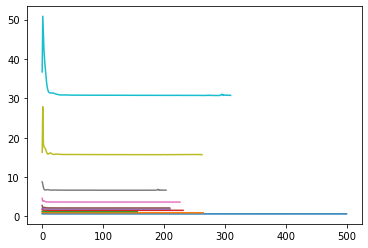

In [55]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=1, target=None,
                                     model_type = 'MLP', must_propagate= [True, True, True, True, True],
                                     norm = 'col_uniform', patience=20, epochs=500, lr=1e-1, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

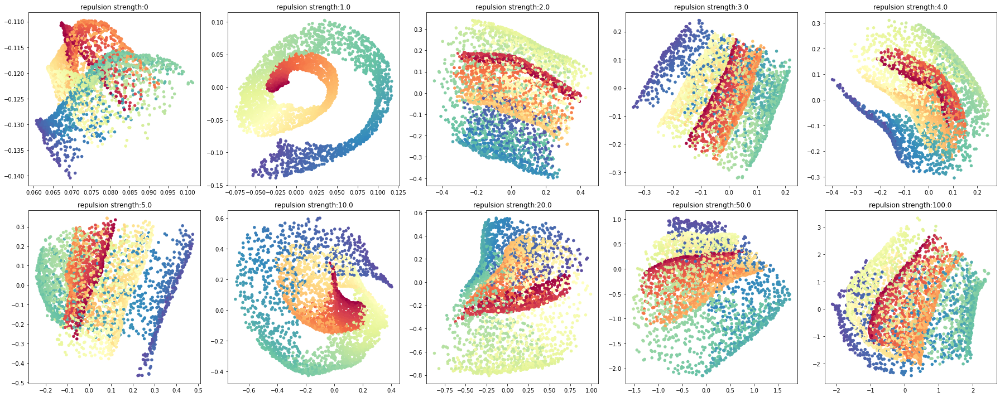

In [56]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

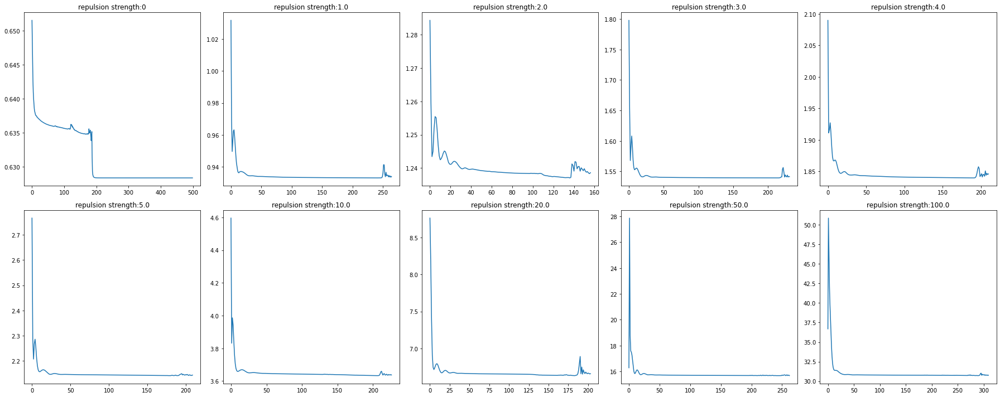

In [57]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7051, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7051, grad_fn=<AddBackward0>)
Epoch=000, loss=0.7051, time=0.0244
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7050, grad_fn=<AddBackward0>)
Epoch=001, loss=0.7050, time=0.0330
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7048, grad_fn=<AddBackward0>)
Epoch=002, loss=0.7048, time=0.0241
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7047, grad_fn=<AddBackward0>)
Epoch=003, loss=0.7047, time=0.0435
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.7046, grad_fn=<AddBackward0>)
Epoch=004, loss=0.7046, time=0.0308
loss poss tensor(0.7044, grad_fn=<

loss poss tensor(0.6995, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6995, grad_fn=<AddBackward0>)
Epoch=046, loss=0.6995, time=0.0265
loss poss tensor(0.6994, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6994, grad_fn=<AddBackward0>)
Epoch=047, loss=0.6994, time=0.0261
loss poss tensor(0.6994, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6994, grad_fn=<AddBackward0>)
Epoch=048, loss=0.6994, time=0.0249
loss poss tensor(0.6993, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6993, grad_fn=<AddBackward0>)
Epoch=049, loss=0.6993, time=0.0236
loss poss tensor(0.6993, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6993, grad_fn=<AddBackward0>)
Epoch=050, loss=0.6993, time=0.0232
loss poss tensor(0.6993, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

loss poss tensor(0.6986, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6986, grad_fn=<AddBackward0>)
Epoch=097, loss=0.6986, time=0.0348
loss poss tensor(0.6986, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6986, grad_fn=<AddBackward0>)
Epoch=098, loss=0.6986, time=0.0309
loss poss tensor(0.6985, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6985, grad_fn=<AddBackward0>)
Epoch=099, loss=0.6985, time=0.0335
loss poss tensor(0.6985, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6985, grad_fn=<AddBackward0>)
Epoch=100, loss=0.6985, time=0.0326
loss poss tensor(0.6985, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6985, grad_fn=<AddBackward0>)
Epoch=101, loss=0.6985, time=0.0307
loss poss tensor(0.6984, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=147, loss=0.6948, time=0.0317
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=148, loss=0.6948, time=0.0318
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=149, loss=0.6948, time=0.0317
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=150, loss=0.6948, time=0.0263
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=151, loss=0.6948, time=0.0279
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss f

Epoch=193, loss=0.6948, time=0.0265
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=194, loss=0.6948, time=0.0280
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=195, loss=0.6948, time=0.0253
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=196, loss=0.6948, time=0.0261
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=197, loss=0.6948, time=0.0236
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor(-0., grad_fn=<NegBackward0>)
loss final tensor(0.6948, grad_fn=<AddBackward0>)
Epoch=198, loss=0.6948, time=0.0251
loss poss tensor(0.6948, grad_fn=<NegBackward0>)
loss neg tensor

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.4721, grad_fn=<NegBackward0>)
loss final tensor(1.1723, grad_fn=<AddBackward0>)
Epoch=000, loss=1.1723, time=0.0342
loss poss tensor(0.7025, grad_fn=<NegBackward0>)
loss neg tensor(0.4344, grad_fn=<NegBackward0>)
loss final tensor(1.1369, grad_fn=<AddBackward0>)
Epoch=001, loss=1.1369, time=0.0382
loss poss tensor(0.7101, grad_fn=<NegBackward0>)
loss neg tensor(0.3787, grad_fn=<NegBackward0>)
loss final tensor(1.0887, grad_fn=<AddBackward0>)
Epoch=002, loss=1.0887, time=0.0483
loss poss tensor(0.7098, grad_fn=<NegBackward0>)
loss neg tensor(0.3301, grad_fn=<NegBackward0>)
loss final tensor(1.0398, grad_fn=<AddBackward0>)
Epoch=003, loss=1.0398, time=0.0717
loss poss tensor(0.7096, grad_fn=<NegBackward0>)
loss neg tensor(0.3132, grad_fn=<NegBackward0>)
loss final tensor(1.0228, grad_fn=<AddBackward0>)
Epoch=004, loss=1.0228, time=0.0796
loss poss tensor(0.

loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(0.3025, grad_fn=<NegBackward0>)
loss final tensor(1.0061, grad_fn=<AddBackward0>)
Epoch=046, loss=1.0061, time=0.0259
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0061, grad_fn=<AddBackward0>)
Epoch=047, loss=1.0061, time=0.0254
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(0.3024, grad_fn=<NegBackward0>)
loss final tensor(1.0060, grad_fn=<AddBackward0>)
Epoch=048, loss=1.0060, time=0.0667
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(0.3023, grad_fn=<NegBackward0>)
loss final tensor(1.0060, grad_fn=<AddBackward0>)
Epoch=049, loss=1.0060, time=0.0329
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(0.3022, grad_fn=<NegBackward0>)
loss final tensor(1.0059, grad_fn=<AddBackward0>)
Epoch=050, loss=1.0059, time=0.0310
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(0.3022, grad_fn=<Neg

loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(0.3019, grad_fn=<NegBackward0>)
loss final tensor(1.0050, grad_fn=<AddBackward0>)
Epoch=094, loss=1.0050, time=0.0337
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(0.3019, grad_fn=<NegBackward0>)
loss final tensor(1.0050, grad_fn=<AddBackward0>)
Epoch=095, loss=1.0050, time=0.0261
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(0.3019, grad_fn=<NegBackward0>)
loss final tensor(1.0050, grad_fn=<AddBackward0>)
Epoch=096, loss=1.0050, time=0.0304
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(0.3018, grad_fn=<NegBackward0>)
loss final tensor(1.0050, grad_fn=<AddBackward0>)
Epoch=097, loss=1.0050, time=0.0285
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(0.3018, grad_fn=<NegBackward0>)
loss final tensor(1.0050, grad_fn=<AddBackward0>)
Epoch=098, loss=1.0050, time=0.0251
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(0.3018, grad_fn=<Neg

Epoch=141, loss=1.0045, time=0.0254
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(0.3016, grad_fn=<NegBackward0>)
loss final tensor(1.0045, grad_fn=<AddBackward0>)
Epoch=142, loss=1.0045, time=0.0305
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(0.3016, grad_fn=<NegBackward0>)
loss final tensor(1.0045, grad_fn=<AddBackward0>)
Epoch=143, loss=1.0045, time=0.0253
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(0.3016, grad_fn=<NegBackward0>)
loss final tensor(1.0044, grad_fn=<AddBackward0>)
Epoch=144, loss=1.0044, time=0.0243
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(0.3016, grad_fn=<NegBackward0>)
loss final tensor(1.0044, grad_fn=<AddBackward0>)
Epoch=145, loss=1.0044, time=0.0267
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(0.3016, grad_fn=<NegBackward0>)
loss final tensor(1.0044, grad_fn=<AddBackward0>)
Epoch=146, loss=1.0044, time=0.0308
loss poss tensor(0.7028, grad_fn=<NegBackward0>)


loss neg tensor(0.3015, grad_fn=<NegBackward0>)
loss final tensor(1.0042, grad_fn=<AddBackward0>)
Epoch=191, loss=1.0042, time=0.0293
loss poss tensor(0.7026, grad_fn=<NegBackward0>)
loss neg tensor(0.3015, grad_fn=<NegBackward0>)
loss final tensor(1.0042, grad_fn=<AddBackward0>)
Epoch=192, loss=1.0042, time=0.0269
loss poss tensor(0.7026, grad_fn=<NegBackward0>)
loss neg tensor(0.3015, grad_fn=<NegBackward0>)
loss final tensor(1.0042, grad_fn=<AddBackward0>)
Epoch=193, loss=1.0042, time=0.0256
loss poss tensor(0.7026, grad_fn=<NegBackward0>)
loss neg tensor(0.3015, grad_fn=<NegBackward0>)
loss final tensor(1.0042, grad_fn=<AddBackward0>)
Epoch=194, loss=1.0042, time=0.0251
loss poss tensor(0.7026, grad_fn=<NegBackward0>)
loss neg tensor(0.3015, grad_fn=<NegBackward0>)
loss final tensor(1.0042, grad_fn=<AddBackward0>)
Epoch=195, loss=1.0042, time=0.0242
loss poss tensor(0.7026, grad_fn=<NegBackward0>)
loss neg tensor(0.3015, grad_fn=<NegBackward0>)
loss final tensor(1.0041, grad_fn=<Ad

Epoch=239, loss=1.0069, time=0.0373
loss poss tensor(0.7035, grad_fn=<NegBackward0>)
loss neg tensor(0.3038, grad_fn=<NegBackward0>)
loss final tensor(1.0073, grad_fn=<AddBackward0>)
Epoch=240, loss=1.0073, time=0.0300
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(0.3040, grad_fn=<NegBackward0>)
loss final tensor(1.0081, grad_fn=<AddBackward0>)
Epoch=241, loss=1.0081, time=0.1101
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(0.3029, grad_fn=<NegBackward0>)
loss final tensor(1.0061, grad_fn=<AddBackward0>)
Epoch=242, loss=1.0061, time=0.0233
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(0.3036, grad_fn=<NegBackward0>)
loss final tensor(1.0069, grad_fn=<AddBackward0>)
Epoch=243, loss=1.0069, time=0.0270
loss poss tensor(0.7032, grad_fn=<NegBackward0>)
loss neg tensor(0.3026, grad_fn=<NegBackward0>)
loss final tensor(1.0058, grad_fn=<AddBackward0>)
Epoch=244, loss=1.0058, time=0.0291
loss poss tensor(0.7028, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7070, grad_fn=<NegBackward0>)
loss neg tensor(0.6655, grad_fn=<NegBackward0>)
loss final tensor(1.3725, grad_fn=<AddBackward0>)
Epoch=000, loss=1.3725, time=0.0269
loss poss tensor(0.7057, grad_fn=<NegBackward0>)
loss neg tensor(0.6416, grad_fn=<NegBackward0>)
loss final tensor(1.3473, grad_fn=<AddBackward0>)
Epoch=001, loss=1.3473, time=0.0252
loss poss tensor(0.7062, grad_fn=<NegBackward0>)
loss neg tensor(0.6211, grad_fn=<NegBackward0>)
loss final tensor(1.3274, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3274, time=0.0244
loss poss tensor(0.7053, grad_fn=<NegBackward0>)
loss neg tensor(0.6123, grad_fn=<NegBackward0>)
loss final tensor(1.3176, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3176, time=0.0250
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(0.6115, grad_fn=<NegBackward0>)
loss final tensor(1.3158, grad_fn=<AddBackward0>)
Epoch=004, loss=1.3158, time=0.0265
loss poss tensor(0.

Epoch=046, loss=1.3037, time=0.0280
loss poss tensor(0.7008, grad_fn=<NegBackward0>)
loss neg tensor(0.6028, grad_fn=<NegBackward0>)
loss final tensor(1.3036, grad_fn=<AddBackward0>)
Epoch=047, loss=1.3036, time=0.0275
loss poss tensor(0.7008, grad_fn=<NegBackward0>)
loss neg tensor(0.6028, grad_fn=<NegBackward0>)
loss final tensor(1.3036, grad_fn=<AddBackward0>)
Epoch=048, loss=1.3036, time=0.0225
loss poss tensor(0.7007, grad_fn=<NegBackward0>)
loss neg tensor(0.6028, grad_fn=<NegBackward0>)
loss final tensor(1.3035, grad_fn=<AddBackward0>)
Epoch=049, loss=1.3035, time=0.0279
loss poss tensor(0.7007, grad_fn=<NegBackward0>)
loss neg tensor(0.6028, grad_fn=<NegBackward0>)
loss final tensor(1.3035, grad_fn=<AddBackward0>)
Epoch=050, loss=1.3035, time=0.0253
loss poss tensor(0.7007, grad_fn=<NegBackward0>)
loss neg tensor(0.6027, grad_fn=<NegBackward0>)
loss final tensor(1.3034, grad_fn=<AddBackward0>)
Epoch=051, loss=1.3034, time=0.0240
loss poss tensor(0.7007, grad_fn=<NegBackward0>)


loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(0.6022, grad_fn=<NegBackward0>)
loss final tensor(1.3026, grad_fn=<AddBackward0>)
Epoch=092, loss=1.3026, time=0.0272
loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(0.6022, grad_fn=<NegBackward0>)
loss final tensor(1.3025, grad_fn=<AddBackward0>)
Epoch=093, loss=1.3025, time=0.0270
loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(0.6022, grad_fn=<NegBackward0>)
loss final tensor(1.3025, grad_fn=<AddBackward0>)
Epoch=094, loss=1.3025, time=0.0242
loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(0.6021, grad_fn=<NegBackward0>)
loss final tensor(1.3025, grad_fn=<AddBackward0>)
Epoch=095, loss=1.3025, time=0.0241
loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(0.6021, grad_fn=<NegBackward0>)
loss final tensor(1.3025, grad_fn=<AddBackward0>)
Epoch=096, loss=1.3025, time=0.0252
loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(0.6021, grad_fn=<Neg

Epoch=136, loss=1.3020, time=0.0277
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6018, grad_fn=<NegBackward0>)
loss final tensor(1.3020, grad_fn=<AddBackward0>)
Epoch=137, loss=1.3020, time=0.0237
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6018, grad_fn=<NegBackward0>)
loss final tensor(1.3020, grad_fn=<AddBackward0>)
Epoch=138, loss=1.3020, time=0.0242
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6018, grad_fn=<NegBackward0>)
loss final tensor(1.3020, grad_fn=<AddBackward0>)
Epoch=139, loss=1.3020, time=0.0258
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6018, grad_fn=<NegBackward0>)
loss final tensor(1.3020, grad_fn=<AddBackward0>)
Epoch=140, loss=1.3020, time=0.0237
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6018, grad_fn=<NegBackward0>)
loss final tensor(1.3020, grad_fn=<AddBackward0>)
Epoch=141, loss=1.3020, time=0.0239
loss poss tensor(0.7002, grad_fn=<NegBackward0>)


Epoch=183, loss=1.3017, time=0.0299
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6015, grad_fn=<NegBackward0>)
loss final tensor(1.3017, grad_fn=<AddBackward0>)
Epoch=184, loss=1.3017, time=0.0237
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6015, grad_fn=<NegBackward0>)
loss final tensor(1.3017, grad_fn=<AddBackward0>)
Epoch=185, loss=1.3017, time=0.0230
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6015, grad_fn=<NegBackward0>)
loss final tensor(1.3017, grad_fn=<AddBackward0>)
Epoch=186, loss=1.3017, time=0.0283
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6015, grad_fn=<NegBackward0>)
loss final tensor(1.3017, grad_fn=<AddBackward0>)
Epoch=187, loss=1.3017, time=0.0289
loss poss tensor(0.7002, grad_fn=<NegBackward0>)
loss neg tensor(0.6015, grad_fn=<NegBackward0>)
loss final tensor(1.3017, grad_fn=<AddBackward0>)
Epoch=188, loss=1.3017, time=0.0255
loss poss tensor(0.7002, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7025, grad_fn=<NegBackward0>)
loss neg tensor(1.2074, grad_fn=<NegBackward0>)
loss final tensor(1.9099, grad_fn=<AddBackward0>)
Epoch=000, loss=1.9099, time=0.0254
loss poss tensor(0.7138, grad_fn=<NegBackward0>)
loss neg tensor(1.0415, grad_fn=<NegBackward0>)
loss final tensor(1.7553, grad_fn=<AddBackward0>)
Epoch=001, loss=1.7553, time=0.0242
loss poss tensor(0.7134, grad_fn=<NegBackward0>)
loss neg tensor(0.9460, grad_fn=<NegBackward0>)
loss final tensor(1.6593, grad_fn=<AddBackward0>)
Epoch=002, loss=1.6593, time=0.0855
loss poss tensor(0.7069, grad_fn=<NegBackward0>)
loss neg tensor(0.9872, grad_fn=<NegBackward0>)
loss final tensor(1.6941, grad_fn=<AddBackward0>)
Epoch=003, loss=1.6941, time=0.0430
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(1.0078, grad_fn=<NegBackward0>)
loss final tensor(1.7134, grad_fn=<AddBackward0>)
Epoch=004, loss=1.7134, time=0.0239
loss poss tensor(0.

Epoch=047, loss=1.6092, time=0.0319
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(0.9040, grad_fn=<NegBackward0>)
loss final tensor(1.6091, grad_fn=<AddBackward0>)
Epoch=048, loss=1.6091, time=0.0247
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(0.9039, grad_fn=<NegBackward0>)
loss final tensor(1.6089, grad_fn=<AddBackward0>)
Epoch=049, loss=1.6089, time=0.0235
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(0.9038, grad_fn=<NegBackward0>)
loss final tensor(1.6087, grad_fn=<AddBackward0>)
Epoch=050, loss=1.6087, time=0.0261
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(0.9037, grad_fn=<NegBackward0>)
loss final tensor(1.6086, grad_fn=<AddBackward0>)
Epoch=051, loss=1.6086, time=0.0242
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(0.9037, grad_fn=<NegBackward0>)
loss final tensor(1.6085, grad_fn=<AddBackward0>)
Epoch=052, loss=1.6085, time=0.0238
loss poss tensor(0.7048, grad_fn=<NegBackward0>)


Epoch=093, loss=1.6077, time=0.0250
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(0.9032, grad_fn=<NegBackward0>)
loss final tensor(1.6077, grad_fn=<AddBackward0>)
Epoch=094, loss=1.6077, time=0.0309
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(0.9032, grad_fn=<NegBackward0>)
loss final tensor(1.6077, grad_fn=<AddBackward0>)
Epoch=095, loss=1.6077, time=0.0279
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(0.9032, grad_fn=<NegBackward0>)
loss final tensor(1.6076, grad_fn=<AddBackward0>)
Epoch=096, loss=1.6076, time=0.0265
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(0.9032, grad_fn=<NegBackward0>)
loss final tensor(1.6076, grad_fn=<AddBackward0>)
Epoch=097, loss=1.6076, time=0.0289
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(0.9032, grad_fn=<NegBackward0>)
loss final tensor(1.6076, grad_fn=<AddBackward0>)
Epoch=098, loss=1.6076, time=0.0250
loss poss tensor(0.7044, grad_fn=<NegBackward0>)


loss poss tensor(0.7042, grad_fn=<NegBackward0>)
loss neg tensor(0.9026, grad_fn=<NegBackward0>)
loss final tensor(1.6068, grad_fn=<AddBackward0>)
Epoch=140, loss=1.6068, time=0.0343
loss poss tensor(0.7042, grad_fn=<NegBackward0>)
loss neg tensor(0.9026, grad_fn=<NegBackward0>)
loss final tensor(1.6067, grad_fn=<AddBackward0>)
Epoch=141, loss=1.6067, time=0.0264
loss poss tensor(0.7042, grad_fn=<NegBackward0>)
loss neg tensor(0.9026, grad_fn=<NegBackward0>)
loss final tensor(1.6067, grad_fn=<AddBackward0>)
Epoch=142, loss=1.6067, time=0.0237
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(0.9026, grad_fn=<NegBackward0>)
loss final tensor(1.6067, grad_fn=<AddBackward0>)
Epoch=143, loss=1.6067, time=0.0241
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(0.9026, grad_fn=<NegBackward0>)
loss final tensor(1.6067, grad_fn=<AddBackward0>)
Epoch=144, loss=1.6067, time=0.0287
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(0.9025, grad_fn=<Neg

Epoch=189, loss=1.6060, time=0.0236
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(0.9019, grad_fn=<NegBackward0>)
loss final tensor(1.6059, grad_fn=<AddBackward0>)
Epoch=190, loss=1.6059, time=0.0271
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(0.9019, grad_fn=<NegBackward0>)
loss final tensor(1.6060, grad_fn=<AddBackward0>)
Epoch=191, loss=1.6060, time=0.0238
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(0.9021, grad_fn=<NegBackward0>)
loss final tensor(1.6061, grad_fn=<AddBackward0>)
Epoch=192, loss=1.6061, time=0.0281
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(0.9020, grad_fn=<NegBackward0>)
loss final tensor(1.6060, grad_fn=<AddBackward0>)
Epoch=193, loss=1.6060, time=0.0282
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(0.9019, grad_fn=<NegBackward0>)
loss final tensor(1.6060, grad_fn=<AddBackward0>)
Epoch=194, loss=1.6060, time=0.0271
loss poss tensor(0.7040, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7053, grad_fn=<NegBackward0>)
loss neg tensor(1.4658, grad_fn=<NegBackward0>)
loss final tensor(2.1710, grad_fn=<AddBackward0>)
Epoch=000, loss=2.1710, time=0.0259
loss poss tensor(0.7033, grad_fn=<NegBackward0>)
loss neg tensor(1.3409, grad_fn=<NegBackward0>)
loss final tensor(2.0442, grad_fn=<AddBackward0>)
Epoch=001, loss=2.0442, time=0.0282
loss poss tensor(0.7021, grad_fn=<NegBackward0>)
loss neg tensor(1.2509, grad_fn=<NegBackward0>)
loss final tensor(1.9531, grad_fn=<AddBackward0>)
Epoch=002, loss=1.9531, time=0.0240
loss poss tensor(0.7030, grad_fn=<NegBackward0>)
loss neg tensor(1.2116, grad_fn=<NegBackward0>)
loss final tensor(1.9146, grad_fn=<AddBackward0>)
Epoch=003, loss=1.9146, time=0.0283
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(1.2173, grad_fn=<NegBackward0>)
loss final tensor(1.9213, grad_fn=<AddBackward0>)
Epoch=004, loss=1.9213, time=0.0263
loss poss tensor(0.

Epoch=047, loss=1.9048, time=0.0280
loss poss tensor(0.7005, grad_fn=<NegBackward0>)
loss neg tensor(1.2043, grad_fn=<NegBackward0>)
loss final tensor(1.9048, grad_fn=<AddBackward0>)
Epoch=048, loss=1.9048, time=0.0384
loss poss tensor(0.7005, grad_fn=<NegBackward0>)
loss neg tensor(1.2043, grad_fn=<NegBackward0>)
loss final tensor(1.9048, grad_fn=<AddBackward0>)
Epoch=049, loss=1.9048, time=0.0281
loss poss tensor(0.7005, grad_fn=<NegBackward0>)
loss neg tensor(1.2043, grad_fn=<NegBackward0>)
loss final tensor(1.9048, grad_fn=<AddBackward0>)
Epoch=050, loss=1.9048, time=0.0274
loss poss tensor(0.7005, grad_fn=<NegBackward0>)
loss neg tensor(1.2042, grad_fn=<NegBackward0>)
loss final tensor(1.9048, grad_fn=<AddBackward0>)
Epoch=051, loss=1.9048, time=0.0465
loss poss tensor(0.7005, grad_fn=<NegBackward0>)
loss neg tensor(1.2042, grad_fn=<NegBackward0>)
loss final tensor(1.9047, grad_fn=<AddBackward0>)
Epoch=052, loss=1.9047, time=0.0569
loss poss tensor(0.7005, grad_fn=<NegBackward0>)


Epoch=094, loss=1.9036, time=0.0789
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2030, grad_fn=<NegBackward0>)
loss final tensor(1.9036, grad_fn=<AddBackward0>)
Epoch=095, loss=1.9036, time=0.0409
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2029, grad_fn=<NegBackward0>)
loss final tensor(1.9036, grad_fn=<AddBackward0>)
Epoch=096, loss=1.9036, time=0.0282
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2029, grad_fn=<NegBackward0>)
loss final tensor(1.9035, grad_fn=<AddBackward0>)
Epoch=097, loss=1.9035, time=0.0239
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2029, grad_fn=<NegBackward0>)
loss final tensor(1.9035, grad_fn=<AddBackward0>)
Epoch=098, loss=1.9035, time=0.0305
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2028, grad_fn=<NegBackward0>)
loss final tensor(1.9035, grad_fn=<AddBackward0>)
Epoch=099, loss=1.9035, time=0.0299
loss poss tensor(0.7006, grad_fn=<NegBackward0>)


Epoch=140, loss=1.9018, time=0.0283
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2012, grad_fn=<NegBackward0>)
loss final tensor(1.9018, grad_fn=<AddBackward0>)
Epoch=141, loss=1.9018, time=0.0262
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2012, grad_fn=<NegBackward0>)
loss final tensor(1.9018, grad_fn=<AddBackward0>)
Epoch=142, loss=1.9018, time=0.0253
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2011, grad_fn=<NegBackward0>)
loss final tensor(1.9018, grad_fn=<AddBackward0>)
Epoch=143, loss=1.9018, time=0.0239
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2011, grad_fn=<NegBackward0>)
loss final tensor(1.9017, grad_fn=<AddBackward0>)
Epoch=144, loss=1.9017, time=0.0267
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2011, grad_fn=<NegBackward0>)
loss final tensor(1.9017, grad_fn=<AddBackward0>)
Epoch=145, loss=1.9017, time=0.0261
loss poss tensor(0.7007, grad_fn=<NegBackward0>)


Epoch=187, loss=1.9012, time=0.0338
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2006, grad_fn=<NegBackward0>)
loss final tensor(1.9012, grad_fn=<AddBackward0>)
Epoch=188, loss=1.9012, time=0.0323
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2006, grad_fn=<NegBackward0>)
loss final tensor(1.9012, grad_fn=<AddBackward0>)
Epoch=189, loss=1.9012, time=0.0292
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2006, grad_fn=<NegBackward0>)
loss final tensor(1.9012, grad_fn=<AddBackward0>)
Epoch=190, loss=1.9012, time=0.0323
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2006, grad_fn=<NegBackward0>)
loss final tensor(1.9012, grad_fn=<AddBackward0>)
Epoch=191, loss=1.9012, time=0.0316
loss poss tensor(0.7006, grad_fn=<NegBackward0>)
loss neg tensor(1.2006, grad_fn=<NegBackward0>)
loss final tensor(1.9012, grad_fn=<AddBackward0>)
Epoch=192, loss=1.9012, time=0.0276
loss poss tensor(0.7006, grad_fn=<NegBackward0>)


loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(1.2173, grad_fn=<NegBackward0>)
loss final tensor(1.9178, grad_fn=<AddBackward0>)
Epoch=235, loss=1.9178, time=0.0323
loss poss tensor(0.7004, grad_fn=<NegBackward0>)
loss neg tensor(1.2205, grad_fn=<NegBackward0>)
loss final tensor(1.9209, grad_fn=<AddBackward0>)
Epoch=236, loss=1.9209, time=0.0307
loss poss tensor(0.7005, grad_fn=<NegBackward0>)
loss neg tensor(1.2179, grad_fn=<NegBackward0>)
loss final tensor(1.9183, grad_fn=<AddBackward0>)
Epoch=237, loss=1.9183, time=0.0265
Early stopping at epoch 237!
Loading 217th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7125, grad_fn=<NegBackward0>)
loss neg tensor(1.9002, grad_fn=<NegBackward0>)
loss final tensor(2.6127, grad_fn=<AddBackward0>)
Epoch=000, loss=2.6127, time=0.0361
loss poss tensor(0.7199, grad_fn=<NegBackward0>)
loss neg tensor(1.5654, grad_fn=<NegBackward0>)
loss final tensor(2.2853, grad_fn=<AddBackward0>)
Epoch=001, loss=2.2853, time=0.0263
loss poss tensor(0.7122, grad_fn=<NegBackward0>)
loss neg tensor(1.7359, grad_fn=<NegBackward0>)
loss final tensor(2.4480, grad_fn=<AddBackward0>)
Epoch=002, loss=2.4480, time=0.0269
loss poss tensor(0.7134, grad_fn=<NegBackward0>)
loss neg tensor(1.6575, grad_fn=<NegBackward0>)
loss final tensor(2.3709, grad_fn=<AddBackward0>)
Epoch=003, loss=2.3709, time=0.0348
loss poss tensor(0.7132, grad_fn=<NegBackward0>)
loss neg tensor(1.5634, grad_fn=<NegBackward0>)
loss final tensor(2.2766, grad_fn=<AddBackward0>)
Epoch=004, loss=2.2766, time=0.0269
loss poss tensor(0.

loss poss tensor(0.7107, grad_fn=<NegBackward0>)
loss neg tensor(1.5062, grad_fn=<NegBackward0>)
loss final tensor(2.2169, grad_fn=<AddBackward0>)
Epoch=045, loss=2.2169, time=0.0271
loss poss tensor(0.7108, grad_fn=<NegBackward0>)
loss neg tensor(1.5055, grad_fn=<NegBackward0>)
loss final tensor(2.2163, grad_fn=<AddBackward0>)
Epoch=046, loss=2.2163, time=0.0375
loss poss tensor(0.7109, grad_fn=<NegBackward0>)
loss neg tensor(1.5050, grad_fn=<NegBackward0>)
loss final tensor(2.2159, grad_fn=<AddBackward0>)
Epoch=047, loss=2.2159, time=0.0231
loss poss tensor(0.7110, grad_fn=<NegBackward0>)
loss neg tensor(1.5049, grad_fn=<NegBackward0>)
loss final tensor(2.2158, grad_fn=<AddBackward0>)
Epoch=048, loss=2.2158, time=0.0228
loss poss tensor(0.7110, grad_fn=<NegBackward0>)
loss neg tensor(1.5049, grad_fn=<NegBackward0>)
loss final tensor(2.2159, grad_fn=<AddBackward0>)
Epoch=049, loss=2.2159, time=0.0242
loss poss tensor(0.7110, grad_fn=<NegBackward0>)
loss neg tensor(1.5048, grad_fn=<Neg

loss poss tensor(0.7096, grad_fn=<NegBackward0>)
loss neg tensor(1.5028, grad_fn=<NegBackward0>)
loss final tensor(2.2124, grad_fn=<AddBackward0>)
Epoch=091, loss=2.2124, time=0.0270
loss poss tensor(0.7096, grad_fn=<NegBackward0>)
loss neg tensor(1.5028, grad_fn=<NegBackward0>)
loss final tensor(2.2123, grad_fn=<AddBackward0>)
Epoch=092, loss=2.2123, time=0.0246
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.5028, grad_fn=<NegBackward0>)
loss final tensor(2.2123, grad_fn=<AddBackward0>)
Epoch=093, loss=2.2123, time=0.0282
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.5028, grad_fn=<NegBackward0>)
loss final tensor(2.2123, grad_fn=<AddBackward0>)
Epoch=094, loss=2.2123, time=0.0284
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.5027, grad_fn=<NegBackward0>)
loss final tensor(2.2122, grad_fn=<AddBackward0>)
Epoch=095, loss=2.2122, time=0.0260
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.5027, grad_fn=<Neg

Epoch=139, loss=2.2111, time=0.0267
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.5016, grad_fn=<NegBackward0>)
loss final tensor(2.2111, grad_fn=<AddBackward0>)
Epoch=140, loss=2.2111, time=0.0284
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.5016, grad_fn=<NegBackward0>)
loss final tensor(2.2111, grad_fn=<AddBackward0>)
Epoch=141, loss=2.2111, time=0.0271
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.5016, grad_fn=<NegBackward0>)
loss final tensor(2.2110, grad_fn=<AddBackward0>)
Epoch=142, loss=2.2110, time=0.0285
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.5015, grad_fn=<NegBackward0>)
loss final tensor(2.2110, grad_fn=<AddBackward0>)
Epoch=143, loss=2.2110, time=0.0572
loss poss tensor(0.7095, grad_fn=<NegBackward0>)
loss neg tensor(1.5015, grad_fn=<NegBackward0>)
loss final tensor(2.2110, grad_fn=<AddBackward0>)
Epoch=144, loss=2.2110, time=0.0301
loss poss tensor(0.7095, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7070, grad_fn=<NegBackward0>)
loss neg tensor(3.1550, grad_fn=<NegBackward0>)
loss final tensor(3.8621, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8621, time=0.0354
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(3.0501, grad_fn=<NegBackward0>)
loss final tensor(3.7549, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7549, time=0.0504
loss poss tensor(0.7049, grad_fn=<NegBackward0>)
loss neg tensor(3.0442, grad_fn=<NegBackward0>)
loss final tensor(3.7491, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7491, time=0.0351
loss poss tensor(0.7051, grad_fn=<NegBackward0>)
loss neg tensor(3.0622, grad_fn=<NegBackward0>)
loss final tensor(3.7673, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7673, time=0.0370
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(3.0750, grad_fn=<NegBackward0>)
loss final tensor(3.7805, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7805, time=0.0354
loss poss tensor(0.

loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(3.0181, grad_fn=<NegBackward0>)
loss final tensor(3.7209, grad_fn=<AddBackward0>)
Epoch=047, loss=3.7209, time=0.0283
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(3.0179, grad_fn=<NegBackward0>)
loss final tensor(3.7208, grad_fn=<AddBackward0>)
Epoch=048, loss=3.7208, time=0.0542
loss poss tensor(0.7029, grad_fn=<NegBackward0>)
loss neg tensor(3.0178, grad_fn=<NegBackward0>)
loss final tensor(3.7207, grad_fn=<AddBackward0>)
Epoch=049, loss=3.7207, time=0.0521
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(3.0177, grad_fn=<NegBackward0>)
loss final tensor(3.7206, grad_fn=<AddBackward0>)
Epoch=050, loss=3.7206, time=0.0386
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(3.0177, grad_fn=<NegBackward0>)
loss final tensor(3.7205, grad_fn=<AddBackward0>)
Epoch=051, loss=3.7205, time=0.0258
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(3.0176, grad_fn=<Neg

Epoch=092, loss=3.7186, time=0.0224
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(3.0158, grad_fn=<NegBackward0>)
loss final tensor(3.7186, grad_fn=<AddBackward0>)
Epoch=093, loss=3.7186, time=0.0221
loss poss tensor(0.7027, grad_fn=<NegBackward0>)
loss neg tensor(3.0158, grad_fn=<NegBackward0>)
loss final tensor(3.7186, grad_fn=<AddBackward0>)
Epoch=094, loss=3.7186, time=0.0221
loss poss tensor(0.7027, grad_fn=<NegBackward0>)
loss neg tensor(3.0158, grad_fn=<NegBackward0>)
loss final tensor(3.7185, grad_fn=<AddBackward0>)
Epoch=095, loss=3.7185, time=0.0221
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(3.0157, grad_fn=<NegBackward0>)
loss final tensor(3.7185, grad_fn=<AddBackward0>)
Epoch=096, loss=3.7185, time=0.0216
loss poss tensor(0.7028, grad_fn=<NegBackward0>)
loss neg tensor(3.0157, grad_fn=<NegBackward0>)
loss final tensor(3.7184, grad_fn=<AddBackward0>)
Epoch=097, loss=3.7184, time=0.0228
loss poss tensor(0.7028, grad_fn=<NegBackward0>)


loss poss tensor(0.7022, grad_fn=<NegBackward0>)
loss neg tensor(3.0192, grad_fn=<NegBackward0>)
loss final tensor(3.7214, grad_fn=<AddBackward0>)
Epoch=141, loss=3.7214, time=0.0220
loss poss tensor(0.7018, grad_fn=<NegBackward0>)
loss neg tensor(3.0281, grad_fn=<NegBackward0>)
loss final tensor(3.7299, grad_fn=<AddBackward0>)
Epoch=142, loss=3.7299, time=0.0232
loss poss tensor(0.7018, grad_fn=<NegBackward0>)
loss neg tensor(3.0160, grad_fn=<NegBackward0>)
loss final tensor(3.7178, grad_fn=<AddBackward0>)
Epoch=143, loss=3.7178, time=0.0226
loss poss tensor(0.7027, grad_fn=<NegBackward0>)
loss neg tensor(3.0219, grad_fn=<NegBackward0>)
loss final tensor(3.7246, grad_fn=<AddBackward0>)
Epoch=144, loss=3.7246, time=0.0239
loss poss tensor(0.7026, grad_fn=<NegBackward0>)
loss neg tensor(3.0192, grad_fn=<NegBackward0>)
loss final tensor(3.7218, grad_fn=<AddBackward0>)
Epoch=145, loss=3.7218, time=0.0373
loss poss tensor(0.7017, grad_fn=<NegBackward0>)
loss neg tensor(3.0159, grad_fn=<Neg

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7107, grad_fn=<NegBackward0>)
loss neg tensor(7.7899, grad_fn=<NegBackward0>)
loss final tensor(8.5007, grad_fn=<AddBackward0>)
Epoch=000, loss=8.5007, time=0.0220
loss poss tensor(0.7110, grad_fn=<NegBackward0>)
loss neg tensor(7.4508, grad_fn=<NegBackward0>)
loss final tensor(8.1618, grad_fn=<AddBackward0>)
Epoch=001, loss=8.1618, time=0.0237
loss poss tensor(0.7097, grad_fn=<NegBackward0>)
loss neg tensor(7.3863, grad_fn=<NegBackward0>)
loss final tensor(8.0960, grad_fn=<AddBackward0>)
Epoch=002, loss=8.0960, time=0.0224
loss poss tensor(0.7098, grad_fn=<NegBackward0>)
loss neg tensor(6.6795, grad_fn=<NegBackward0>)
loss final tensor(7.3893, grad_fn=<AddBackward0>)
Epoch=003, loss=7.3893, time=0.0244
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(6.4077, grad_fn=<NegBackward0>)
loss final tensor(7.1127, grad_fn=<AddBackward0>)
Epoch=004, loss=7.1127, time=0.0248
loss poss tensor(0.

Epoch=045, loss=6.7113, time=0.0233
loss poss tensor(0.7040, grad_fn=<NegBackward0>)
loss neg tensor(6.0062, grad_fn=<NegBackward0>)
loss final tensor(6.7102, grad_fn=<AddBackward0>)
Epoch=046, loss=6.7102, time=0.0215
loss poss tensor(0.7041, grad_fn=<NegBackward0>)
loss neg tensor(6.0054, grad_fn=<NegBackward0>)
loss final tensor(6.7095, grad_fn=<AddBackward0>)
Epoch=047, loss=6.7095, time=0.0214
loss poss tensor(0.7042, grad_fn=<NegBackward0>)
loss neg tensor(6.0051, grad_fn=<NegBackward0>)
loss final tensor(6.7093, grad_fn=<AddBackward0>)
Epoch=048, loss=6.7093, time=0.0215
loss poss tensor(0.7042, grad_fn=<NegBackward0>)
loss neg tensor(6.0052, grad_fn=<NegBackward0>)
loss final tensor(6.7094, grad_fn=<AddBackward0>)
Epoch=049, loss=6.7094, time=0.0208
loss poss tensor(0.7043, grad_fn=<NegBackward0>)
loss neg tensor(6.0052, grad_fn=<NegBackward0>)
loss final tensor(6.7095, grad_fn=<AddBackward0>)
Epoch=050, loss=6.7095, time=0.0225
loss poss tensor(0.7043, grad_fn=<NegBackward0>)


Epoch=093, loss=6.6982, time=0.0233
loss poss tensor(0.7036, grad_fn=<NegBackward0>)
loss neg tensor(5.9943, grad_fn=<NegBackward0>)
loss final tensor(6.6979, grad_fn=<AddBackward0>)
Epoch=094, loss=6.6979, time=0.0343
loss poss tensor(0.7036, grad_fn=<NegBackward0>)
loss neg tensor(5.9941, grad_fn=<NegBackward0>)
loss final tensor(6.6977, grad_fn=<AddBackward0>)
Epoch=095, loss=6.6977, time=0.0253
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(5.9937, grad_fn=<NegBackward0>)
loss final tensor(6.6974, grad_fn=<AddBackward0>)
Epoch=096, loss=6.6974, time=0.0321
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(5.9934, grad_fn=<NegBackward0>)
loss final tensor(6.6971, grad_fn=<AddBackward0>)
Epoch=097, loss=6.6971, time=0.0375
loss poss tensor(0.7037, grad_fn=<NegBackward0>)
loss neg tensor(5.9933, grad_fn=<NegBackward0>)
loss final tensor(6.6970, grad_fn=<AddBackward0>)
Epoch=098, loss=6.6970, time=0.0338
loss poss tensor(0.7037, grad_fn=<NegBackward0>)


loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(5.9854, grad_fn=<NegBackward0>)
loss final tensor(6.6900, grad_fn=<AddBackward0>)
Epoch=140, loss=6.6900, time=0.0236
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(5.9851, grad_fn=<NegBackward0>)
loss final tensor(6.6896, grad_fn=<AddBackward0>)
Epoch=141, loss=6.6896, time=0.0285
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(5.9855, grad_fn=<NegBackward0>)
loss final tensor(6.6899, grad_fn=<AddBackward0>)
Epoch=142, loss=6.6899, time=0.0222
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(5.9848, grad_fn=<NegBackward0>)
loss final tensor(6.6893, grad_fn=<AddBackward0>)
Epoch=143, loss=6.6893, time=0.0231
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(5.9849, grad_fn=<NegBackward0>)
loss final tensor(6.6895, grad_fn=<AddBackward0>)
Epoch=144, loss=6.6895, time=0.0226
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(5.9847, grad_fn=<Neg

Epoch=185, loss=6.6899, time=0.0550
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(5.9838, grad_fn=<NegBackward0>)
loss final tensor(6.6885, grad_fn=<AddBackward0>)
Epoch=186, loss=6.6885, time=0.1362
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(5.9860, grad_fn=<NegBackward0>)
loss final tensor(6.6906, grad_fn=<AddBackward0>)
Epoch=187, loss=6.6906, time=0.1746
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(5.9928, grad_fn=<NegBackward0>)
loss final tensor(6.6982, grad_fn=<AddBackward0>)
Epoch=188, loss=6.6982, time=0.0872
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(5.9948, grad_fn=<NegBackward0>)
loss final tensor(6.6996, grad_fn=<AddBackward0>)
Epoch=189, loss=6.6996, time=0.0891
loss poss tensor(0.7052, grad_fn=<NegBackward0>)
loss neg tensor(5.9903, grad_fn=<NegBackward0>)
loss final tensor(6.6955, grad_fn=<AddBackward0>)
Epoch=190, loss=6.6955, time=0.0627
loss poss tensor(0.7048, grad_fn=<NegBackward0>)


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7061, grad_fn=<NegBackward0>)
loss neg tensor(18.2210, grad_fn=<NegBackward0>)
loss final tensor(18.9272, grad_fn=<AddBackward0>)
Epoch=000, loss=18.9272, time=0.0676
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(29.5982, grad_fn=<NegBackward0>)
loss final tensor(30.2937, grad_fn=<AddBackward0>)
Epoch=001, loss=30.2937, time=0.0587
loss poss tensor(0.6973, grad_fn=<NegBackward0>)
loss neg tensor(24.5685, grad_fn=<NegBackward0>)
loss final tensor(25.2658, grad_fn=<AddBackward0>)
Epoch=002, loss=25.2658, time=0.0407
loss poss tensor(0.6997, grad_fn=<NegBackward0>)
loss neg tensor(22.1994, grad_fn=<NegBackward0>)
loss final tensor(22.8992, grad_fn=<AddBackward0>)
Epoch=003, loss=22.8992, time=0.0246
loss poss tensor(0.7018, grad_fn=<NegBackward0>)
loss neg tensor(20.9088, grad_fn=<NegBackward0>)
loss final tensor(21.6106, grad_fn=<AddBackward0>)
Epoch=004, loss=21.6106, time=0.0418
loss

Epoch=045, loss=15.8865, time=0.0437
loss poss tensor(0.7063, grad_fn=<NegBackward0>)
loss neg tensor(15.1478, grad_fn=<NegBackward0>)
loss final tensor(15.8541, grad_fn=<AddBackward0>)
Epoch=046, loss=15.8541, time=0.0356
loss poss tensor(0.7060, grad_fn=<NegBackward0>)
loss neg tensor(15.1175, grad_fn=<NegBackward0>)
loss final tensor(15.8235, grad_fn=<AddBackward0>)
Epoch=047, loss=15.8235, time=0.0442
loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(15.0911, grad_fn=<NegBackward0>)
loss final tensor(15.7970, grad_fn=<AddBackward0>)
Epoch=048, loss=15.7970, time=0.0378
loss poss tensor(0.7058, grad_fn=<NegBackward0>)
loss neg tensor(15.0691, grad_fn=<NegBackward0>)
loss final tensor(15.7749, grad_fn=<AddBackward0>)
Epoch=049, loss=15.7749, time=0.0354
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(15.0533, grad_fn=<NegBackward0>)
loss final tensor(15.7589, grad_fn=<AddBackward0>)
Epoch=050, loss=15.7589, time=0.0431
loss poss tensor(0.7055, grad_fn=

Epoch=090, loss=15.7246, time=0.0886
loss poss tensor(0.7054, grad_fn=<NegBackward0>)
loss neg tensor(15.0190, grad_fn=<NegBackward0>)
loss final tensor(15.7245, grad_fn=<AddBackward0>)
Epoch=091, loss=15.7245, time=0.0761
loss poss tensor(0.7054, grad_fn=<NegBackward0>)
loss neg tensor(15.0190, grad_fn=<NegBackward0>)
loss final tensor(15.7244, grad_fn=<AddBackward0>)
Epoch=092, loss=15.7244, time=0.0691
loss poss tensor(0.7054, grad_fn=<NegBackward0>)
loss neg tensor(15.0188, grad_fn=<NegBackward0>)
loss final tensor(15.7242, grad_fn=<AddBackward0>)
Epoch=093, loss=15.7242, time=0.0413
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(15.0184, grad_fn=<NegBackward0>)
loss final tensor(15.7239, grad_fn=<AddBackward0>)
Epoch=094, loss=15.7239, time=0.0453
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(15.0178, grad_fn=<NegBackward0>)
loss final tensor(15.7233, grad_fn=<AddBackward0>)
Epoch=095, loss=15.7233, time=0.0478
loss poss tensor(0.7055, grad_fn=

loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(15.0076, grad_fn=<NegBackward0>)
loss final tensor(15.7135, grad_fn=<AddBackward0>)
Epoch=136, loss=15.7135, time=0.0376
loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(15.0076, grad_fn=<NegBackward0>)
loss final tensor(15.7135, grad_fn=<AddBackward0>)
Epoch=137, loss=15.7135, time=0.0397
loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(15.0072, grad_fn=<NegBackward0>)
loss final tensor(15.7131, grad_fn=<AddBackward0>)
Epoch=138, loss=15.7131, time=0.0304
loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(15.0069, grad_fn=<NegBackward0>)
loss final tensor(15.7128, grad_fn=<AddBackward0>)
Epoch=139, loss=15.7128, time=0.0308
loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(15.0068, grad_fn=<NegBackward0>)
loss final tensor(15.7128, grad_fn=<AddBackward0>)
Epoch=140, loss=15.7128, time=0.0339
loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(15.00

Epoch=182, loss=15.7051, time=0.0486
loss poss tensor(0.7063, grad_fn=<NegBackward0>)
loss neg tensor(14.9987, grad_fn=<NegBackward0>)
loss final tensor(15.7050, grad_fn=<AddBackward0>)
Epoch=183, loss=15.7050, time=0.0396
loss poss tensor(0.7063, grad_fn=<NegBackward0>)
loss neg tensor(14.9986, grad_fn=<NegBackward0>)
loss final tensor(15.7049, grad_fn=<AddBackward0>)
Epoch=184, loss=15.7049, time=0.0343
loss poss tensor(0.7063, grad_fn=<NegBackward0>)
loss neg tensor(14.9985, grad_fn=<NegBackward0>)
loss final tensor(15.7048, grad_fn=<AddBackward0>)
Epoch=185, loss=15.7048, time=0.0359
loss poss tensor(0.7063, grad_fn=<NegBackward0>)
loss neg tensor(14.9984, grad_fn=<NegBackward0>)
loss final tensor(15.7047, grad_fn=<AddBackward0>)
Epoch=186, loss=15.7047, time=0.0293
loss poss tensor(0.7064, grad_fn=<NegBackward0>)
loss neg tensor(14.9982, grad_fn=<NegBackward0>)
loss final tensor(15.7046, grad_fn=<AddBackward0>)
Epoch=187, loss=15.7046, time=0.0399
loss poss tensor(0.7064, grad_fn=

loss poss tensor(0.7065, grad_fn=<NegBackward0>)
loss neg tensor(14.9898, grad_fn=<NegBackward0>)
loss final tensor(15.6963, grad_fn=<AddBackward0>)
Epoch=234, loss=15.6963, time=0.0506
loss poss tensor(0.7068, grad_fn=<NegBackward0>)
loss neg tensor(14.9897, grad_fn=<NegBackward0>)
loss final tensor(15.6965, grad_fn=<AddBackward0>)
Epoch=235, loss=15.6965, time=0.0301
loss poss tensor(0.7068, grad_fn=<NegBackward0>)
loss neg tensor(14.9893, grad_fn=<NegBackward0>)
loss final tensor(15.6961, grad_fn=<AddBackward0>)
Epoch=236, loss=15.6961, time=0.0278
loss poss tensor(0.7067, grad_fn=<NegBackward0>)
loss neg tensor(14.9891, grad_fn=<NegBackward0>)
loss final tensor(15.6958, grad_fn=<AddBackward0>)
Epoch=237, loss=15.6958, time=0.0326
loss poss tensor(0.7068, grad_fn=<NegBackward0>)
loss neg tensor(14.9887, grad_fn=<NegBackward0>)
loss final tensor(15.6956, grad_fn=<AddBackward0>)
Epoch=238, loss=15.6956, time=0.0285
loss poss tensor(0.7069, grad_fn=<NegBackward0>)
loss neg tensor(14.98

Epoch=282, loss=15.6886, time=0.0303
loss poss tensor(0.7065, grad_fn=<NegBackward0>)
loss neg tensor(14.9909, grad_fn=<NegBackward0>)
loss final tensor(15.6974, grad_fn=<AddBackward0>)
Epoch=283, loss=15.6974, time=0.0421
loss poss tensor(0.7062, grad_fn=<NegBackward0>)
loss neg tensor(14.9826, grad_fn=<NegBackward0>)
loss final tensor(15.6887, grad_fn=<AddBackward0>)
Epoch=284, loss=15.6887, time=0.0227
loss poss tensor(0.7054, grad_fn=<NegBackward0>)
loss neg tensor(14.9895, grad_fn=<NegBackward0>)
loss final tensor(15.6949, grad_fn=<AddBackward0>)
Epoch=285, loss=15.6949, time=0.0266
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(14.9826, grad_fn=<NegBackward0>)
loss final tensor(15.6881, grad_fn=<AddBackward0>)
Epoch=286, loss=15.6881, time=0.0230
loss poss tensor(0.7067, grad_fn=<NegBackward0>)
loss neg tensor(14.9873, grad_fn=<NegBackward0>)
loss final tensor(15.6940, grad_fn=<AddBackward0>)
Epoch=287, loss=15.6940, time=0.0290
loss poss tensor(0.7066, grad_fn=

loss neg tensor(14.9921, grad_fn=<NegBackward0>)
loss final tensor(15.6981, grad_fn=<AddBackward0>)
Epoch=332, loss=15.6981, time=0.0747
loss poss tensor(0.7059, grad_fn=<NegBackward0>)
loss neg tensor(14.9762, grad_fn=<NegBackward0>)
loss final tensor(15.6822, grad_fn=<AddBackward0>)
Epoch=333, loss=15.6822, time=0.0563
Early stopping at epoch 333!
Loading 313th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss poss tensor(0.7072, grad_fn=<NegBackward0>)
loss neg tensor(39.4530, grad_fn=<NegBackward0>)
loss final tensor(40.1603, grad_fn=<AddBackward0>)
Epoch=000, loss=40.1603, time=0.0273
loss poss tensor(0.6955, grad_fn=<NegBackward0>)
loss neg tensor(55.0858, grad_fn=<NegBackward0>)
loss final tensor(55.7813, grad_fn=<AddBackward0>)
Epoch=001, loss=55.7813, time=0.0319
loss poss tensor(0.6960, grad_fn=<NegBackward0>)
loss neg tensor(53.2659, grad_fn=<NegBackward0>)
loss final tensor(53.9619, grad_fn=<AddBackward0>)
Epoch=002, loss=53.9619, time=0.0294
loss poss tensor(0.6967, grad_fn=<NegBackward0>)
loss neg tensor(50.9246, grad_fn=<NegBackward0>)
loss final tensor(51.6213, grad_fn=<AddBackward0>)
Epoch=003, loss=51.6213, time=0.0265
loss poss tensor(0.6972, grad_fn=<NegBackward0>)
loss neg tensor(49.0540, grad_fn=<NegBackward0>)
loss final tensor(49.7512, grad_fn=<AddBackward0>)
Epoch=004, loss=49.7512, time=0.0328
loss

Epoch=047, loss=38.7030, time=0.0404
loss poss tensor(0.7089, grad_fn=<NegBackward0>)
loss neg tensor(37.9563, grad_fn=<NegBackward0>)
loss final tensor(38.6652, grad_fn=<AddBackward0>)
Epoch=048, loss=38.6652, time=0.0242
loss poss tensor(0.7088, grad_fn=<NegBackward0>)
loss neg tensor(37.9197, grad_fn=<NegBackward0>)
loss final tensor(38.6285, grad_fn=<AddBackward0>)
Epoch=049, loss=38.6285, time=0.0257
loss poss tensor(0.7087, grad_fn=<NegBackward0>)
loss neg tensor(37.8840, grad_fn=<NegBackward0>)
loss final tensor(38.5927, grad_fn=<AddBackward0>)
Epoch=050, loss=38.5927, time=0.0265
loss poss tensor(0.7086, grad_fn=<NegBackward0>)
loss neg tensor(37.8490, grad_fn=<NegBackward0>)
loss final tensor(38.5576, grad_fn=<AddBackward0>)
Epoch=051, loss=38.5576, time=0.0276
loss poss tensor(0.7085, grad_fn=<NegBackward0>)
loss neg tensor(37.8142, grad_fn=<NegBackward0>)
loss final tensor(38.5227, grad_fn=<AddBackward0>)
Epoch=052, loss=38.5227, time=0.0263
loss poss tensor(0.7084, grad_fn=

Epoch=093, loss=30.8700, time=0.0188
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(30.1757, grad_fn=<NegBackward0>)
loss final tensor(30.8802, grad_fn=<AddBackward0>)
Epoch=094, loss=30.8802, time=0.0231
loss poss tensor(0.7046, grad_fn=<NegBackward0>)
loss neg tensor(30.1940, grad_fn=<NegBackward0>)
loss final tensor(30.8986, grad_fn=<AddBackward0>)
Epoch=095, loss=30.8986, time=0.0200
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(30.2163, grad_fn=<NegBackward0>)
loss final tensor(30.9212, grad_fn=<AddBackward0>)
Epoch=096, loss=30.9212, time=0.0158
loss poss tensor(0.7050, grad_fn=<NegBackward0>)
loss neg tensor(30.2374, grad_fn=<NegBackward0>)
loss final tensor(30.9424, grad_fn=<AddBackward0>)
Epoch=097, loss=30.9424, time=0.0158
loss poss tensor(0.7052, grad_fn=<NegBackward0>)
loss neg tensor(30.2514, grad_fn=<NegBackward0>)
loss final tensor(30.9566, grad_fn=<AddBackward0>)
Epoch=098, loss=30.9566, time=0.0172
loss poss tensor(0.7053, grad_fn=

Epoch=141, loss=30.8068, time=0.0255
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(30.1024, grad_fn=<NegBackward0>)
loss final tensor(30.8068, grad_fn=<AddBackward0>)
Epoch=142, loss=30.8068, time=0.0227
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(30.1027, grad_fn=<NegBackward0>)
loss final tensor(30.8072, grad_fn=<AddBackward0>)
Epoch=143, loss=30.8072, time=0.0180
loss poss tensor(0.7045, grad_fn=<NegBackward0>)
loss neg tensor(30.1022, grad_fn=<NegBackward0>)
loss final tensor(30.8067, grad_fn=<AddBackward0>)
Epoch=144, loss=30.8067, time=0.0313
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(30.1015, grad_fn=<NegBackward0>)
loss final tensor(30.8060, grad_fn=<AddBackward0>)
Epoch=145, loss=30.8060, time=0.0306
loss poss tensor(0.7044, grad_fn=<NegBackward0>)
loss neg tensor(30.1009, grad_fn=<NegBackward0>)
loss final tensor(30.8053, grad_fn=<AddBackward0>)
Epoch=146, loss=30.8053, time=0.0218
loss poss tensor(0.7044, grad_fn=

Epoch=191, loss=30.7935, time=0.0240
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(30.0886, grad_fn=<NegBackward0>)
loss final tensor(30.7933, grad_fn=<AddBackward0>)
Epoch=192, loss=30.7933, time=0.0186
loss poss tensor(0.7047, grad_fn=<NegBackward0>)
loss neg tensor(30.0883, grad_fn=<NegBackward0>)
loss final tensor(30.7931, grad_fn=<AddBackward0>)
Epoch=193, loss=30.7931, time=0.0174
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(30.0880, grad_fn=<NegBackward0>)
loss final tensor(30.7928, grad_fn=<AddBackward0>)
Epoch=194, loss=30.7928, time=0.0171
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(30.0877, grad_fn=<NegBackward0>)
loss final tensor(30.7925, grad_fn=<AddBackward0>)
Epoch=195, loss=30.7925, time=0.0207
loss poss tensor(0.7048, grad_fn=<NegBackward0>)
loss neg tensor(30.0875, grad_fn=<NegBackward0>)
loss final tensor(30.7923, grad_fn=<AddBackward0>)
Epoch=196, loss=30.7923, time=0.0475
loss poss tensor(0.7048, grad_fn=

Epoch=244, loss=30.7809, time=0.0176
loss poss tensor(0.7053, grad_fn=<NegBackward0>)
loss neg tensor(30.0765, grad_fn=<NegBackward0>)
loss final tensor(30.7818, grad_fn=<AddBackward0>)
Epoch=245, loss=30.7818, time=0.0169
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(30.0793, grad_fn=<NegBackward0>)
loss final tensor(30.7849, grad_fn=<AddBackward0>)
Epoch=246, loss=30.7849, time=0.0160
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(30.0802, grad_fn=<NegBackward0>)
loss final tensor(30.7858, grad_fn=<AddBackward0>)
Epoch=247, loss=30.7858, time=0.0148
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(30.0766, grad_fn=<NegBackward0>)
loss final tensor(30.7822, grad_fn=<AddBackward0>)
Epoch=248, loss=30.7822, time=0.0152
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(30.0780, grad_fn=<NegBackward0>)
loss final tensor(30.7835, grad_fn=<AddBackward0>)
Epoch=249, loss=30.7835, time=0.0166
loss poss tensor(0.7055, grad_fn=

loss poss tensor(0.7058, grad_fn=<NegBackward0>)
loss neg tensor(30.0633, grad_fn=<NegBackward0>)
loss final tensor(30.7691, grad_fn=<AddBackward0>)
Epoch=289, loss=30.7691, time=0.0368
loss poss tensor(0.7056, grad_fn=<NegBackward0>)
loss neg tensor(30.0634, grad_fn=<NegBackward0>)
loss final tensor(30.7690, grad_fn=<AddBackward0>)
Epoch=290, loss=30.7690, time=0.0223
loss poss tensor(0.7054, grad_fn=<NegBackward0>)
loss neg tensor(30.0632, grad_fn=<NegBackward0>)
loss final tensor(30.7686, grad_fn=<AddBackward0>)
Epoch=291, loss=30.7686, time=0.0341
loss poss tensor(0.7054, grad_fn=<NegBackward0>)
loss neg tensor(30.0624, grad_fn=<NegBackward0>)
loss final tensor(30.7678, grad_fn=<AddBackward0>)
Epoch=292, loss=30.7678, time=0.0329
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(30.0624, grad_fn=<NegBackward0>)
loss final tensor(30.7680, grad_fn=<AddBackward0>)
Epoch=293, loss=30.7680, time=0.0343
loss poss tensor(0.7055, grad_fn=<NegBackward0>)
loss neg tensor(30.06

Epoch=333, loss=30.7576, time=0.0198
loss poss tensor(0.7063, grad_fn=<NegBackward0>)
loss neg tensor(30.0509, grad_fn=<NegBackward0>)
loss final tensor(30.7572, grad_fn=<AddBackward0>)
Epoch=334, loss=30.7572, time=0.0363
loss poss tensor(0.7062, grad_fn=<NegBackward0>)
loss neg tensor(30.0507, grad_fn=<NegBackward0>)
loss final tensor(30.7569, grad_fn=<AddBackward0>)
Epoch=335, loss=30.7569, time=0.0229
loss poss tensor(0.7062, grad_fn=<NegBackward0>)
loss neg tensor(30.0504, grad_fn=<NegBackward0>)
loss final tensor(30.7566, grad_fn=<AddBackward0>)
Epoch=336, loss=30.7566, time=0.0150
loss poss tensor(0.7063, grad_fn=<NegBackward0>)
loss neg tensor(30.0500, grad_fn=<NegBackward0>)
loss final tensor(30.7563, grad_fn=<AddBackward0>)
Epoch=337, loss=30.7563, time=0.0163
loss poss tensor(0.7063, grad_fn=<NegBackward0>)
loss neg tensor(30.0497, grad_fn=<NegBackward0>)
loss final tensor(30.7560, grad_fn=<AddBackward0>)
Epoch=338, loss=30.7560, time=0.0165
loss poss tensor(0.7063, grad_fn=

loss final tensor(30.7474, grad_fn=<AddBackward0>)
Epoch=388, loss=30.7474, time=0.0174
loss poss tensor(0.7062, grad_fn=<NegBackward0>)
loss neg tensor(30.0388, grad_fn=<NegBackward0>)
loss final tensor(30.7451, grad_fn=<AddBackward0>)
Epoch=389, loss=30.7451, time=0.0159
loss poss tensor(0.7066, grad_fn=<NegBackward0>)
loss neg tensor(30.0353, grad_fn=<NegBackward0>)
loss final tensor(30.7419, grad_fn=<AddBackward0>)
Epoch=390, loss=30.7419, time=0.0154
loss poss tensor(0.7068, grad_fn=<NegBackward0>)
loss neg tensor(30.0348, grad_fn=<NegBackward0>)
loss final tensor(30.7416, grad_fn=<AddBackward0>)
Epoch=391, loss=30.7416, time=0.0162
loss poss tensor(0.7070, grad_fn=<NegBackward0>)
loss neg tensor(30.0343, grad_fn=<NegBackward0>)
loss final tensor(30.7413, grad_fn=<AddBackward0>)
Epoch=392, loss=30.7413, time=0.0163
loss poss tensor(0.7070, grad_fn=<NegBackward0>)
loss neg tensor(30.0312, grad_fn=<NegBackward0>)
loss final tensor(30.7382, grad_fn=<AddBackward0>)
Epoch=393, loss=30.

Epoch=432, loss=30.7027, time=0.0249
loss poss tensor(0.7069, grad_fn=<NegBackward0>)
loss neg tensor(29.9961, grad_fn=<NegBackward0>)
loss final tensor(30.7030, grad_fn=<AddBackward0>)
Epoch=433, loss=30.7030, time=0.0216
loss poss tensor(0.7070, grad_fn=<NegBackward0>)
loss neg tensor(29.9943, grad_fn=<NegBackward0>)
loss final tensor(30.7013, grad_fn=<AddBackward0>)
Epoch=434, loss=30.7013, time=0.0242
loss poss tensor(0.7070, grad_fn=<NegBackward0>)
loss neg tensor(29.9939, grad_fn=<NegBackward0>)
loss final tensor(30.7009, grad_fn=<AddBackward0>)
Epoch=435, loss=30.7009, time=0.0183
loss poss tensor(0.7070, grad_fn=<NegBackward0>)
loss neg tensor(29.9940, grad_fn=<NegBackward0>)
loss final tensor(30.7010, grad_fn=<AddBackward0>)
Epoch=436, loss=30.7010, time=0.0231
loss poss tensor(0.7070, grad_fn=<NegBackward0>)
loss neg tensor(29.9925, grad_fn=<NegBackward0>)
loss final tensor(30.6995, grad_fn=<AddBackward0>)
Epoch=437, loss=30.6995, time=0.0165
loss poss tensor(0.7070, grad_fn=

loss poss tensor(0.7074, grad_fn=<NegBackward0>)
loss neg tensor(29.9795, grad_fn=<NegBackward0>)
loss final tensor(30.6868, grad_fn=<AddBackward0>)
Epoch=483, loss=30.6868, time=0.0189
loss poss tensor(0.7074, grad_fn=<NegBackward0>)
loss neg tensor(29.9794, grad_fn=<NegBackward0>)
loss final tensor(30.6868, grad_fn=<AddBackward0>)
Epoch=484, loss=30.6868, time=0.0268
loss poss tensor(0.7074, grad_fn=<NegBackward0>)
loss neg tensor(29.9793, grad_fn=<NegBackward0>)
loss final tensor(30.6867, grad_fn=<AddBackward0>)
Epoch=485, loss=30.6867, time=0.0187
loss poss tensor(0.7074, grad_fn=<NegBackward0>)
loss neg tensor(29.9793, grad_fn=<NegBackward0>)
loss final tensor(30.6866, grad_fn=<AddBackward0>)
Epoch=486, loss=30.6866, time=0.0171
loss poss tensor(0.7074, grad_fn=<NegBackward0>)
loss neg tensor(29.9792, grad_fn=<NegBackward0>)
loss final tensor(30.6866, grad_fn=<AddBackward0>)
Epoch=487, loss=30.6866, time=0.0204
loss poss tensor(0.7074, grad_fn=<NegBackward0>)
loss neg tensor(29.97

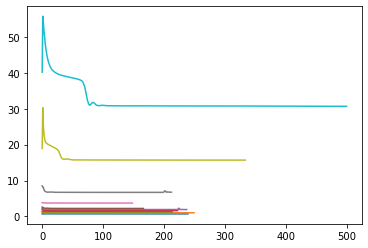

In [58]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=1, target=None,
                                  model_type = 'MLP', must_propagate= [True, True, True, True, True],
                                  norm = 'col_uniform', patience=20, epochs=500, lr=1e-1, wd=1e-2,
                                  min_dist=0.1, name_file="1", subsampling=None,
                                  spread = 1.0, repulsion_strength=repulsion_strength[i],
                                  device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

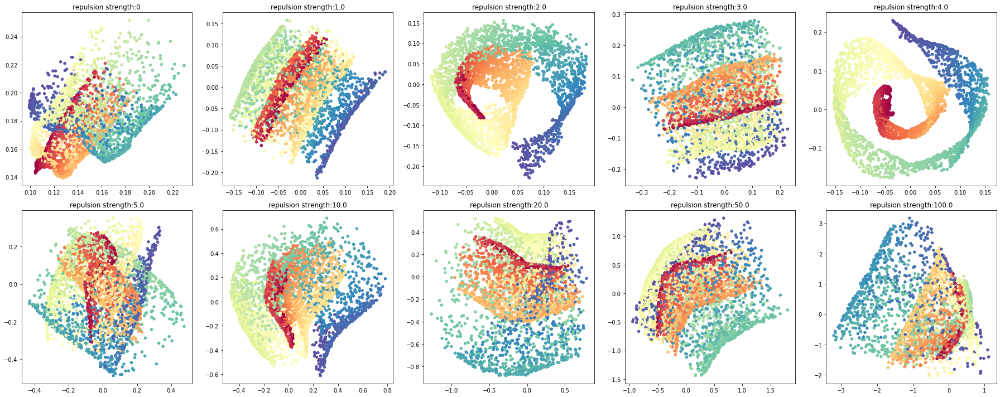

In [59]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

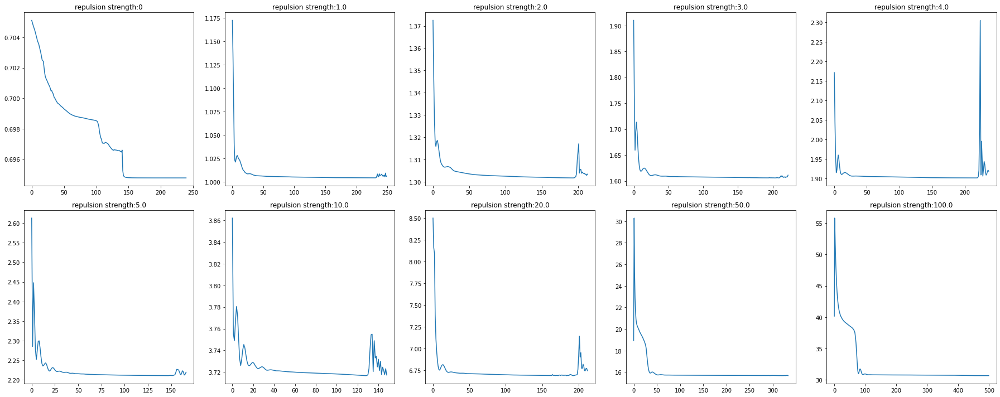

In [60]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()